In [1]:
# Standard Library Imports
import os
import re
import json
import random
import multiprocessing
import statistics
from typing import Any, Tuple

# Third-party Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from qiskit import QuantumCircuit, transpile,ClassicalRegister,QuantumRegister
from qiskit_ibm_runtime import QiskitRuntimeService, SamplerV2 as Sampler
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit_aer import QasmSimulator
from qiskit.visualization import plot_distribution
from IPython.display import display
from deap import creator, base, tools

import grape  # Grammatical evolution library
from grape import algorithms  # Evolutionary algorithms

In [ ]:
# Configure IBM Quantum Service
QiskitRuntimeService.save_account(
    token='IBM_QUANTUM_TOKEN_HERE', 
    overwrite=True,
    channel='ibm_cloud',
    instance='ibm_quantum_instance_id_here'
)

service = QiskitRuntimeService()  # Loads default account

backend = service.backend("ibm_torino")
backend_name = backend.name
print(f"✓ Connected to backend: {backend_name}")
print(f"✓ Saved accounts: {service.saved_accounts()}")

In [3]:
# Get the number of logical CPU cores available
num_cores = os.cpu_count()
print("Number of CPU cores available:", num_cores)

Number of CPU cores available: 10


In [4]:
BNF_GRAMMAR = grape.Grammar("grammars/grover.bnf")

In [5]:
# Define evaluation constants
NUM_SHOTS = 10000
SUCCESS_THRESHOLD = 0.48
GATE_PENALTY_WEIGHT = 0.02
TARGET_STATE = "111"

In [6]:
def generate_oracle_for_state(marked_state: str) -> str:
    """Generate Grover oracle code for a given marked state."""
    n = len(marked_state)
    code_lines = []
    # For each qubit where the marked state is '0', apply X gate.
    for i, bit in enumerate(marked_state):
        if bit == '0':
            code_lines.append(f"qc.x({i})")
    # Apply a multi-controlled phase flip (using Hadamard and mcx)
    code_lines.append(f"qc.h({n-1})")
    code_lines.append(f"qc.mcx(list(range({n-1})), {n-1})")
    code_lines.append(f"qc.h({n-1})")
    # Undo the X gates.
    for i, bit in enumerate(marked_state):
        if bit == '0':
            code_lines.append(f"qc.x({i})")
    return "\n".join(code_lines) + "\n"


In [7]:
class CircuitEvaluator:
    def __init__(self, shots: int = NUM_SHOTS, log_dir: str = None):
        """
        Initialize the evaluator with simulation parameters and logging directory.
        """
        self.shots = shots
        self.log_dir = log_dir
        if log_dir:
            os.makedirs(self.log_dir, exist_ok=True)
        os.makedirs(self.log_dir, exist_ok=True)
    
    def decode_individual(self, ind) -> str:
        """
        Decodes an individual's genome into a phenotype code string.
        Returns:
            A string containing the code if decoding is successful,
            or None if invalid.
        """
        if ind.invalid or not hasattr(ind, 'phenotype'):
            return None
        try:
            phenotype_code = ind.phenotype
            if isinstance(phenotype_code, list):
                phenotype_code = "".join(phenotype_code)
            # Replace literal \n with actual newlines and clean quotes
            cleaned_code = re.sub(r'\\n', '\n', phenotype_code)
            cleaned_code = re.sub(r'^"|"$', '', cleaned_code)
            cleaned_code = re.sub(r'"\s+"', '\n', cleaned_code)

            # Inject named registers for compatibility with Sampler V2
            cleaned_code = re.sub(
                r"qc\s*=\s*QuantumCircuit\(\s*3\s*,\s*3\s*\)",
                "qr = QuantumRegister(3, name='q')\ncr = ClassicalRegister(3, name='cr')\nqc = QuantumCircuit(qr, cr)",
                cleaned_code
            )
            return cleaned_code
        except Exception as ex:
            print(f"[Decode Error] {ex}")
            return None
    
    def execute_circuit(self, phenotype_code: str) -> QuantumCircuit:
        """
        Executes the phenotype code to produce a QuantumCircuit.
        Returns:
            The QuantumCircuit if 'qc' is found in the execution context,
            otherwise None.
        """
        local_vars = {}
        try:
            exec(phenotype_code, globals(), local_vars)
            if "qc" in local_vars:
                return local_vars["qc"]
            else:
                print("No circuit variable 'qc' found in phenotype code.")
                return None
        except Exception as e:
            print(f"Error executing phenotype code: {e}")
            return None
    
    def simulate_circuit(self, circuit: QuantumCircuit, marked_state: str) -> dict:
        """
        Simulates the circuit and returns performance metrics for the given marked state.
        
        Args:
            circuit (QuantumCircuit): The circuit to simulate.
            marked_state (str): The state to evaluate.
        
        Returns:
            dict: Contains counts, p_marked, error, gate_count, and depth.
        """
        simulator = QasmSimulator()
        compiled = transpile(circuit, simulator, optimization_level=0)
        result = simulator.run(compiled, shots=self.shots).result()
        counts = result.get_counts()
        # Reverse bitstrings to match the expected format.
        corrected = {k[::-1]: v for k, v in counts.items()}
        total = sum(corrected.values())
        p_marked = corrected.get(marked_state, 0) / total if total > 0 else 0.0
        error = 1 - p_marked
        return {
            "counts": corrected,
            "p_marked": p_marked,
            "error": error,
            "gate_count": compiled.size(),
            "depth": compiled.depth()
        }
    
    def log_evaluation(self, logs: list, generation: int, individual) -> None:
        """
        Logs the evaluation details for an individual to JSON and CSV files.
        """
        if not self.log_dir:
            return
        id_hash = hash(str(individual.genome)) % 10**8
        log_file_json = os.path.join(self.log_dir, f"eval_gen{generation}_id{id_hash}.json")
        log_file_csv = os.path.join(self.log_dir, f"eval_gen{generation}_id{id_hash}.csv")
        with open(log_file_json, "w") as f:
            json.dump(logs, f, indent=2)
        df = pd.DataFrame(logs)
        df[["state", "p_marked", "error", "gate_count", "depth"]].to_csv(log_file_csv, index=False)

In [8]:
def inject_oracle(phenotype_str: str, oracle_code: str) -> str:
    """Inject oracle code into the phenotype string."""
    pattern = r"(## Begin Oracle\n)(.*?)(## End Oracle\n)"
    new_block = r"\1" + oracle_code + r"\3"
    return re.sub(pattern, new_block, phenotype_str, flags=re.DOTALL)

In [9]:
# %%
def fitness_function_specialized_state_000(
    phenotype_str,
    shots=NUM_SHOTS,
    threshold=SUCCESS_THRESHOLD,
    gate_penalty_weight=GATE_PENALTY_WEIGHT,
    target_state=TARGET_STATE,
    log_states=True,
    log_dir=None  
):
    if not isinstance(phenotype_str, str):
        return (float('inf'), []) if log_states else float('inf')
        
    # Initialize Evaluator with the CORRECT directory
    evaluator = CircuitEvaluator(shots=shots, log_dir=log_dir)
    logs = []
    
    oracle_code = generate_oracle_for_state(target_state)
    modified_code = inject_oracle(phenotype_str, oracle_code)
    qc = evaluator.execute_circuit(modified_code)
    if qc is None:
        return (float('inf'), []) if log_states else float('inf')
    
    result = evaluator.simulate_circuit(qc, target_state)
    p_marked = result["p_marked"]
    error = 1 - p_marked
    miss = 1 if error > threshold else 0
    gate_count = result.get("gate_count", 0)
    
    fitness_score = 10 * miss + error + gate_penalty_weight * gate_count
    
    if log_states:
        logs.append({
            "state": target_state,
            "p_marked": p_marked,
            "error": error,
            "gate_count": gate_count,
            "oracle": oracle_code,
            "code": modified_code,
            "counts": result["counts"],
            "depth": result.get("depth", None)
        })
        return (fitness_score, logs)
    else:
        return fitness_score

In [10]:
POPULATION_SIZE    = 1000
MAX_GENERATIONS    = 100
N_GEN = 1
P_CROSSOVER        = 0.8     
P_MUTATION         = 0.01
ELITE_SIZE         = 1
HALLOFFAME_SIZE    = 1
CODON_SIZE         = 400
MAX_TREE_DEPTH     = 50      
TOURNAMENT_SIZE    = 5
MIN_INIT_DEPTH     = 20        
MAX_INIT_DEPTH     = 40       
CODON_CONSUMPTION  = "lazy"   
GENOME_REPRESENTATION = 'list'
REPORT_ITEMS = ['gen', 'invalid', 'avg', 'std', 'min', 'max',
                'fitness_test',
                'best_ind_length', 'avg_length',
                'best_ind_nodes', 'avg_nodes',
                'avg_depth',
                'avg_used_codons', 'best_ind_used_codons',
                'selection_time', 'generation_time']

## IBM Hardware Runner Function

In [20]:
def run_hof_on_ibm(evaluator, hof, target_state=TARGET_STATE):
    """Run Hall of Fame individuals on IBM hardware."""
    service = QiskitRuntimeService(channel="ibm_cloud")  # Changed from "ibm_quantum"
    backend = service.backend("ibm_torino")
    print(f"[QPU] Running on: {backend.name}")

    sampler = Sampler(mode=backend)
    sampler.options.default_shots = evaluator.shots

    for i, ind in enumerate(hof.items):
        print(f"\n[HOF Individual {i+1}] Fitness: {ind.fitness.values[0]}")

        pheno_code = evaluator.decode_individual(ind)
        pheno_code = re.sub(
            r"qc\s*=\s*QuantumCircuit\(\s*3\s*,\s*3\s*\)",
            "qr = QuantumRegister(3, name='q')\n"
            "cr = ClassicalRegister(3, name='cr')\n"
            "qc = QuantumCircuit(qr, cr)",
            pheno_code
        )

        qc = evaluator.execute_circuit(pheno_code)
        if qc is None:
            print(" Invalid circuit. Skipping.")
            continue

        pm = generate_preset_pass_manager(target=backend.target, optimization_level=3)
        circuit_isa = pm.run(qc)

        print("Evolved transpiled count_ops:", circuit_isa.count_ops())
        print("Evolved transpiled depth:   ", circuit_isa.depth())
        print("Total ops:       ", circuit_isa.size())
        print("Qubits / Clbits: ", circuit_isa.num_qubits, "/", circuit_isa.num_clbits)

        display(circuit_isa.draw(output="mpl", idle_wires=False))

        result = sampler.run([circuit_isa]).result()
        databins = result[0].data
        counts = databins["cr"].get_counts()
        counts = {k[::-1]: v for k, v in counts.items()}
        display(plot_distribution(counts, title=f"HOF #{i+1} on {backend.name}"))

### Independent Run Function

In [12]:
NUMBER_OF_RUNS = 5

In [13]:
def run_evolution_experiment(run_id, seed, target_state):
    """Runs a complete GE evolution for a specific seed and target state."""
    print(f"\n{'='*60}")
    print(f"RUN {run_id}/{NUMBER_OF_RUNS} | Target: {target_state} | Seed: {seed}")
    print(f"{'='*60}")
    
    # Organize logs by state, then by run
    state_dir = f"experiments_state_{target_state}"
    os.makedirs(state_dir, exist_ok=True)
    run_log_dir = os.path.join(state_dir, f"run_{run_id}_seed_{seed}")
    os.makedirs(run_log_dir, exist_ok=True)
    print(f"✓ Logging to: {run_log_dir}")
    
    random.seed(seed)
    np.random.seed(seed)
    
    # Force clean DEAP state
    for attr in ["FitnessMin", "Individual"]:
        if hasattr(creator, attr):
            delattr(creator, attr)
    
    creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
    creator.create("Individual", grape.Individual, fitness=creator.FitnessMin)

    toolbox = base.Toolbox()
    toolbox.register(
        "populationCreator",
        grape.sensible_initialisation,
        creator.Individual,
        bnf_grammar=BNF_GRAMMAR,
        min_init_depth=MIN_INIT_DEPTH,
        max_init_depth=MAX_INIT_DEPTH,
        codon_size=CODON_SIZE,
        codon_consumption=CODON_CONSUMPTION,
        genome_representation=GENOME_REPRESENTATION
    )
    toolbox.register("mate", grape.crossover_onepoint)
    toolbox.register("mutate", grape.mutation_int_flip_per_codon)
    toolbox.register("select", tools.selTournament, tournsize=TOURNAMENT_SIZE)
    
    # Create pool for this specific run
    pool = multiprocessing.Pool(num_cores)
    toolbox.register("map", pool.map)
    
    def evaluate_wrapper(individual, pts_train=None):
        evaluator = CircuitEvaluator(shots=NUM_SHOTS, log_dir=run_log_dir)
        phenotype_str = evaluator.decode_individual(individual)
        if not phenotype_str:
            return (float('inf'),)
        fitness_val = fitness_function_specialized_state_000(
            phenotype_str,
            shots=NUM_SHOTS,
            threshold=SUCCESS_THRESHOLD,
            gate_penalty_weight=GATE_PENALTY_WEIGHT,
            target_state=target_state,
            log_states=False,
            log_dir=run_log_dir
        )
        return (fitness_val,)

    toolbox.register("evaluate", evaluate_wrapper)

    # Initialize population
    population = toolbox.populationCreator(pop_size=POPULATION_SIZE)
    hof = tools.HallOfFame(1)
    stats = tools.Statistics(lambda ind: ind.fitness.values)
    stats.register("avg", np.mean)
    stats.register("std", np.std)
    stats.register("min", np.min)
    stats.register("max", np.max)
    
    evaluator = CircuitEvaluator(shots=NUM_SHOTS, log_dir=run_log_dir)
    
    # Track metrics over generations
    generations_list = []
    best_fitness_list = []
    best_fidelity_list = []
    best_gate_count_list = []
    best_depth_list = []
    
    # Manual evolution loop with progress display
    print(f"✓ Starting evolution (Population: {POPULATION_SIZE}, Generations: {MAX_GENERATIONS})")
    
    for gen in range(MAX_GENERATIONS):
        # Run one generation
        population, logbook = algorithms.ge_eaSimpleWithElitism(
            population,
            toolbox,
            cxpb=P_CROSSOVER,
            mutpb=P_MUTATION,
            ngen=N_GEN,  # Only 1 generation at a time
            elite_size=ELITE_SIZE,
            bnf_grammar=BNF_GRAMMAR,
            codon_size=CODON_SIZE,
            max_tree_depth=MAX_TREE_DEPTH,
            codon_consumption=CODON_CONSUMPTION,
            report_items=['gen', 'min', 'avg'],
            genome_representation=GENOME_REPRESENTATION,
            stats=stats,
            halloffame=hof,
            verbose=False
        )
        
        # DISPLAY BEST INDIVIDUAL OF THIS GENERATION
        best_ind = tools.selBest(population, 1)[0]
        best_ind.generation = gen
        
        best_phenotype = evaluator.decode_individual(best_ind)
        if best_phenotype is not None:
            fitness_val, logs = fitness_function_specialized_state_000(
                best_phenotype,
                shots=NUM_SHOTS,
                threshold=SUCCESS_THRESHOLD,
                gate_penalty_weight=GATE_PENALTY_WEIGHT,
                target_state=target_state,
                log_states=True,
                log_dir=run_log_dir
            )
            
            # TRACK METRICS (but don't log to disk yet)
            generations_list.append(gen)
            best_fitness_list.append(best_ind.fitness.values[0])
            best_fidelity_list.append(logs[0]['p_marked'])
            best_gate_count_list.append(logs[0]['gate_count'])
            best_depth_list.append(logs[0]['depth'])
            
            qc = evaluator.execute_circuit(best_phenotype)
            if qc:
                print(f"\n[Run {run_id} | Gen {gen}/{MAX_GENERATIONS-1}] Best Fitness: {best_ind.fitness.values[0]:.4f} | Fidelity: {logs[0]['p_marked']:.4f} | Gates: {logs[0]['gate_count']}")
                display(qc.draw("mpl"))
    
    # PLOT EVOLUTION METRICS
    print(f"\n{'='*60}")
    print(f"Generating evolution plots for Run {run_id}...")
    print(f"{'='*60}")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    
    # Fitness plot
    axes[0, 0].plot(generations_list, best_fitness_list, 'b-', linewidth=2)
    axes[0, 0].set_xlabel('Generation', fontsize=12)
    axes[0, 0].set_ylabel('Best Fitness (Lower is Better)', fontsize=12)
    axes[0, 0].set_title(f'Run {run_id}: Fitness Evolution', fontsize=14, fontweight='bold')
    axes[0, 0].grid(True, alpha=0.3)
    
    # Fidelity plot
    axes[0, 1].plot(generations_list, best_fidelity_list, 'g-', linewidth=2)
    axes[0, 1].set_xlabel('Generation', fontsize=12)
    axes[0, 1].set_ylabel('Fidelity', fontsize=12)
    axes[0, 1].set_title(f'Run {run_id}: Fidelity Evolution', fontsize=14, fontweight='bold')
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].set_ylim([0, 1.05])
    axes[0, 1].axhline(y=SUCCESS_THRESHOLD, color='r', linestyle='--', label=f'Threshold={SUCCESS_THRESHOLD}')
    axes[0, 1].legend()
    
    # Gate count plot
    axes[1, 0].plot(generations_list, best_gate_count_list, 'r-', linewidth=2)
    axes[1, 0].set_xlabel('Generation', fontsize=12)
    axes[1, 0].set_ylabel('Gate Count', fontsize=12)
    axes[1, 0].set_title(f'Run {run_id}: Gate Count Evolution', fontsize=14, fontweight='bold')
    axes[1, 0].grid(True, alpha=0.3)
    
    # Depth plot
    axes[1, 1].plot(generations_list, best_depth_list, 'm-', linewidth=2)
    axes[1, 1].set_xlabel('Generation', fontsize=12)
    axes[1, 1].set_ylabel('Circuit Depth', fontsize=12)
    axes[1, 1].set_title(f'Run {run_id}: Depth Evolution', fontsize=14, fontweight='bold')
    axes[1, 1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plot_path = os.path.join(run_log_dir, f'evolution_metrics_run_{run_id}.png')
    plt.savefig(plot_path, dpi=150, bbox_inches='tight')
    print(f"✓ Plot saved to: {plot_path}")
    display(fig)
    plt.close()
    
    # Close pool after evolution completes
    pool.close()
    pool.join()
    
    # Final evaluation
    best_ind = hof[0]
    phenotype = evaluator.decode_individual(best_ind)
    
    metrics_score, logs = fitness_function_specialized_state_000(
        phenotype,
        shots=NUM_SHOTS,
        threshold=SUCCESS_THRESHOLD,
        gate_penalty_weight=GATE_PENALTY_WEIGHT,
        target_state=target_state,
        log_states=True,
        log_dir=run_log_dir
    )
    
    best_metrics = logs[0]
    
    # LOG ONLY THE FINAL BEST CIRCUIT TO DISK
    evaluator.log_evaluation(logs, MAX_GENERATIONS-1, best_ind)
    
    print(f"\n{'='*60}")
    print(f"✓ Run {run_id} COMPLETE | Fidelity: {best_metrics['p_marked']:.4f} | Gates: {best_metrics['gate_count']} | Depth: {best_metrics['depth']}")
    print(f"{'='*60}\n")
    
    return {
        "run_id": run_id,
        "seed": seed,
        "log_dir": run_log_dir,
        "individual": best_ind,
        "phenotype": phenotype,
        "fidelity": best_metrics['p_marked'],
        "gate_count": best_metrics['gate_count'],
        "depth": best_metrics['depth'],
        "raw_fitness": best_ind.fitness.values[0],
        # Include evolution history for aggregate plotting
        "generations": generations_list,
        "fitness_history": best_fitness_list,
        "fidelity_history": best_fidelity_list,
        "gate_count_history": best_gate_count_list,
        "depth_history": best_depth_list
    }

### Execute 5 Independent Runs

Generated seeds: [90759, 74678, 75264, 57697, 98144]
✓ Seeds saved to experiment_seeds.json

Starting 5 independent runs for state |111>...

RUN 1/5 | Target: 111 | Seed: 90759
✓ Logging to: experiments_state_111/run_1_seed_90759
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (1.1024,)
gen = 1 , Best fitness = (1.1024,) , Number of invalids = 144

[Run 1 | Gen 0/99] Best Fitness: 1.1024 | Fidelity: 0.9602 | Gates: 53


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


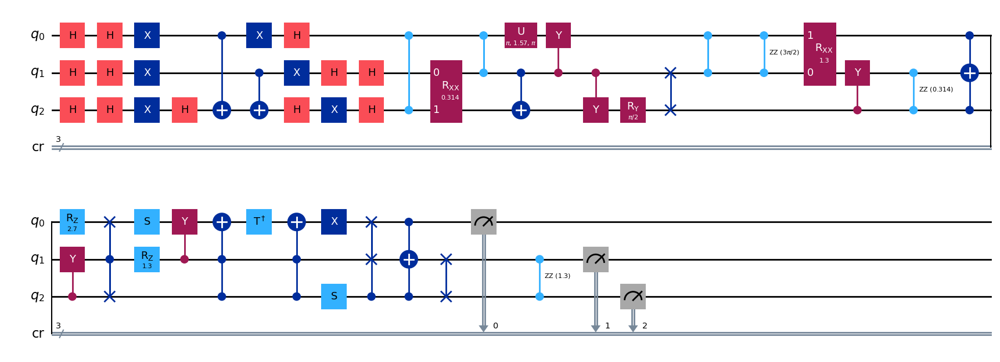

gen = 0 , Best fitness = (1.1024,)
gen = 1 , Best fitness = (1.0829,) , Number of invalids = 68

[Run 1 | Gen 1/99] Best Fitness: 1.0829 | Fidelity: 0.9564 | Gates: 52


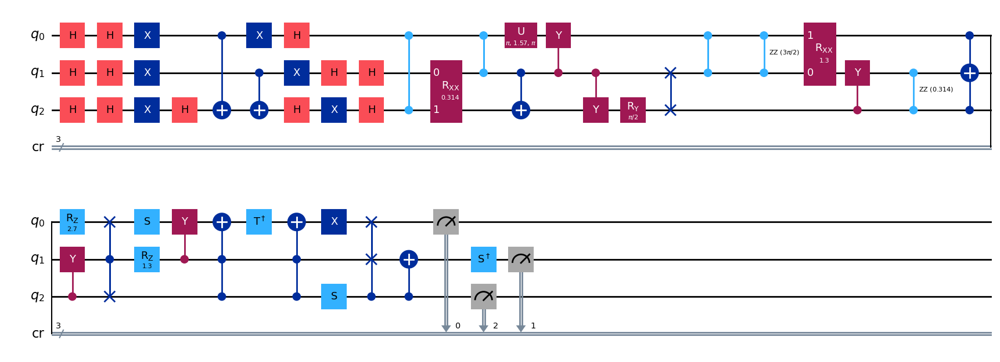

gen = 0 , Best fitness = (1.0829,)
gen = 1 , Best fitness = (1.0811000000000002,) , Number of invalids = 67

[Run 1 | Gen 2/99] Best Fitness: 1.0811 | Fidelity: 0.9577 | Gates: 52


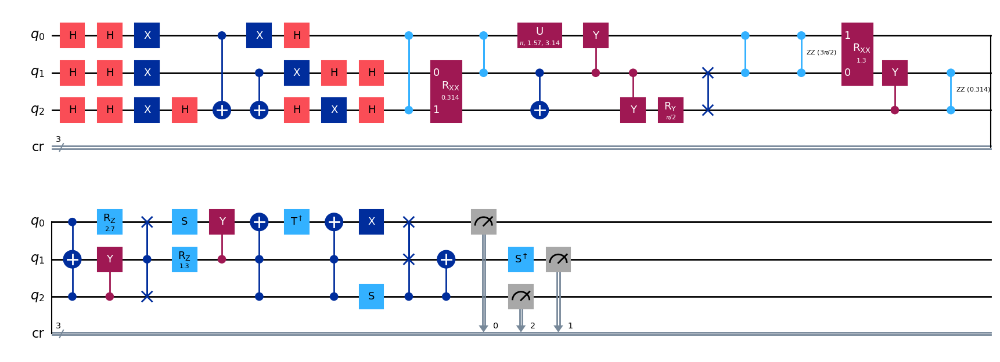

gen = 0 , Best fitness = (1.0811000000000002,)
gen = 1 , Best fitness = (1.0676999999999999,) , Number of invalids = 72

[Run 1 | Gen 3/99] Best Fitness: 1.0677 | Fidelity: 0.9126 | Gates: 49


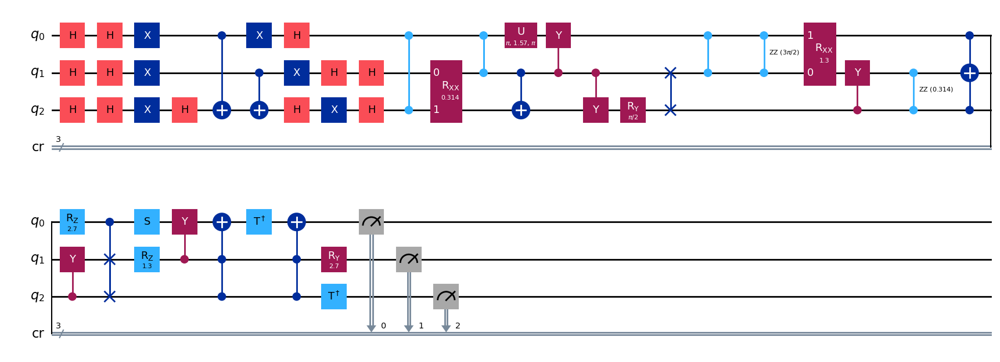

gen = 0 , Best fitness = (1.0676999999999999,)
gen = 1 , Best fitness = (1.0417,) , Number of invalids = 47

[Run 1 | Gen 4/99] Best Fitness: 1.0417 | Fidelity: 0.9590 | Gates: 50


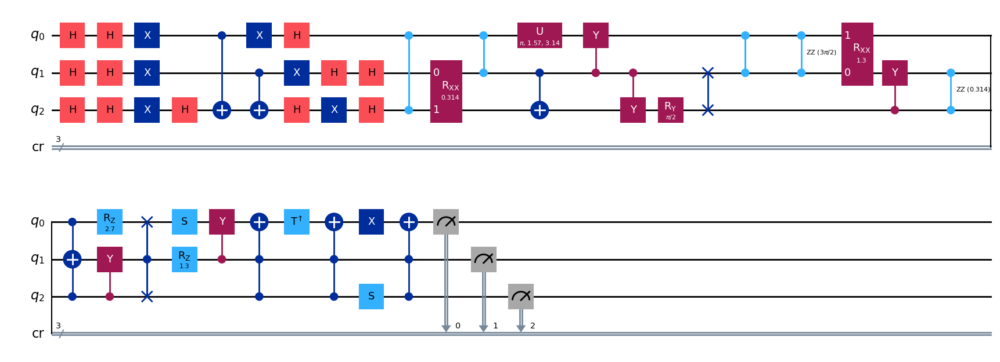

gen = 0 , Best fitness = (1.0417,)
gen = 1 , Best fitness = (0.9401,) , Number of invalids = 50

[Run 1 | Gen 5/99] Best Fitness: 0.9401 | Fidelity: 0.9549 | Gates: 45


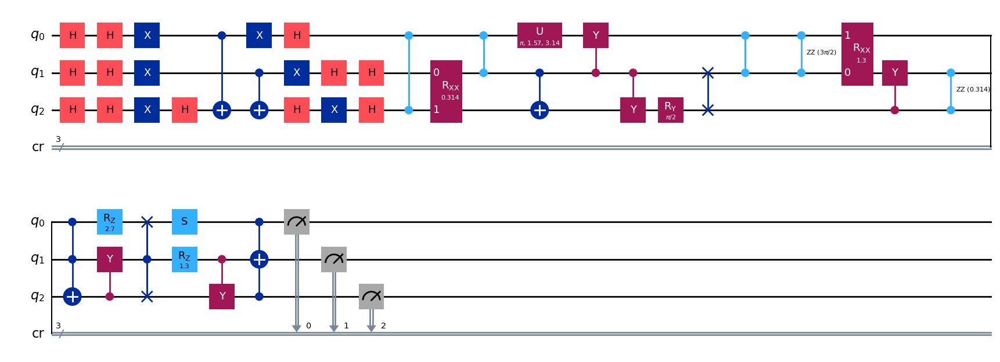

gen = 0 , Best fitness = (0.9401,)
gen = 1 , Best fitness = (0.8815999999999999,) , Number of invalids = 47

[Run 1 | Gen 6/99] Best Fitness: 0.8816 | Fidelity: 0.9586 | Gates: 42


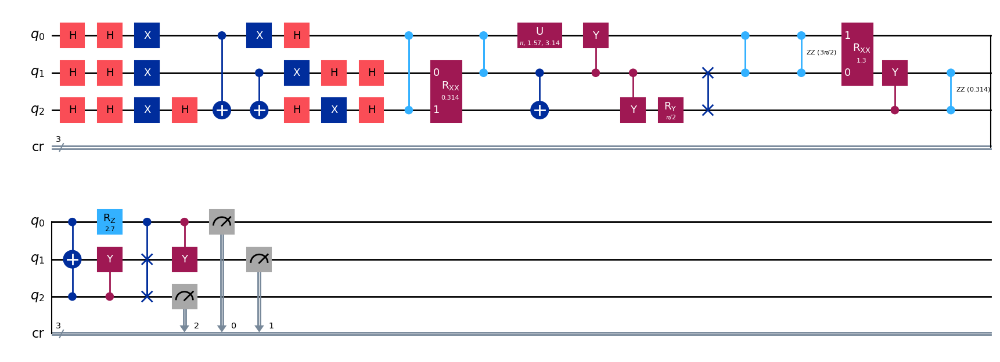

gen = 0 , Best fitness = (0.8815999999999999,)
gen = 1 , Best fitness = (0.8815999999999999,) , Number of invalids = 43

[Run 1 | Gen 7/99] Best Fitness: 0.8816 | Fidelity: 0.9543 | Gates: 42


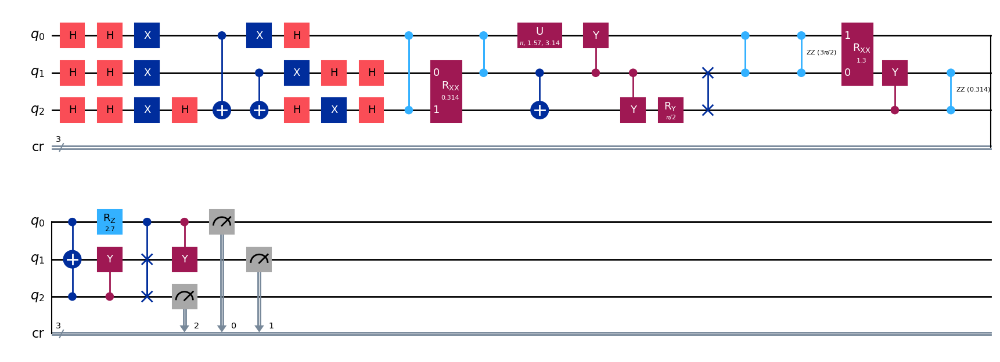

gen = 0 , Best fitness = (0.8815999999999999,)
gen = 1 , Best fitness = (0.8815999999999999,) , Number of invalids = 43

[Run 1 | Gen 8/99] Best Fitness: 0.8816 | Fidelity: 0.9590 | Gates: 42


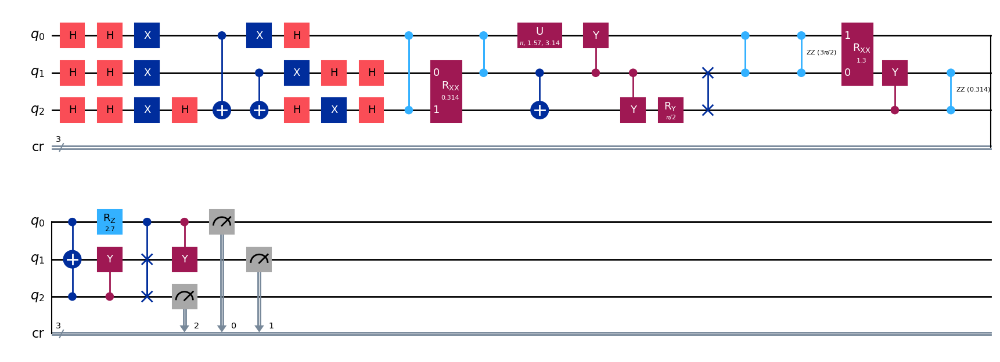

gen = 0 , Best fitness = (0.8815999999999999,)
gen = 1 , Best fitness = (0.783,) , Number of invalids = 46

[Run 1 | Gen 9/99] Best Fitness: 0.7830 | Fidelity: 0.9590 | Gates: 37


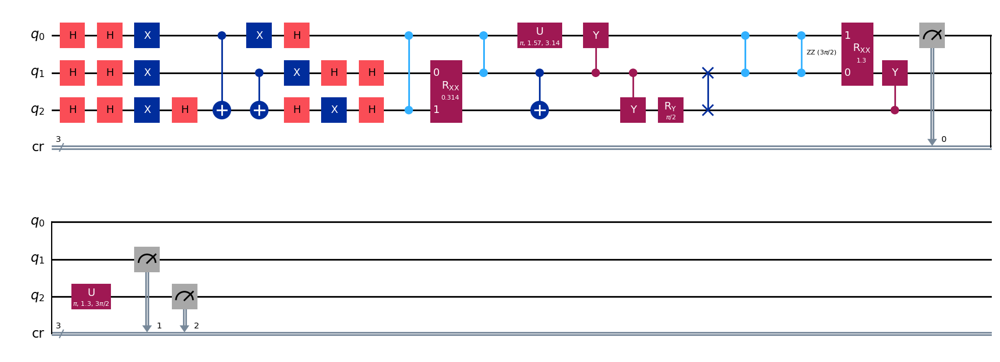

gen = 0 , Best fitness = (0.783,)
gen = 1 , Best fitness = (0.783,) , Number of invalids = 42

[Run 1 | Gen 10/99] Best Fitness: 0.7830 | Fidelity: 0.9570 | Gates: 37


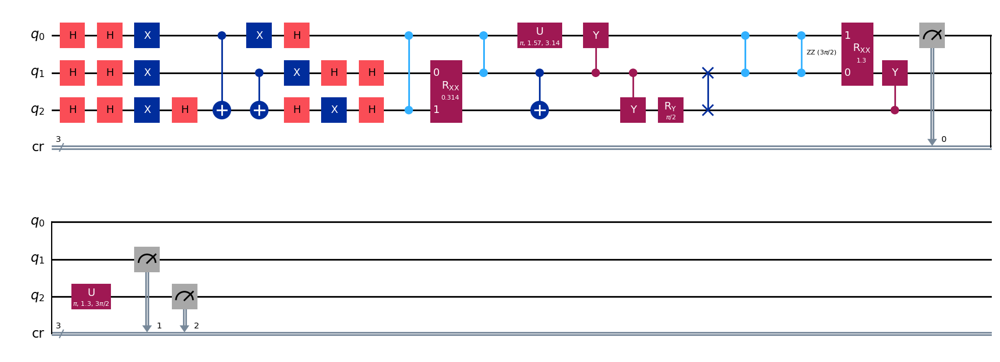

gen = 0 , Best fitness = (0.783,)
gen = 1 , Best fitness = (0.783,) , Number of invalids = 31

[Run 1 | Gen 11/99] Best Fitness: 0.7830 | Fidelity: 0.9616 | Gates: 37


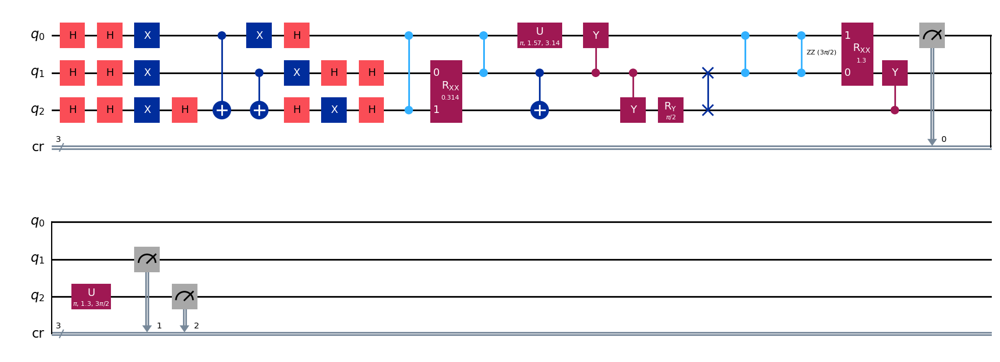

gen = 0 , Best fitness = (0.783,)
gen = 1 , Best fitness = (0.783,) , Number of invalids = 32

[Run 1 | Gen 12/99] Best Fitness: 0.7830 | Fidelity: 0.9601 | Gates: 37


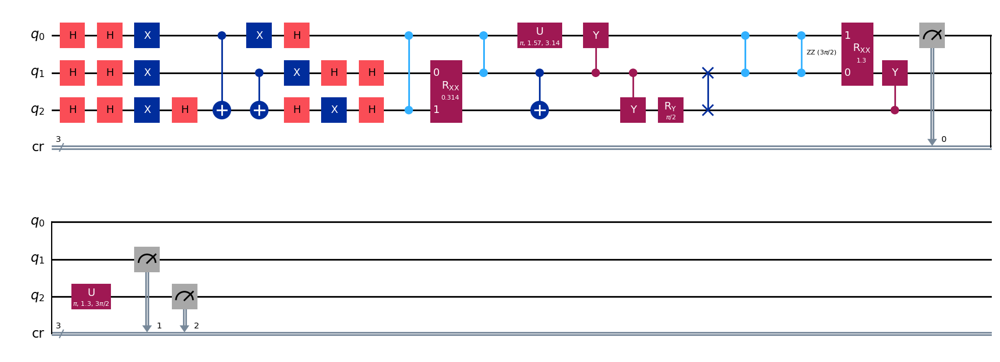

gen = 0 , Best fitness = (0.783,)
gen = 1 , Best fitness = (0.7827,) , Number of invalids = 38

[Run 1 | Gen 13/99] Best Fitness: 0.7827 | Fidelity: 0.9588 | Gates: 37


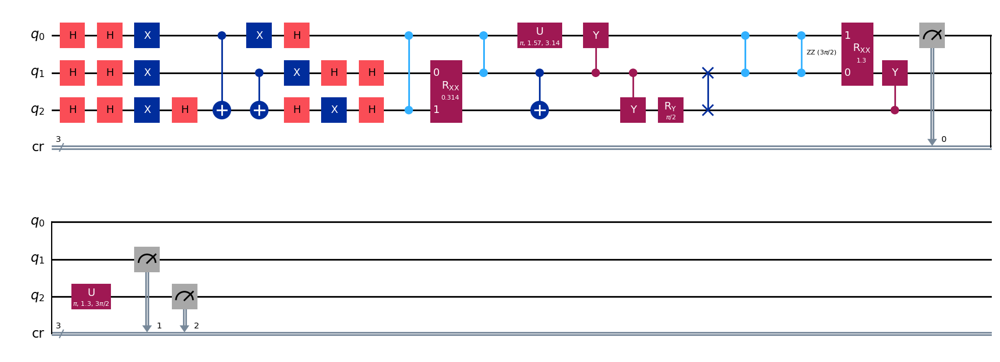

gen = 0 , Best fitness = (0.7827,)
gen = 1 , Best fitness = (0.7825,) , Number of invalids = 37

[Run 1 | Gen 14/99] Best Fitness: 0.7825 | Fidelity: 0.9605 | Gates: 37


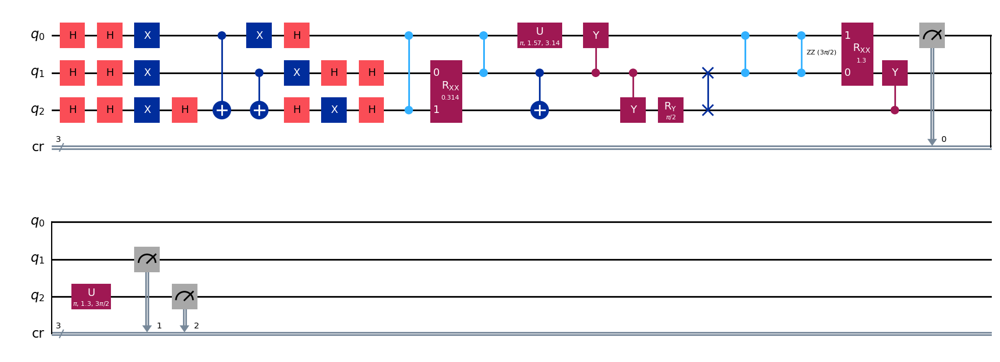

gen = 0 , Best fitness = (0.7825,)
gen = 1 , Best fitness = (0.7825,) , Number of invalids = 40

[Run 1 | Gen 15/99] Best Fitness: 0.7825 | Fidelity: 0.9560 | Gates: 37


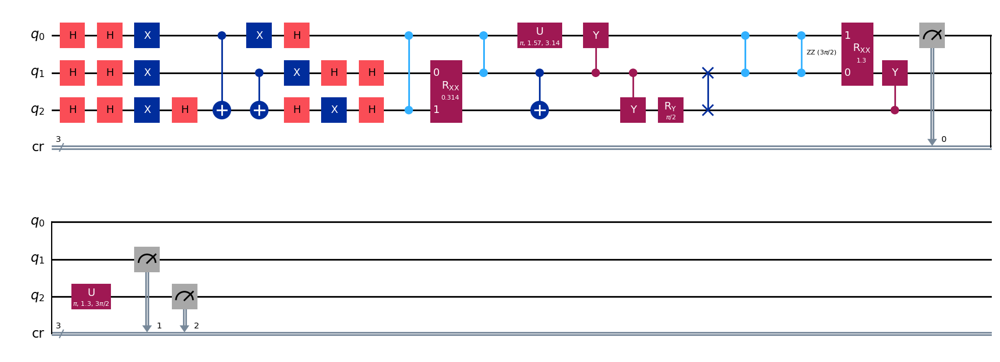

gen = 0 , Best fitness = (0.7825,)
gen = 1 , Best fitness = (0.7825,) , Number of invalids = 25

[Run 1 | Gen 16/99] Best Fitness: 0.7825 | Fidelity: 0.9617 | Gates: 37


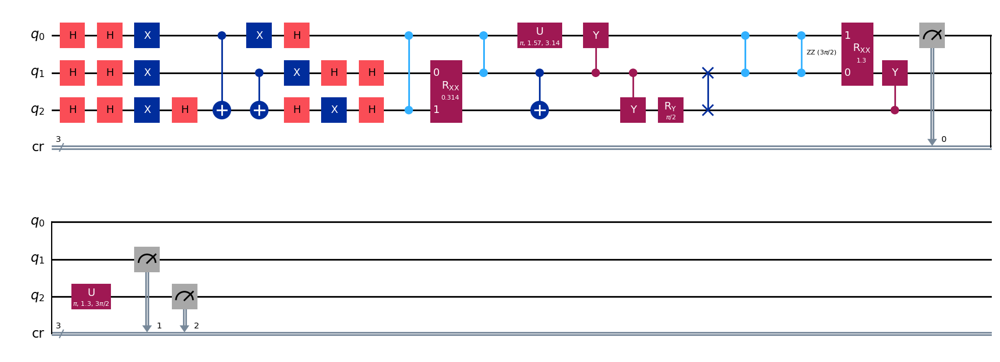

gen = 0 , Best fitness = (0.7825,)
gen = 1 , Best fitness = (0.7626,) , Number of invalids = 41

[Run 1 | Gen 17/99] Best Fitness: 0.7626 | Fidelity: 0.9567 | Gates: 36


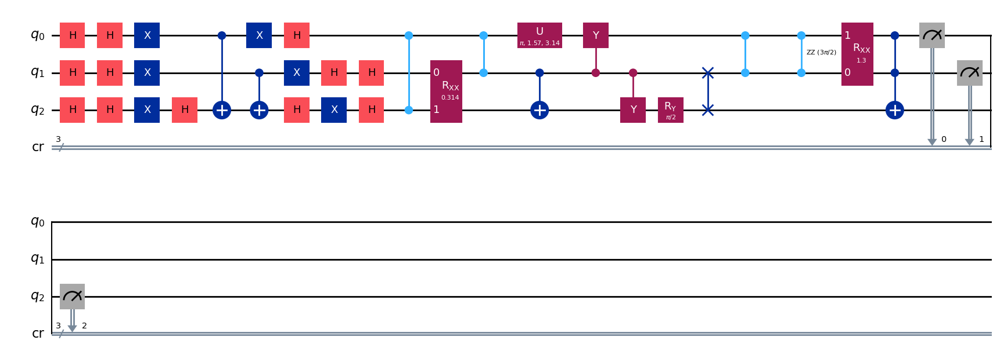

gen = 0 , Best fitness = (0.7626,)
gen = 1 , Best fitness = (0.7626,) , Number of invalids = 29

[Run 1 | Gen 18/99] Best Fitness: 0.7626 | Fidelity: 0.9582 | Gates: 36


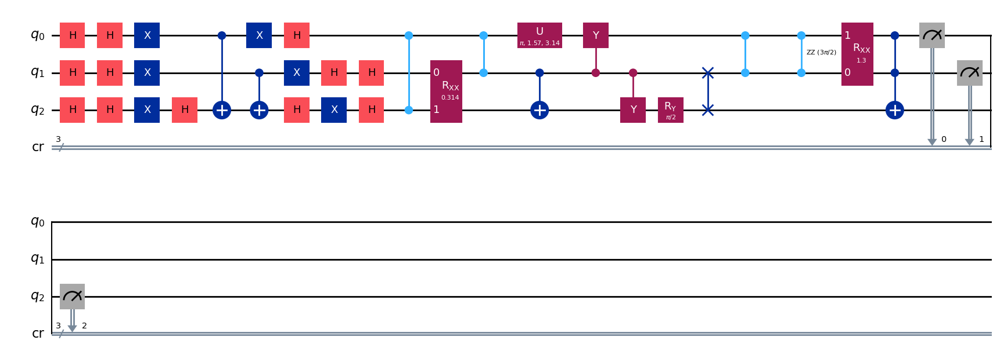

gen = 0 , Best fitness = (0.7626,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 38

[Run 1 | Gen 19/99] Best Fitness: 0.7598 | Fidelity: 0.9573 | Gates: 36


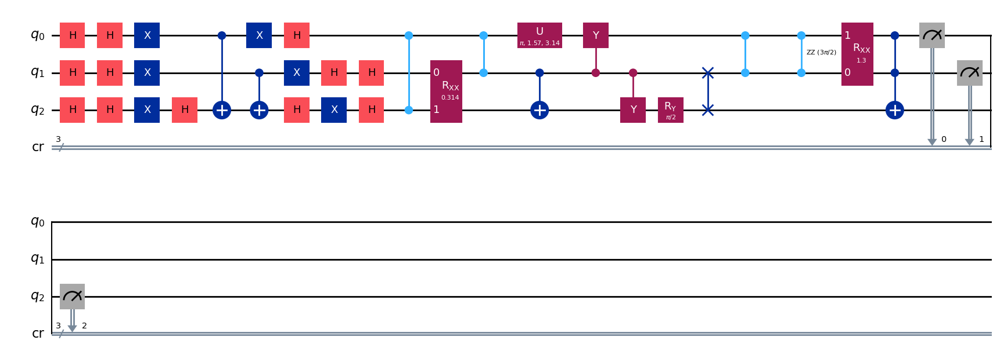

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 24

[Run 1 | Gen 20/99] Best Fitness: 0.7598 | Fidelity: 0.9590 | Gates: 36


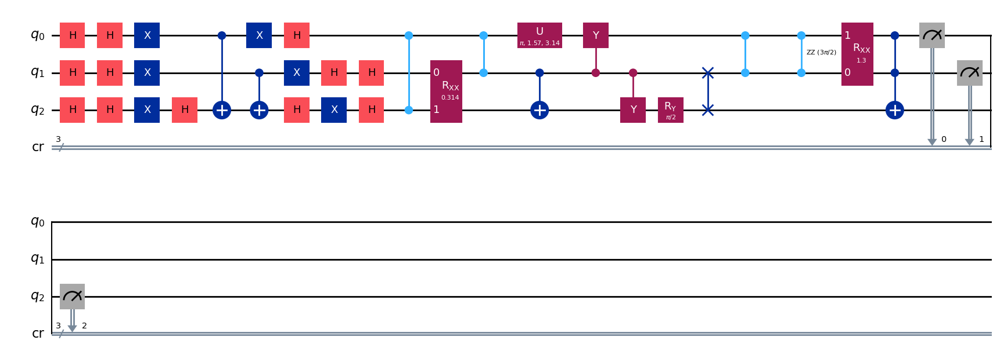

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 15

[Run 1 | Gen 21/99] Best Fitness: 0.7598 | Fidelity: 0.9581 | Gates: 36


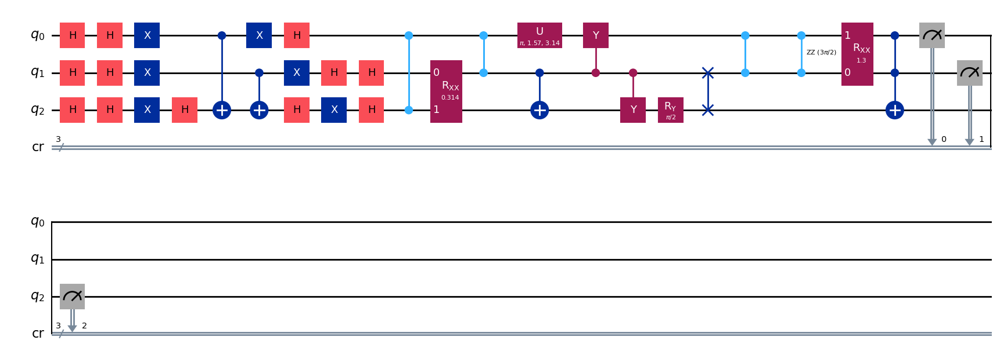

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 20

[Run 1 | Gen 22/99] Best Fitness: 0.7598 | Fidelity: 0.9578 | Gates: 36


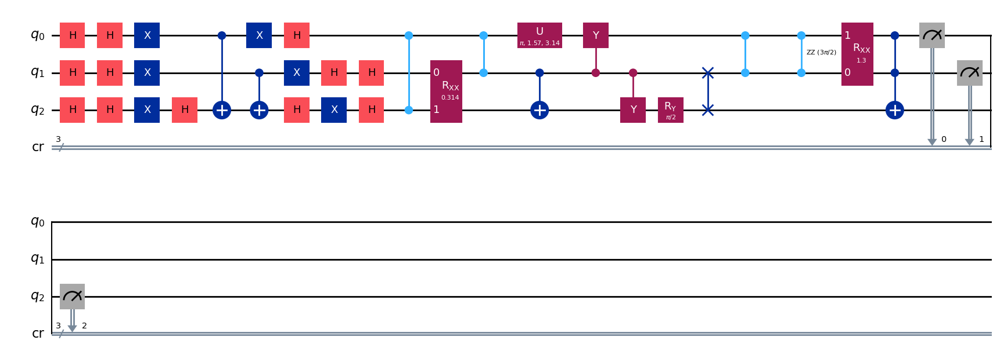

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 7

[Run 1 | Gen 23/99] Best Fitness: 0.7598 | Fidelity: 0.9568 | Gates: 36


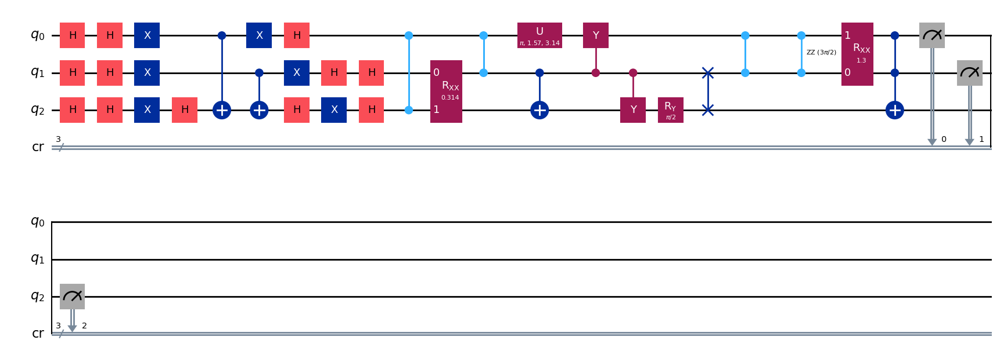

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 6

[Run 1 | Gen 24/99] Best Fitness: 0.7598 | Fidelity: 0.9578 | Gates: 36


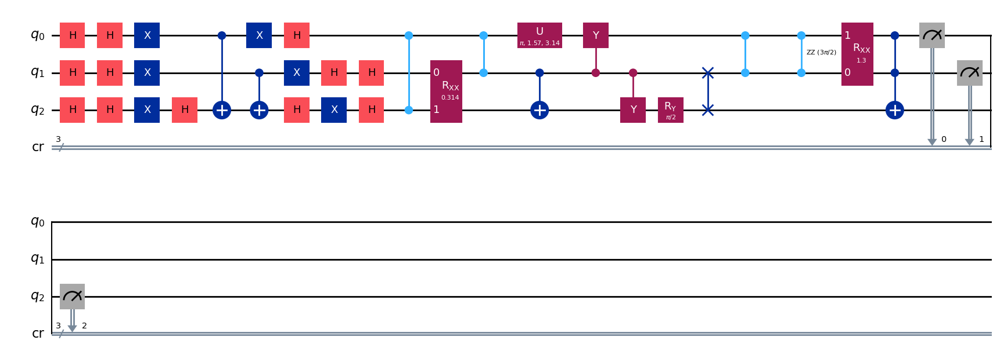

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 4

[Run 1 | Gen 25/99] Best Fitness: 0.7598 | Fidelity: 0.9588 | Gates: 36


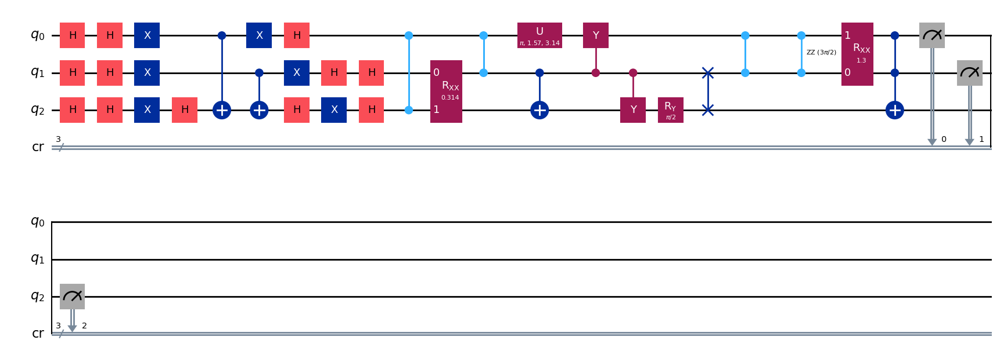

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 2

[Run 1 | Gen 26/99] Best Fitness: 0.7598 | Fidelity: 0.9592 | Gates: 36


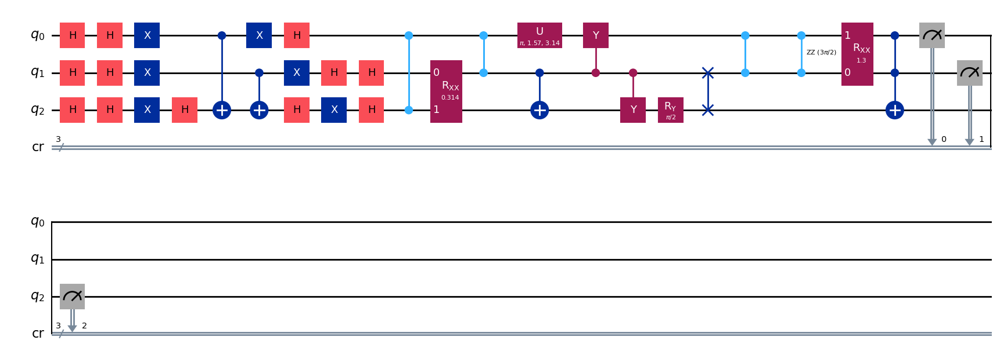

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 2

[Run 1 | Gen 27/99] Best Fitness: 0.7598 | Fidelity: 0.9590 | Gates: 36


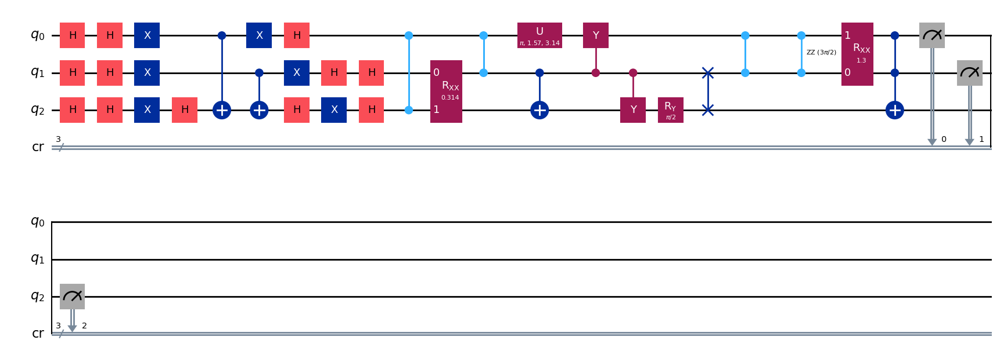

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 0

[Run 1 | Gen 28/99] Best Fitness: 0.7598 | Fidelity: 0.9575 | Gates: 36


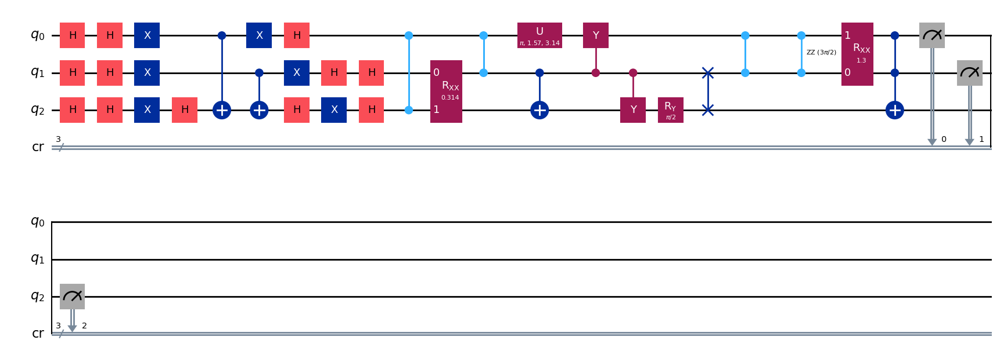

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 0

[Run 1 | Gen 29/99] Best Fitness: 0.7598 | Fidelity: 0.9574 | Gates: 36


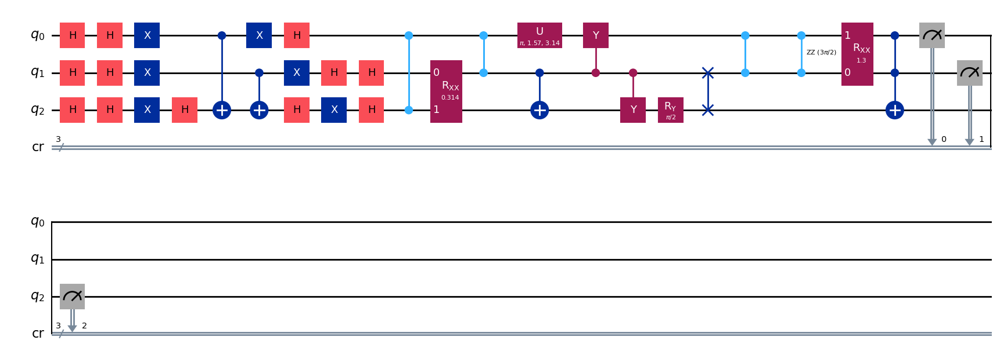

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7597999999999999,) , Number of invalids = 0

[Run 1 | Gen 30/99] Best Fitness: 0.7598 | Fidelity: 0.9551 | Gates: 36


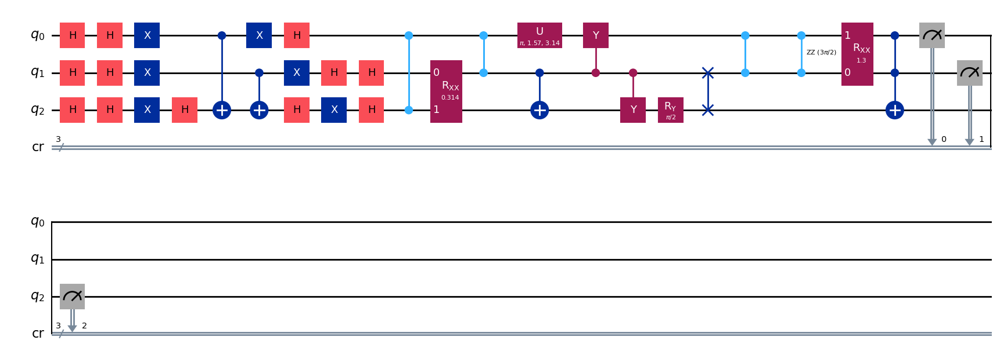

gen = 0 , Best fitness = (0.7597999999999999,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 31/99] Best Fitness: 0.7592 | Fidelity: 0.9584 | Gates: 36


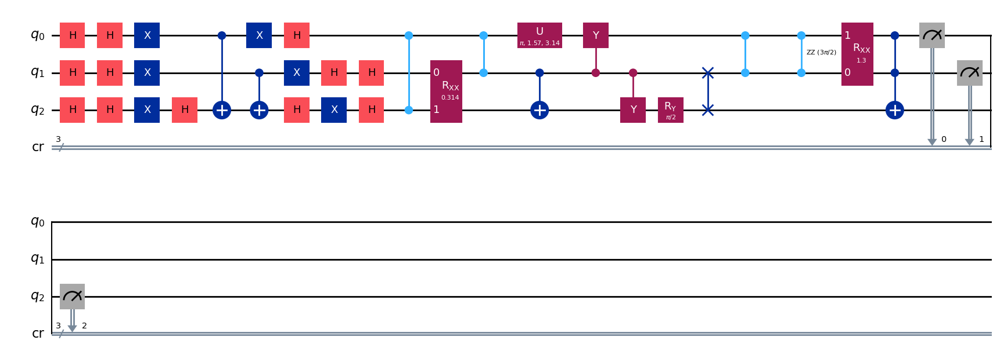

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 32/99] Best Fitness: 0.7592 | Fidelity: 0.9559 | Gates: 36


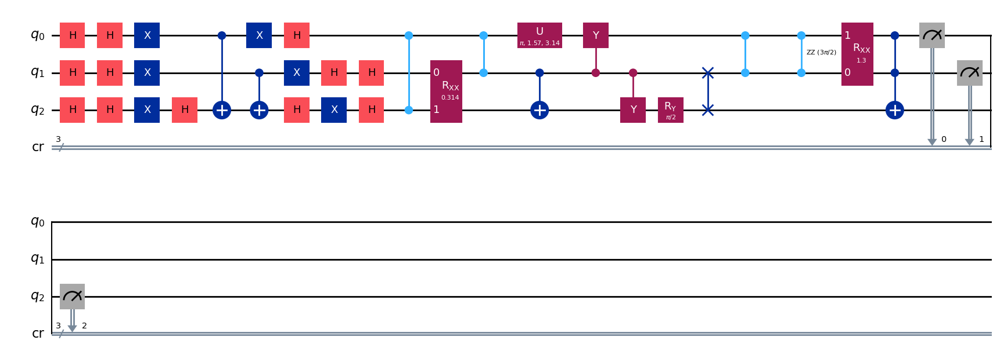

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 33/99] Best Fitness: 0.7592 | Fidelity: 0.9546 | Gates: 36


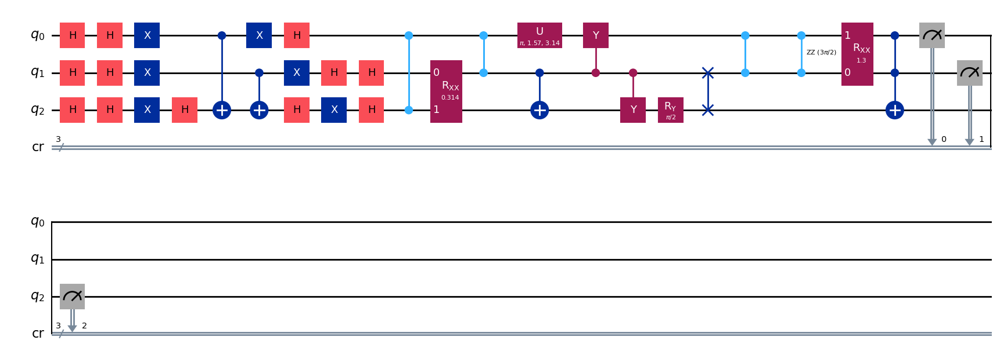

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 34/99] Best Fitness: 0.7592 | Fidelity: 0.9568 | Gates: 36


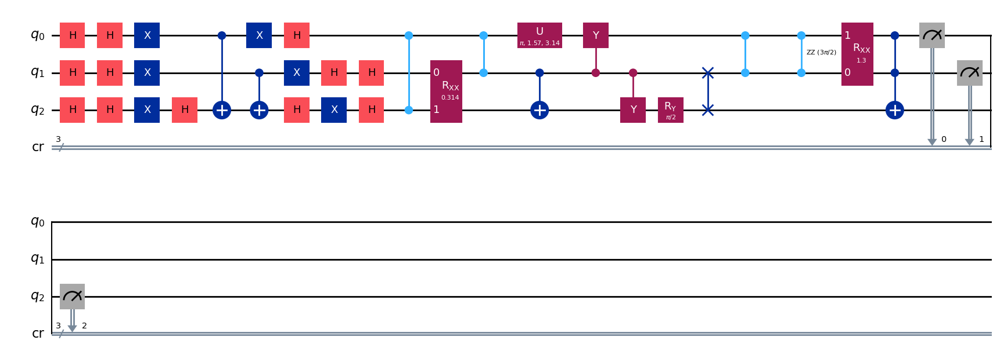

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 35/99] Best Fitness: 0.7592 | Fidelity: 0.9575 | Gates: 36


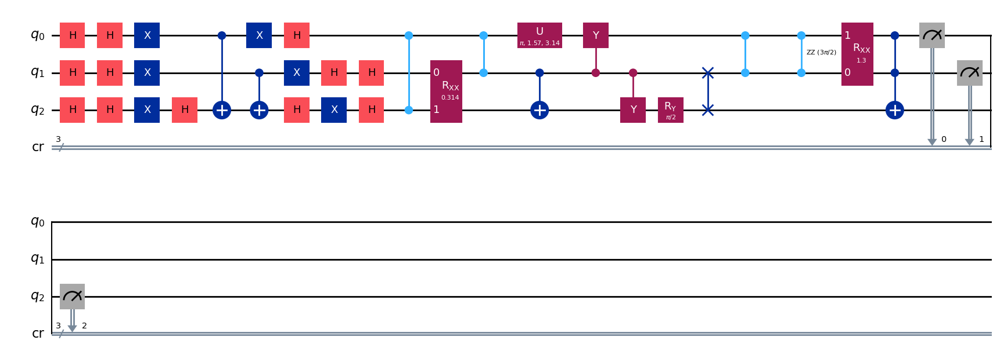

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 2

[Run 1 | Gen 36/99] Best Fitness: 0.7592 | Fidelity: 0.9544 | Gates: 36


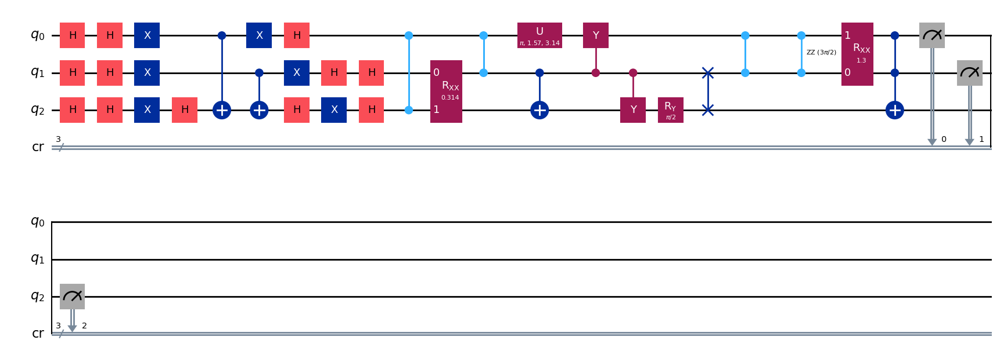

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 37/99] Best Fitness: 0.7592 | Fidelity: 0.9542 | Gates: 36


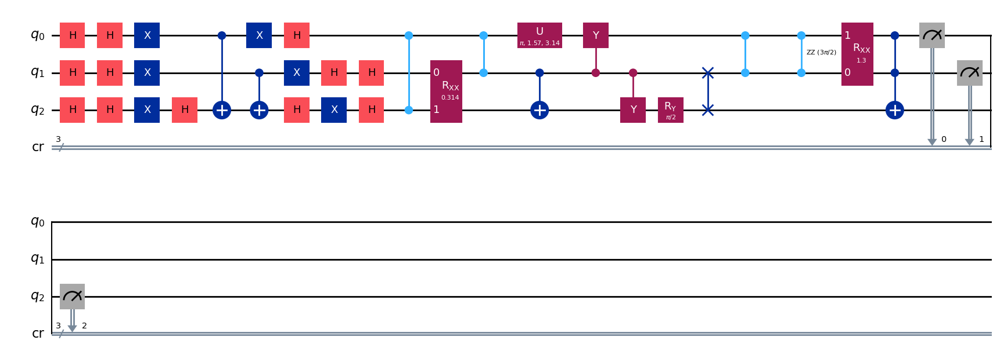

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 38/99] Best Fitness: 0.7592 | Fidelity: 0.9560 | Gates: 36


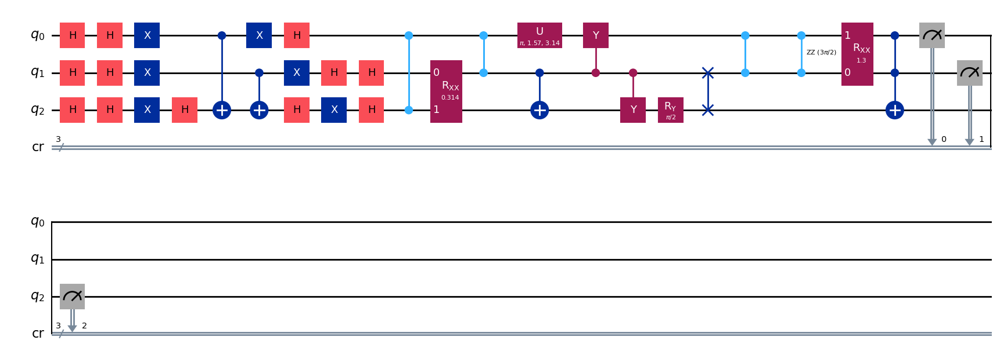

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 1

[Run 1 | Gen 39/99] Best Fitness: 0.7592 | Fidelity: 0.9555 | Gates: 36


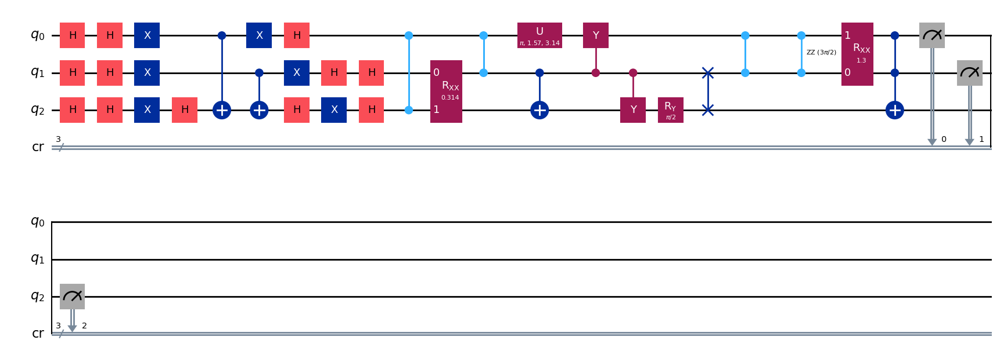

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 40/99] Best Fitness: 0.7592 | Fidelity: 0.9549 | Gates: 36


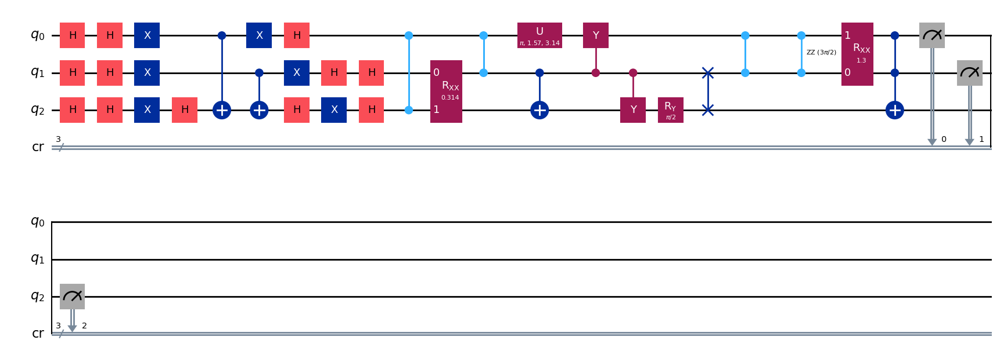

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 41/99] Best Fitness: 0.7592 | Fidelity: 0.9565 | Gates: 36


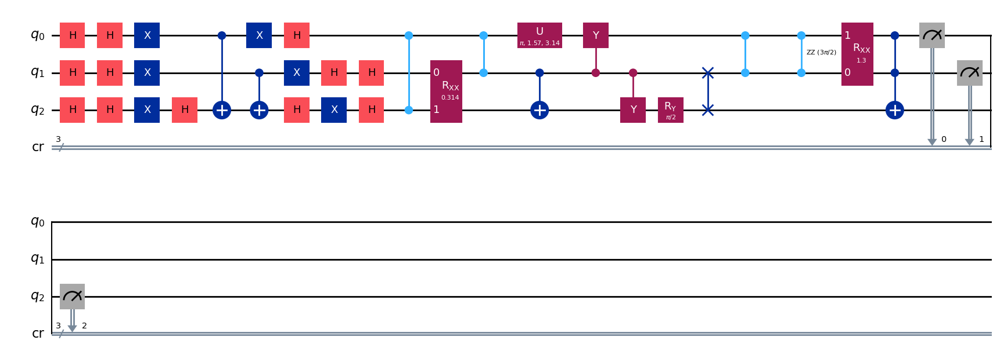

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 42/99] Best Fitness: 0.7592 | Fidelity: 0.9577 | Gates: 36


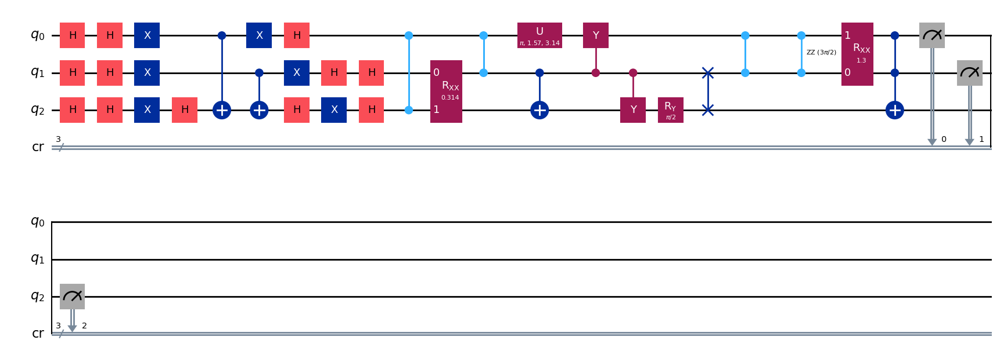

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 43/99] Best Fitness: 0.7592 | Fidelity: 0.9551 | Gates: 36


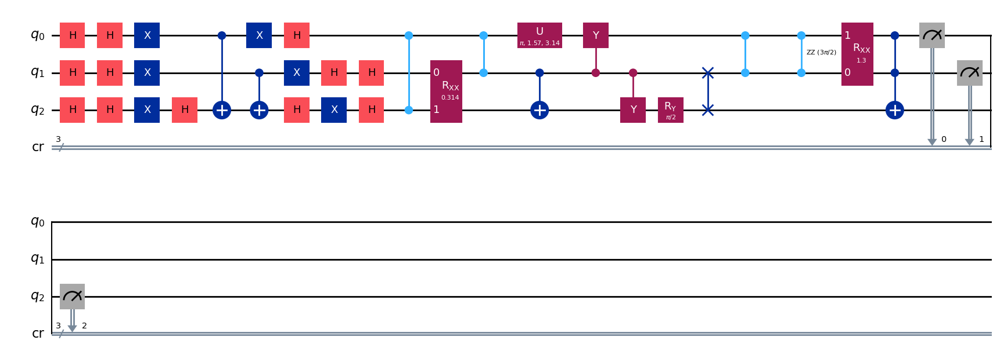

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 44/99] Best Fitness: 0.7592 | Fidelity: 0.9552 | Gates: 36


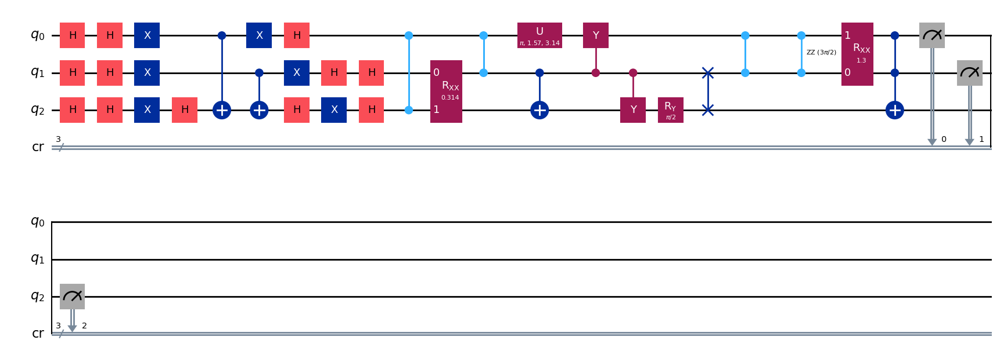

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 45/99] Best Fitness: 0.7592 | Fidelity: 0.9584 | Gates: 36


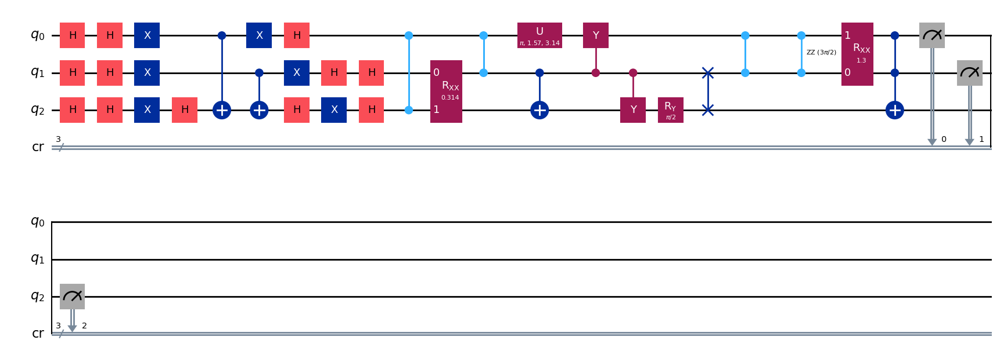

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 46/99] Best Fitness: 0.7592 | Fidelity: 0.9561 | Gates: 36


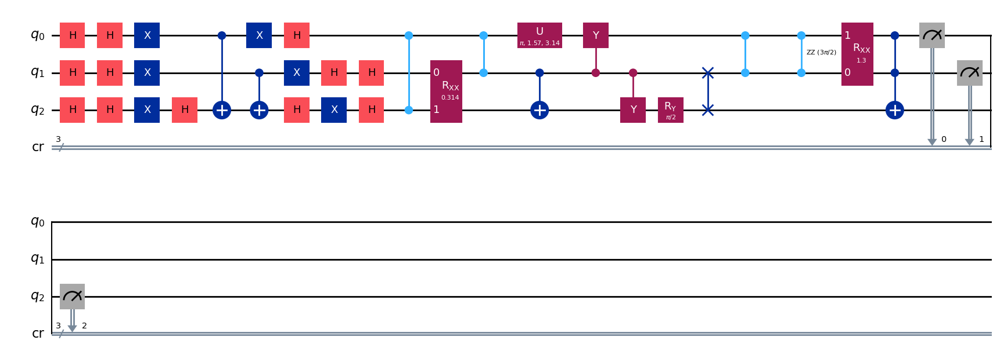

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 47/99] Best Fitness: 0.7592 | Fidelity: 0.9572 | Gates: 36


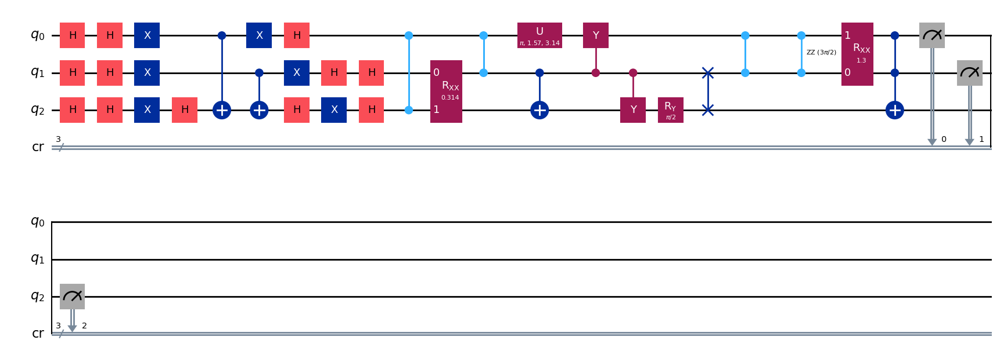

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 48/99] Best Fitness: 0.7592 | Fidelity: 0.9578 | Gates: 36


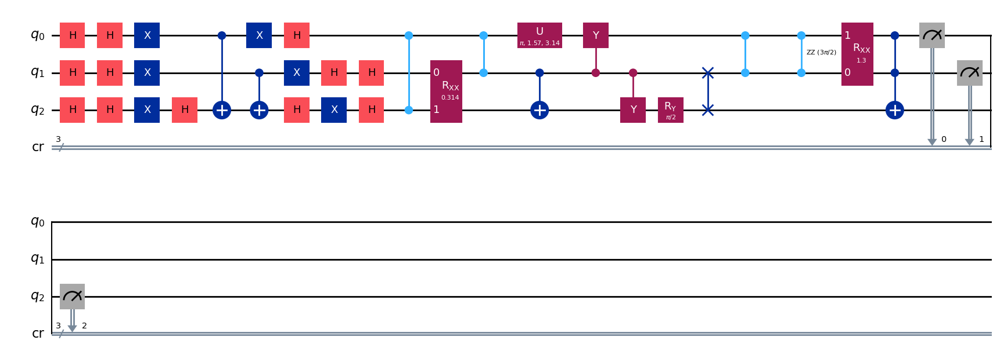

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 49/99] Best Fitness: 0.7592 | Fidelity: 0.9577 | Gates: 36


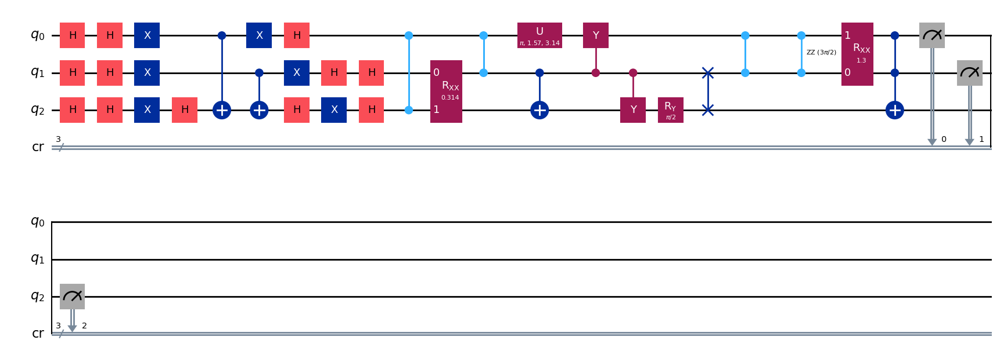

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 50/99] Best Fitness: 0.7592 | Fidelity: 0.9562 | Gates: 36


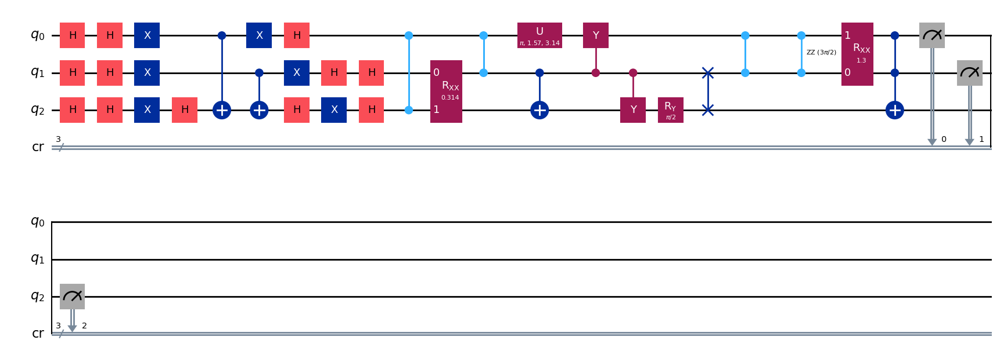

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7592,) , Number of invalids = 0

[Run 1 | Gen 51/99] Best Fitness: 0.7592 | Fidelity: 0.9574 | Gates: 36


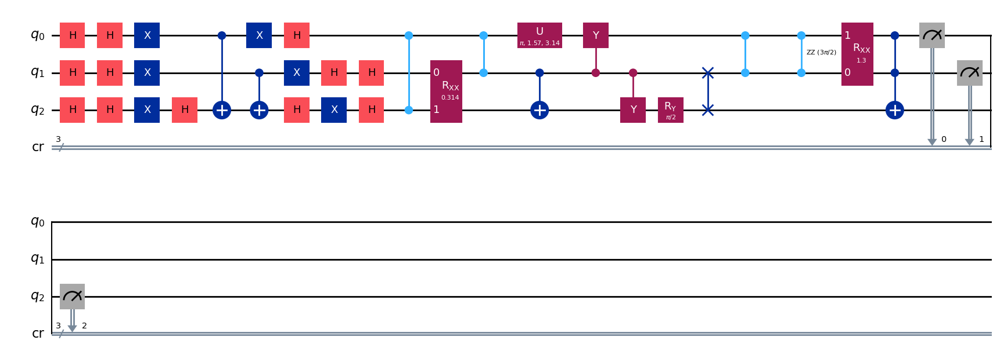

gen = 0 , Best fitness = (0.7592,)
gen = 1 , Best fitness = (0.7584,) , Number of invalids = 0

[Run 1 | Gen 52/99] Best Fitness: 0.7584 | Fidelity: 0.9588 | Gates: 36


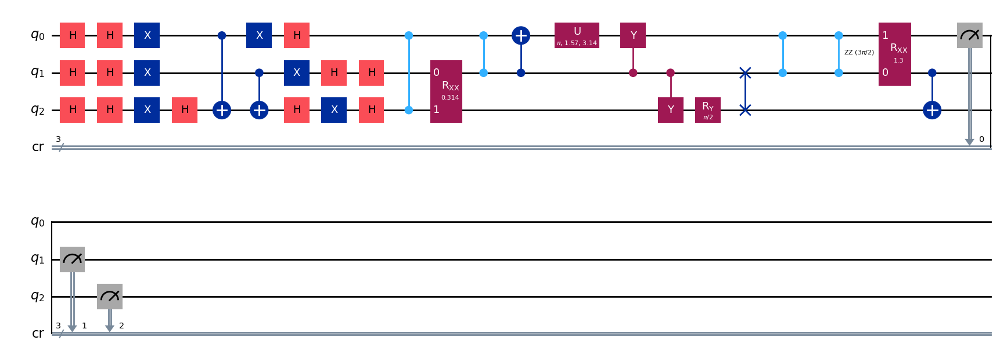

gen = 0 , Best fitness = (0.7584,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 53/99] Best Fitness: 0.7583 | Fidelity: 0.9582 | Gates: 36


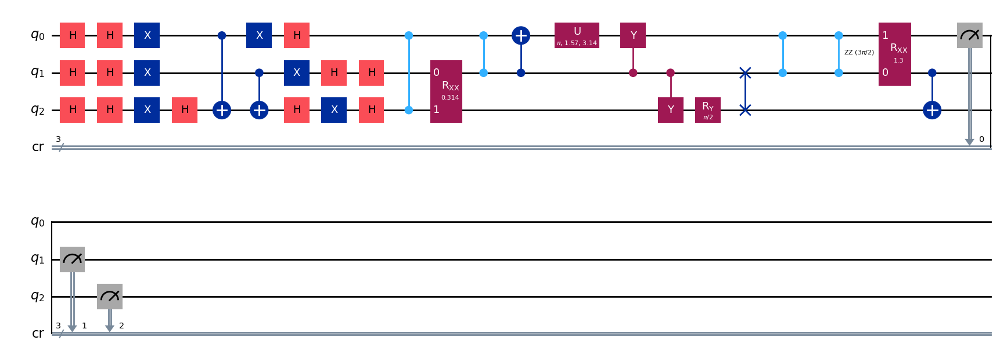

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 54/99] Best Fitness: 0.7583 | Fidelity: 0.9564 | Gates: 36


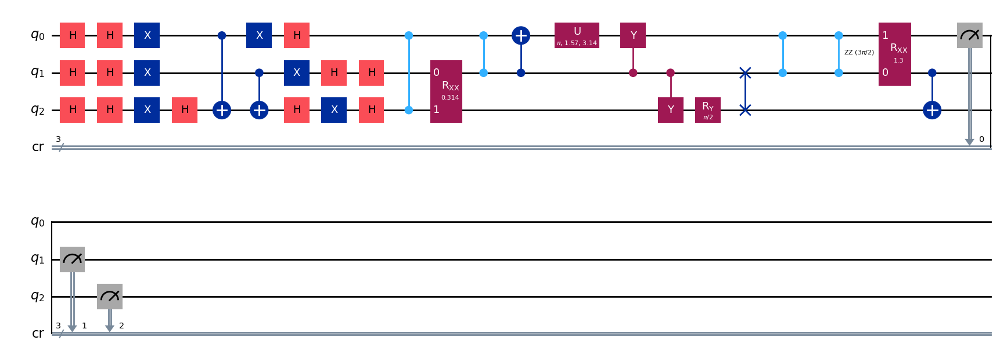

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 55/99] Best Fitness: 0.7583 | Fidelity: 0.9589 | Gates: 36


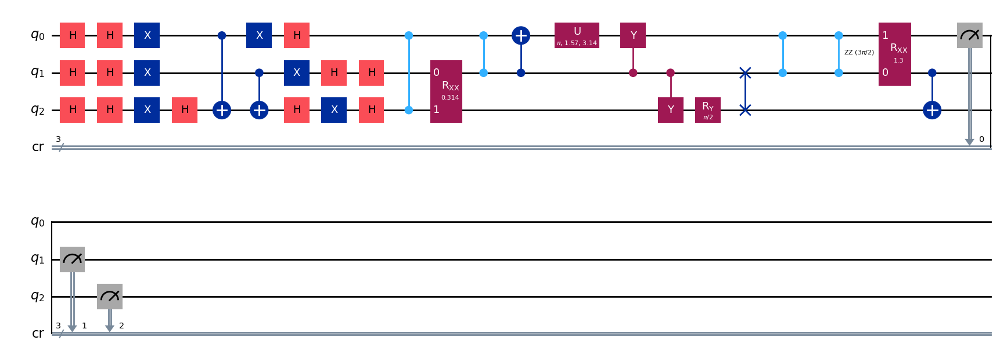

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 56/99] Best Fitness: 0.7583 | Fidelity: 0.9591 | Gates: 36


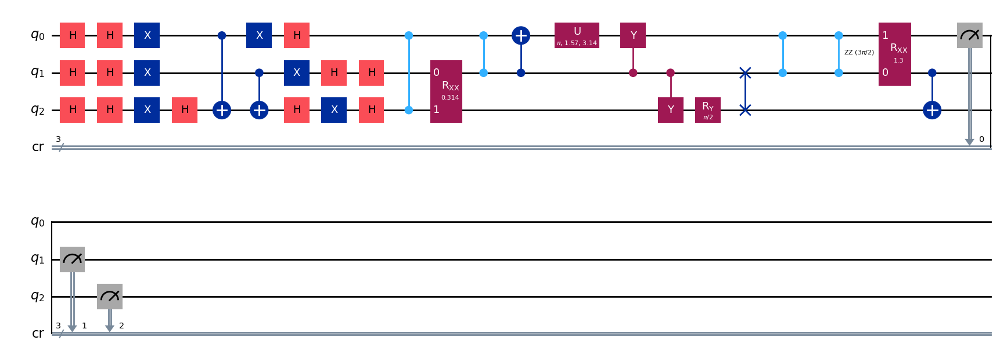

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 57/99] Best Fitness: 0.7583 | Fidelity: 0.9596 | Gates: 36


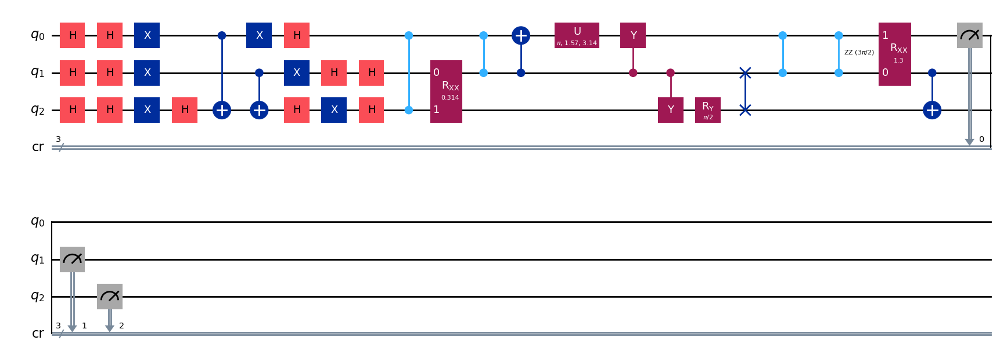

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 58/99] Best Fitness: 0.7583 | Fidelity: 0.9567 | Gates: 36


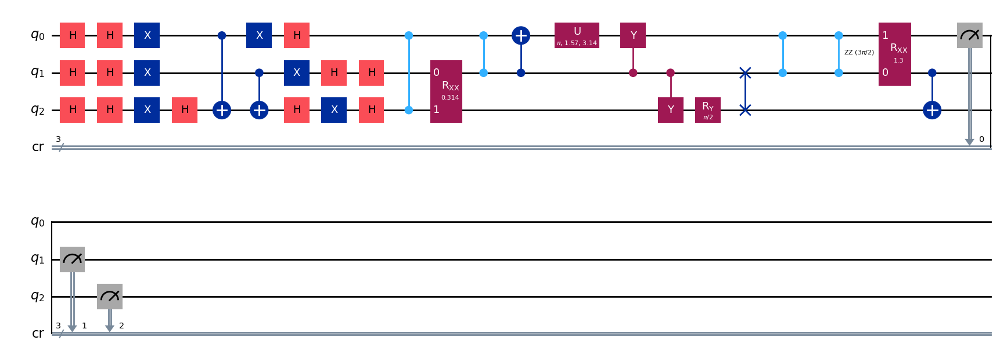

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 59/99] Best Fitness: 0.7583 | Fidelity: 0.9603 | Gates: 36


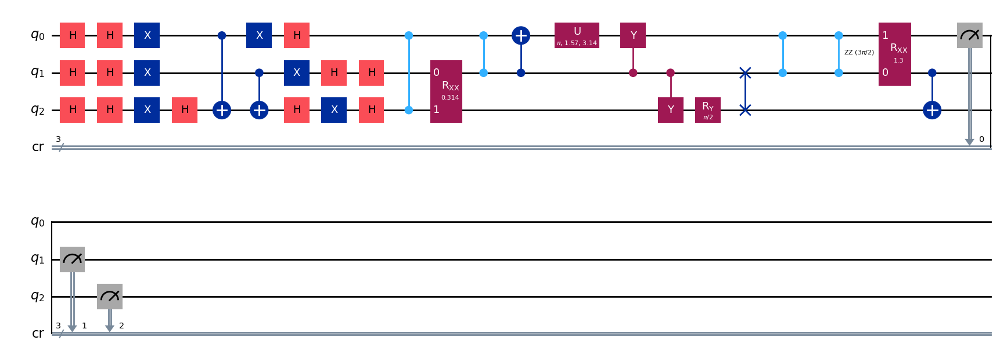

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 60/99] Best Fitness: 0.7583 | Fidelity: 0.9611 | Gates: 36


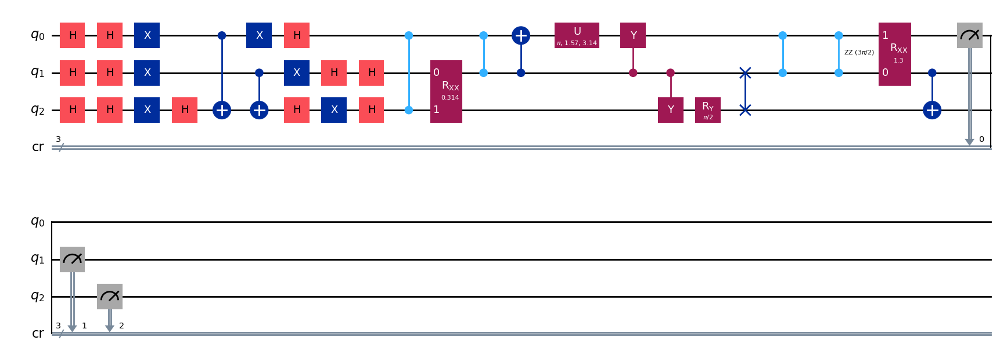

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 61/99] Best Fitness: 0.7583 | Fidelity: 0.9571 | Gates: 36


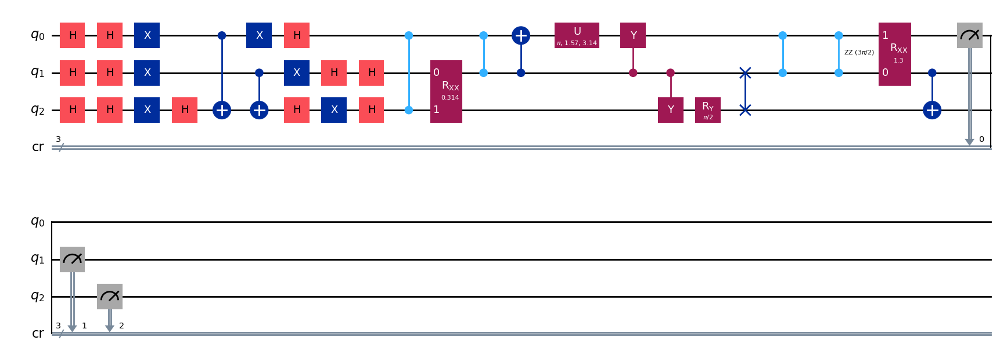

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 62/99] Best Fitness: 0.7583 | Fidelity: 0.9582 | Gates: 36


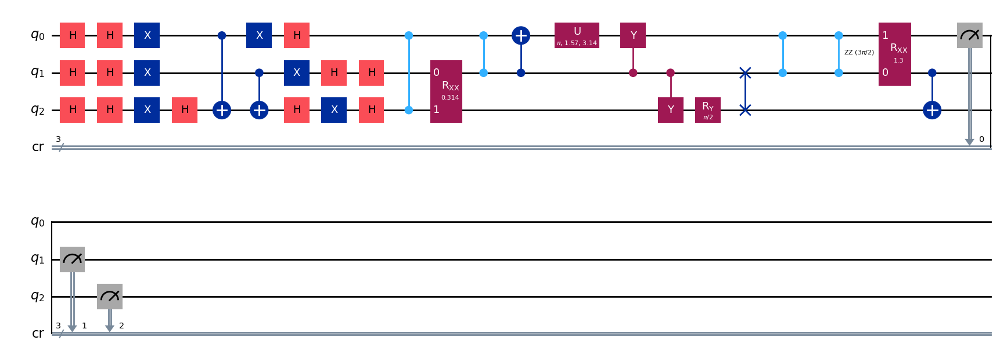

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 63/99] Best Fitness: 0.7583 | Fidelity: 0.9539 | Gates: 36


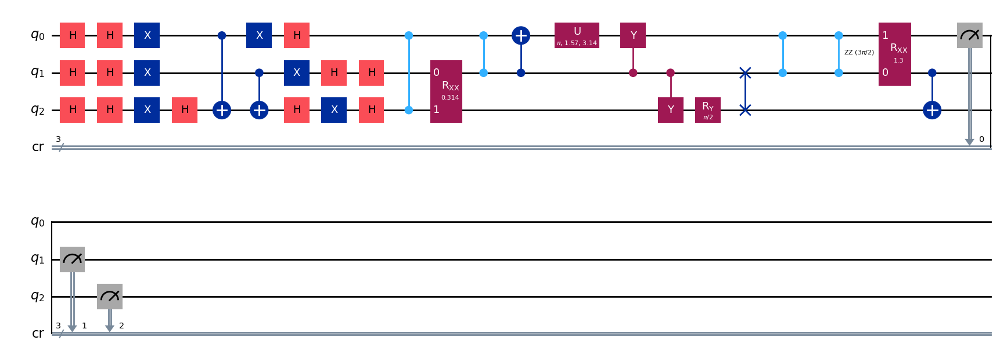

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 64/99] Best Fitness: 0.7583 | Fidelity: 0.9569 | Gates: 36


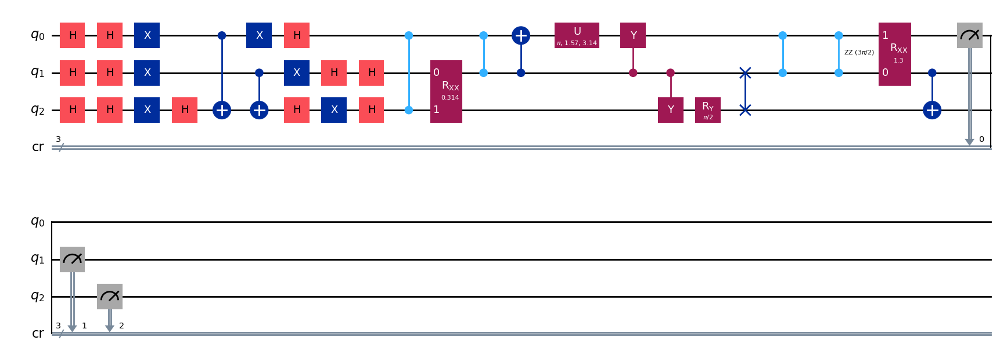

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 65/99] Best Fitness: 0.7583 | Fidelity: 0.9570 | Gates: 36


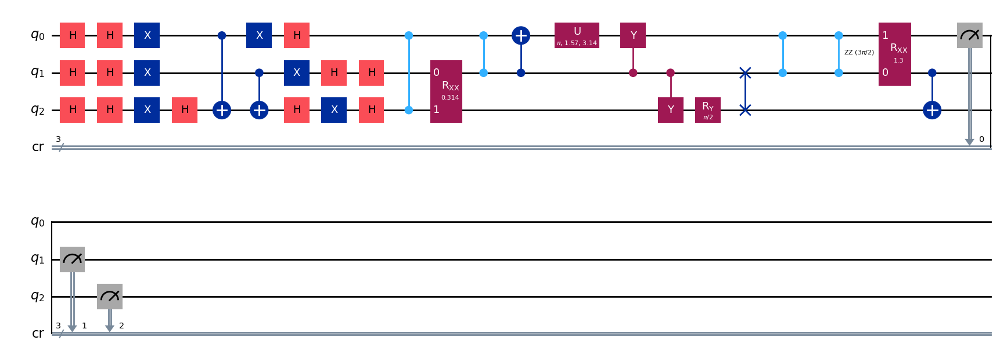

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7583,) , Number of invalids = 0

[Run 1 | Gen 66/99] Best Fitness: 0.7583 | Fidelity: 0.9591 | Gates: 36


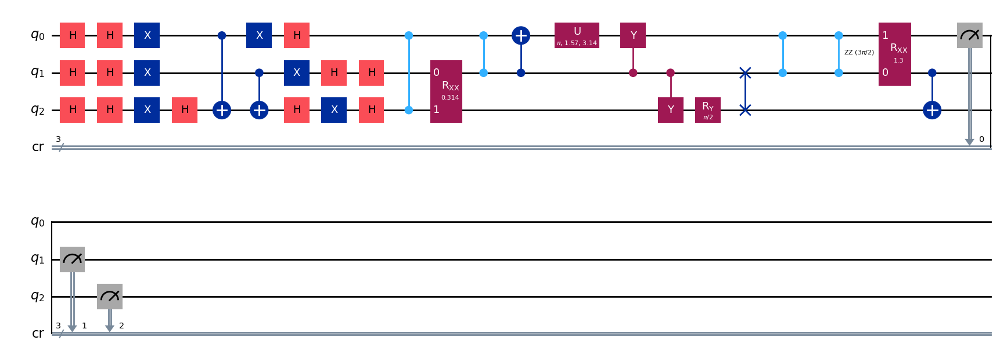

gen = 0 , Best fitness = (0.7583,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 67/99] Best Fitness: 0.7582 | Fidelity: 0.9591 | Gates: 36


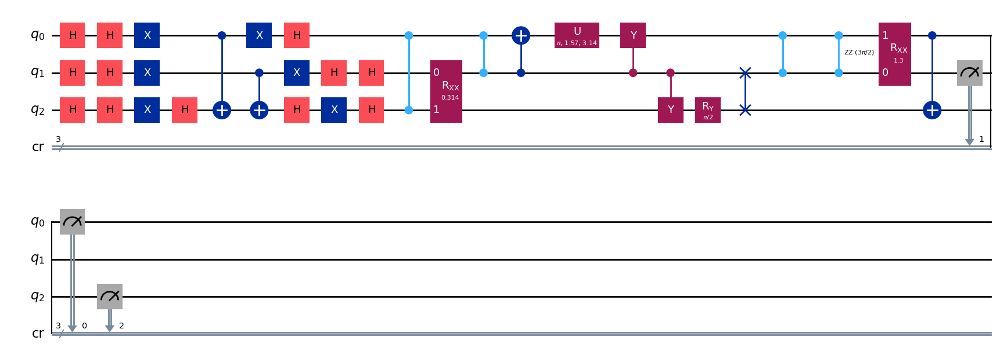

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 68/99] Best Fitness: 0.7582 | Fidelity: 0.9572 | Gates: 36


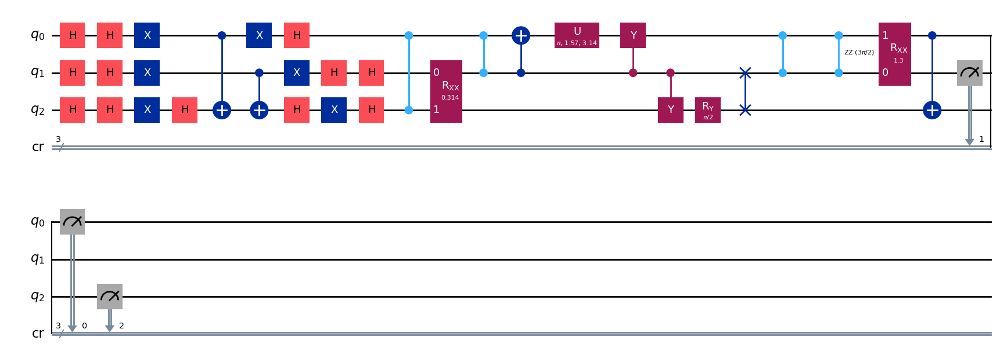

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 69/99] Best Fitness: 0.7582 | Fidelity: 0.9556 | Gates: 36


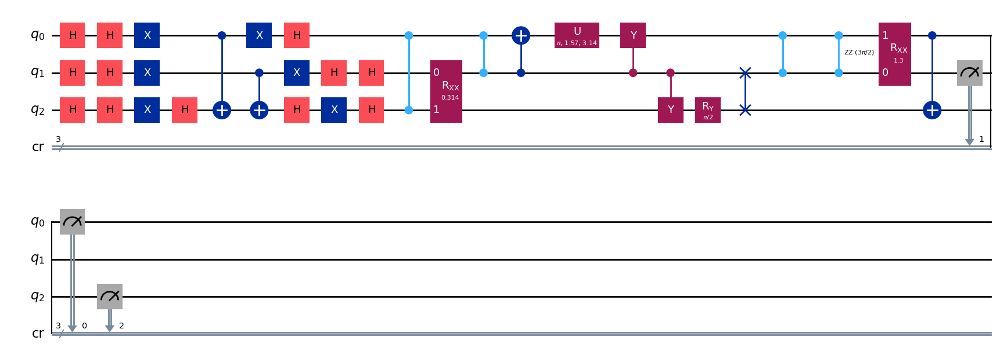

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 70/99] Best Fitness: 0.7582 | Fidelity: 0.9562 | Gates: 36


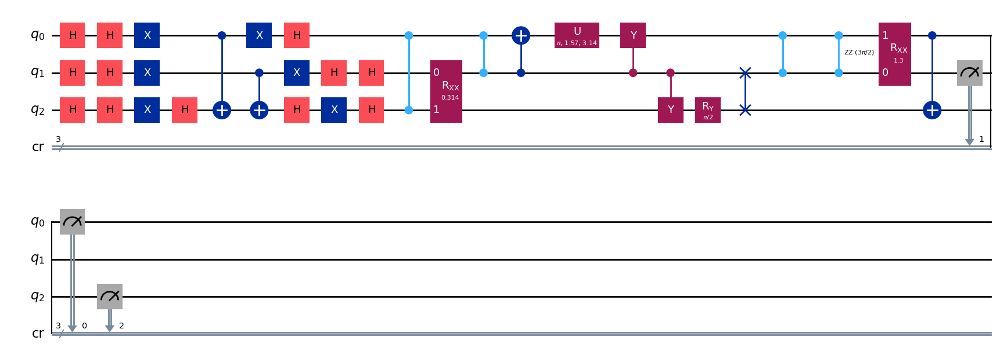

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 71/99] Best Fitness: 0.7582 | Fidelity: 0.9578 | Gates: 36


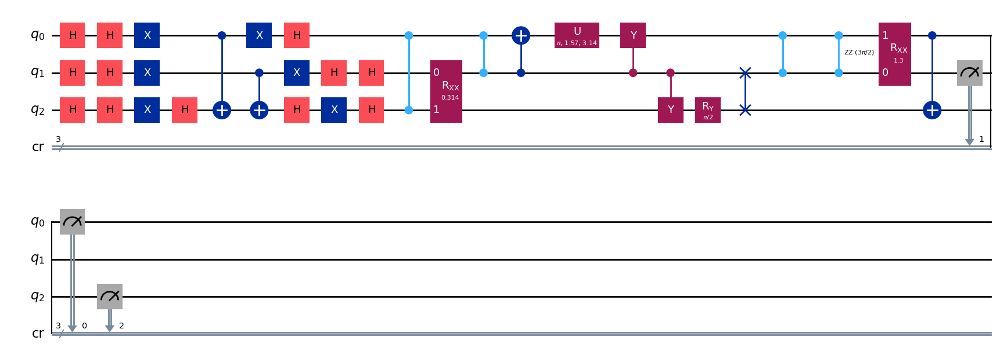

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 72/99] Best Fitness: 0.7582 | Fidelity: 0.9566 | Gates: 36


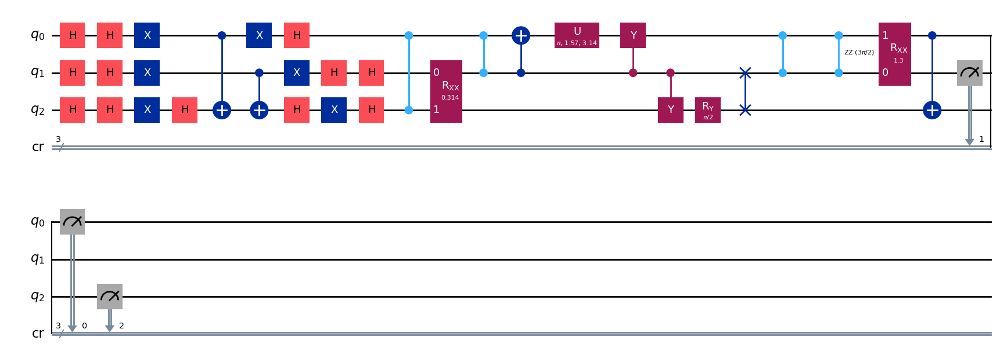

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 73/99] Best Fitness: 0.7582 | Fidelity: 0.9599 | Gates: 36


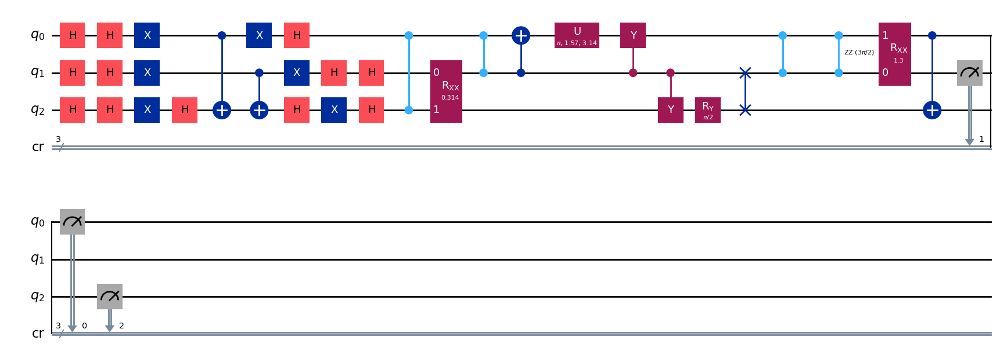

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 74/99] Best Fitness: 0.7582 | Fidelity: 0.9556 | Gates: 36


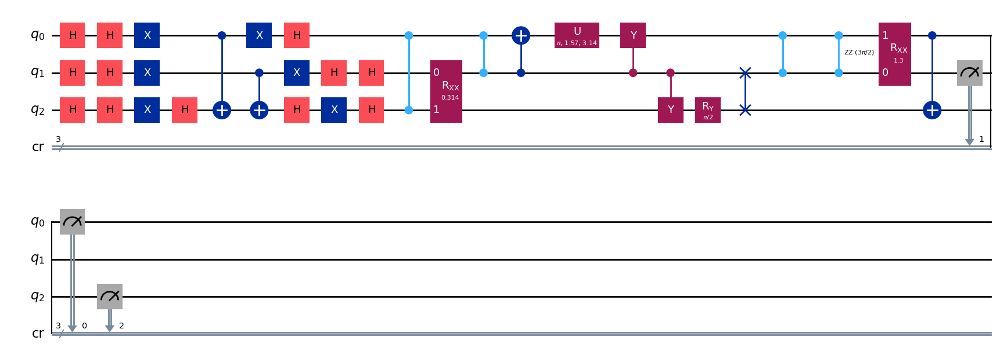

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 75/99] Best Fitness: 0.7582 | Fidelity: 0.9609 | Gates: 36


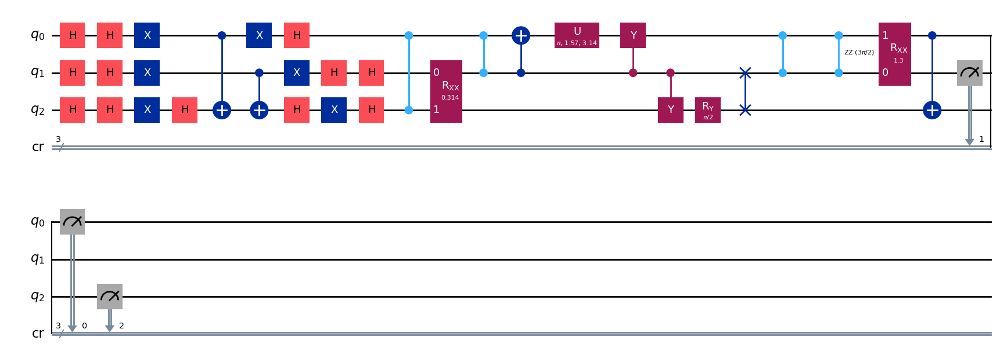

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 76/99] Best Fitness: 0.7582 | Fidelity: 0.9601 | Gates: 36


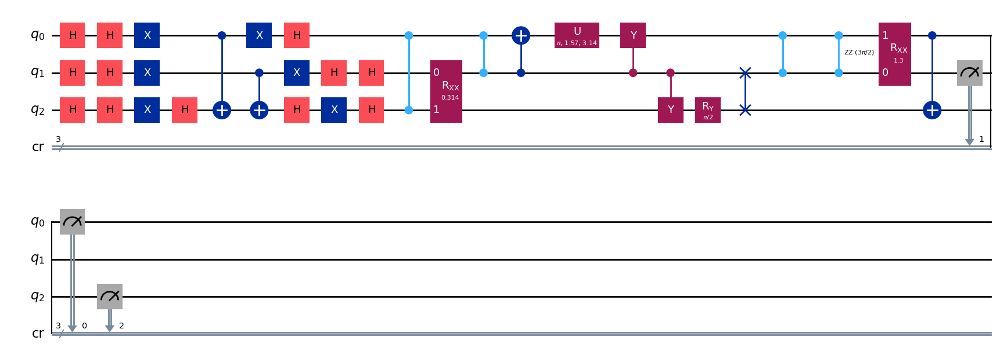

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7582,) , Number of invalids = 0

[Run 1 | Gen 77/99] Best Fitness: 0.7582 | Fidelity: 0.9572 | Gates: 36


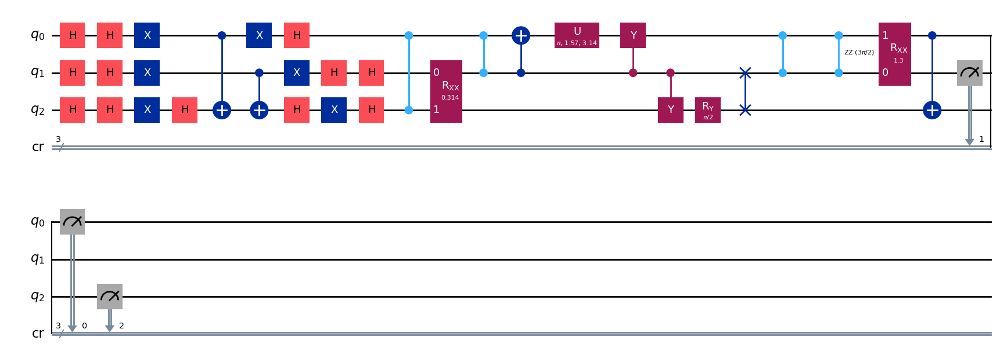

gen = 0 , Best fitness = (0.7582,)
gen = 1 , Best fitness = (0.7581,) , Number of invalids = 0

[Run 1 | Gen 78/99] Best Fitness: 0.7581 | Fidelity: 0.9576 | Gates: 36


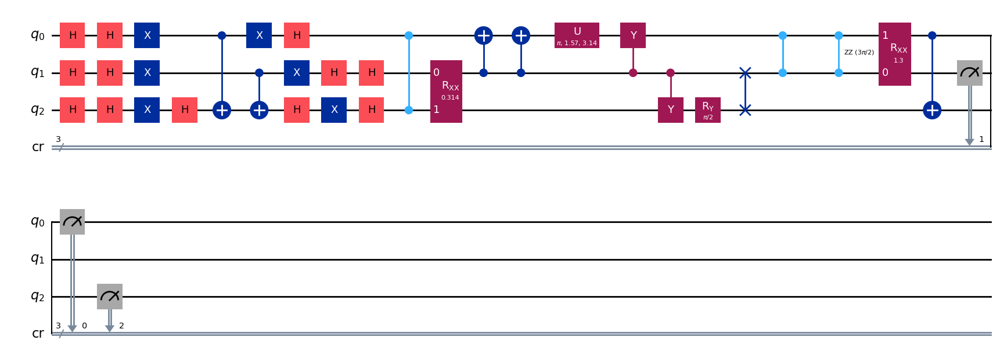

gen = 0 , Best fitness = (0.7581,)
gen = 1 , Best fitness = (0.756,) , Number of invalids = 0

[Run 1 | Gen 79/99] Best Fitness: 0.7560 | Fidelity: 0.9837 | Gates: 37


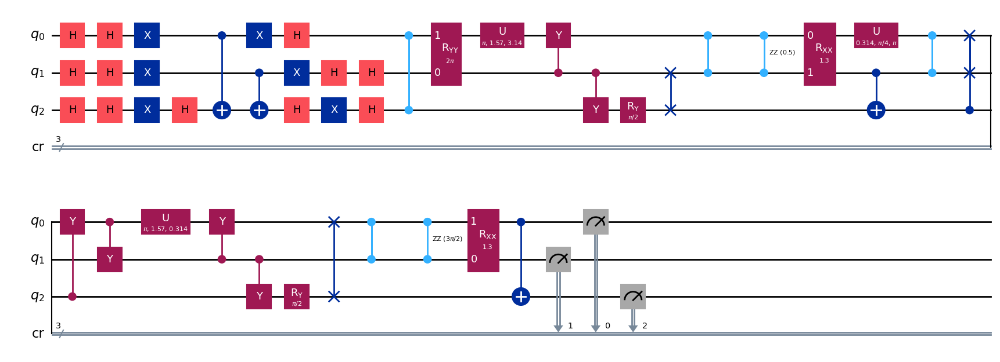

gen = 0 , Best fitness = (0.756,)
gen = 1 , Best fitness = (0.756,) , Number of invalids = 0

[Run 1 | Gen 80/99] Best Fitness: 0.7560 | Fidelity: 0.9829 | Gates: 37


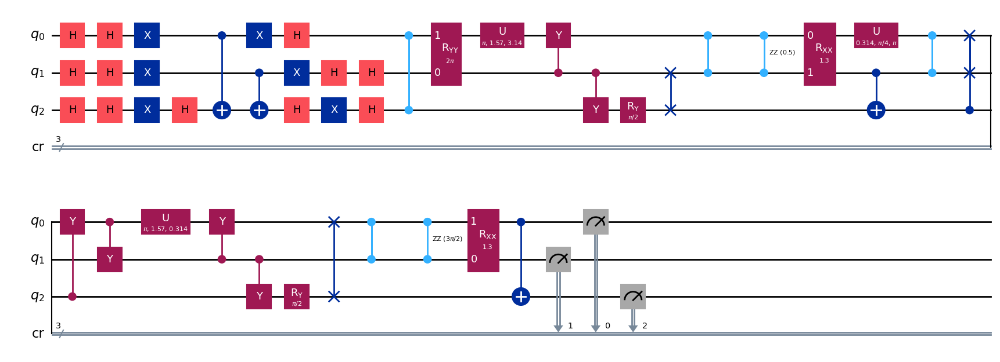

gen = 0 , Best fitness = (0.756,)
gen = 1 , Best fitness = (0.756,) , Number of invalids = 0

[Run 1 | Gen 81/99] Best Fitness: 0.7560 | Fidelity: 0.9827 | Gates: 37


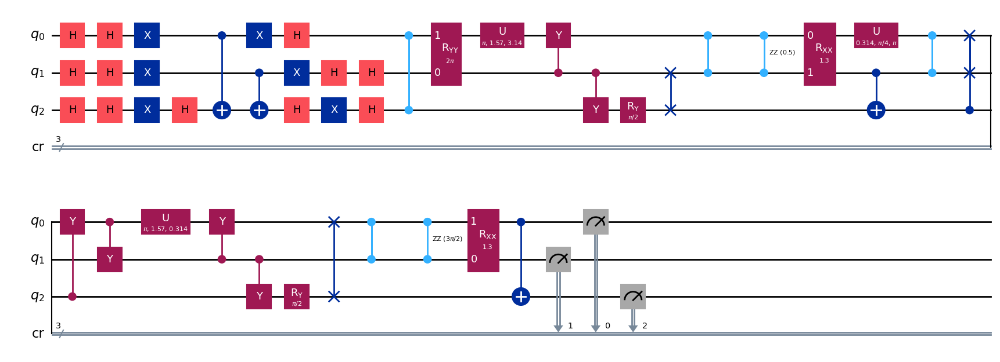

gen = 0 , Best fitness = (0.756,)
gen = 1 , Best fitness = (0.756,) , Number of invalids = 0

[Run 1 | Gen 82/99] Best Fitness: 0.7560 | Fidelity: 0.9815 | Gates: 37


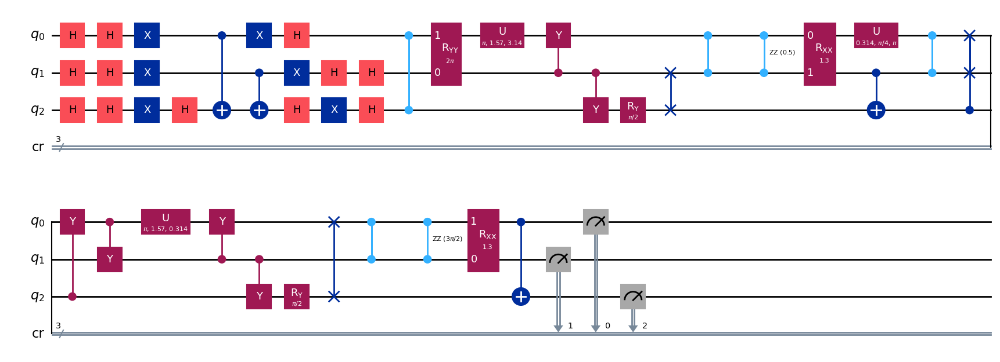

gen = 0 , Best fitness = (0.756,)
gen = 1 , Best fitness = (0.756,) , Number of invalids = 0

[Run 1 | Gen 83/99] Best Fitness: 0.7560 | Fidelity: 0.9812 | Gates: 37


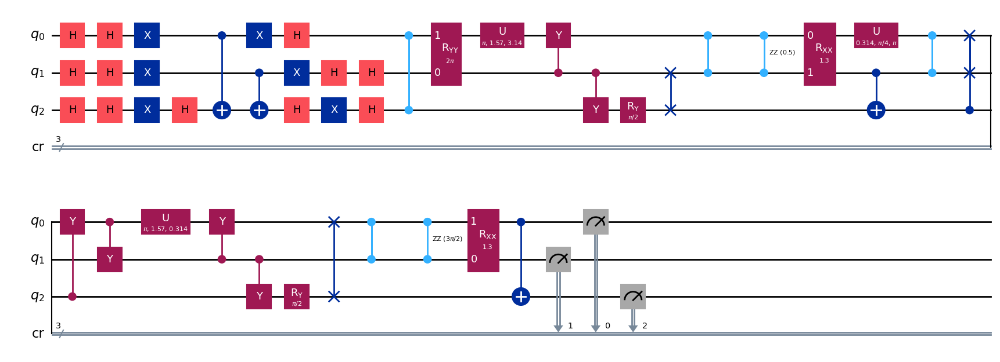

gen = 0 , Best fitness = (0.756,)
gen = 1 , Best fitness = (0.7553,) , Number of invalids = 0

[Run 1 | Gen 84/99] Best Fitness: 0.7553 | Fidelity: 0.9801 | Gates: 37


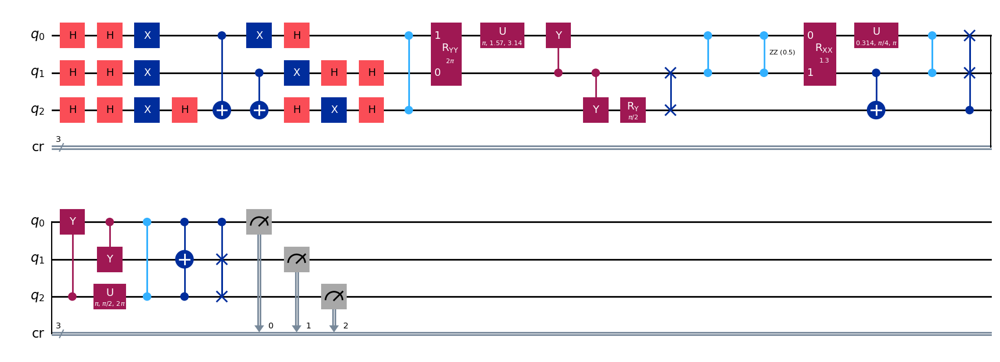

gen = 0 , Best fitness = (0.7553,)
gen = 1 , Best fitness = (0.7545,) , Number of invalids = 0

[Run 1 | Gen 85/99] Best Fitness: 0.7545 | Fidelity: 0.9819 | Gates: 37


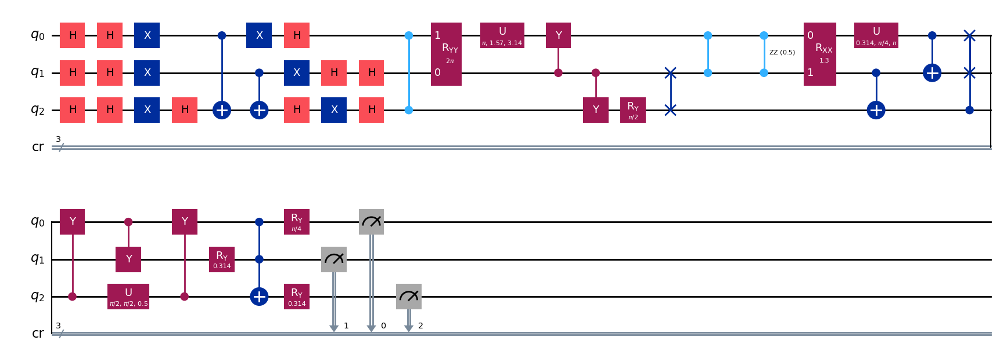

gen = 0 , Best fitness = (0.7545,)
gen = 1 , Best fitness = (0.74,) , Number of invalids = 0

[Run 1 | Gen 86/99] Best Fitness: 0.7400 | Fidelity: 1.0000 | Gates: 37


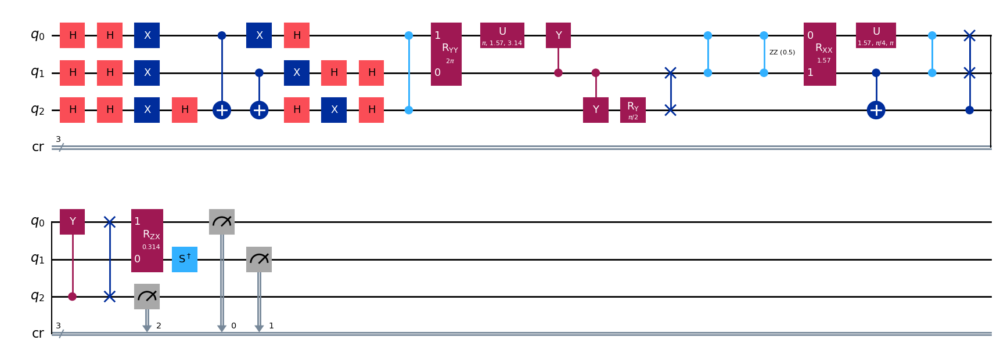

gen = 0 , Best fitness = (0.74,)
gen = 1 , Best fitness = (0.7379,) , Number of invalids = 0

[Run 1 | Gen 87/99] Best Fitness: 0.7379 | Fidelity: 0.9836 | Gates: 36


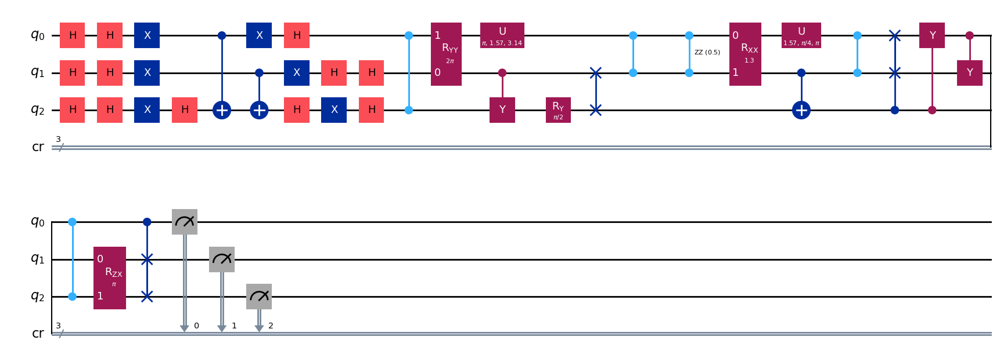

gen = 0 , Best fitness = (0.7379,)
gen = 1 , Best fitness = (0.6968000000000001,) , Number of invalids = 0

[Run 1 | Gen 88/99] Best Fitness: 0.6968 | Fidelity: 0.9826 | Gates: 34


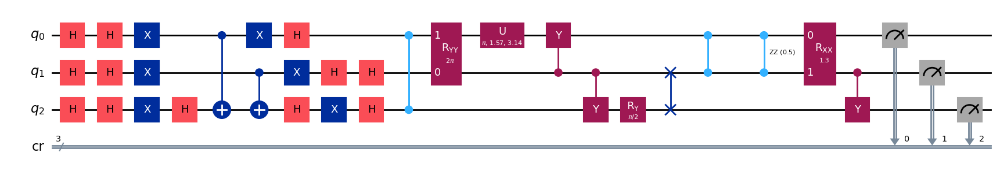

gen = 0 , Best fitness = (0.6968000000000001,)
gen = 1 , Best fitness = (0.6968000000000001,) , Number of invalids = 0

[Run 1 | Gen 89/99] Best Fitness: 0.6968 | Fidelity: 0.9819 | Gates: 34


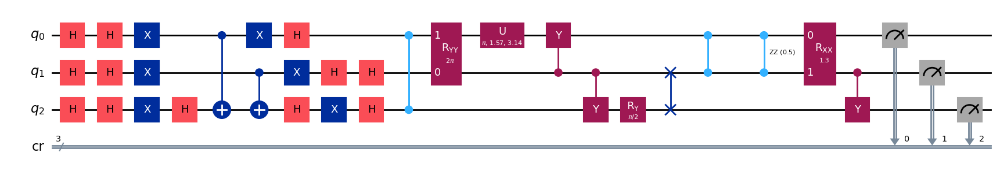

gen = 0 , Best fitness = (0.6968000000000001,)
gen = 1 , Best fitness = (0.6968000000000001,) , Number of invalids = 0

[Run 1 | Gen 90/99] Best Fitness: 0.6968 | Fidelity: 0.9830 | Gates: 34


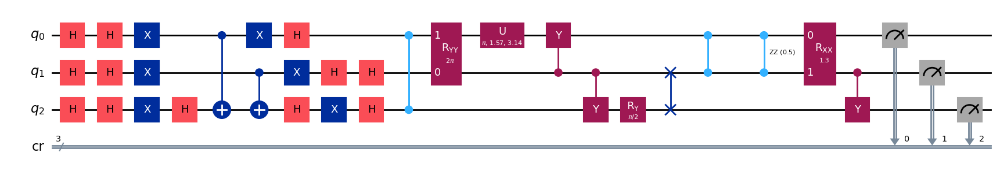

gen = 0 , Best fitness = (0.6968000000000001,)
gen = 1 , Best fitness = (0.68,) , Number of invalids = 0

[Run 1 | Gen 91/99] Best Fitness: 0.6800 | Fidelity: 1.0000 | Gates: 34


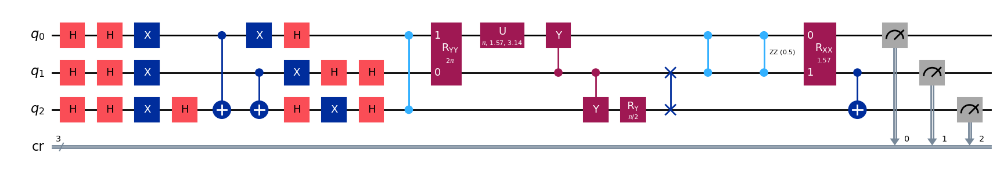

gen = 0 , Best fitness = (0.68,)
gen = 1 , Best fitness = (0.6791,) , Number of invalids = 0

[Run 1 | Gen 92/99] Best Fitness: 0.6791 | Fidelity: 0.9829 | Gates: 33


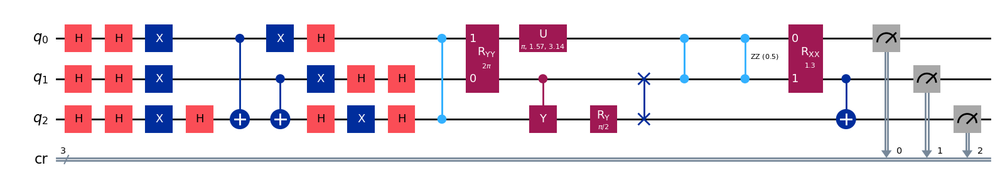

gen = 0 , Best fitness = (0.6791,)
gen = 1 , Best fitness = (0.6791,) , Number of invalids = 0

[Run 1 | Gen 93/99] Best Fitness: 0.6791 | Fidelity: 0.9802 | Gates: 33


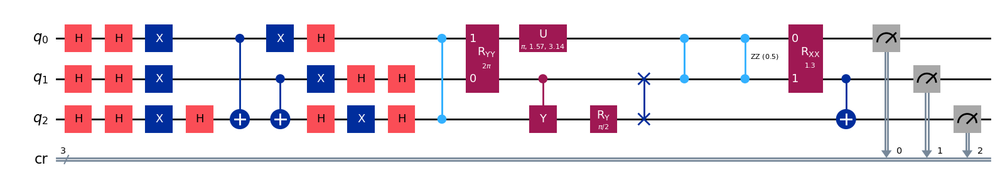

gen = 0 , Best fitness = (0.6791,)
gen = 1 , Best fitness = (0.6779000000000001,) , Number of invalids = 0

[Run 1 | Gen 94/99] Best Fitness: 0.6779 | Fidelity: 0.9819 | Gates: 33


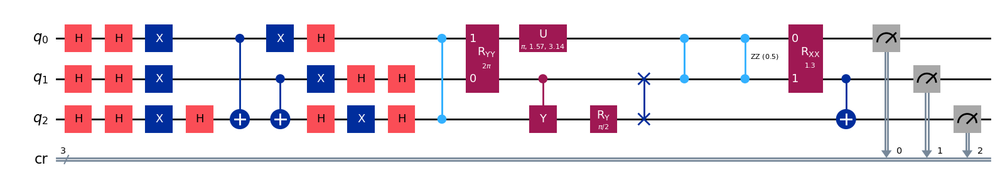

gen = 0 , Best fitness = (0.6779000000000001,)
gen = 1 , Best fitness = (0.66,) , Number of invalids = 0

[Run 1 | Gen 95/99] Best Fitness: 0.6600 | Fidelity: 1.0000 | Gates: 33


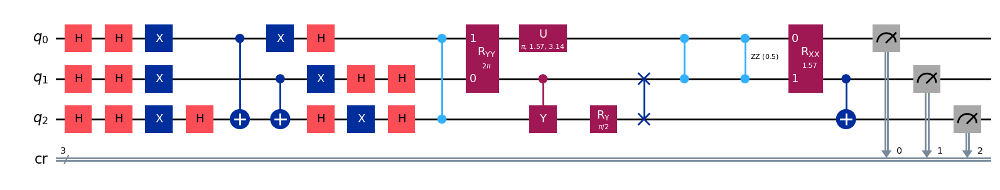

gen = 0 , Best fitness = (0.66,)
gen = 1 , Best fitness = (0.66,) , Number of invalids = 0

[Run 1 | Gen 96/99] Best Fitness: 0.6600 | Fidelity: 1.0000 | Gates: 33


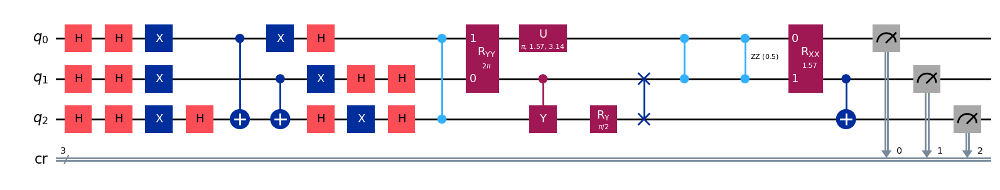

gen = 0 , Best fitness = (0.66,)
gen = 1 , Best fitness = (0.66,) , Number of invalids = 0

[Run 1 | Gen 97/99] Best Fitness: 0.6600 | Fidelity: 1.0000 | Gates: 33


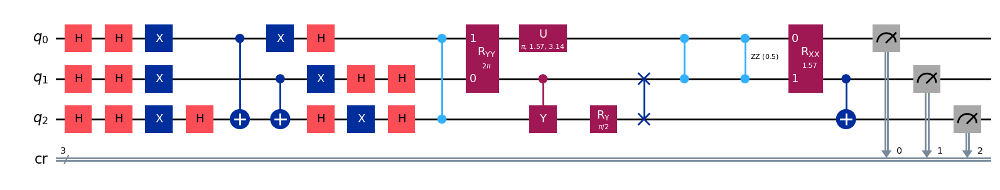

gen = 0 , Best fitness = (0.66,)
gen = 1 , Best fitness = (0.66,) , Number of invalids = 0

[Run 1 | Gen 98/99] Best Fitness: 0.6600 | Fidelity: 1.0000 | Gates: 33


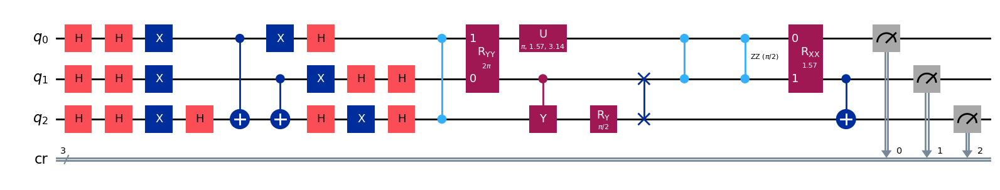

gen = 0 , Best fitness = (0.66,)
gen = 1 , Best fitness = (0.66,) , Number of invalids = 0

[Run 1 | Gen 99/99] Best Fitness: 0.6600 | Fidelity: 1.0000 | Gates: 33


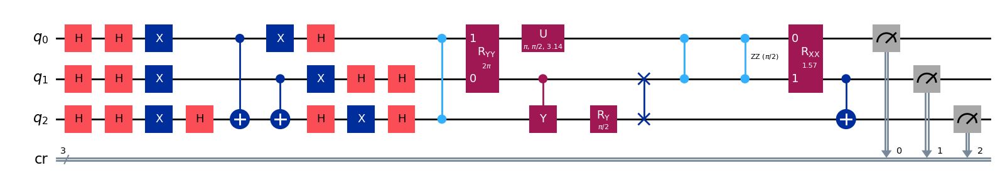


Generating evolution plots for Run 1...
✓ Plot saved to: experiments_state_111/run_1_seed_90759/evolution_metrics_run_1.png


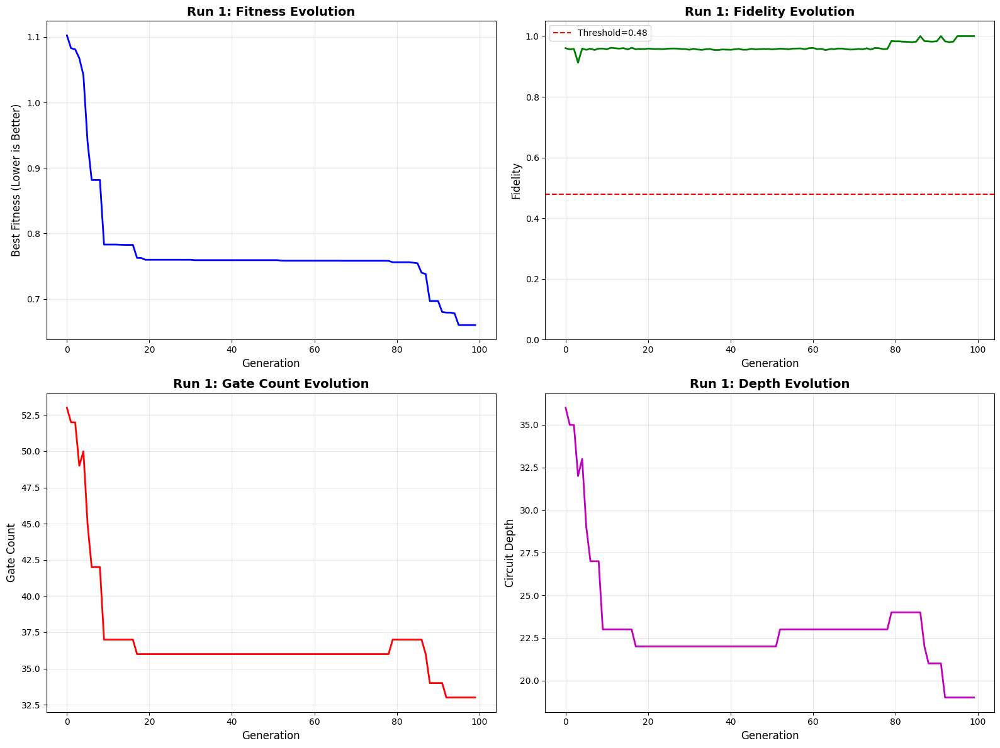


✓ Run 1 COMPLETE | Fidelity: 1.0000 | Gates: 33 | Depth: 19


RUN 2/5 | Target: 111 | Seed: 74678
✓ Logging to: experiments_state_111/run_2_seed_74678
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (1.5723000000000003,)
gen = 1 , Best fitness = (1.0749,) , Number of invalids = 158

[Run 2 | Gen 0/99] Best Fitness: 1.0749 | Fidelity: 0.5284 | Gates: 31


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


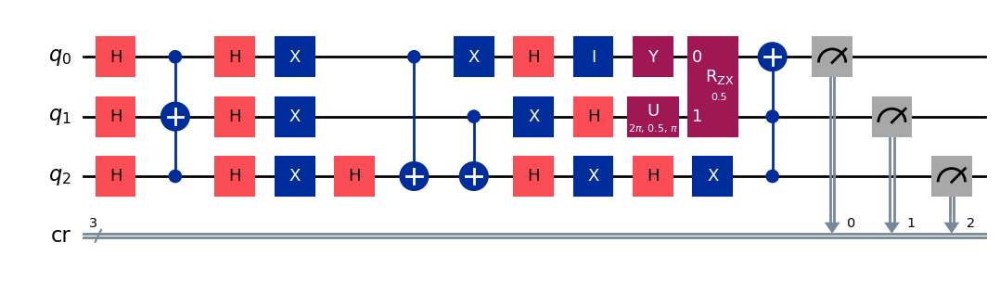

gen = 0 , Best fitness = (1.0749,)
gen = 1 , Best fitness = (1.0749,) , Number of invalids = 88

[Run 2 | Gen 1/99] Best Fitness: 1.0749 | Fidelity: 0.5291 | Gates: 31


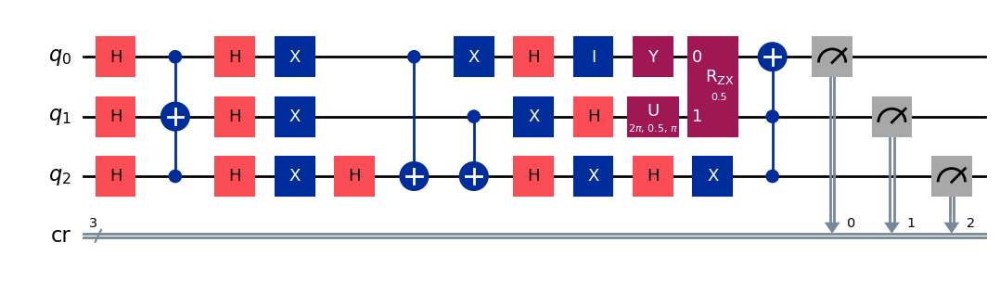

gen = 0 , Best fitness = (1.0749,)
gen = 1 , Best fitness = (1.0749,) , Number of invalids = 52

[Run 2 | Gen 2/99] Best Fitness: 1.0749 | Fidelity: 0.5266 | Gates: 31


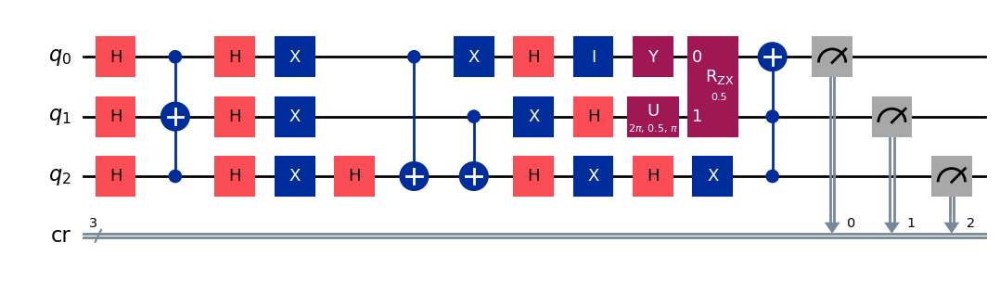

gen = 0 , Best fitness = (1.0749,)
gen = 1 , Best fitness = (1.0749,) , Number of invalids = 36

[Run 2 | Gen 3/99] Best Fitness: 1.0749 | Fidelity: 0.5256 | Gates: 31


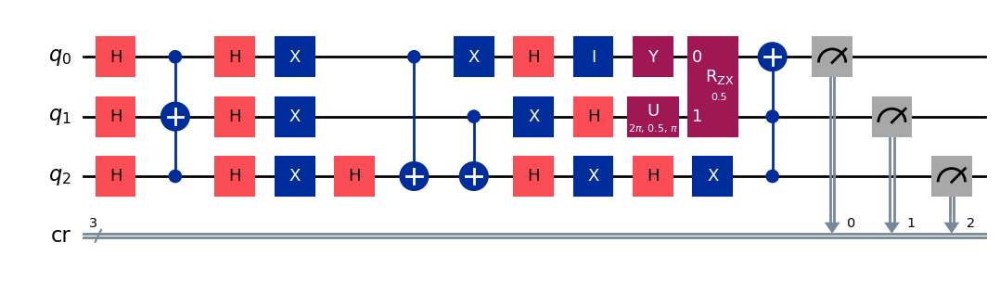

gen = 0 , Best fitness = (1.0749,)
gen = 1 , Best fitness = (1.0749,) , Number of invalids = 53

[Run 2 | Gen 4/99] Best Fitness: 1.0749 | Fidelity: 0.5398 | Gates: 31


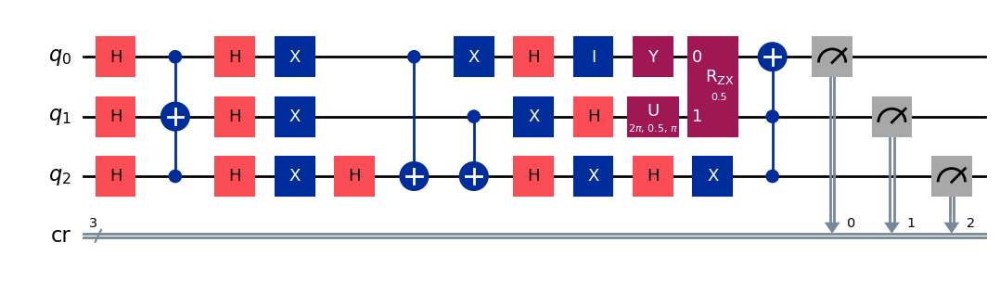

gen = 0 , Best fitness = (1.0749,)
gen = 1 , Best fitness = (0.9555,) , Number of invalids = 54

[Run 2 | Gen 5/99] Best Fitness: 0.9555 | Fidelity: 0.5765 | Gates: 27


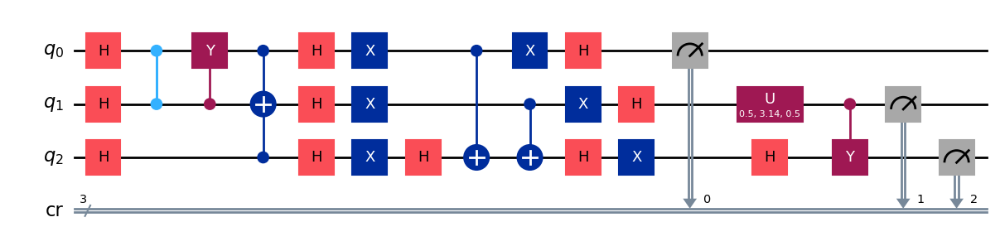

gen = 0 , Best fitness = (0.9555,)
gen = 1 , Best fitness = (0.9555,) , Number of invalids = 34

[Run 2 | Gen 6/99] Best Fitness: 0.9555 | Fidelity: 0.5770 | Gates: 27


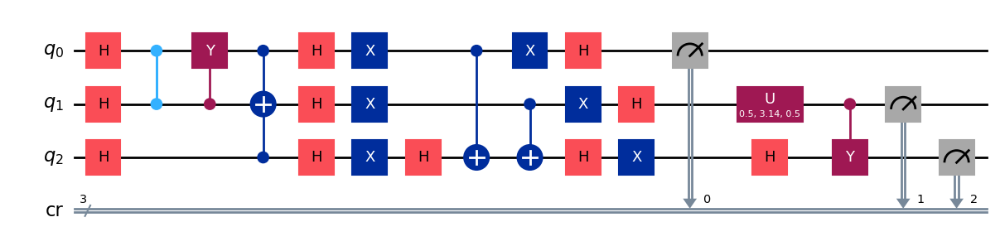

gen = 0 , Best fitness = (0.9555,)
gen = 1 , Best fitness = (0.9555,) , Number of invalids = 33

[Run 2 | Gen 7/99] Best Fitness: 0.9555 | Fidelity: 0.5810 | Gates: 27


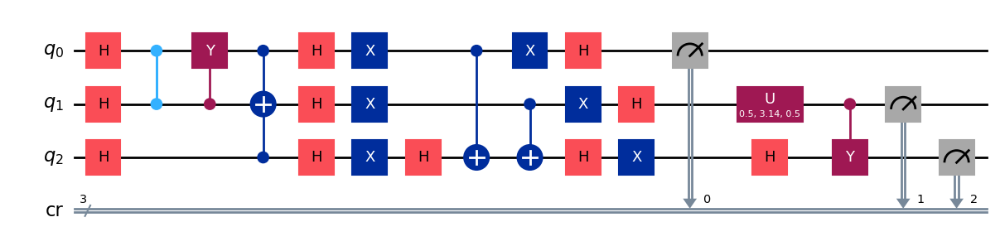

gen = 0 , Best fitness = (0.9555,)
gen = 1 , Best fitness = (0.9555,) , Number of invalids = 47

[Run 2 | Gen 8/99] Best Fitness: 0.9555 | Fidelity: 0.5814 | Gates: 27


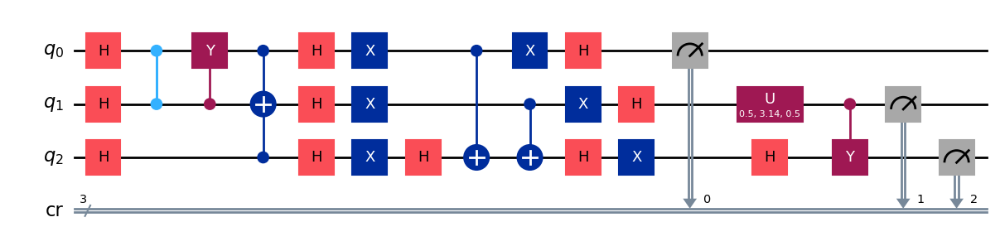

gen = 0 , Best fitness = (0.9555,)
gen = 1 , Best fitness = (0.9527,) , Number of invalids = 39

[Run 2 | Gen 9/99] Best Fitness: 0.9527 | Fidelity: 0.5871 | Gates: 27


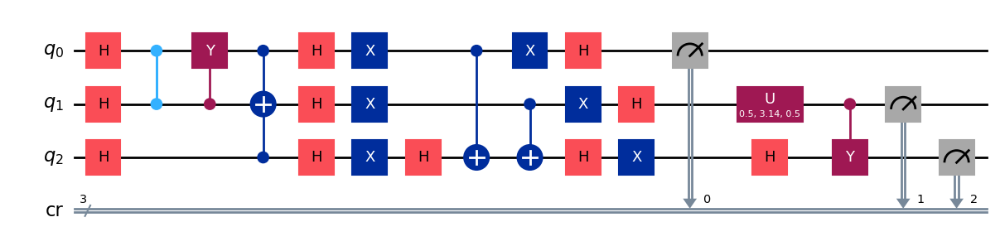

gen = 0 , Best fitness = (0.9527,)
gen = 1 , Best fitness = (0.9527,) , Number of invalids = 32

[Run 2 | Gen 10/99] Best Fitness: 0.9527 | Fidelity: 0.5816 | Gates: 27


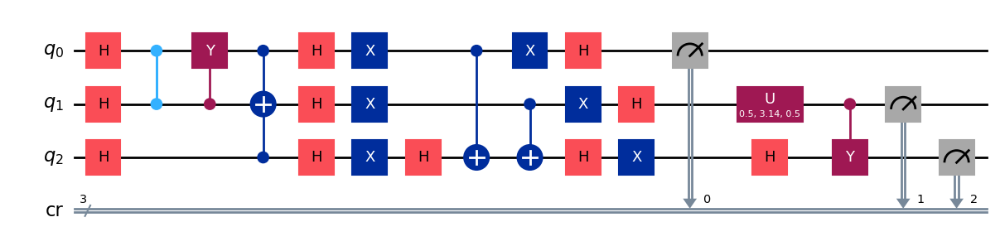

gen = 0 , Best fitness = (0.9527,)
gen = 1 , Best fitness = (0.9372,) , Number of invalids = 41

[Run 2 | Gen 11/99] Best Fitness: 0.9372 | Fidelity: 0.6078 | Gates: 27


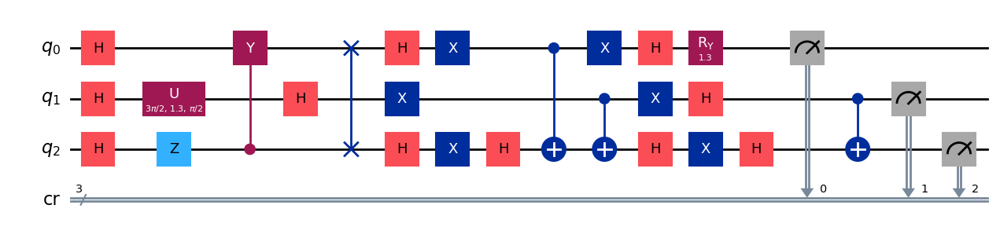

gen = 0 , Best fitness = (0.9372,)
gen = 1 , Best fitness = (0.9372,) , Number of invalids = 35

[Run 2 | Gen 12/99] Best Fitness: 0.9372 | Fidelity: 0.6073 | Gates: 27


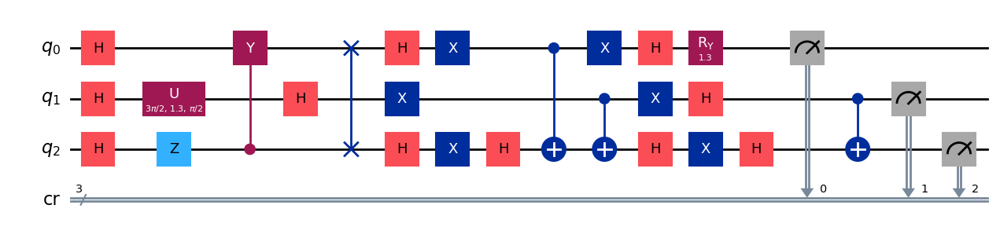

gen = 0 , Best fitness = (0.9372,)
gen = 1 , Best fitness = (0.9258000000000001,) , Number of invalids = 31

[Run 2 | Gen 13/99] Best Fitness: 0.9258 | Fidelity: 0.6001 | Gates: 27


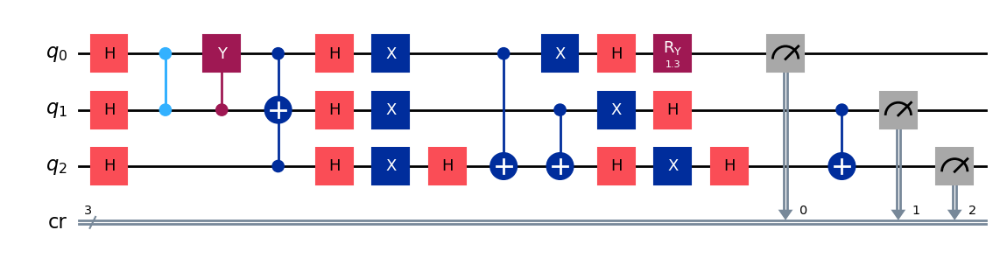

gen = 0 , Best fitness = (0.9258000000000001,)
gen = 1 , Best fitness = (0.9258000000000001,) , Number of invalids = 24

[Run 2 | Gen 14/99] Best Fitness: 0.9258 | Fidelity: 0.5996 | Gates: 27


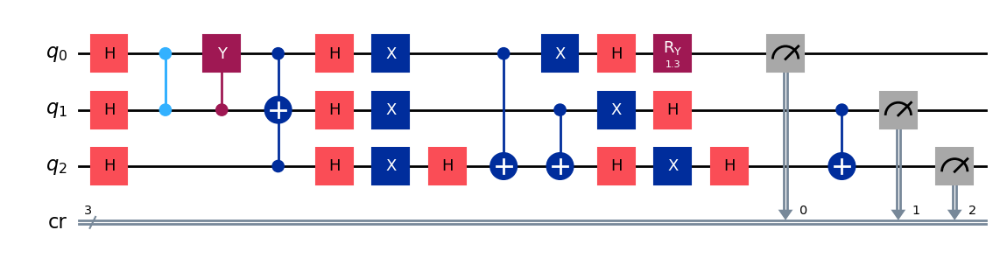

gen = 0 , Best fitness = (0.9258000000000001,)
gen = 1 , Best fitness = (0.9162,) , Number of invalids = 25

[Run 2 | Gen 15/99] Best Fitness: 0.9162 | Fidelity: 0.6144 | Gates: 27


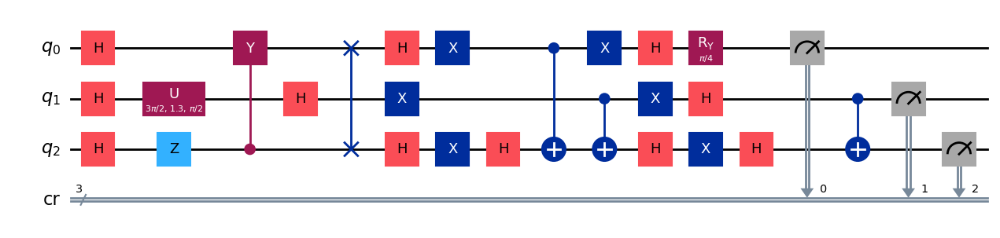

gen = 0 , Best fitness = (0.9162,)
gen = 1 , Best fitness = (0.9162,) , Number of invalids = 23

[Run 2 | Gen 16/99] Best Fitness: 0.9162 | Fidelity: 0.6216 | Gates: 27


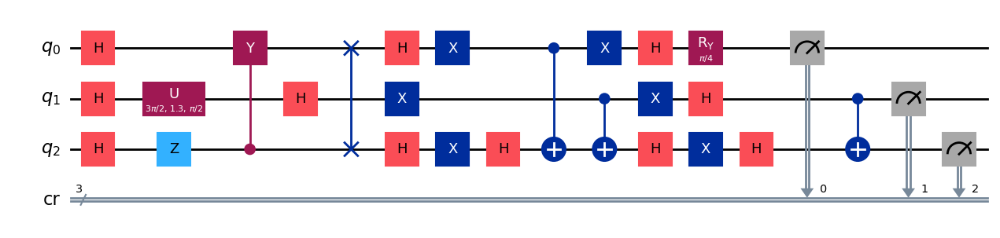

gen = 0 , Best fitness = (0.9162,)
gen = 1 , Best fitness = (0.9162,) , Number of invalids = 17

[Run 2 | Gen 17/99] Best Fitness: 0.9162 | Fidelity: 0.6213 | Gates: 27


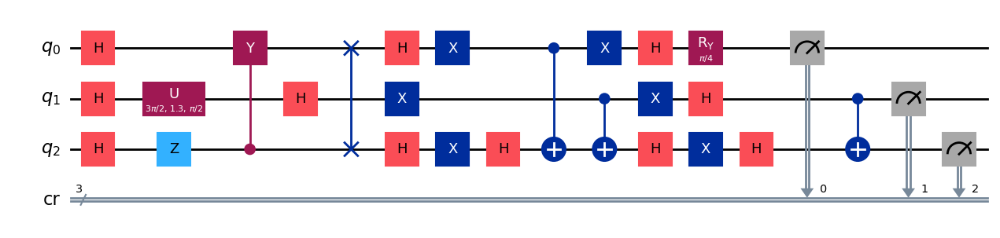

gen = 0 , Best fitness = (0.9162,)
gen = 1 , Best fitness = (0.9162,) , Number of invalids = 13

[Run 2 | Gen 18/99] Best Fitness: 0.9162 | Fidelity: 0.6282 | Gates: 27


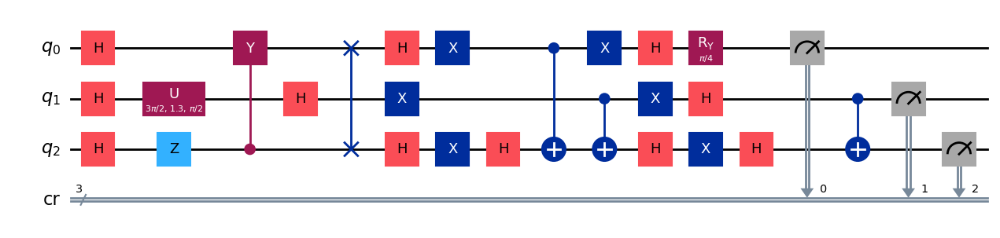

gen = 0 , Best fitness = (0.9162,)
gen = 1 , Best fitness = (0.9024000000000001,) , Number of invalids = 15

[Run 2 | Gen 19/99] Best Fitness: 0.9024 | Fidelity: 0.6215 | Gates: 27


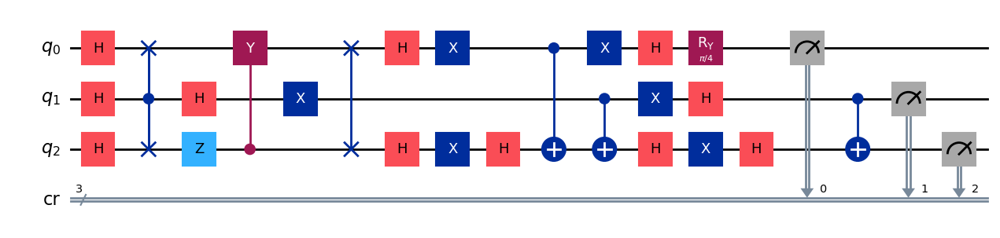

gen = 0 , Best fitness = (0.9024000000000001,)
gen = 1 , Best fitness = (0.9024000000000001,) , Number of invalids = 8

[Run 2 | Gen 20/99] Best Fitness: 0.9024 | Fidelity: 0.6242 | Gates: 27


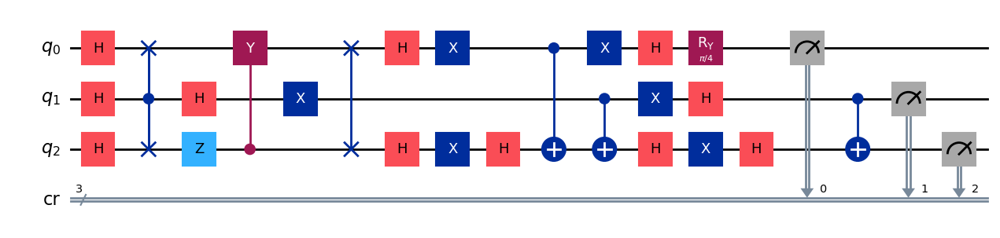

gen = 0 , Best fitness = (0.9024000000000001,)
gen = 1 , Best fitness = (0.9024000000000001,) , Number of invalids = 8

[Run 2 | Gen 21/99] Best Fitness: 0.9024 | Fidelity: 0.6251 | Gates: 27


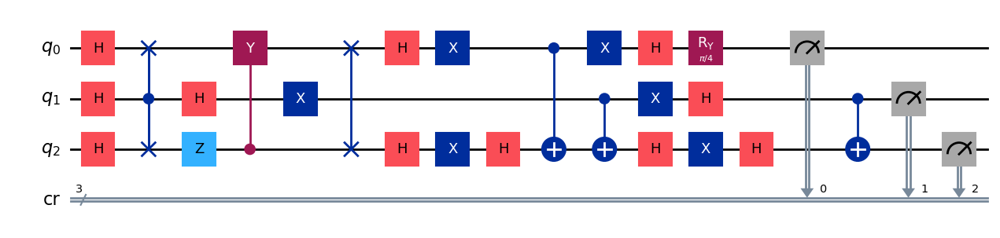

gen = 0 , Best fitness = (0.9024000000000001,)
gen = 1 , Best fitness = (0.8826999999999999,) , Number of invalids = 7

[Run 2 | Gen 22/99] Best Fitness: 0.8827 | Fidelity: 0.7042 | Gates: 29


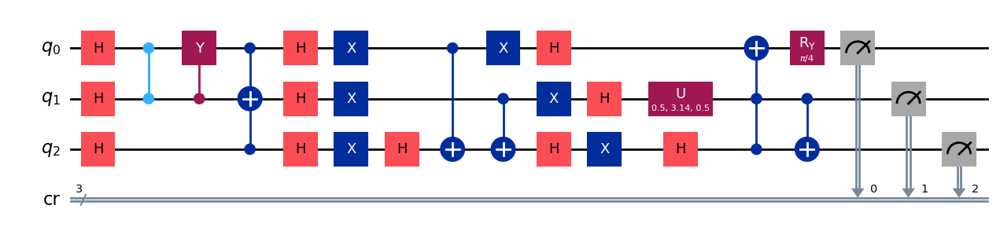

gen = 0 , Best fitness = (0.8826999999999999,)
gen = 1 , Best fitness = (0.8826999999999999,) , Number of invalids = 7

[Run 2 | Gen 23/99] Best Fitness: 0.8827 | Fidelity: 0.7020 | Gates: 29


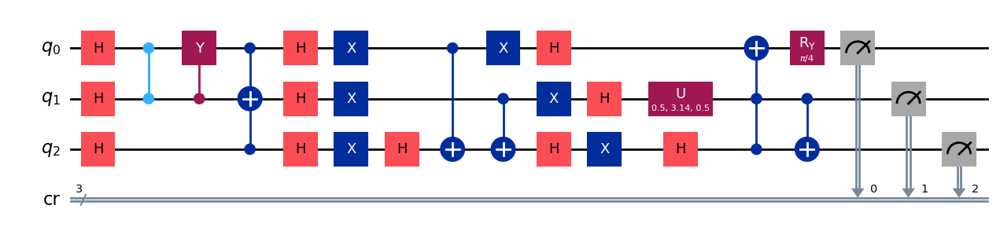

gen = 0 , Best fitness = (0.8826999999999999,)
gen = 1 , Best fitness = (0.8783000000000001,) , Number of invalids = 6

[Run 2 | Gen 24/99] Best Fitness: 0.8783 | Fidelity: 0.6786 | Gates: 28


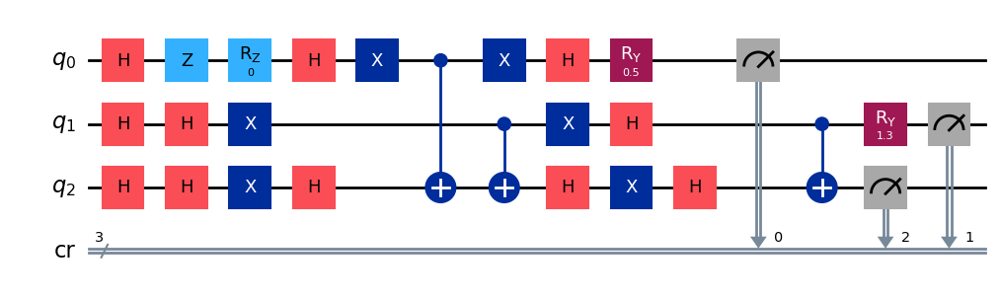

gen = 0 , Best fitness = (0.8783000000000001,)
gen = 1 , Best fitness = (0.8439000000000001,) , Number of invalids = 1

[Run 2 | Gen 25/99] Best Fitness: 0.8439 | Fidelity: 0.7164 | Gates: 28


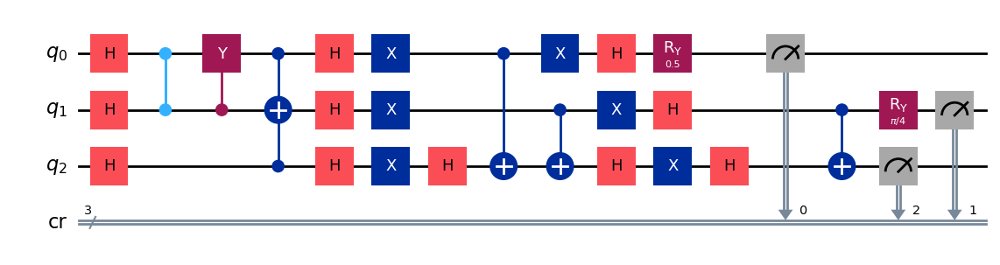

gen = 0 , Best fitness = (0.8439000000000001,)
gen = 1 , Best fitness = (0.8428000000000001,) , Number of invalids = 1

[Run 2 | Gen 26/99] Best Fitness: 0.8428 | Fidelity: 0.7210 | Gates: 28


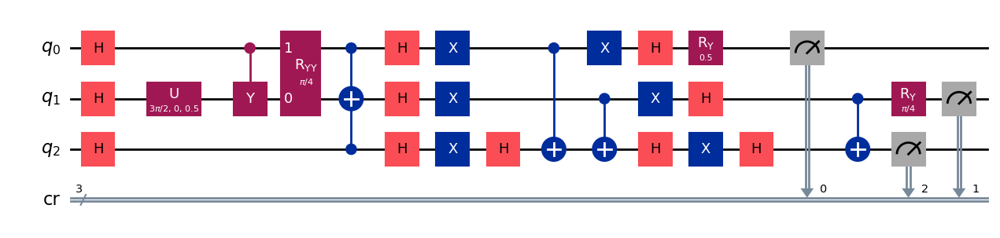

gen = 0 , Best fitness = (0.8428000000000001,)
gen = 1 , Best fitness = (0.8399000000000001,) , Number of invalids = 1

[Run 2 | Gen 27/99] Best Fitness: 0.8399 | Fidelity: 0.7119 | Gates: 28


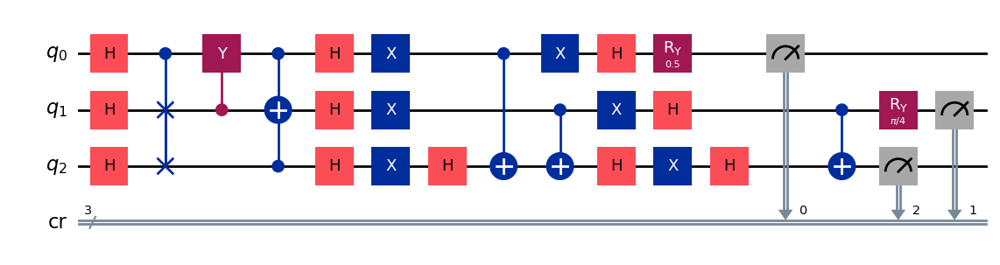

gen = 0 , Best fitness = (0.8399000000000001,)
gen = 1 , Best fitness = (0.8399000000000001,) , Number of invalids = 0

[Run 2 | Gen 28/99] Best Fitness: 0.8399 | Fidelity: 0.7111 | Gates: 28


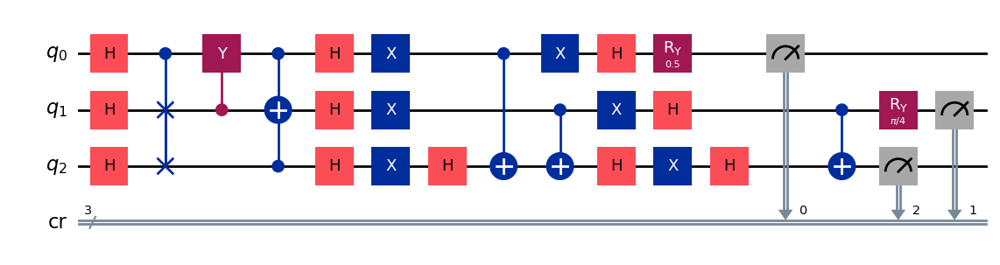

gen = 0 , Best fitness = (0.8399000000000001,)
gen = 1 , Best fitness = (0.8399000000000001,) , Number of invalids = 0

[Run 2 | Gen 29/99] Best Fitness: 0.8399 | Fidelity: 0.7098 | Gates: 28


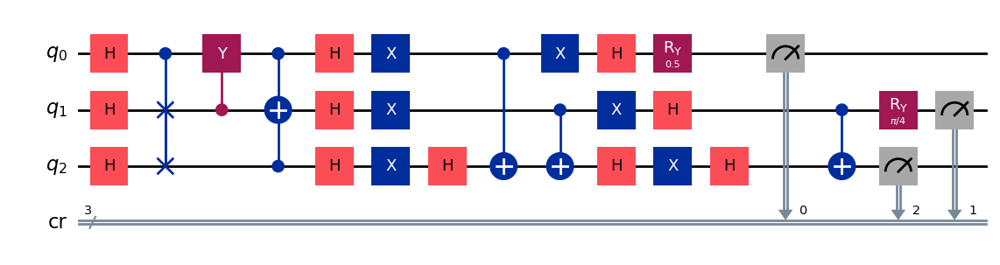

gen = 0 , Best fitness = (0.8399000000000001,)
gen = 1 , Best fitness = (0.8399000000000001,) , Number of invalids = 0

[Run 2 | Gen 30/99] Best Fitness: 0.8399 | Fidelity: 0.7018 | Gates: 28


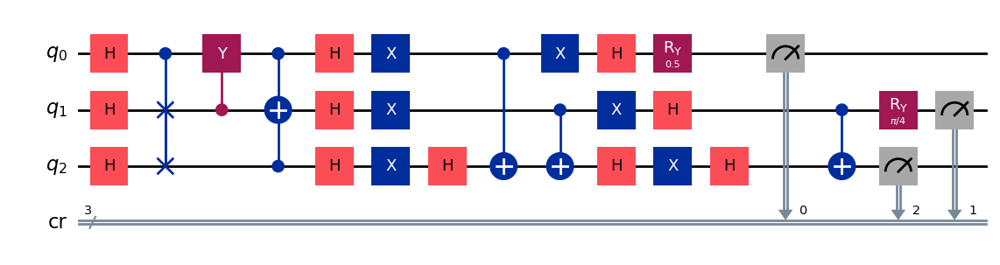

gen = 0 , Best fitness = (0.8399000000000001,)
gen = 1 , Best fitness = (0.8379000000000001,) , Number of invalids = 0

[Run 2 | Gen 31/99] Best Fitness: 0.8379 | Fidelity: 0.7055 | Gates: 28


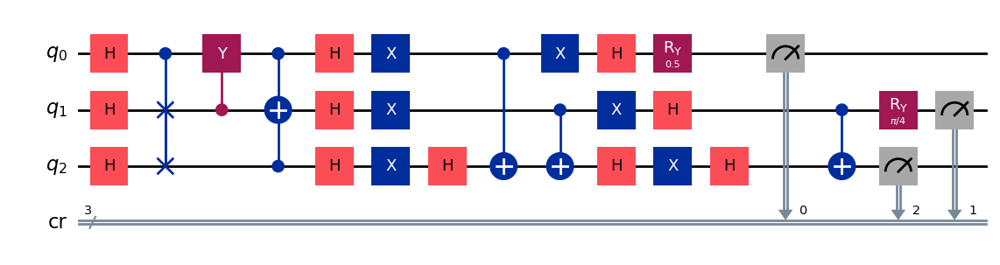

gen = 0 , Best fitness = (0.8379000000000001,)
gen = 1 , Best fitness = (0.8379000000000001,) , Number of invalids = 0

[Run 2 | Gen 32/99] Best Fitness: 0.8379 | Fidelity: 0.7082 | Gates: 28


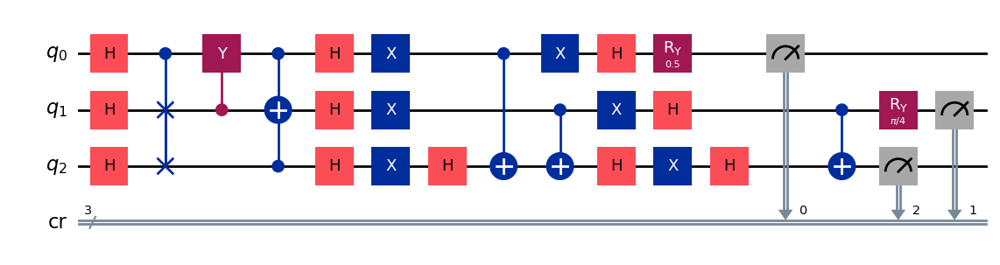

gen = 0 , Best fitness = (0.8379000000000001,)
gen = 1 , Best fitness = (0.8119999999999999,) , Number of invalids = 0

[Run 2 | Gen 33/99] Best Fitness: 0.8120 | Fidelity: 0.7729 | Gates: 29


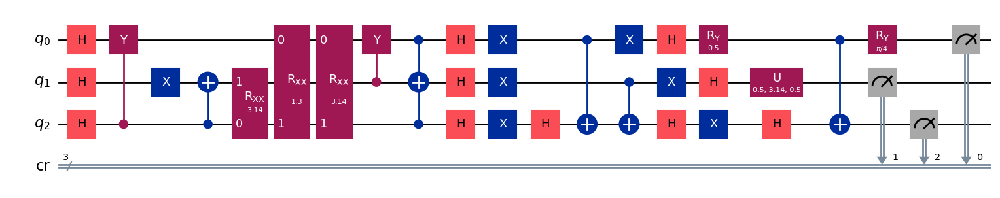

gen = 0 , Best fitness = (0.8119999999999999,)
gen = 1 , Best fitness = (0.8114,) , Number of invalids = 0

[Run 2 | Gen 34/99] Best Fitness: 0.8114 | Fidelity: 0.7848 | Gates: 29


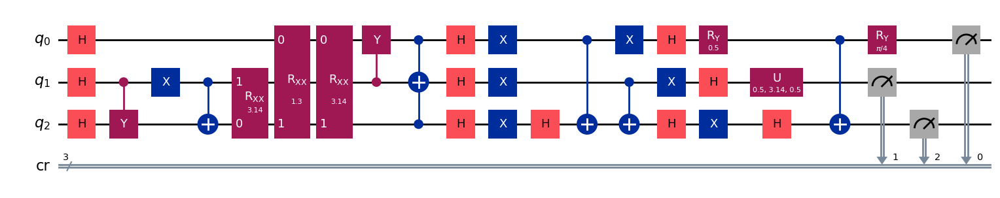

gen = 0 , Best fitness = (0.8114,)
gen = 1 , Best fitness = (0.8114,) , Number of invalids = 1

[Run 2 | Gen 35/99] Best Fitness: 0.8114 | Fidelity: 0.7767 | Gates: 29


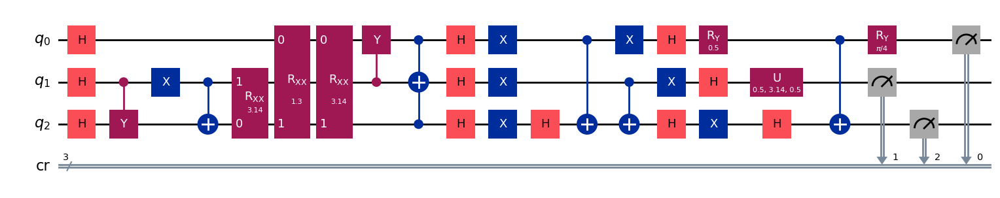

gen = 0 , Best fitness = (0.8114,)
gen = 1 , Best fitness = (0.8066,) , Number of invalids = 0

[Run 2 | Gen 36/99] Best Fitness: 0.8066 | Fidelity: 0.7722 | Gates: 29


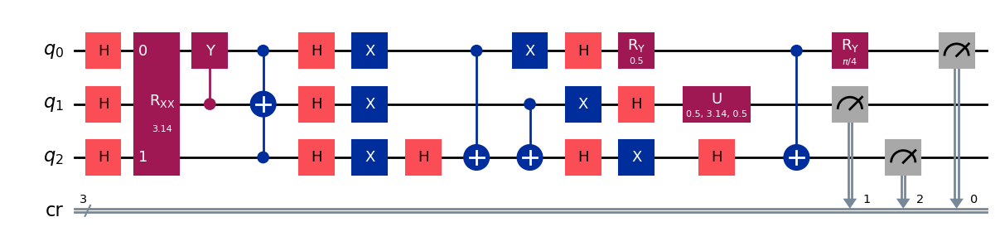

gen = 0 , Best fitness = (0.8066,)
gen = 1 , Best fitness = (0.8010999999999999,) , Number of invalids = 0

[Run 2 | Gen 37/99] Best Fitness: 0.8011 | Fidelity: 0.7778 | Gates: 29


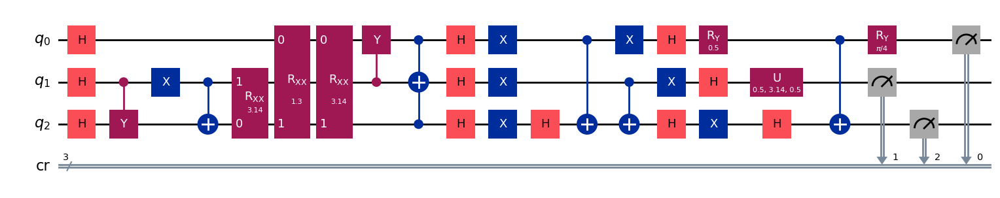

gen = 0 , Best fitness = (0.8010999999999999,)
gen = 1 , Best fitness = (0.7886,) , Number of invalids = 0

[Run 2 | Gen 38/99] Best Fitness: 0.7886 | Fidelity: 0.7860 | Gates: 29


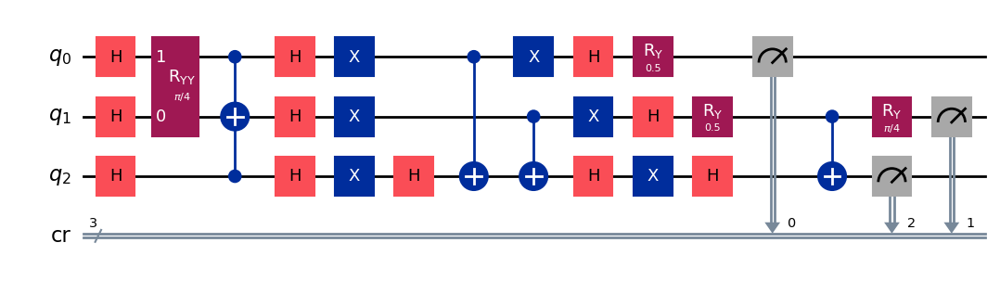

gen = 0 , Best fitness = (0.7886,)
gen = 1 , Best fitness = (0.7886,) , Number of invalids = 0

[Run 2 | Gen 39/99] Best Fitness: 0.7886 | Fidelity: 0.7907 | Gates: 29


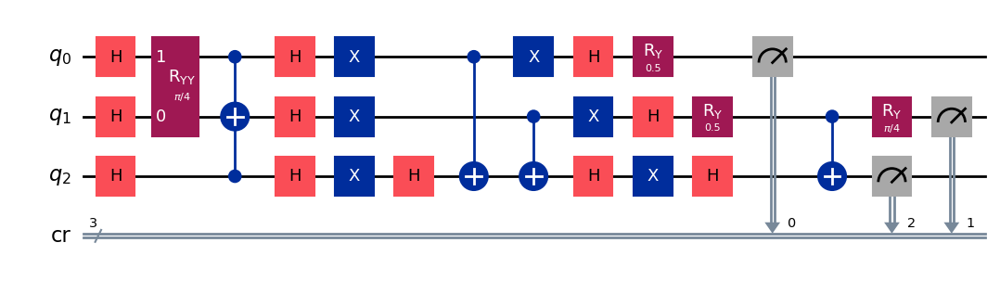

gen = 0 , Best fitness = (0.7886,)
gen = 1 , Best fitness = (0.7886,) , Number of invalids = 0

[Run 2 | Gen 40/99] Best Fitness: 0.7886 | Fidelity: 0.7888 | Gates: 29


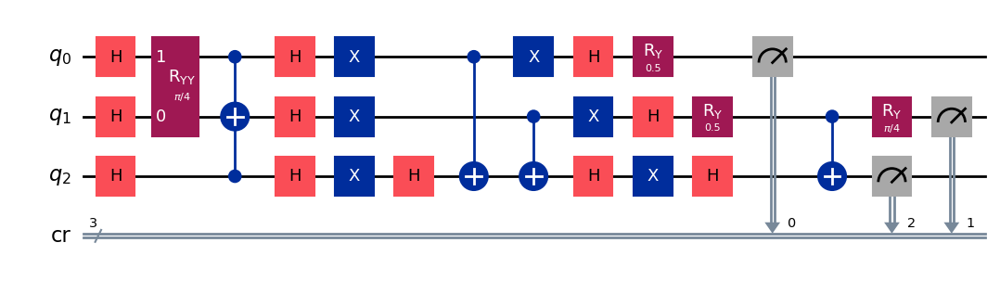

gen = 0 , Best fitness = (0.7886,)
gen = 1 , Best fitness = (0.7870999999999999,) , Number of invalids = 0

[Run 2 | Gen 41/99] Best Fitness: 0.7871 | Fidelity: 0.7903 | Gates: 29


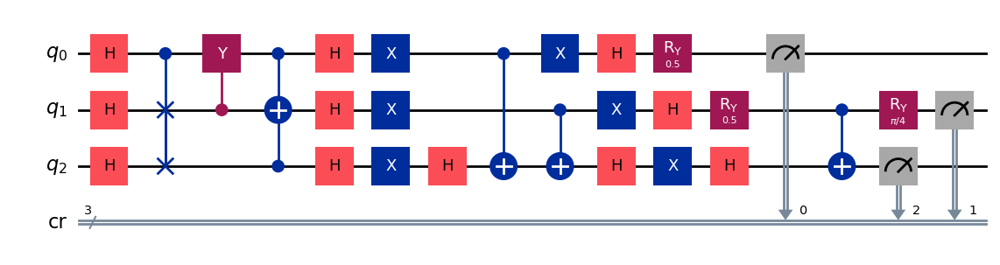

gen = 0 , Best fitness = (0.7870999999999999,)
gen = 1 , Best fitness = (0.7805,) , Number of invalids = 0

[Run 2 | Gen 42/99] Best Fitness: 0.7805 | Fidelity: 0.7917 | Gates: 29


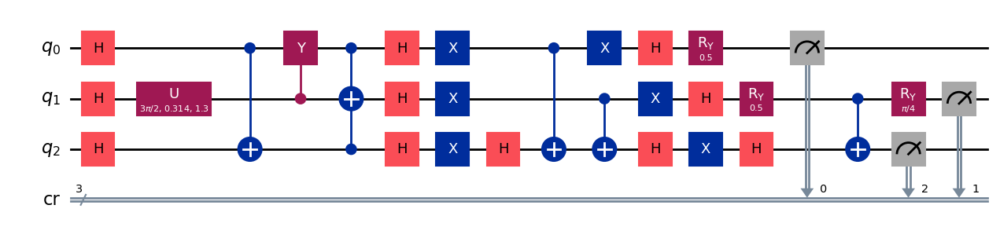

gen = 0 , Best fitness = (0.7805,)
gen = 1 , Best fitness = (0.7805,) , Number of invalids = 0

[Run 2 | Gen 43/99] Best Fitness: 0.7805 | Fidelity: 0.7837 | Gates: 29


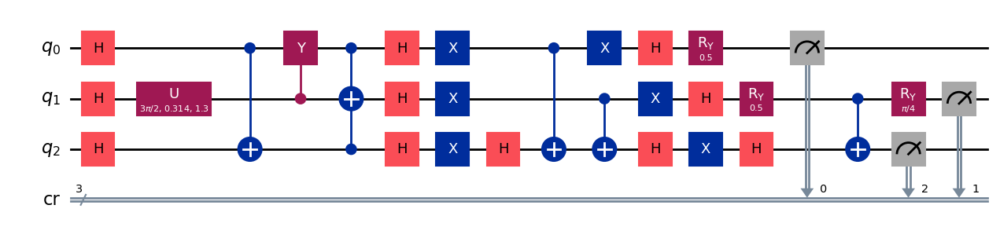

gen = 0 , Best fitness = (0.7805,)
gen = 1 , Best fitness = (0.7805,) , Number of invalids = 0

[Run 2 | Gen 44/99] Best Fitness: 0.7805 | Fidelity: 0.7878 | Gates: 29


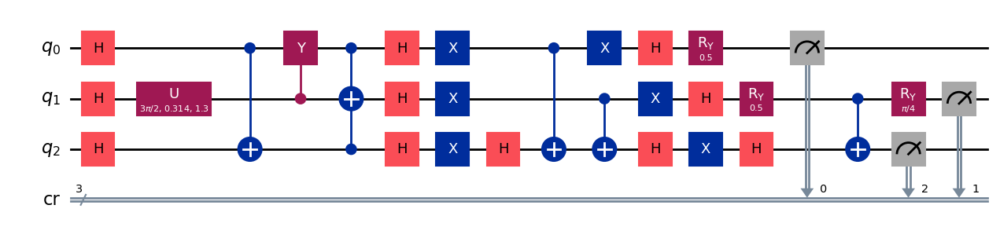

gen = 0 , Best fitness = (0.7805,)
gen = 1 , Best fitness = (0.7805,) , Number of invalids = 0

[Run 2 | Gen 45/99] Best Fitness: 0.7805 | Fidelity: 0.7874 | Gates: 29


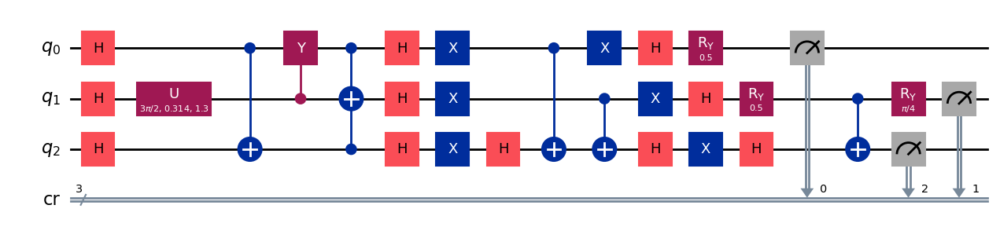

gen = 0 , Best fitness = (0.7805,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 46/99] Best Fitness: 0.7740 | Fidelity: 0.8249 | Gates: 30


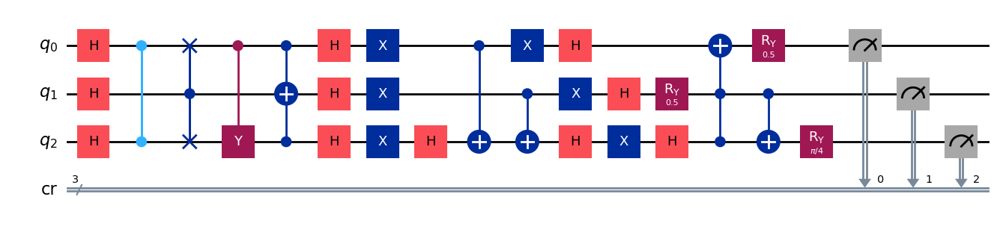

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 47/99] Best Fitness: 0.7740 | Fidelity: 0.8165 | Gates: 30


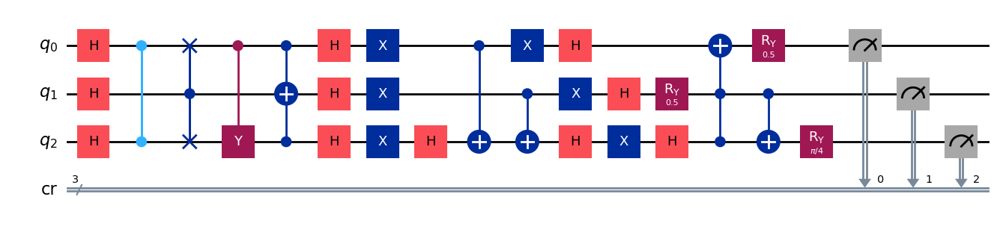

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 48/99] Best Fitness: 0.7740 | Fidelity: 0.8152 | Gates: 30


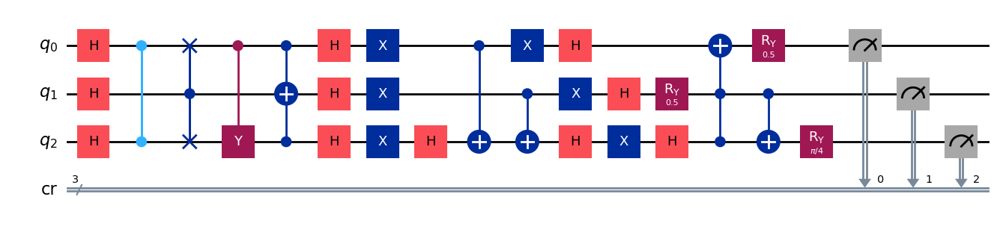

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 49/99] Best Fitness: 0.7740 | Fidelity: 0.8204 | Gates: 30


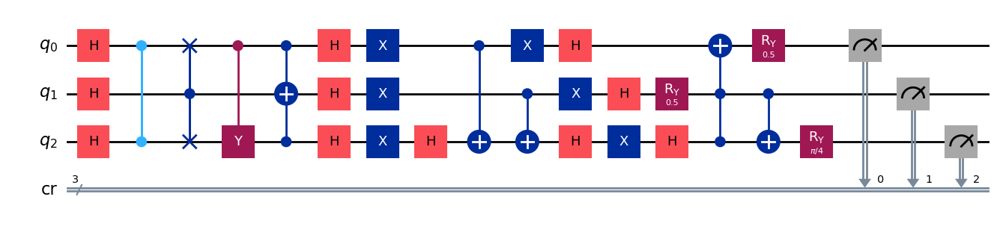

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 50/99] Best Fitness: 0.7740 | Fidelity: 0.8224 | Gates: 30


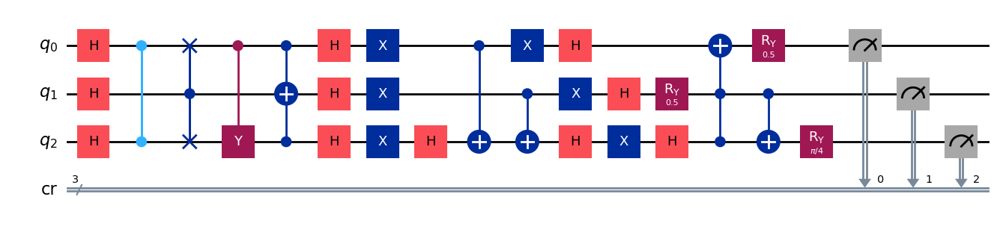

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 51/99] Best Fitness: 0.7740 | Fidelity: 0.8145 | Gates: 30


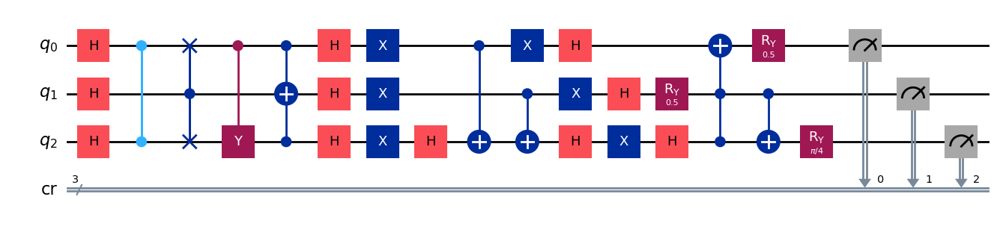

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 52/99] Best Fitness: 0.7740 | Fidelity: 0.8220 | Gates: 30


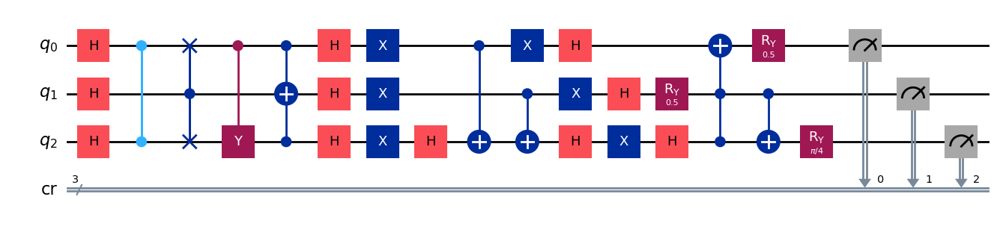

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 53/99] Best Fitness: 0.7740 | Fidelity: 0.8187 | Gates: 30


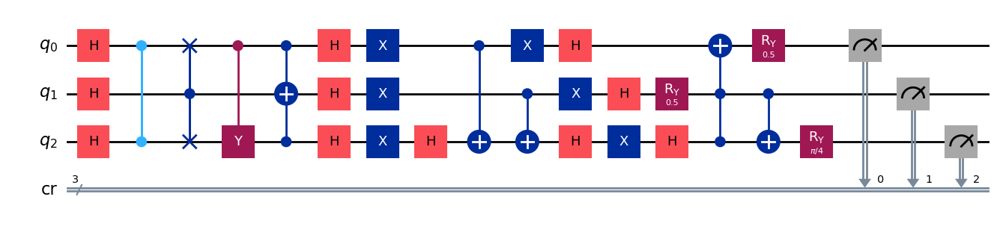

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 54/99] Best Fitness: 0.7740 | Fidelity: 0.8221 | Gates: 30


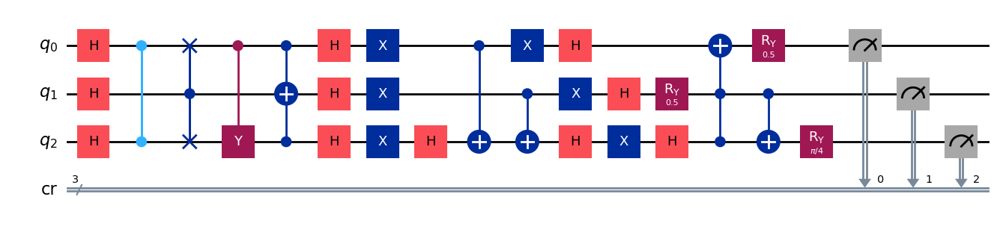

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 55/99] Best Fitness: 0.7740 | Fidelity: 0.8147 | Gates: 30


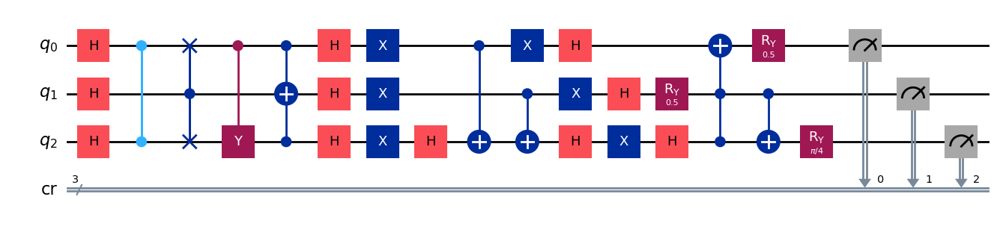

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 56/99] Best Fitness: 0.7740 | Fidelity: 0.8180 | Gates: 30


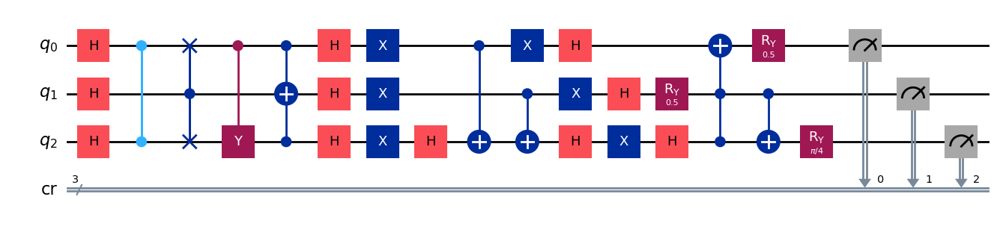

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 57/99] Best Fitness: 0.7740 | Fidelity: 0.8142 | Gates: 30


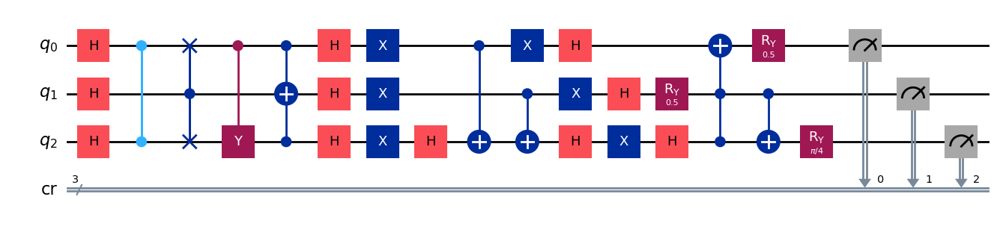

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.774,) , Number of invalids = 0

[Run 2 | Gen 58/99] Best Fitness: 0.7740 | Fidelity: 0.8179 | Gates: 30


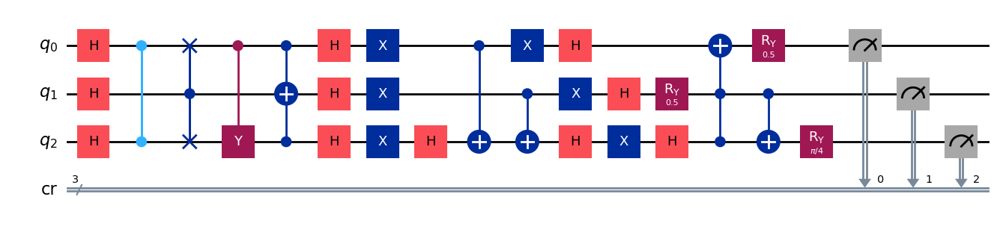

gen = 0 , Best fitness = (0.774,)
gen = 1 , Best fitness = (0.7734,) , Number of invalids = 0

[Run 2 | Gen 59/99] Best Fitness: 0.7734 | Fidelity: 0.8206 | Gates: 30


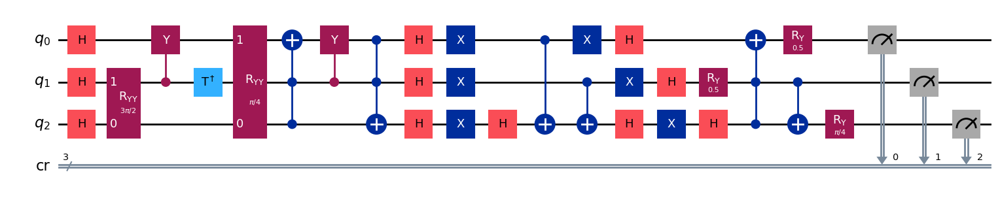

gen = 0 , Best fitness = (0.7734,)
gen = 1 , Best fitness = (0.7372,) , Number of invalids = 0

[Run 2 | Gen 60/99] Best Fitness: 0.7372 | Fidelity: 0.8632 | Gates: 30


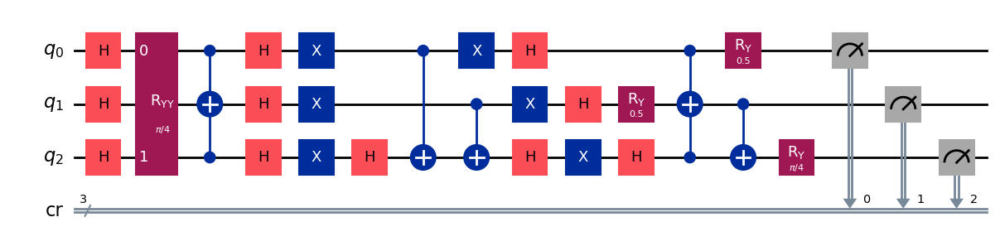

gen = 0 , Best fitness = (0.7372,)
gen = 1 , Best fitness = (0.7372,) , Number of invalids = 0

[Run 2 | Gen 61/99] Best Fitness: 0.7372 | Fidelity: 0.8645 | Gates: 30


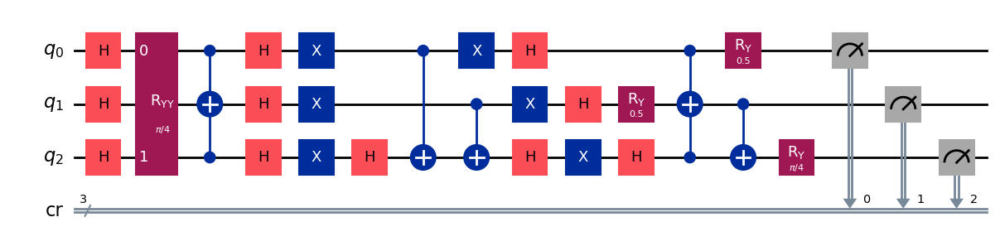

gen = 0 , Best fitness = (0.7372,)
gen = 1 , Best fitness = (0.7372,) , Number of invalids = 0

[Run 2 | Gen 62/99] Best Fitness: 0.7372 | Fidelity: 0.8672 | Gates: 30


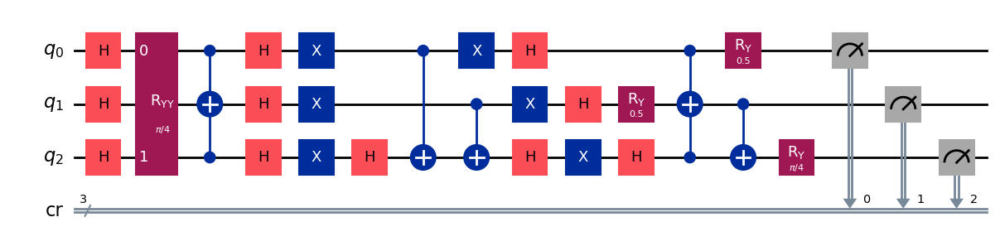

gen = 0 , Best fitness = (0.7372,)
gen = 1 , Best fitness = (0.734,) , Number of invalids = 0

[Run 2 | Gen 63/99] Best Fitness: 0.7340 | Fidelity: 0.8635 | Gates: 30


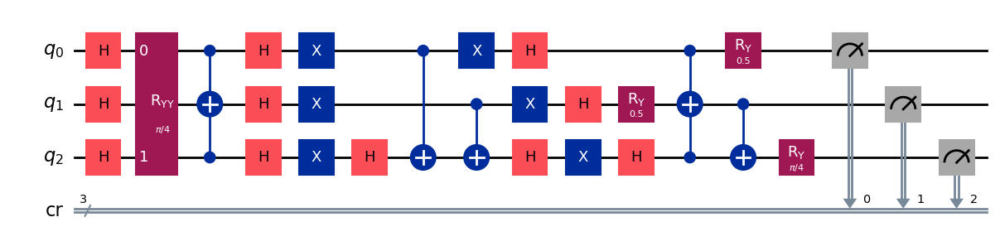

gen = 0 , Best fitness = (0.734,)
gen = 1 , Best fitness = (0.734,) , Number of invalids = 0

[Run 2 | Gen 64/99] Best Fitness: 0.7340 | Fidelity: 0.8654 | Gates: 30


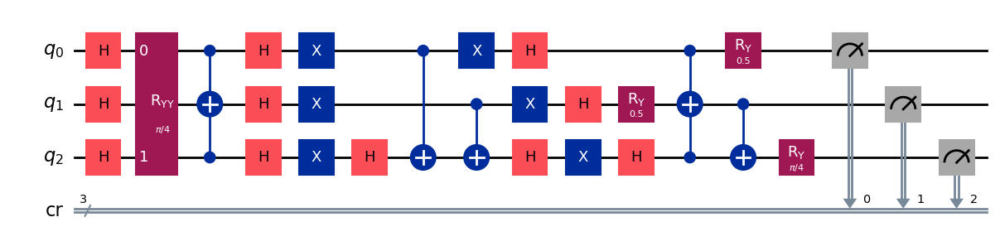

gen = 0 , Best fitness = (0.734,)
gen = 1 , Best fitness = (0.7338,) , Number of invalids = 0

[Run 2 | Gen 65/99] Best Fitness: 0.7338 | Fidelity: 0.8616 | Gates: 30


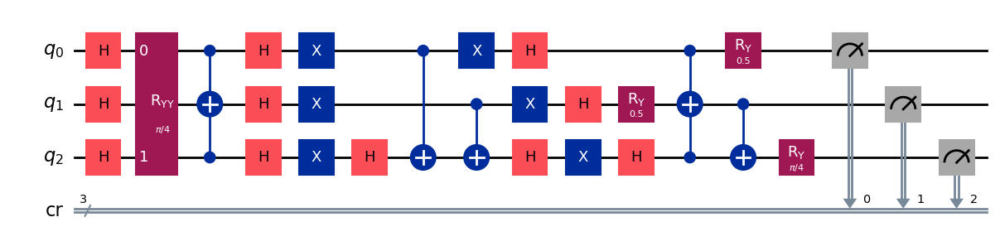

gen = 0 , Best fitness = (0.7338,)
gen = 1 , Best fitness = (0.7309,) , Number of invalids = 0

[Run 2 | Gen 66/99] Best Fitness: 0.7309 | Fidelity: 0.8658 | Gates: 30


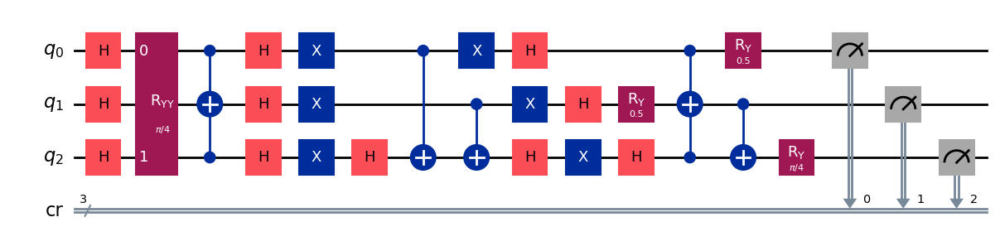

gen = 0 , Best fitness = (0.7309,)
gen = 1 , Best fitness = (0.7309,) , Number of invalids = 0

[Run 2 | Gen 67/99] Best Fitness: 0.7309 | Fidelity: 0.8645 | Gates: 30


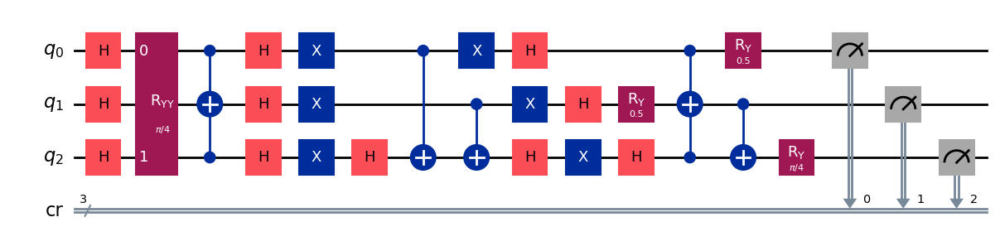

gen = 0 , Best fitness = (0.7309,)
gen = 1 , Best fitness = (0.7309,) , Number of invalids = 0

[Run 2 | Gen 68/99] Best Fitness: 0.7309 | Fidelity: 0.8608 | Gates: 30


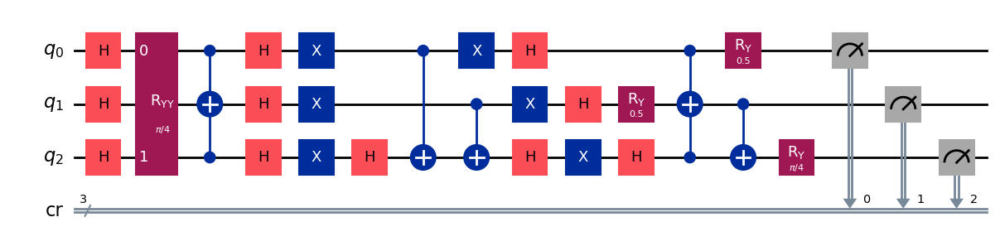

gen = 0 , Best fitness = (0.7309,)
gen = 1 , Best fitness = (0.7101999999999999,) , Number of invalids = 0

[Run 2 | Gen 69/99] Best Fitness: 0.7102 | Fidelity: 0.8883 | Gates: 30


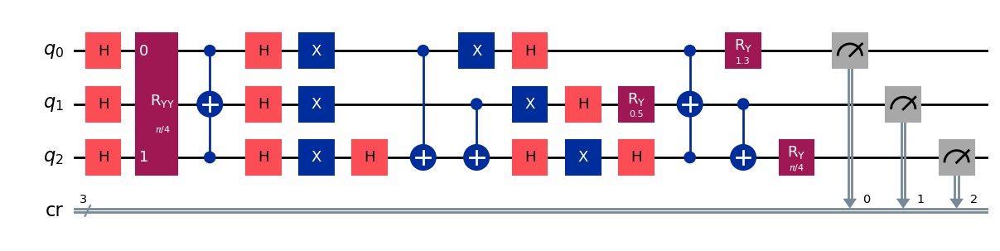

gen = 0 , Best fitness = (0.7101999999999999,)
gen = 1 , Best fitness = (0.7101999999999999,) , Number of invalids = 0

[Run 2 | Gen 70/99] Best Fitness: 0.7102 | Fidelity: 0.8884 | Gates: 30


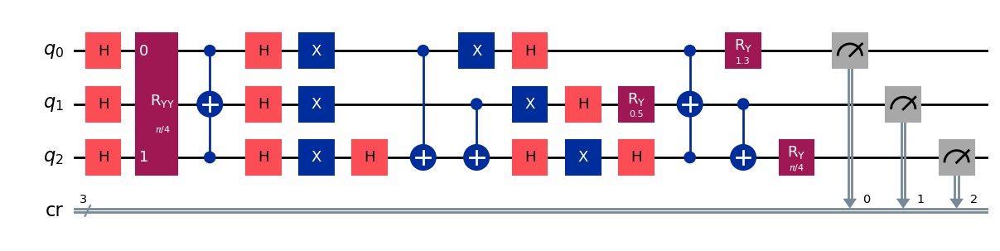

gen = 0 , Best fitness = (0.7101999999999999,)
gen = 1 , Best fitness = (0.7101999999999999,) , Number of invalids = 0

[Run 2 | Gen 71/99] Best Fitness: 0.7102 | Fidelity: 0.8912 | Gates: 30


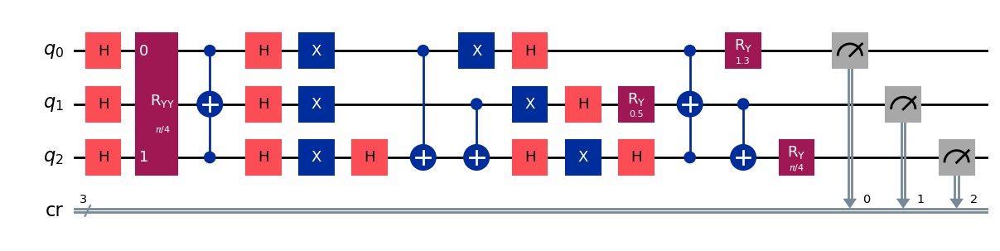

gen = 0 , Best fitness = (0.7101999999999999,)
gen = 1 , Best fitness = (0.708,) , Number of invalids = 0

[Run 2 | Gen 72/99] Best Fitness: 0.7080 | Fidelity: 0.8884 | Gates: 30


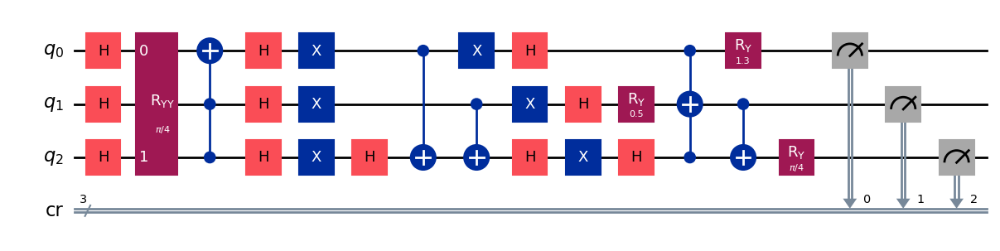

gen = 0 , Best fitness = (0.708,)
gen = 1 , Best fitness = (0.708,) , Number of invalids = 0

[Run 2 | Gen 73/99] Best Fitness: 0.7080 | Fidelity: 0.8895 | Gates: 30


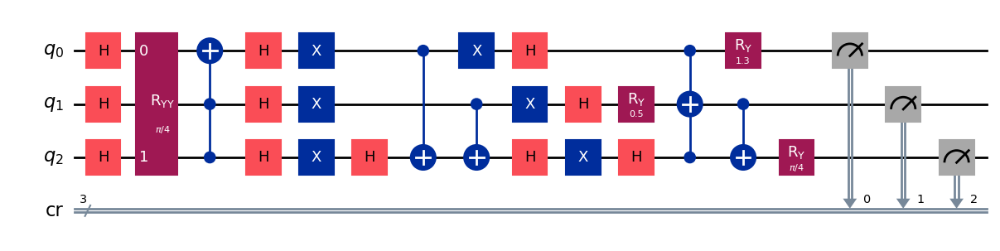

gen = 0 , Best fitness = (0.708,)
gen = 1 , Best fitness = (0.7078,) , Number of invalids = 0

[Run 2 | Gen 74/99] Best Fitness: 0.7078 | Fidelity: 0.8920 | Gates: 30


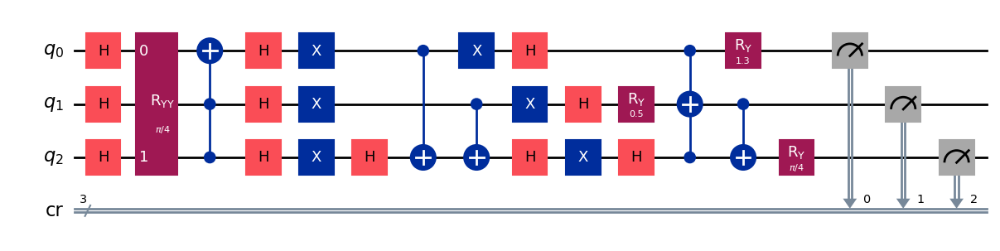

gen = 0 , Best fitness = (0.7078,)
gen = 1 , Best fitness = (0.7061,) , Number of invalids = 0

[Run 2 | Gen 75/99] Best Fitness: 0.7061 | Fidelity: 0.8930 | Gates: 30


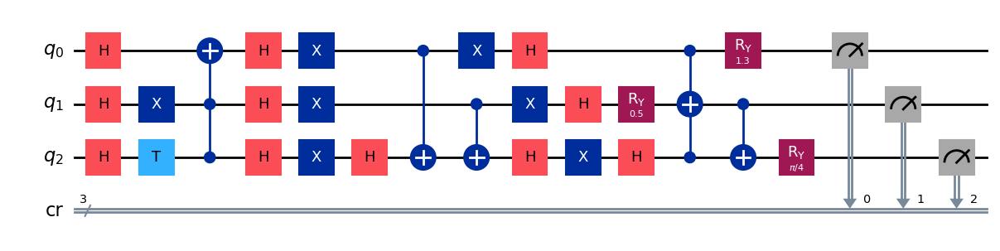

gen = 0 , Best fitness = (0.7061,)
gen = 1 , Best fitness = (0.7061,) , Number of invalids = 0

[Run 2 | Gen 76/99] Best Fitness: 0.7061 | Fidelity: 0.8893 | Gates: 30


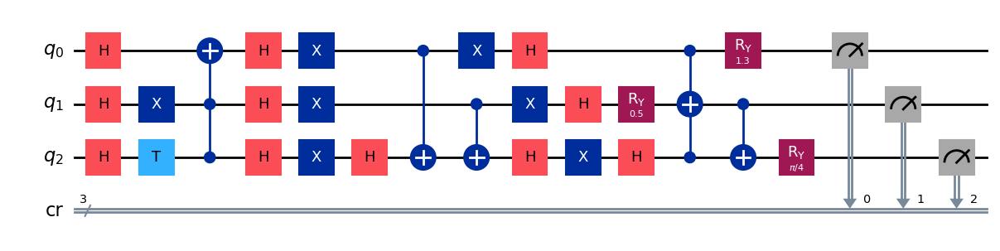

gen = 0 , Best fitness = (0.7061,)
gen = 1 , Best fitness = (0.7061,) , Number of invalids = 0

[Run 2 | Gen 77/99] Best Fitness: 0.7061 | Fidelity: 0.8910 | Gates: 30


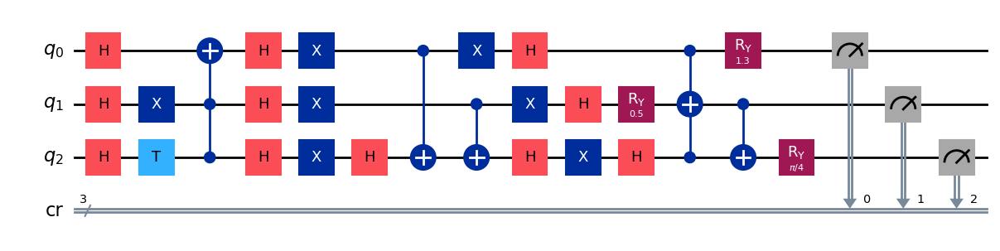

gen = 0 , Best fitness = (0.7061,)
gen = 1 , Best fitness = (0.7061,) , Number of invalids = 0

[Run 2 | Gen 78/99] Best Fitness: 0.7061 | Fidelity: 0.8966 | Gates: 30


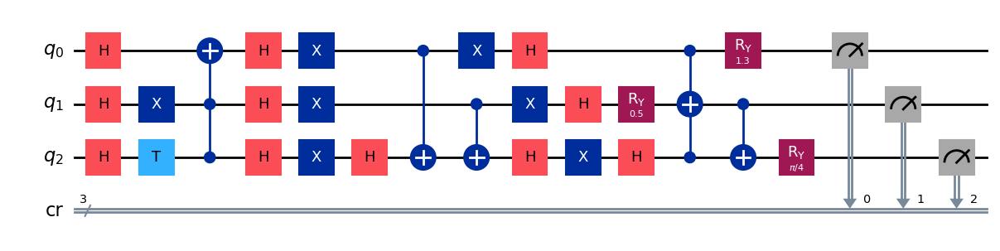

gen = 0 , Best fitness = (0.7061,)
gen = 1 , Best fitness = (0.7061,) , Number of invalids = 0

[Run 2 | Gen 79/99] Best Fitness: 0.7061 | Fidelity: 0.8897 | Gates: 30


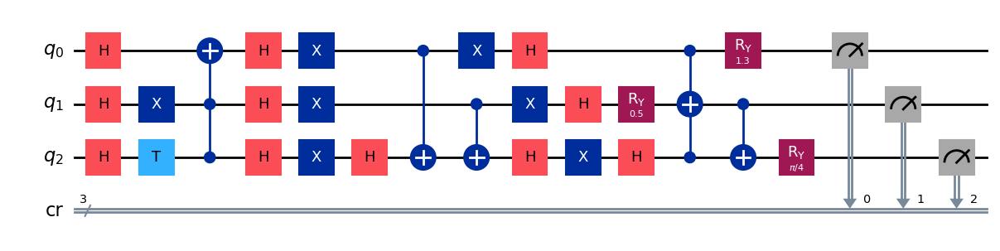

gen = 0 , Best fitness = (0.7061,)
gen = 1 , Best fitness = (0.7044,) , Number of invalids = 0

[Run 2 | Gen 80/99] Best Fitness: 0.7044 | Fidelity: 0.8869 | Gates: 30


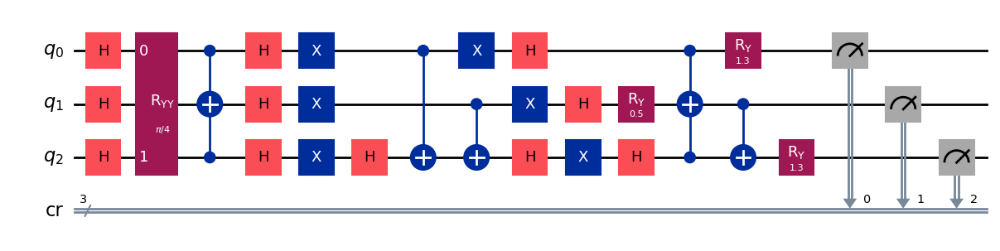

gen = 0 , Best fitness = (0.7044,)
gen = 1 , Best fitness = (0.6974,) , Number of invalids = 0

[Run 2 | Gen 81/99] Best Fitness: 0.6974 | Fidelity: 0.9074 | Gates: 30


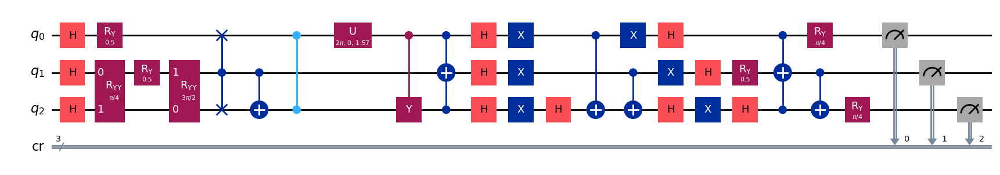

gen = 0 , Best fitness = (0.6974,)
gen = 1 , Best fitness = (0.6974,) , Number of invalids = 0

[Run 2 | Gen 82/99] Best Fitness: 0.6974 | Fidelity: 0.9031 | Gates: 30


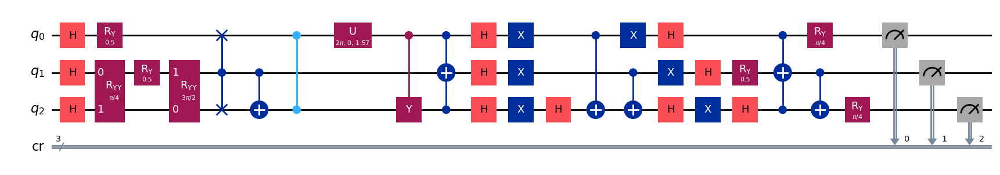

gen = 0 , Best fitness = (0.6974,)
gen = 1 , Best fitness = (0.6974,) , Number of invalids = 0

[Run 2 | Gen 83/99] Best Fitness: 0.6974 | Fidelity: 0.9104 | Gates: 30


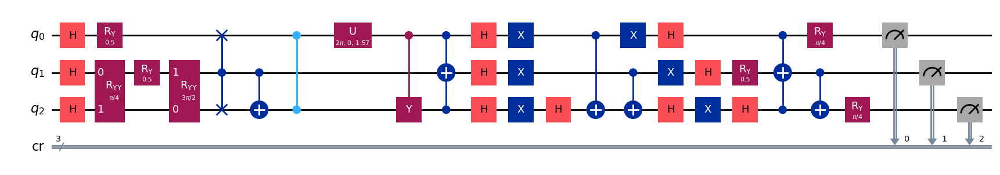

gen = 0 , Best fitness = (0.6974,)
gen = 1 , Best fitness = (0.6941999999999999,) , Number of invalids = 0

[Run 2 | Gen 84/99] Best Fitness: 0.6942 | Fidelity: 0.9079 | Gates: 30


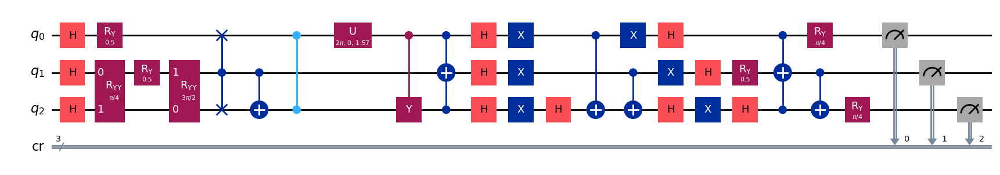

gen = 0 , Best fitness = (0.6941999999999999,)
gen = 1 , Best fitness = (0.6928,) , Number of invalids = 0

[Run 2 | Gen 85/99] Best Fitness: 0.6928 | Fidelity: 0.9011 | Gates: 30


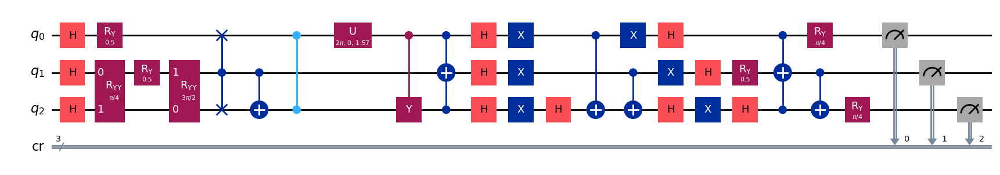

gen = 0 , Best fitness = (0.6928,)
gen = 1 , Best fitness = (0.6918,) , Number of invalids = 0

[Run 2 | Gen 86/99] Best Fitness: 0.6918 | Fidelity: 0.9035 | Gates: 30


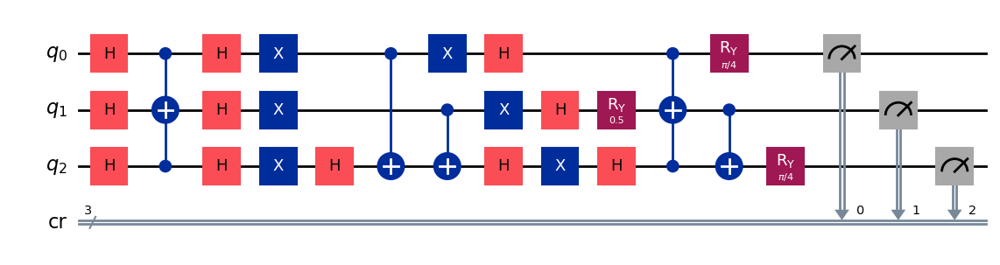

gen = 0 , Best fitness = (0.6918,)
gen = 1 , Best fitness = (0.6890999999999999,) , Number of invalids = 0

[Run 2 | Gen 87/99] Best Fitness: 0.6891 | Fidelity: 0.9061 | Gates: 30


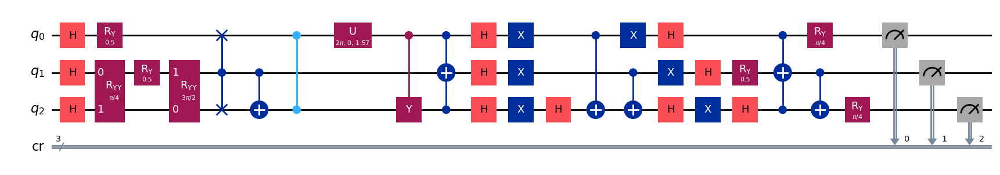

gen = 0 , Best fitness = (0.6890999999999999,)
gen = 1 , Best fitness = (0.6890999999999999,) , Number of invalids = 0

[Run 2 | Gen 88/99] Best Fitness: 0.6891 | Fidelity: 0.9117 | Gates: 30


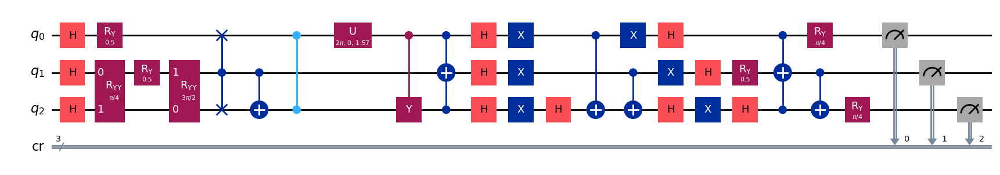

gen = 0 , Best fitness = (0.6890999999999999,)
gen = 1 , Best fitness = (0.6890999999999999,) , Number of invalids = 0

[Run 2 | Gen 89/99] Best Fitness: 0.6891 | Fidelity: 0.9073 | Gates: 30


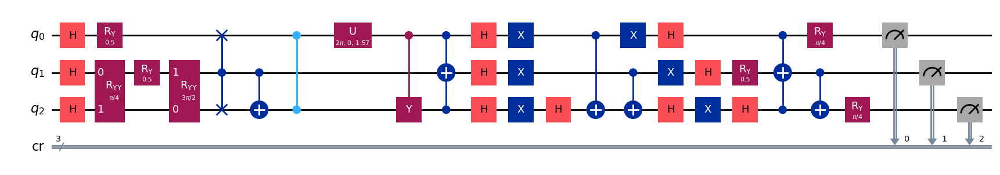

gen = 0 , Best fitness = (0.6890999999999999,)
gen = 1 , Best fitness = (0.6890999999999999,) , Number of invalids = 0

[Run 2 | Gen 90/99] Best Fitness: 0.6891 | Fidelity: 0.9100 | Gates: 30


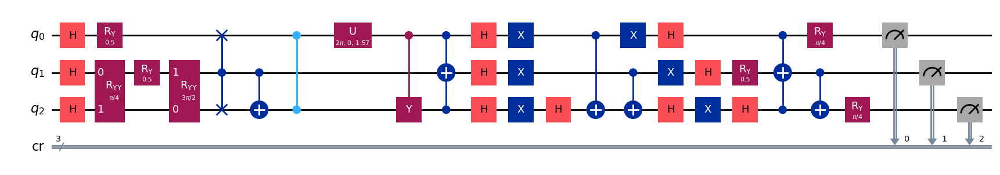

gen = 0 , Best fitness = (0.6890999999999999,)
gen = 1 , Best fitness = (0.6890999999999999,) , Number of invalids = 0

[Run 2 | Gen 91/99] Best Fitness: 0.6891 | Fidelity: 0.9046 | Gates: 30


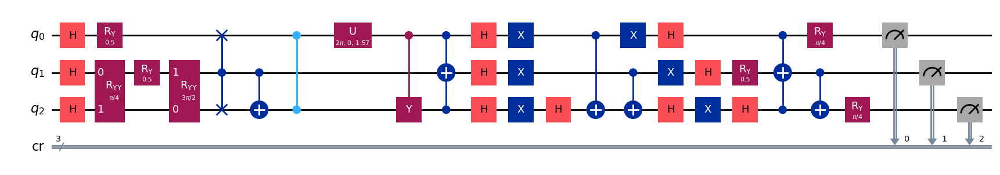

gen = 0 , Best fitness = (0.6890999999999999,)
gen = 1 , Best fitness = (0.6890999999999999,) , Number of invalids = 0

[Run 2 | Gen 92/99] Best Fitness: 0.6891 | Fidelity: 0.8988 | Gates: 30


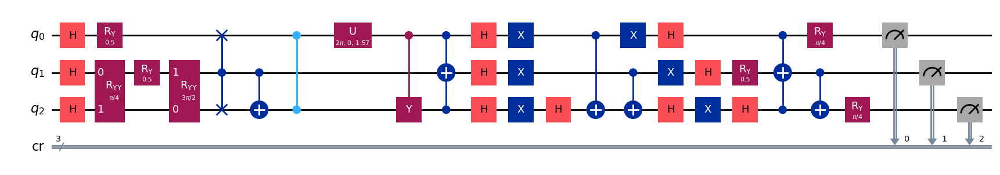

gen = 0 , Best fitness = (0.6890999999999999,)
gen = 1 , Best fitness = (0.6890999999999999,) , Number of invalids = 0

[Run 2 | Gen 93/99] Best Fitness: 0.6891 | Fidelity: 0.9140 | Gates: 30


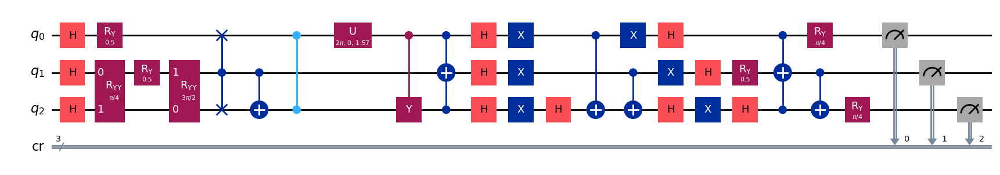

gen = 0 , Best fitness = (0.6890999999999999,)
gen = 1 , Best fitness = (0.6890999999999999,) , Number of invalids = 0

[Run 2 | Gen 94/99] Best Fitness: 0.6891 | Fidelity: 0.9077 | Gates: 30


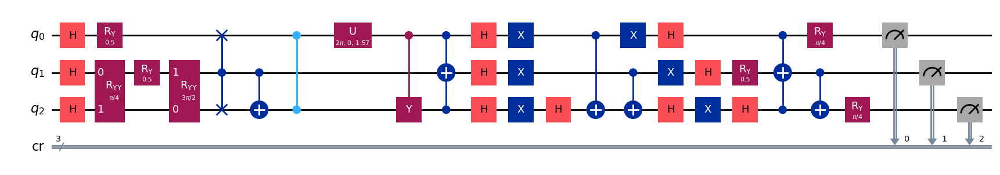

gen = 0 , Best fitness = (0.6890999999999999,)
gen = 1 , Best fitness = (0.6890999999999999,) , Number of invalids = 0

[Run 2 | Gen 95/99] Best Fitness: 0.6891 | Fidelity: 0.9079 | Gates: 30


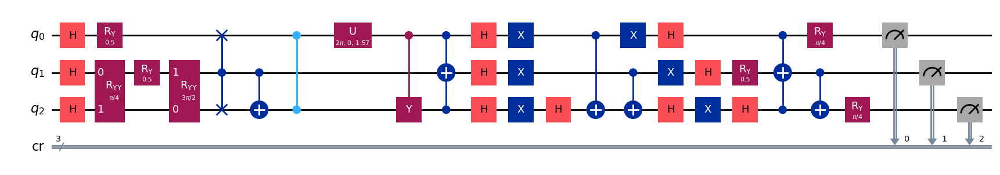

gen = 0 , Best fitness = (0.6890999999999999,)
gen = 1 , Best fitness = (0.6855,) , Number of invalids = 0

[Run 2 | Gen 96/99] Best Fitness: 0.6855 | Fidelity: 0.9059 | Gates: 30


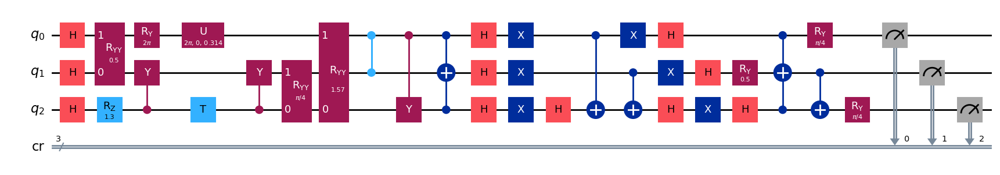

gen = 0 , Best fitness = (0.6855,)
gen = 1 , Best fitness = (0.6855,) , Number of invalids = 0

[Run 2 | Gen 97/99] Best Fitness: 0.6855 | Fidelity: 0.9025 | Gates: 30


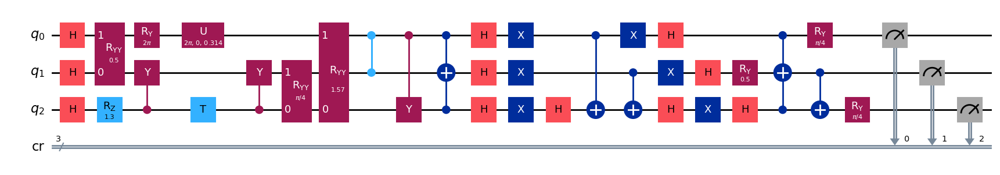

gen = 0 , Best fitness = (0.6855,)
gen = 1 , Best fitness = (0.6850999999999999,) , Number of invalids = 0

[Run 2 | Gen 98/99] Best Fitness: 0.6851 | Fidelity: 0.9095 | Gates: 30


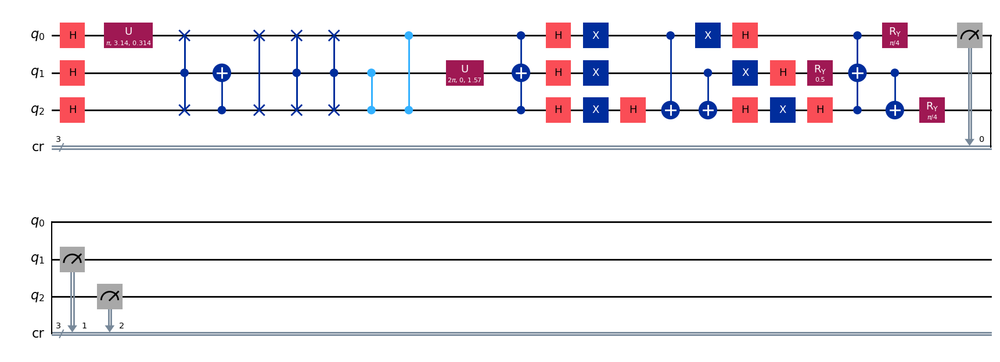

gen = 0 , Best fitness = (0.6850999999999999,)
gen = 1 , Best fitness = (0.6850999999999999,) , Number of invalids = 0

[Run 2 | Gen 99/99] Best Fitness: 0.6851 | Fidelity: 0.9023 | Gates: 30


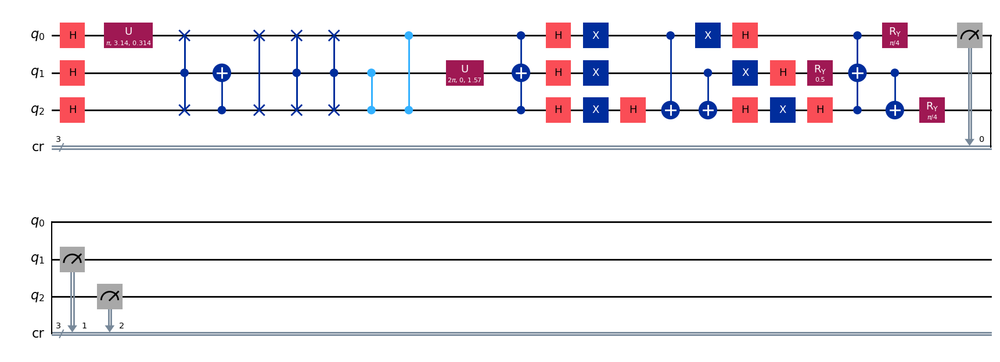


Generating evolution plots for Run 2...
✓ Plot saved to: experiments_state_111/run_2_seed_74678/evolution_metrics_run_2.png


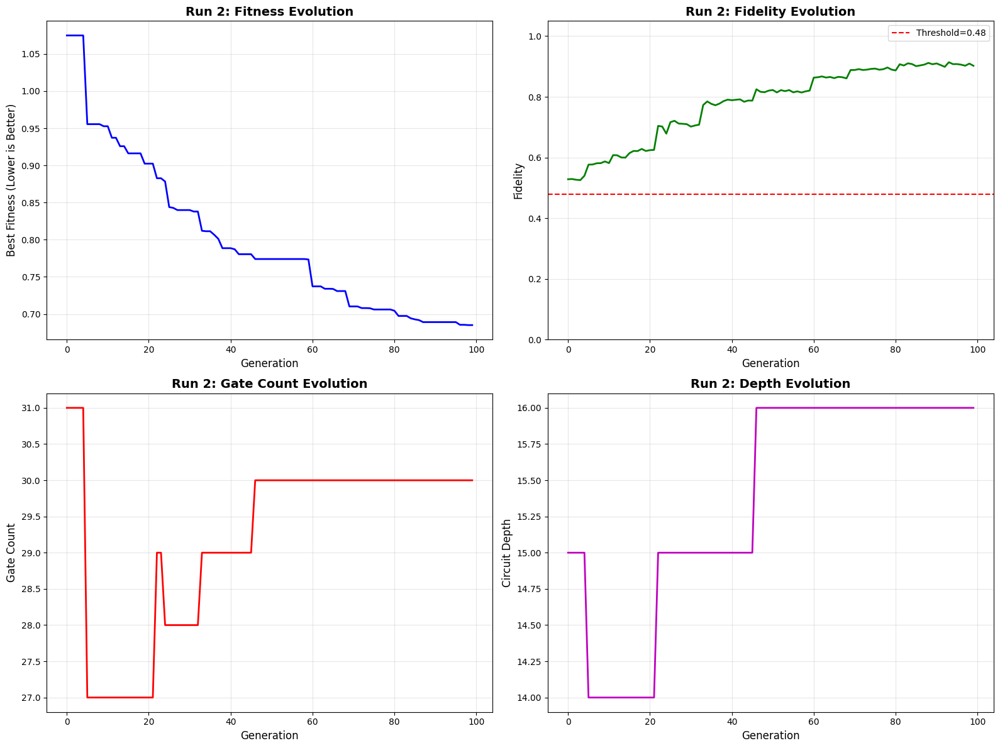


✓ Run 2 COMPLETE | Fidelity: 0.9048 | Gates: 30 | Depth: 16


RUN 3/5 | Target: 111 | Seed: 75264
✓ Logging to: experiments_state_111/run_3_seed_75264
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (11.0199,)
gen = 1 , Best fitness = (11.0092,) , Number of invalids = 158

[Run 3 | Gen 0/99] Best Fitness: 11.0092 | Fidelity: 0.5012 | Gates: 26


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


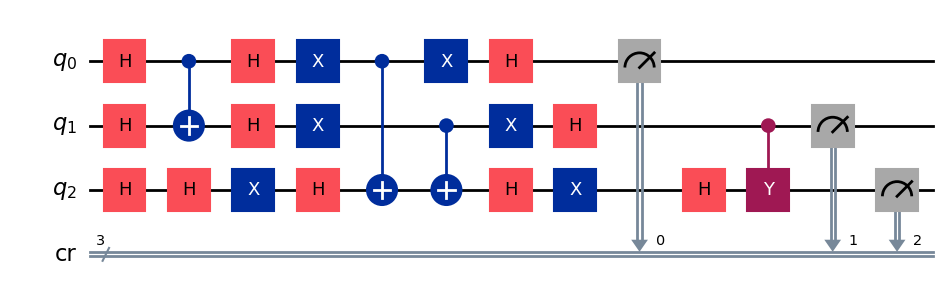

gen = 0 , Best fitness = (11.0092,)
gen = 1 , Best fitness = (11.0092,) , Number of invalids = 104

[Run 3 | Gen 1/99] Best Fitness: 11.0092 | Fidelity: 0.4993 | Gates: 26


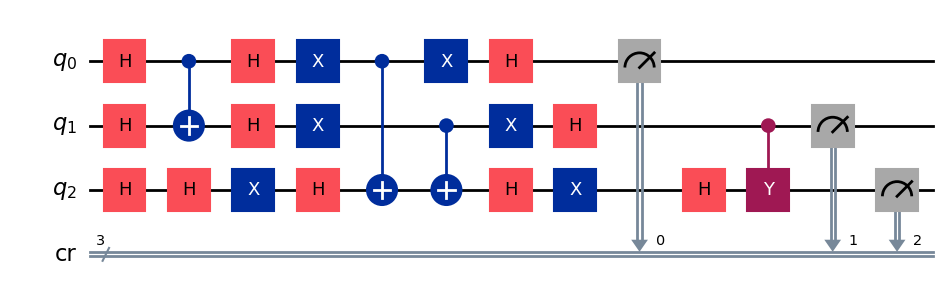

gen = 0 , Best fitness = (11.0092,)
gen = 1 , Best fitness = (1.1086,) , Number of invalids = 62

[Run 3 | Gen 2/99] Best Fitness: 1.1086 | Fidelity: 0.6011 | Gates: 35


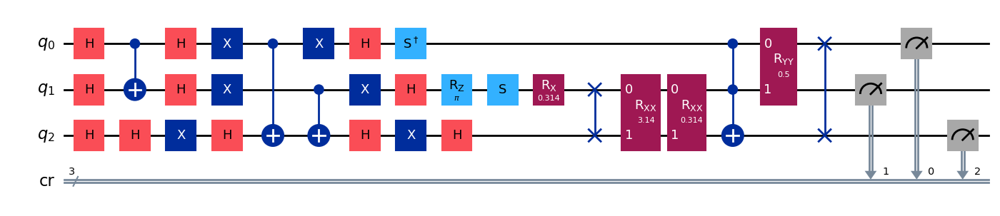

gen = 0 , Best fitness = (1.1086,)
gen = 1 , Best fitness = (1.1086,) , Number of invalids = 48

[Run 3 | Gen 3/99] Best Fitness: 1.1086 | Fidelity: 0.6057 | Gates: 35


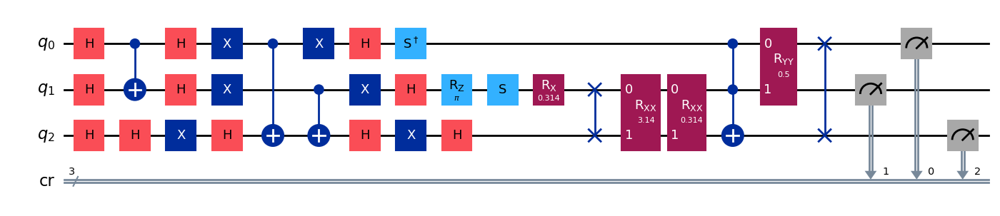

gen = 0 , Best fitness = (1.1086,)
gen = 1 , Best fitness = (1.004,) , Number of invalids = 41

[Run 3 | Gen 4/99] Best Fitness: 1.0040 | Fidelity: 0.5612 | Gates: 28


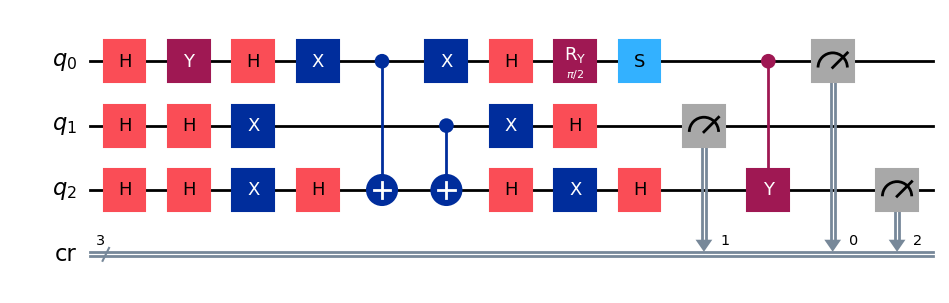

gen = 0 , Best fitness = (1.004,)
gen = 1 , Best fitness = (1.004,) , Number of invalids = 40

[Run 3 | Gen 5/99] Best Fitness: 1.0040 | Fidelity: 0.5578 | Gates: 28


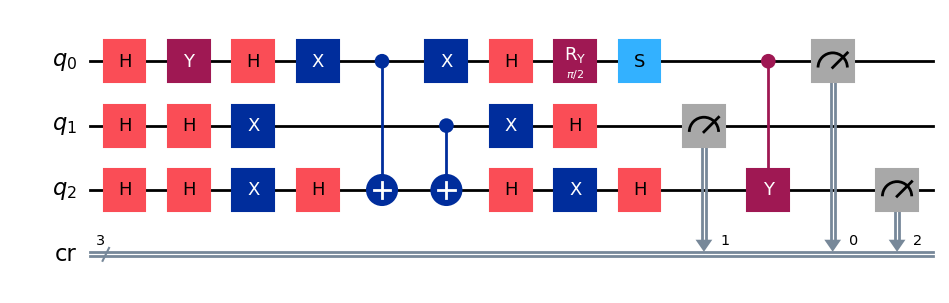

gen = 0 , Best fitness = (1.004,)
gen = 1 , Best fitness = (1.002,) , Number of invalids = 52

[Run 3 | Gen 6/99] Best Fitness: 1.0020 | Fidelity: 0.5668 | Gates: 28


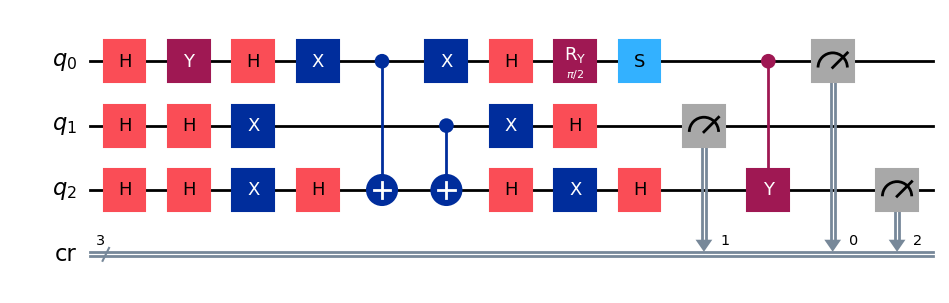

gen = 0 , Best fitness = (1.002,)
gen = 1 , Best fitness = (0.9995,) , Number of invalids = 67

[Run 3 | Gen 7/99] Best Fitness: 0.9995 | Fidelity: 0.5613 | Gates: 28


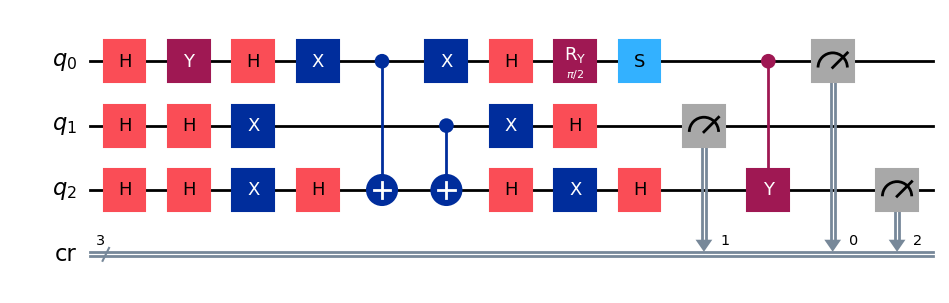

gen = 0 , Best fitness = (0.9995,)
gen = 1 , Best fitness = (0.9995,) , Number of invalids = 62

[Run 3 | Gen 8/99] Best Fitness: 0.9995 | Fidelity: 0.5636 | Gates: 28


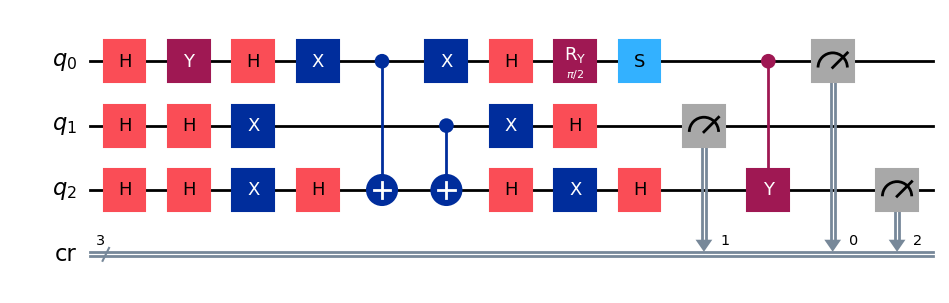

gen = 0 , Best fitness = (0.9995,)
gen = 1 , Best fitness = (0.9764,) , Number of invalids = 73

[Run 3 | Gen 9/99] Best Fitness: 0.9764 | Fidelity: 0.5591 | Gates: 27


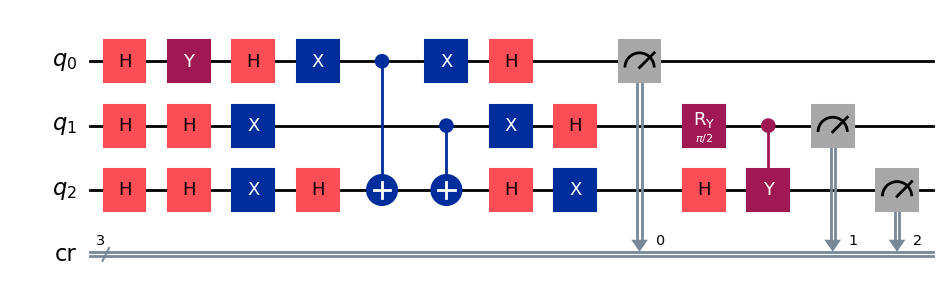

gen = 0 , Best fitness = (0.9764,)
gen = 1 , Best fitness = (0.9764,) , Number of invalids = 69

[Run 3 | Gen 10/99] Best Fitness: 0.9764 | Fidelity: 0.5552 | Gates: 27


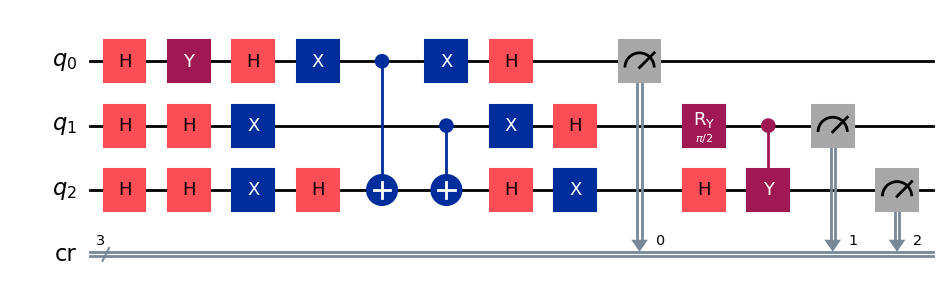

gen = 0 , Best fitness = (0.9764,)
gen = 1 , Best fitness = (0.9315,) , Number of invalids = 72

[Run 3 | Gen 11/99] Best Fitness: 0.9315 | Fidelity: 0.6132 | Gates: 27


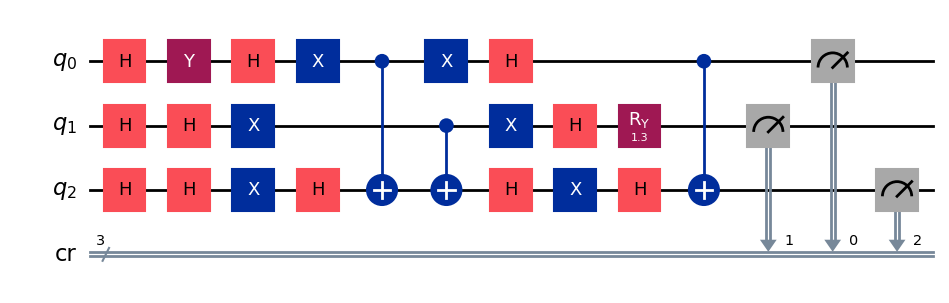

gen = 0 , Best fitness = (0.9315,)
gen = 1 , Best fitness = (0.9315,) , Number of invalids = 52

[Run 3 | Gen 12/99] Best Fitness: 0.9315 | Fidelity: 0.6040 | Gates: 27


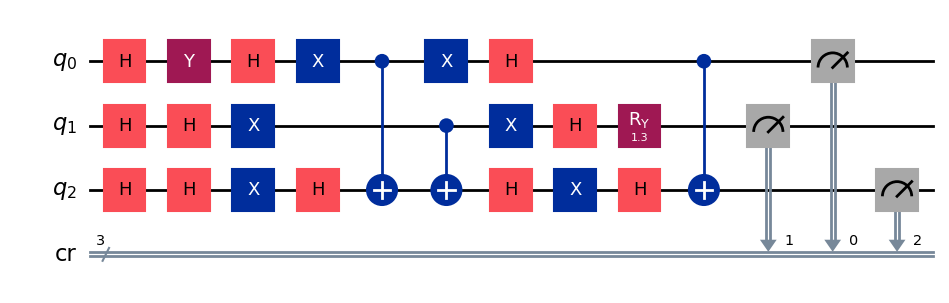

gen = 0 , Best fitness = (0.9315,)
gen = 1 , Best fitness = (0.9315,) , Number of invalids = 39

[Run 3 | Gen 13/99] Best Fitness: 0.9315 | Fidelity: 0.6037 | Gates: 27


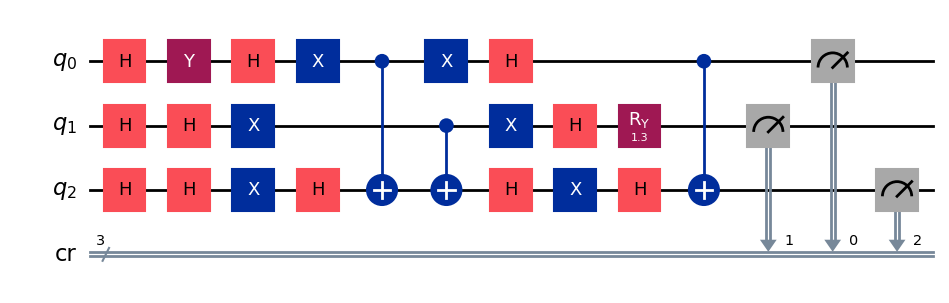

gen = 0 , Best fitness = (0.9315,)
gen = 1 , Best fitness = (0.9215,) , Number of invalids = 41

[Run 3 | Gen 14/99] Best Fitness: 0.9215 | Fidelity: 0.5953 | Gates: 27


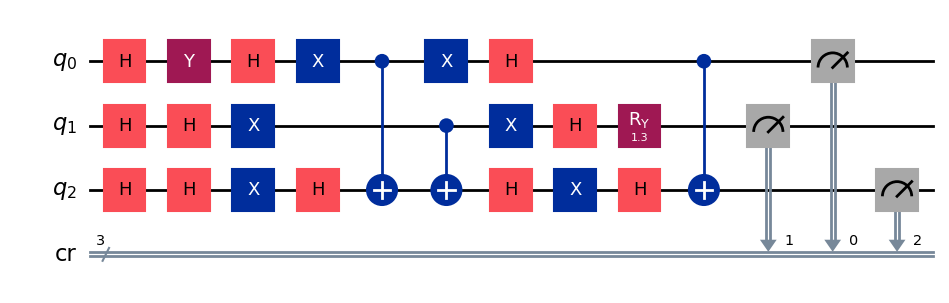

gen = 0 , Best fitness = (0.9215,)
gen = 1 , Best fitness = (0.9215,) , Number of invalids = 42

[Run 3 | Gen 15/99] Best Fitness: 0.9215 | Fidelity: 0.5973 | Gates: 27


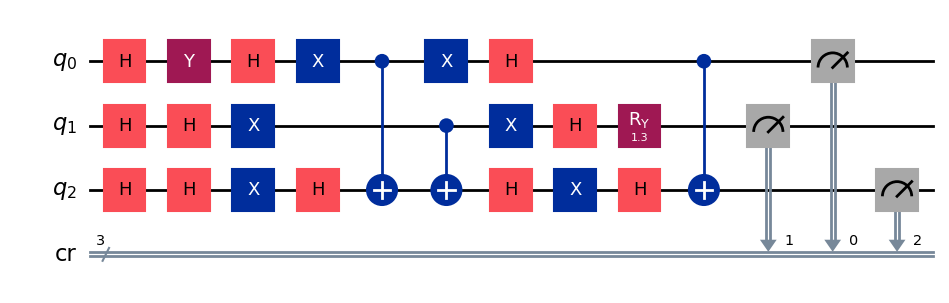

gen = 0 , Best fitness = (0.9215,)
gen = 1 , Best fitness = (0.9067000000000001,) , Number of invalids = 31

[Run 3 | Gen 16/99] Best Fitness: 0.9067 | Fidelity: 0.7750 | Gates: 34


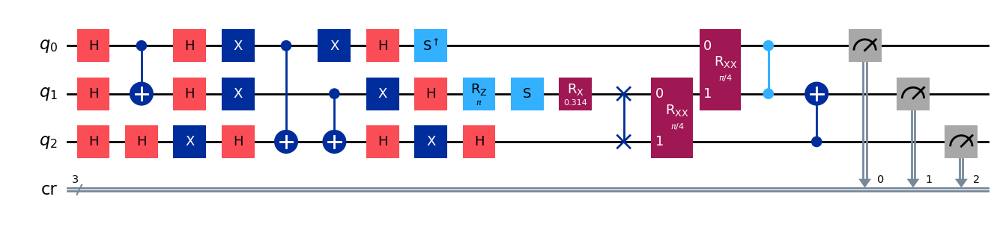

gen = 0 , Best fitness = (0.9067000000000001,)
gen = 1 , Best fitness = (0.9067000000000001,) , Number of invalids = 32

[Run 3 | Gen 17/99] Best Fitness: 0.9067 | Fidelity: 0.7821 | Gates: 34


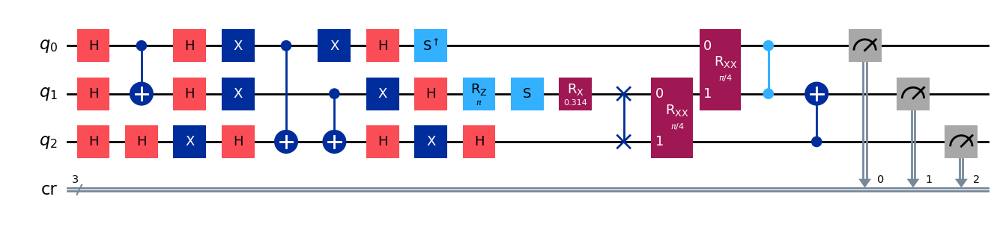

gen = 0 , Best fitness = (0.9067000000000001,)
gen = 1 , Best fitness = (0.8975000000000001,) , Number of invalids = 34

[Run 3 | Gen 18/99] Best Fitness: 0.8975 | Fidelity: 0.7809 | Gates: 34


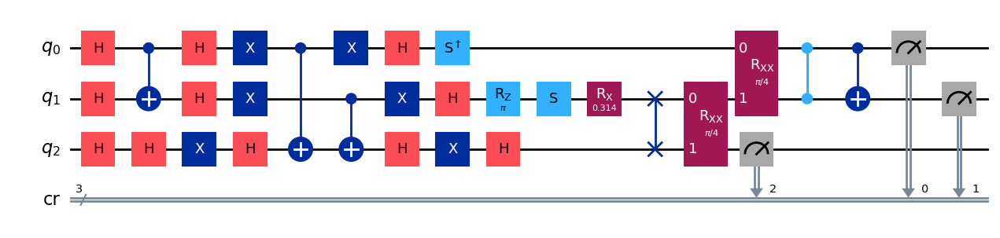

gen = 0 , Best fitness = (0.8975000000000001,)
gen = 1 , Best fitness = (0.8975000000000001,) , Number of invalids = 40

[Run 3 | Gen 19/99] Best Fitness: 0.8975 | Fidelity: 0.7757 | Gates: 34


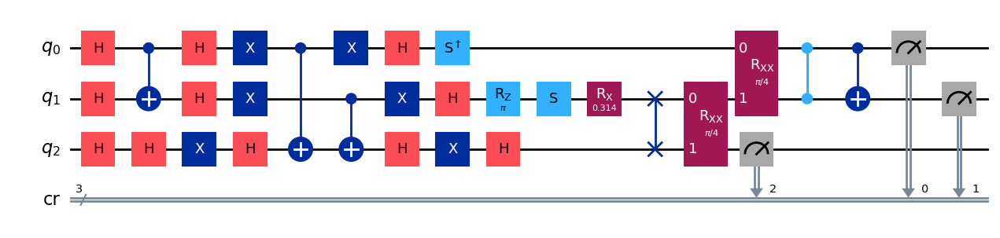

gen = 0 , Best fitness = (0.8975000000000001,)
gen = 1 , Best fitness = (0.8975000000000001,) , Number of invalids = 42

[Run 3 | Gen 20/99] Best Fitness: 0.8975 | Fidelity: 0.7798 | Gates: 34


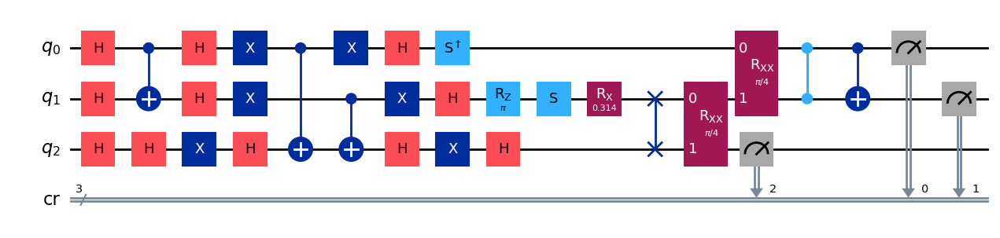

gen = 0 , Best fitness = (0.8975000000000001,)
gen = 1 , Best fitness = (0.8895000000000001,) , Number of invalids = 36

[Run 3 | Gen 21/99] Best Fitness: 0.8895 | Fidelity: 0.6453 | Gates: 27


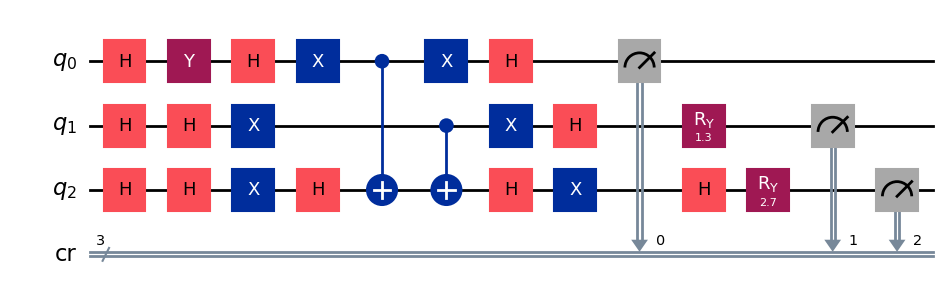

gen = 0 , Best fitness = (0.8895000000000001,)
gen = 1 , Best fitness = (0.888,) , Number of invalids = 21

[Run 3 | Gen 22/99] Best Fitness: 0.8880 | Fidelity: 0.6814 | Gates: 29


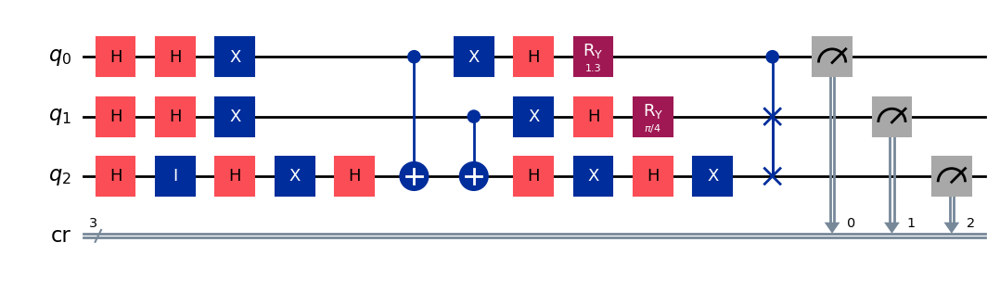

gen = 0 , Best fitness = (0.888,)
gen = 1 , Best fitness = (0.8051,) , Number of invalids = 15

[Run 3 | Gen 23/99] Best Fitness: 0.8051 | Fidelity: 0.7479 | Gates: 28


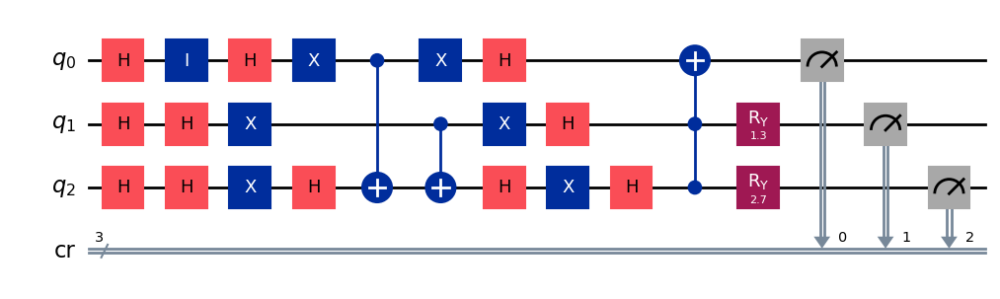

gen = 0 , Best fitness = (0.8051,)
gen = 1 , Best fitness = (0.8051,) , Number of invalids = 25

[Run 3 | Gen 24/99] Best Fitness: 0.8051 | Fidelity: 0.7541 | Gates: 28


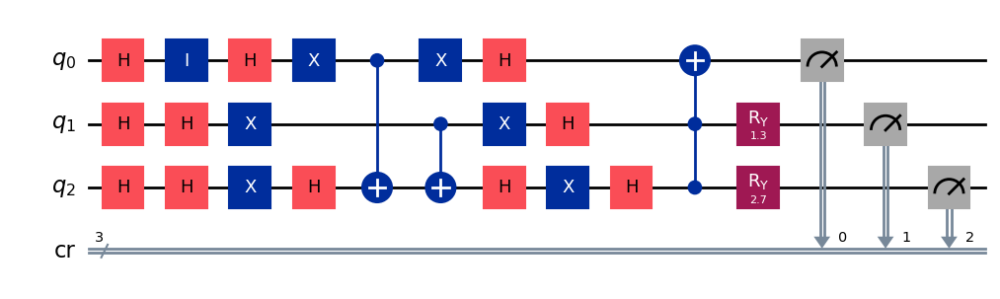

gen = 0 , Best fitness = (0.8051,)
gen = 1 , Best fitness = (0.8051,) , Number of invalids = 8

[Run 3 | Gen 25/99] Best Fitness: 0.8051 | Fidelity: 0.7537 | Gates: 28


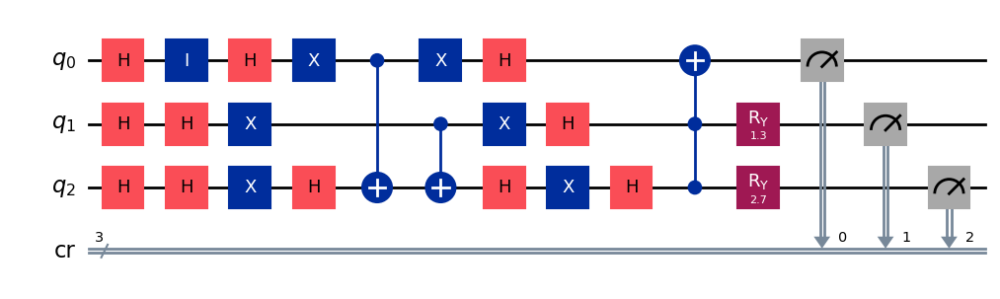

gen = 0 , Best fitness = (0.8051,)
gen = 1 , Best fitness = (0.8051,) , Number of invalids = 5

[Run 3 | Gen 26/99] Best Fitness: 0.8051 | Fidelity: 0.7514 | Gates: 28


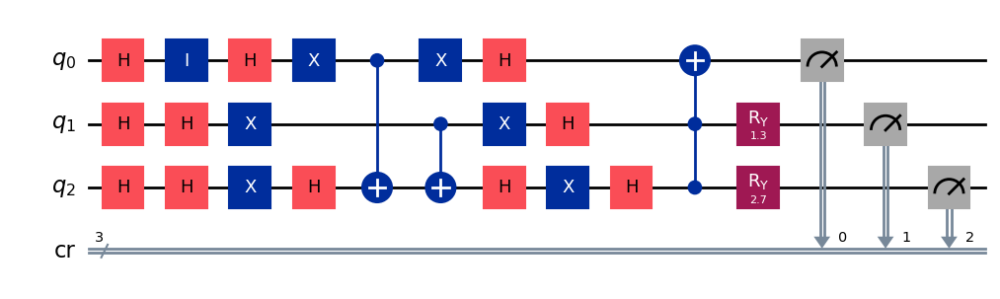

gen = 0 , Best fitness = (0.8051,)
gen = 1 , Best fitness = (0.8033,) , Number of invalids = 10

[Run 3 | Gen 27/99] Best Fitness: 0.8033 | Fidelity: 0.7528 | Gates: 28


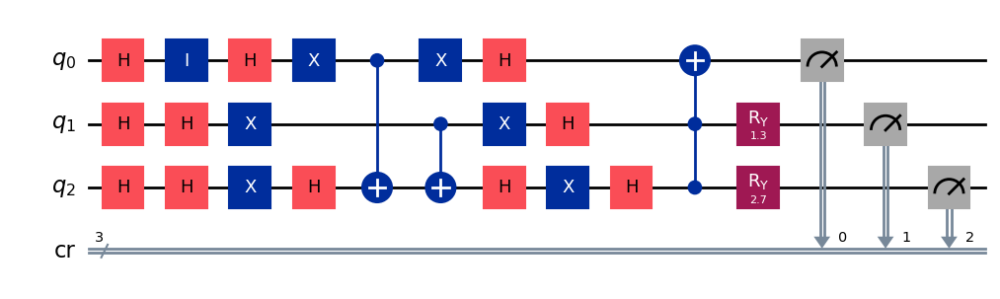

gen = 0 , Best fitness = (0.8033,)
gen = 1 , Best fitness = (0.8033,) , Number of invalids = 7

[Run 3 | Gen 28/99] Best Fitness: 0.8033 | Fidelity: 0.7529 | Gates: 28


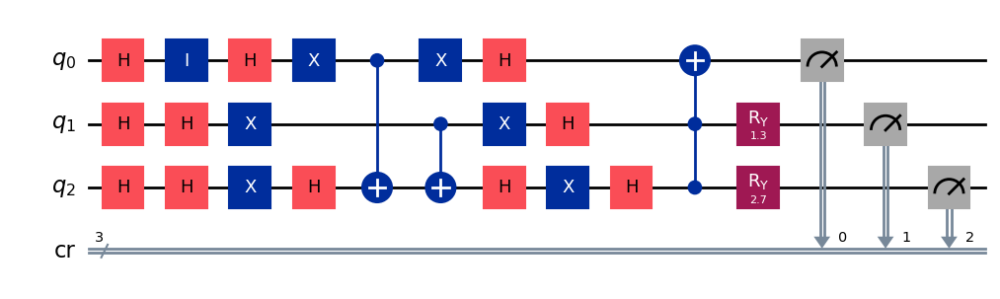

gen = 0 , Best fitness = (0.8033,)
gen = 1 , Best fitness = (0.7981,) , Number of invalids = 6

[Run 3 | Gen 29/99] Best Fitness: 0.7981 | Fidelity: 0.7577 | Gates: 28


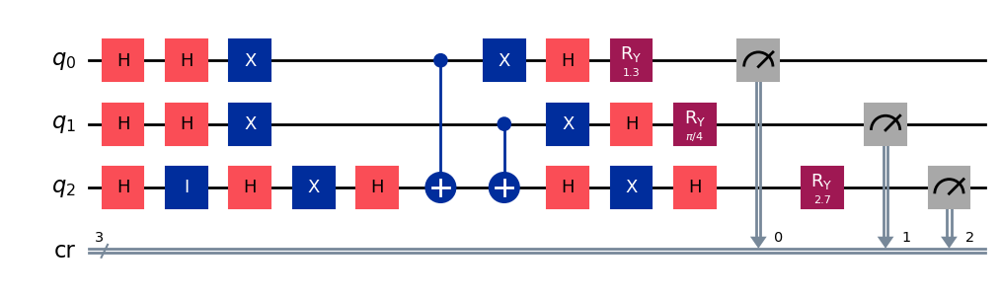

gen = 0 , Best fitness = (0.7981,)
gen = 1 , Best fitness = (0.7525000000000001,) , Number of invalids = 2

[Run 3 | Gen 30/99] Best Fitness: 0.7525 | Fidelity: 0.8173 | Gates: 28


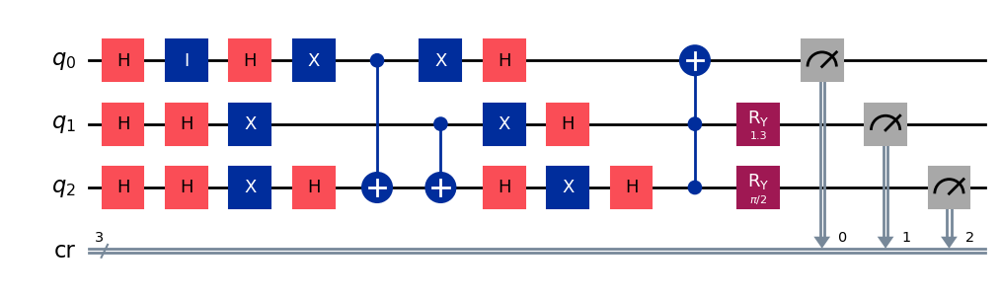

gen = 0 , Best fitness = (0.7525000000000001,)
gen = 1 , Best fitness = (0.7525000000000001,) , Number of invalids = 5

[Run 3 | Gen 31/99] Best Fitness: 0.7525 | Fidelity: 0.8076 | Gates: 28


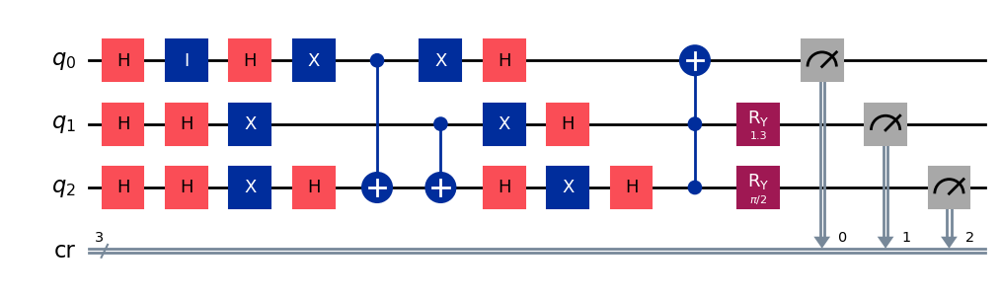

gen = 0 , Best fitness = (0.7525000000000001,)
gen = 1 , Best fitness = (0.7486,) , Number of invalids = 3

[Run 3 | Gen 32/99] Best Fitness: 0.7486 | Fidelity: 0.8048 | Gates: 28


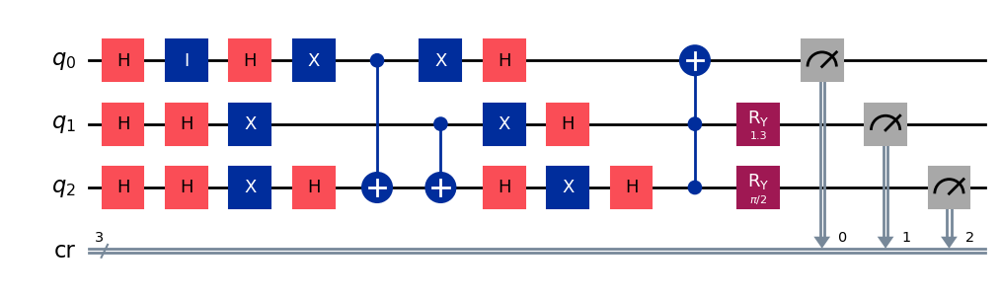

gen = 0 , Best fitness = (0.7486,)
gen = 1 , Best fitness = (0.7486,) , Number of invalids = 3

[Run 3 | Gen 33/99] Best Fitness: 0.7486 | Fidelity: 0.8085 | Gates: 28


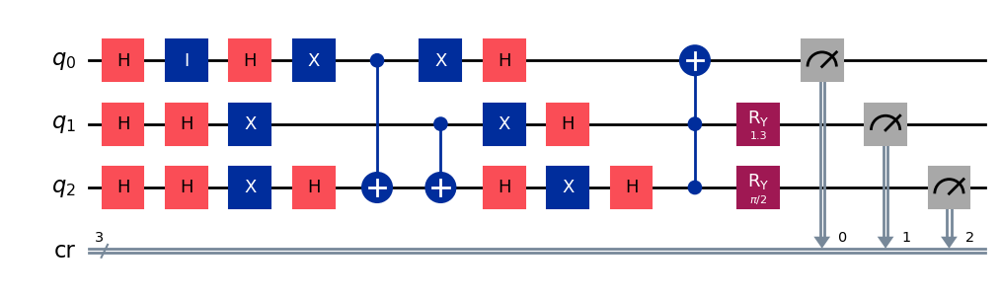

gen = 0 , Best fitness = (0.7486,)
gen = 1 , Best fitness = (0.7451000000000001,) , Number of invalids = 2

[Run 3 | Gen 34/99] Best Fitness: 0.7451 | Fidelity: 0.8042 | Gates: 28


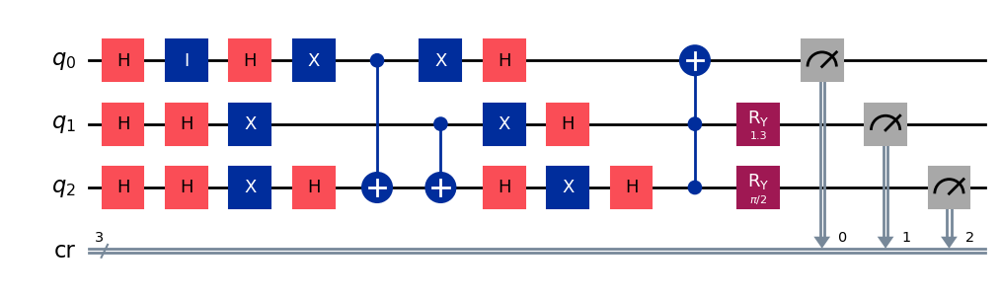

gen = 0 , Best fitness = (0.7451000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 35/99] Best Fitness: 0.7401 | Fidelity: 0.8105 | Gates: 28


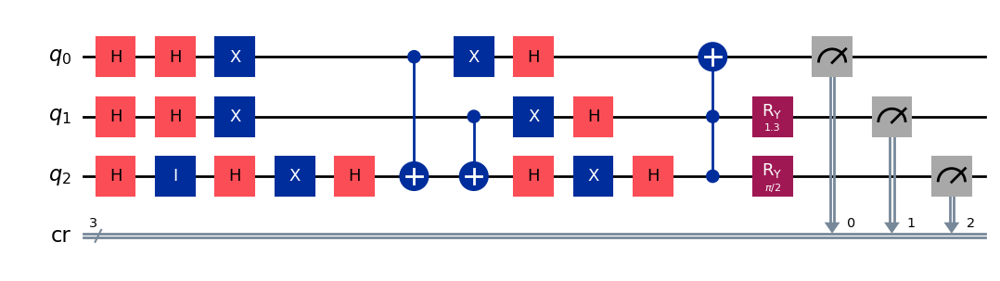

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 2

[Run 3 | Gen 36/99] Best Fitness: 0.7401 | Fidelity: 0.8125 | Gates: 28


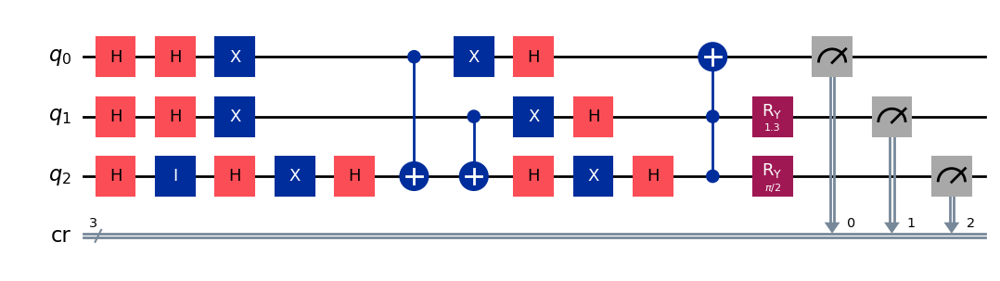

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 37/99] Best Fitness: 0.7401 | Fidelity: 0.8129 | Gates: 28


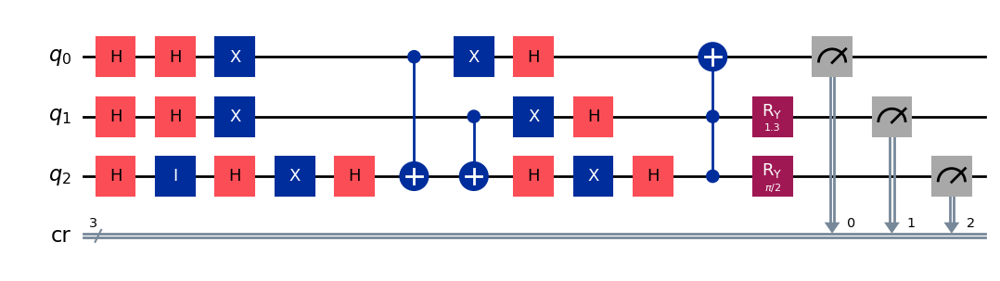

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 38/99] Best Fitness: 0.7401 | Fidelity: 0.8086 | Gates: 28


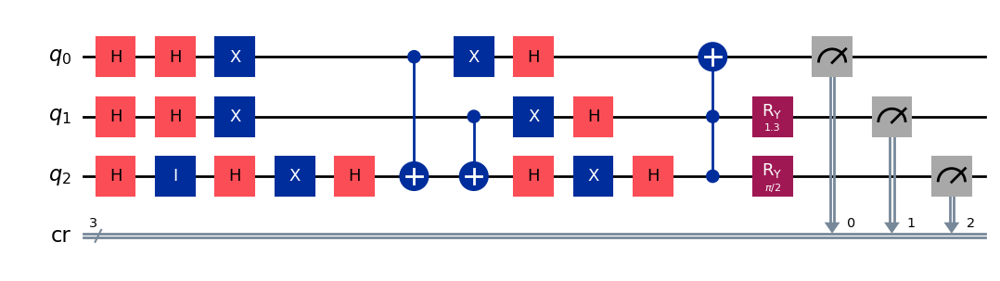

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 1

[Run 3 | Gen 39/99] Best Fitness: 0.7401 | Fidelity: 0.8058 | Gates: 28


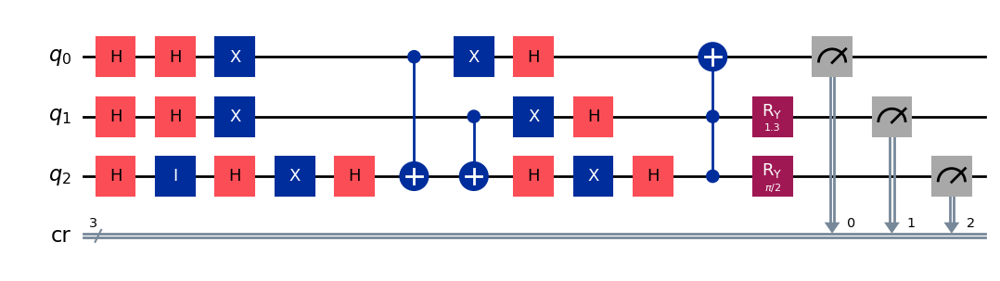

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 40/99] Best Fitness: 0.7401 | Fidelity: 0.8075 | Gates: 28


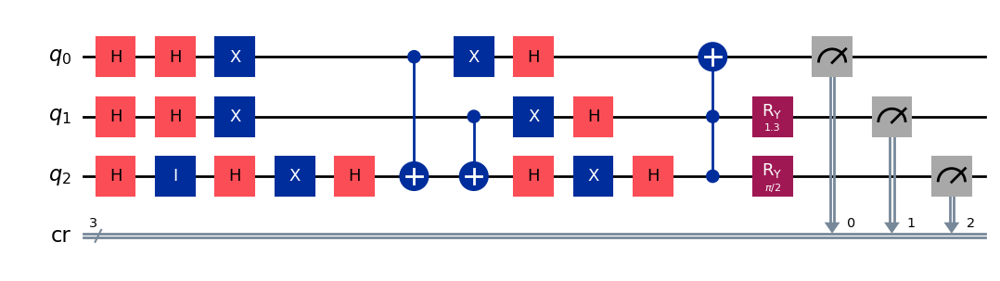

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 41/99] Best Fitness: 0.7401 | Fidelity: 0.8092 | Gates: 28


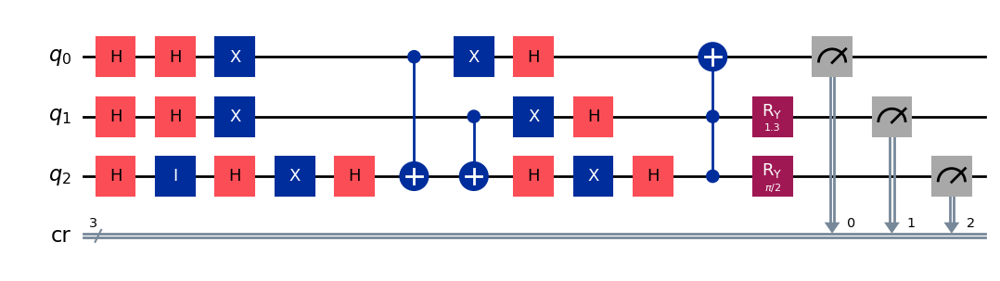

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 1

[Run 3 | Gen 42/99] Best Fitness: 0.7401 | Fidelity: 0.8006 | Gates: 28


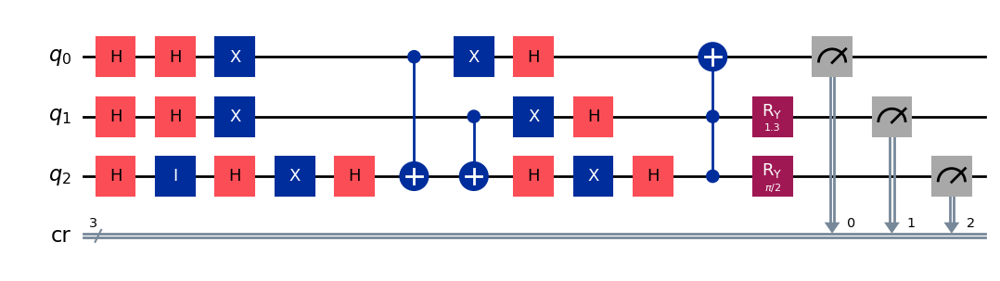

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 43/99] Best Fitness: 0.7401 | Fidelity: 0.8151 | Gates: 28


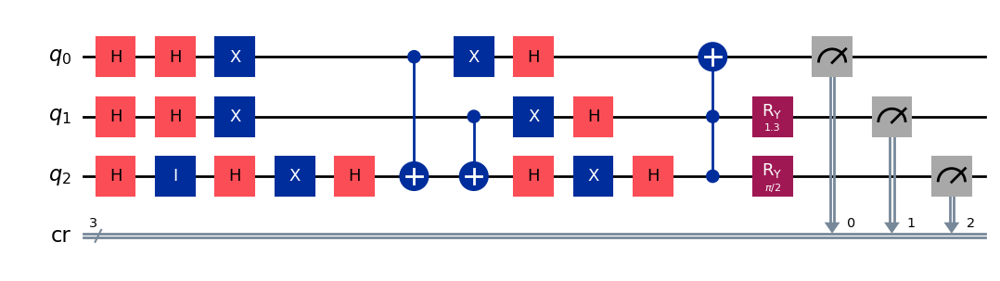

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 1

[Run 3 | Gen 44/99] Best Fitness: 0.7401 | Fidelity: 0.8100 | Gates: 28


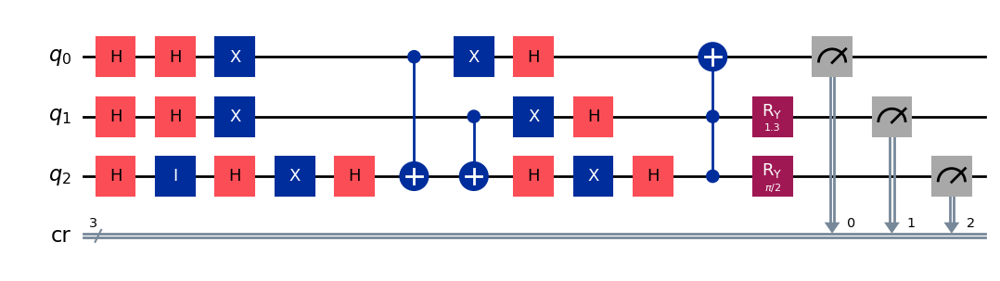

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 45/99] Best Fitness: 0.7401 | Fidelity: 0.8065 | Gates: 28


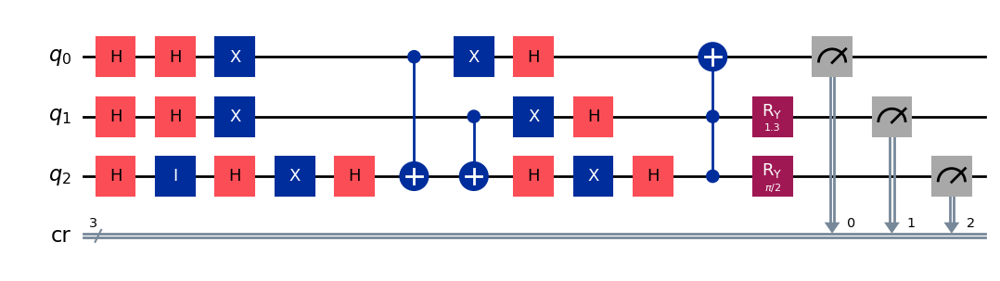

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 46/99] Best Fitness: 0.7401 | Fidelity: 0.8099 | Gates: 28


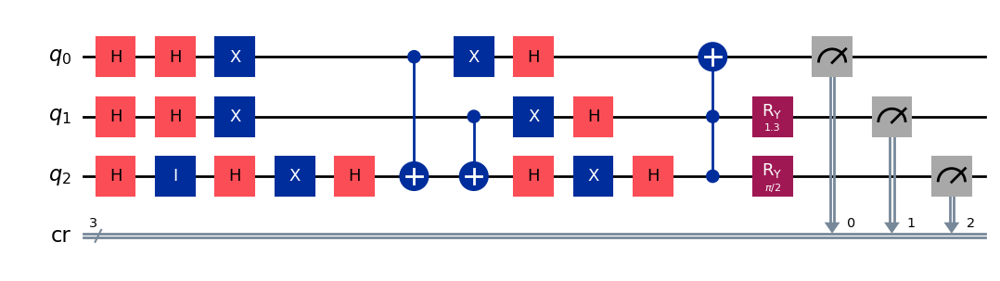

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 47/99] Best Fitness: 0.7401 | Fidelity: 0.7997 | Gates: 28


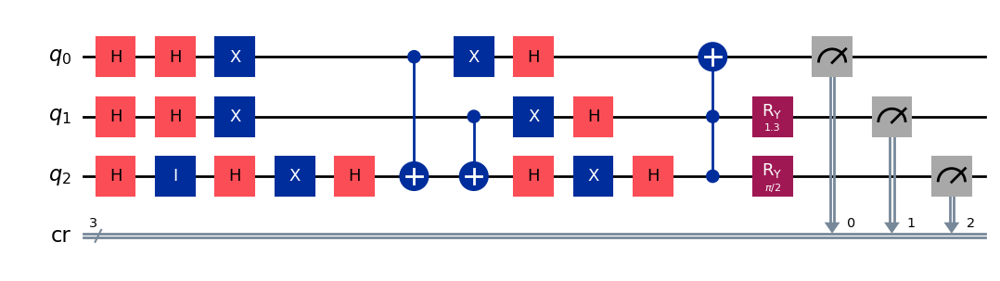

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 48/99] Best Fitness: 0.7401 | Fidelity: 0.8125 | Gates: 28


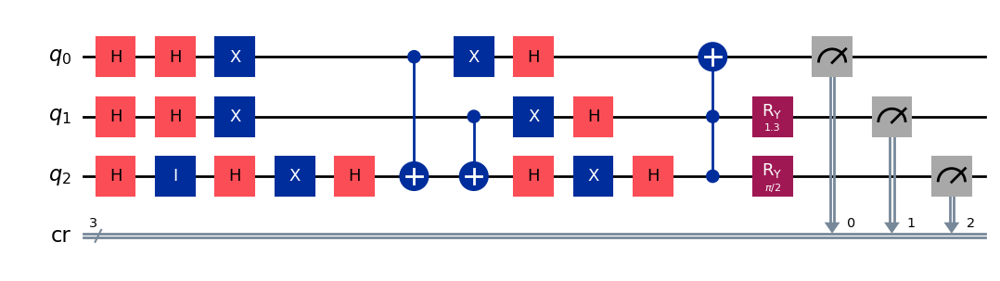

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 49/99] Best Fitness: 0.7401 | Fidelity: 0.8089 | Gates: 28


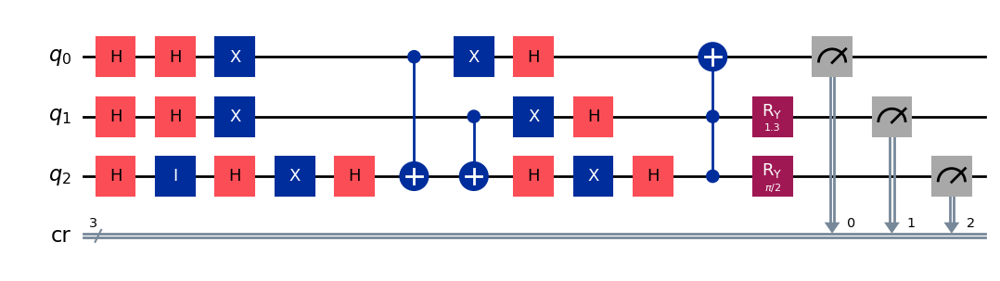

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 50/99] Best Fitness: 0.7401 | Fidelity: 0.8053 | Gates: 28


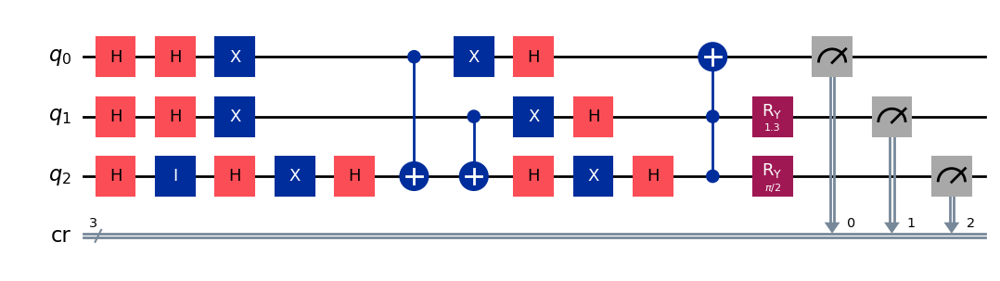

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 51/99] Best Fitness: 0.7401 | Fidelity: 0.8106 | Gates: 28


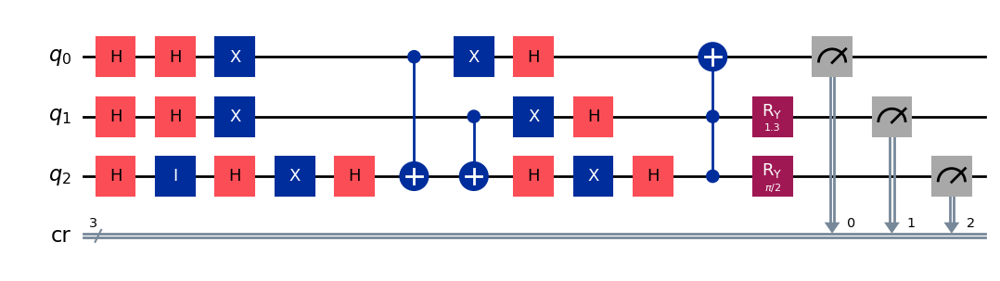

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7401000000000001,) , Number of invalids = 0

[Run 3 | Gen 52/99] Best Fitness: 0.7401 | Fidelity: 0.8150 | Gates: 28


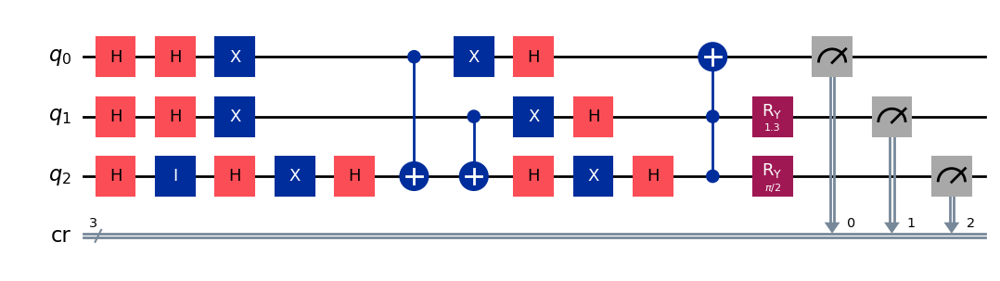

gen = 0 , Best fitness = (0.7401000000000001,)
gen = 1 , Best fitness = (0.7396,) , Number of invalids = 0

[Run 3 | Gen 53/99] Best Fitness: 0.7396 | Fidelity: 0.8094 | Gates: 28


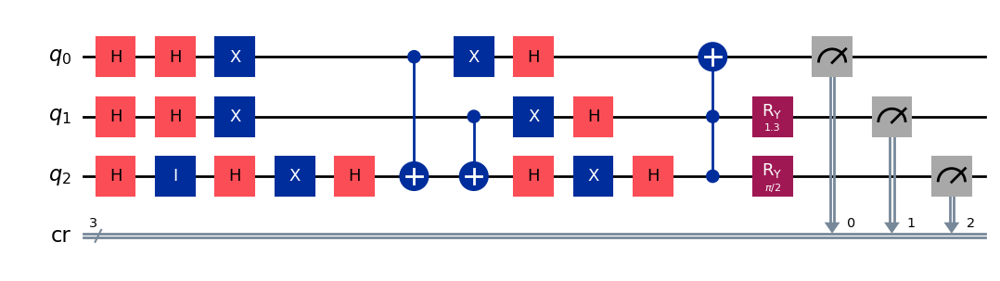

gen = 0 , Best fitness = (0.7396,)
gen = 1 , Best fitness = (0.7396,) , Number of invalids = 0

[Run 3 | Gen 54/99] Best Fitness: 0.7396 | Fidelity: 0.8119 | Gates: 28


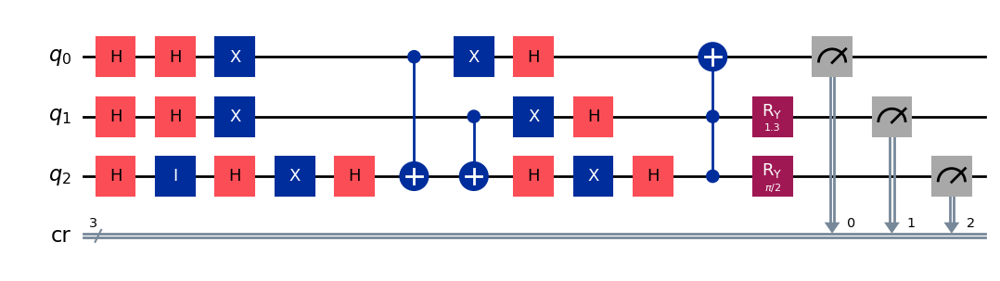

gen = 0 , Best fitness = (0.7396,)
gen = 1 , Best fitness = (0.7396,) , Number of invalids = 0

[Run 3 | Gen 55/99] Best Fitness: 0.7396 | Fidelity: 0.8074 | Gates: 28


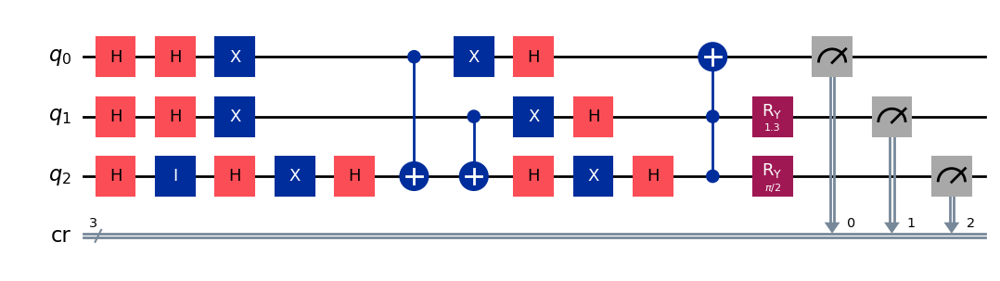

gen = 0 , Best fitness = (0.7396,)
gen = 1 , Best fitness = (0.7304999999999999,) , Number of invalids = 0

[Run 3 | Gen 56/99] Best Fitness: 0.7305 | Fidelity: 0.8459 | Gates: 29


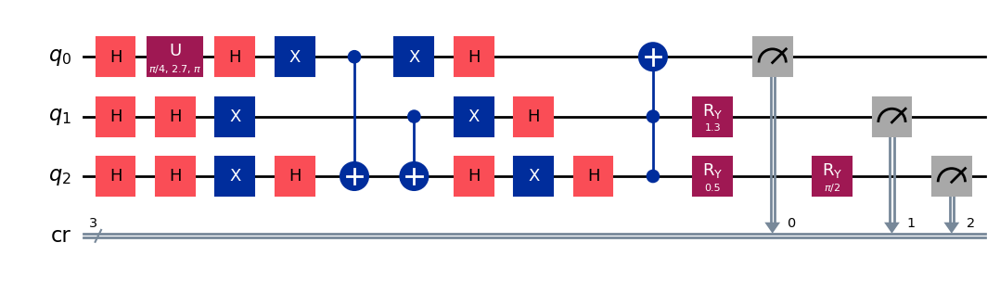

gen = 0 , Best fitness = (0.7304999999999999,)
gen = 1 , Best fitness = (0.7304999999999999,) , Number of invalids = 0

[Run 3 | Gen 57/99] Best Fitness: 0.7305 | Fidelity: 0.8509 | Gates: 29


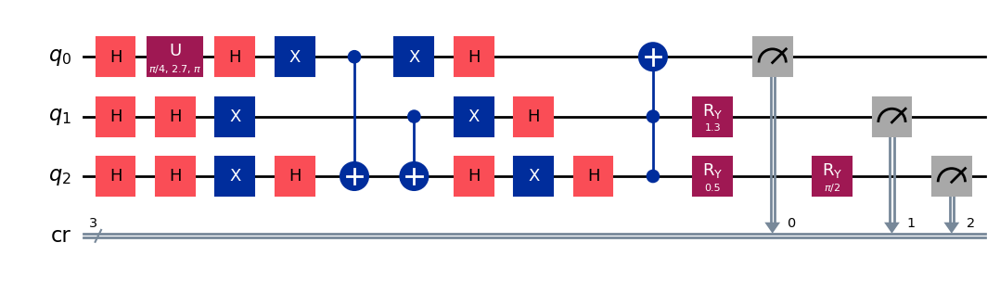

gen = 0 , Best fitness = (0.7304999999999999,)
gen = 1 , Best fitness = (0.7288,) , Number of invalids = 0

[Run 3 | Gen 58/99] Best Fitness: 0.7288 | Fidelity: 0.8436 | Gates: 29


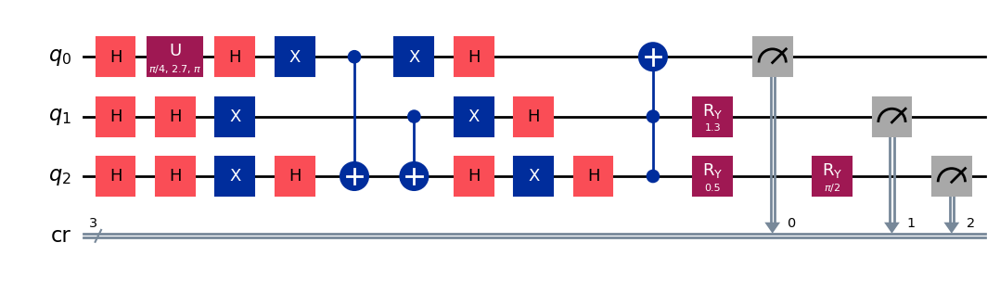

gen = 0 , Best fitness = (0.7288,)
gen = 1 , Best fitness = (0.7288,) , Number of invalids = 0

[Run 3 | Gen 59/99] Best Fitness: 0.7288 | Fidelity: 0.8456 | Gates: 29


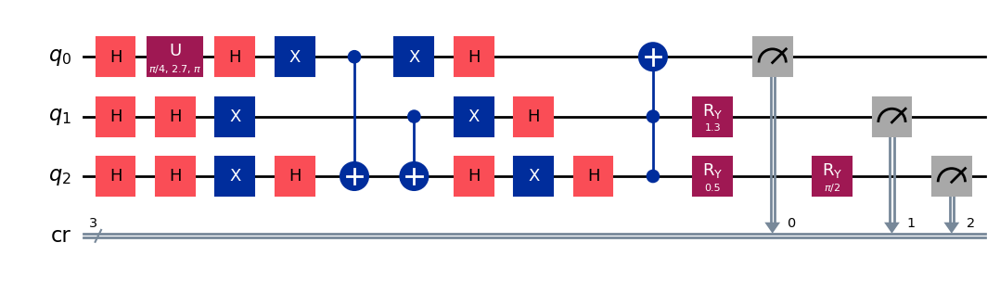

gen = 0 , Best fitness = (0.7288,)
gen = 1 , Best fitness = (0.7273,) , Number of invalids = 0

[Run 3 | Gen 60/99] Best Fitness: 0.7273 | Fidelity: 0.8518 | Gates: 29


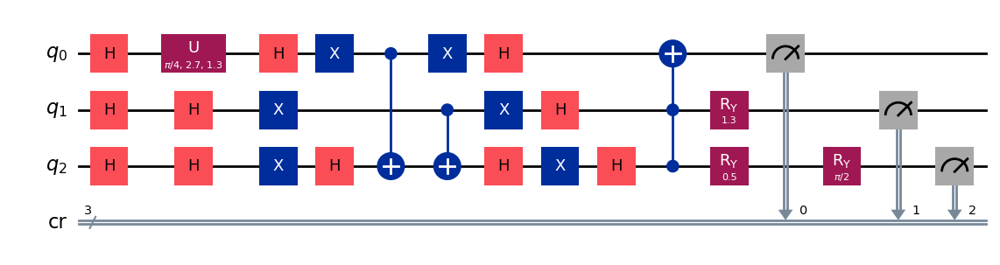

gen = 0 , Best fitness = (0.7273,)
gen = 1 , Best fitness = (0.7273,) , Number of invalids = 0

[Run 3 | Gen 61/99] Best Fitness: 0.7273 | Fidelity: 0.8463 | Gates: 29


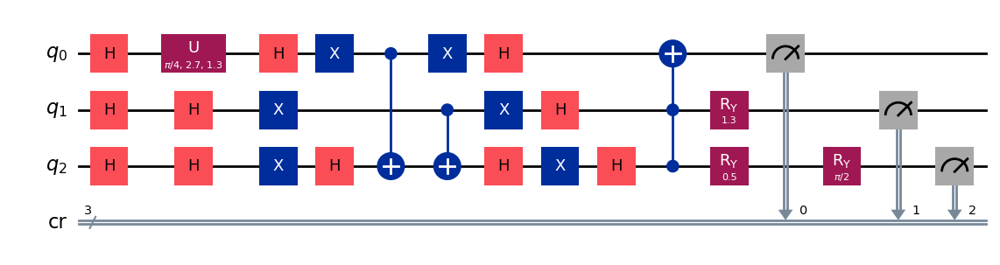

gen = 0 , Best fitness = (0.7273,)
gen = 1 , Best fitness = (0.7264999999999999,) , Number of invalids = 0

[Run 3 | Gen 62/99] Best Fitness: 0.7265 | Fidelity: 0.8501 | Gates: 29


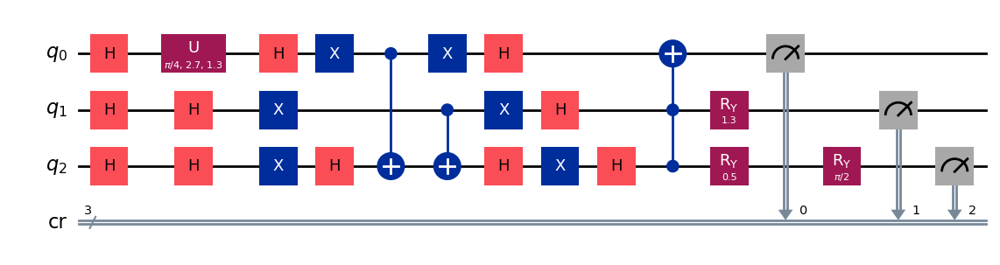

gen = 0 , Best fitness = (0.7264999999999999,)
gen = 1 , Best fitness = (0.7264999999999999,) , Number of invalids = 0

[Run 3 | Gen 63/99] Best Fitness: 0.7265 | Fidelity: 0.8467 | Gates: 29


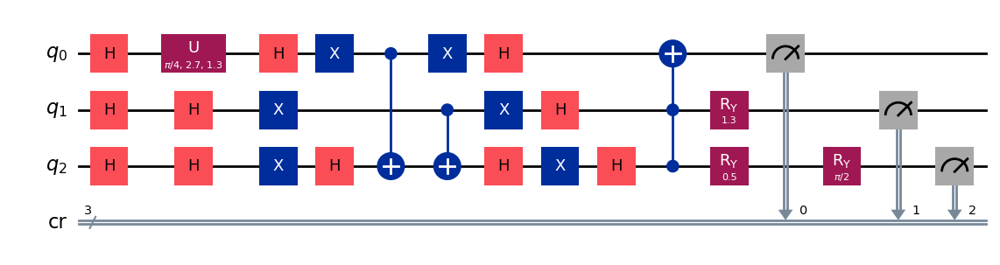

gen = 0 , Best fitness = (0.7264999999999999,)
gen = 1 , Best fitness = (0.7264999999999999,) , Number of invalids = 0

[Run 3 | Gen 64/99] Best Fitness: 0.7265 | Fidelity: 0.8469 | Gates: 29


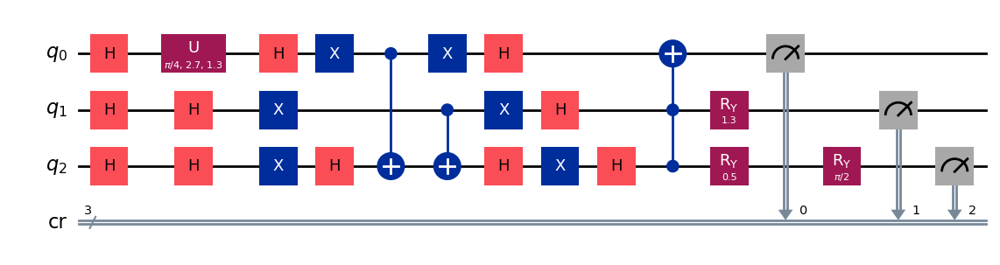

gen = 0 , Best fitness = (0.7264999999999999,)
gen = 1 , Best fitness = (0.7263,) , Number of invalids = 0

[Run 3 | Gen 65/99] Best Fitness: 0.7263 | Fidelity: 0.8432 | Gates: 29


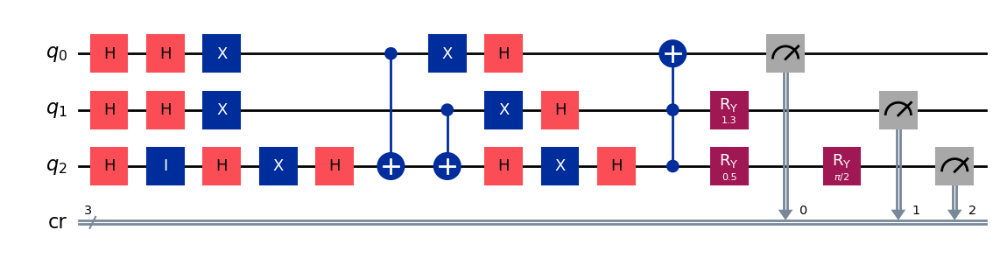

gen = 0 , Best fitness = (0.7263,)
gen = 1 , Best fitness = (0.7259,) , Number of invalids = 0

[Run 3 | Gen 66/99] Best Fitness: 0.7259 | Fidelity: 0.8508 | Gates: 29


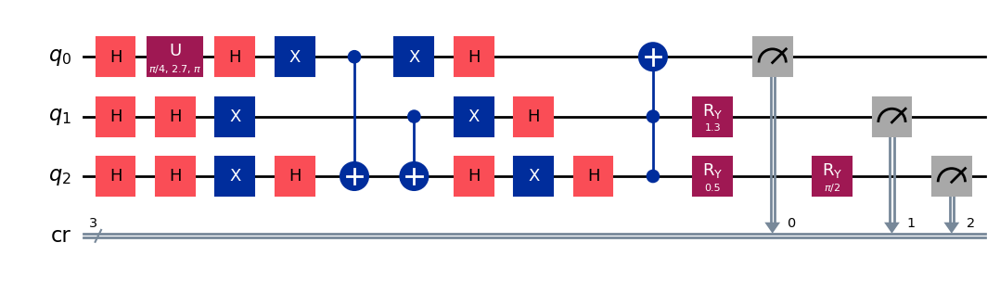

gen = 0 , Best fitness = (0.7259,)
gen = 1 , Best fitness = (0.7259,) , Number of invalids = 0

[Run 3 | Gen 67/99] Best Fitness: 0.7259 | Fidelity: 0.8519 | Gates: 29


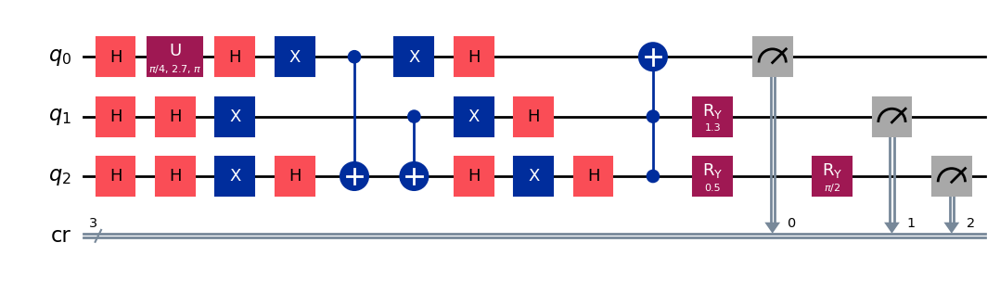

gen = 0 , Best fitness = (0.7259,)
gen = 1 , Best fitness = (0.7224999999999999,) , Number of invalids = 0

[Run 3 | Gen 68/99] Best Fitness: 0.7225 | Fidelity: 0.8522 | Gates: 29


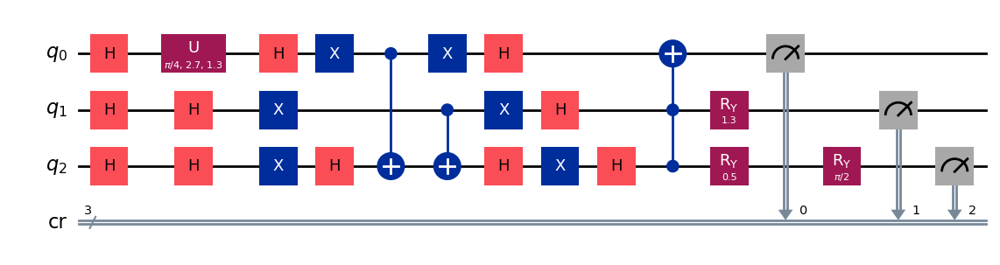

gen = 0 , Best fitness = (0.7224999999999999,)
gen = 1 , Best fitness = (0.7224999999999999,) , Number of invalids = 0

[Run 3 | Gen 69/99] Best Fitness: 0.7225 | Fidelity: 0.8499 | Gates: 29


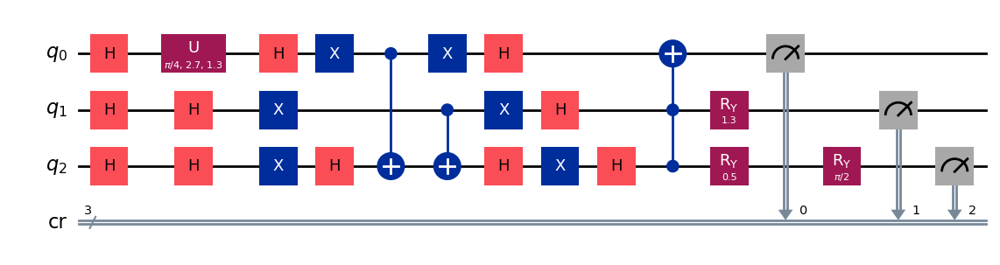

gen = 0 , Best fitness = (0.7224999999999999,)
gen = 1 , Best fitness = (0.7121,) , Number of invalids = 0

[Run 3 | Gen 70/99] Best Fitness: 0.7121 | Fidelity: 0.8859 | Gates: 30


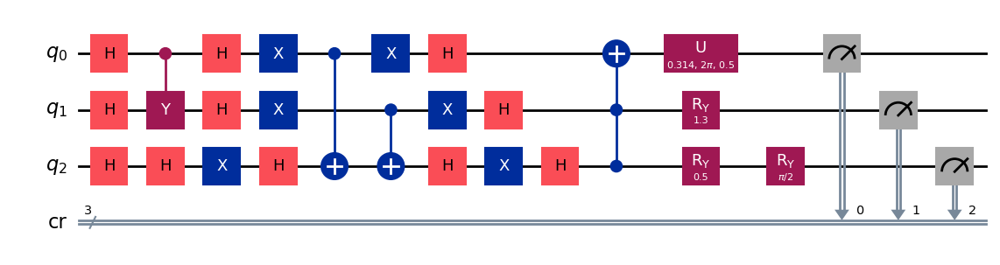

gen = 0 , Best fitness = (0.7121,)
gen = 1 , Best fitness = (0.7121,) , Number of invalids = 0

[Run 3 | Gen 71/99] Best Fitness: 0.7121 | Fidelity: 0.8850 | Gates: 30


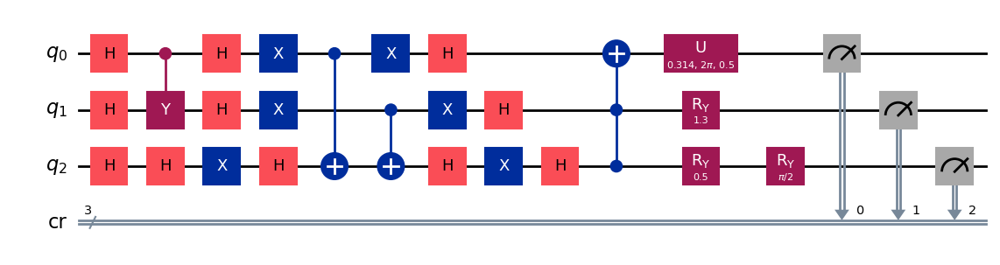

gen = 0 , Best fitness = (0.7121,)
gen = 1 , Best fitness = (0.7121,) , Number of invalids = 0

[Run 3 | Gen 72/99] Best Fitness: 0.7121 | Fidelity: 0.8896 | Gates: 30


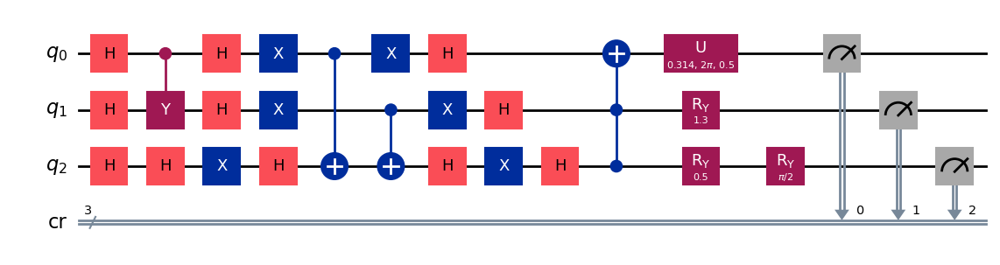

gen = 0 , Best fitness = (0.7121,)
gen = 1 , Best fitness = (0.7074,) , Number of invalids = 0

[Run 3 | Gen 73/99] Best Fitness: 0.7074 | Fidelity: 0.8865 | Gates: 30


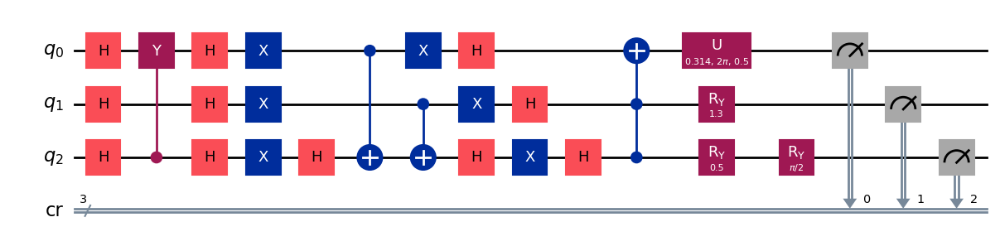

gen = 0 , Best fitness = (0.7074,)
gen = 1 , Best fitness = (0.7074,) , Number of invalids = 0

[Run 3 | Gen 74/99] Best Fitness: 0.7074 | Fidelity: 0.8904 | Gates: 30


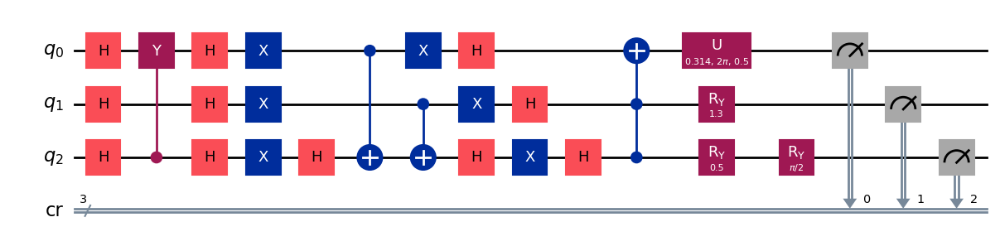

gen = 0 , Best fitness = (0.7074,)
gen = 1 , Best fitness = (0.7074,) , Number of invalids = 0

[Run 3 | Gen 75/99] Best Fitness: 0.7074 | Fidelity: 0.8900 | Gates: 30


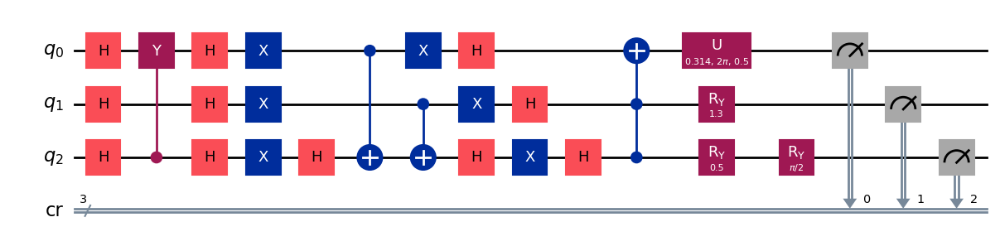

gen = 0 , Best fitness = (0.7074,)
gen = 1 , Best fitness = (0.7074,) , Number of invalids = 0

[Run 3 | Gen 76/99] Best Fitness: 0.7074 | Fidelity: 0.8934 | Gates: 30


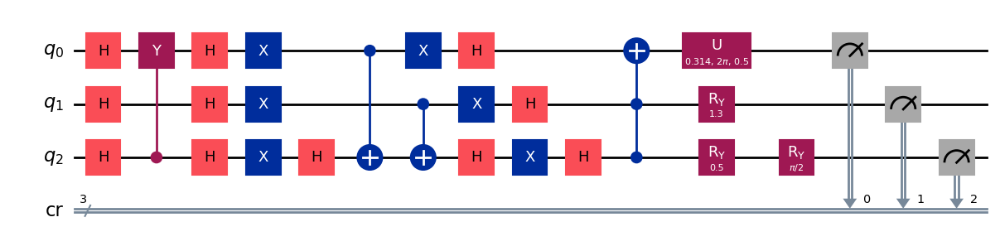

gen = 0 , Best fitness = (0.7074,)
gen = 1 , Best fitness = (0.7074,) , Number of invalids = 0

[Run 3 | Gen 77/99] Best Fitness: 0.7074 | Fidelity: 0.8956 | Gates: 30


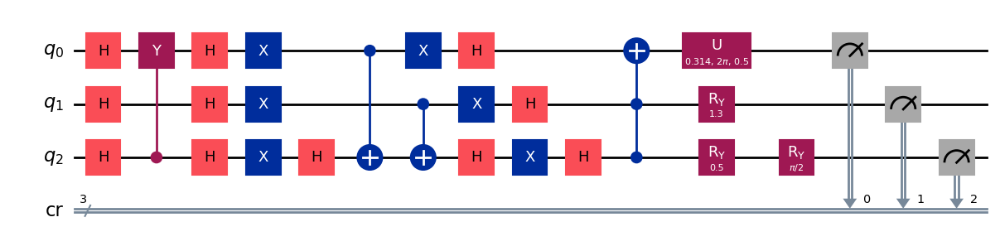

gen = 0 , Best fitness = (0.7074,)
gen = 1 , Best fitness = (0.7074,) , Number of invalids = 0

[Run 3 | Gen 78/99] Best Fitness: 0.7074 | Fidelity: 0.8911 | Gates: 30


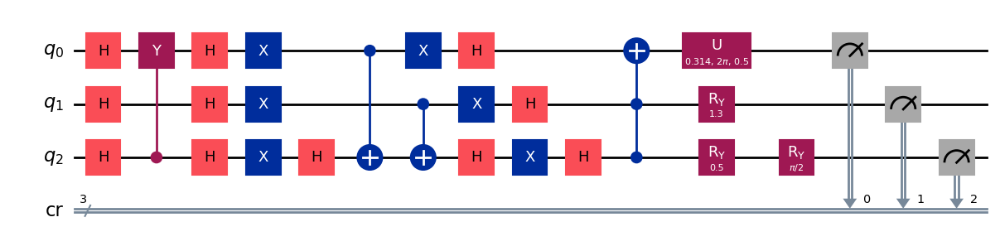

gen = 0 , Best fitness = (0.7074,)
gen = 1 , Best fitness = (0.6978,) , Number of invalids = 0

[Run 3 | Gen 79/99] Best Fitness: 0.6978 | Fidelity: 0.8985 | Gates: 30


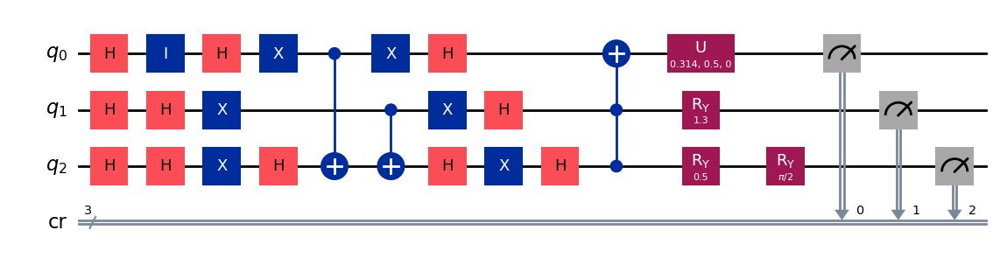

gen = 0 , Best fitness = (0.6978,)
gen = 1 , Best fitness = (0.6978,) , Number of invalids = 0

[Run 3 | Gen 80/99] Best Fitness: 0.6978 | Fidelity: 0.8959 | Gates: 30


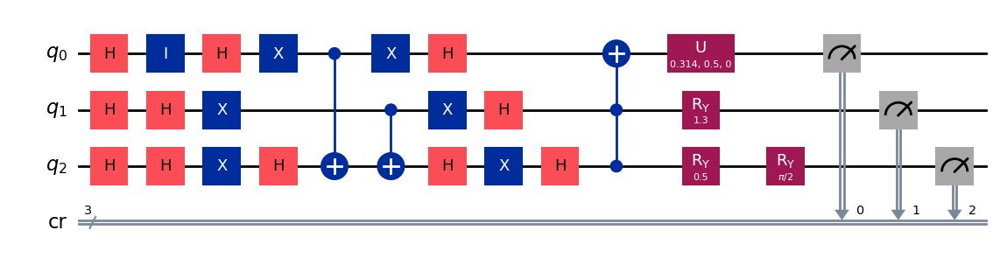

gen = 0 , Best fitness = (0.6978,)
gen = 1 , Best fitness = (0.6978,) , Number of invalids = 0

[Run 3 | Gen 81/99] Best Fitness: 0.6978 | Fidelity: 0.8972 | Gates: 30


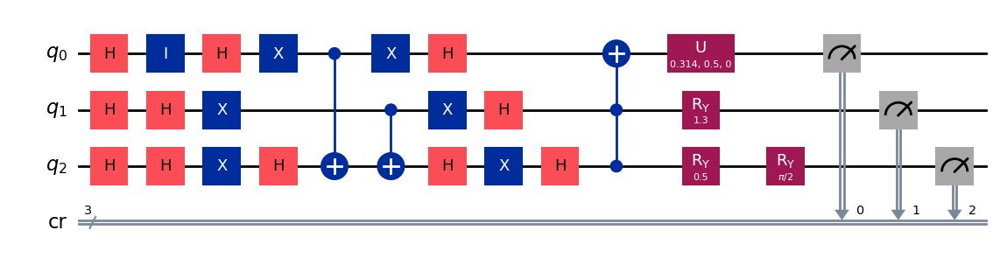

gen = 0 , Best fitness = (0.6978,)
gen = 1 , Best fitness = (0.6978,) , Number of invalids = 0

[Run 3 | Gen 82/99] Best Fitness: 0.6978 | Fidelity: 0.8971 | Gates: 30


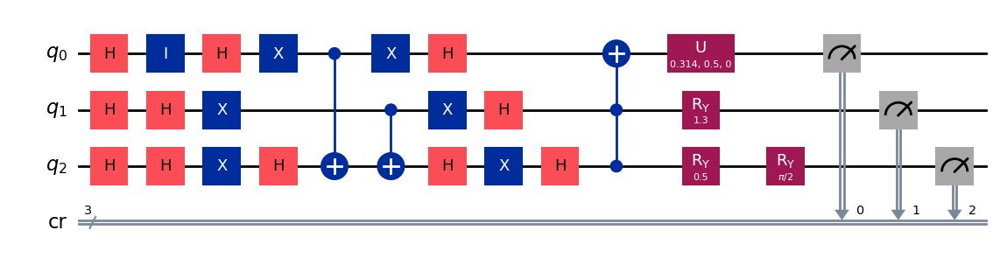

gen = 0 , Best fitness = (0.6978,)
gen = 1 , Best fitness = (0.6978,) , Number of invalids = 0

[Run 3 | Gen 83/99] Best Fitness: 0.6978 | Fidelity: 0.8982 | Gates: 30


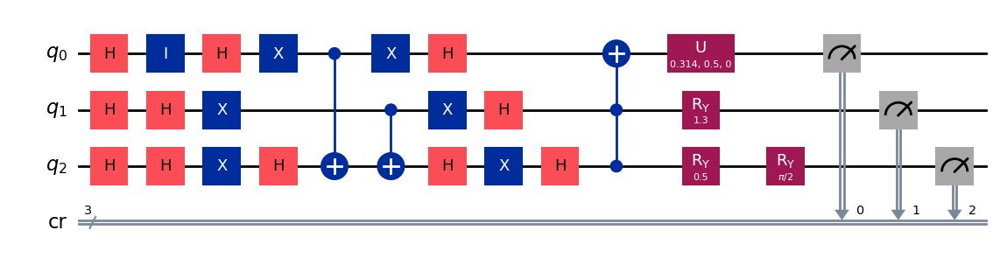

gen = 0 , Best fitness = (0.6978,)
gen = 1 , Best fitness = (0.6887,) , Number of invalids = 0

[Run 3 | Gen 84/99] Best Fitness: 0.6887 | Fidelity: 0.9115 | Gates: 30


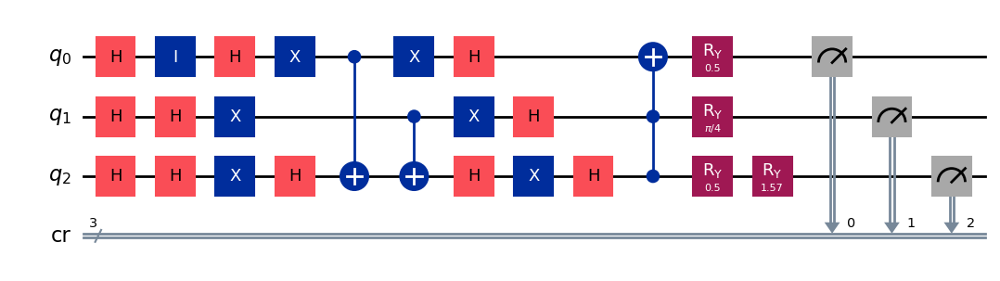

gen = 0 , Best fitness = (0.6887,)
gen = 1 , Best fitness = (0.6887,) , Number of invalids = 0

[Run 3 | Gen 85/99] Best Fitness: 0.6887 | Fidelity: 0.9144 | Gates: 30


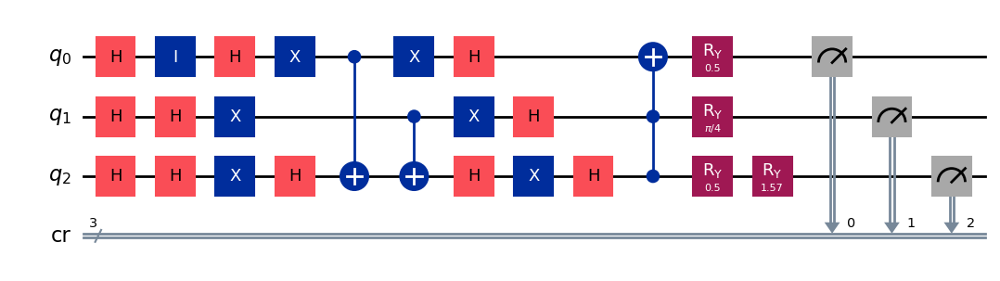

gen = 0 , Best fitness = (0.6887,)
gen = 1 , Best fitness = (0.6887,) , Number of invalids = 0

[Run 3 | Gen 86/99] Best Fitness: 0.6887 | Fidelity: 0.9143 | Gates: 30


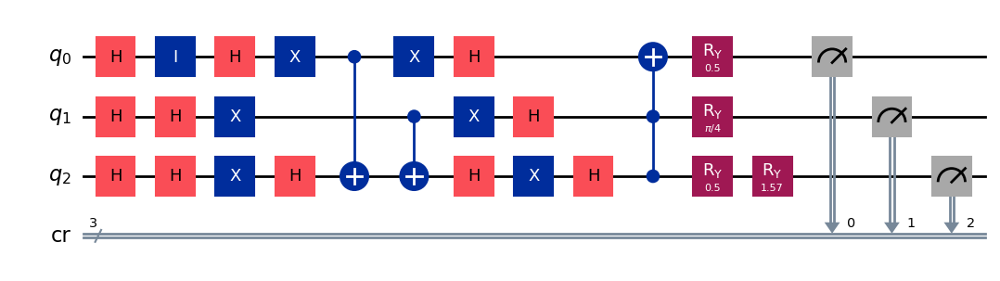

gen = 0 , Best fitness = (0.6887,)
gen = 1 , Best fitness = (0.6875,) , Number of invalids = 0

[Run 3 | Gen 87/99] Best Fitness: 0.6875 | Fidelity: 0.9082 | Gates: 30


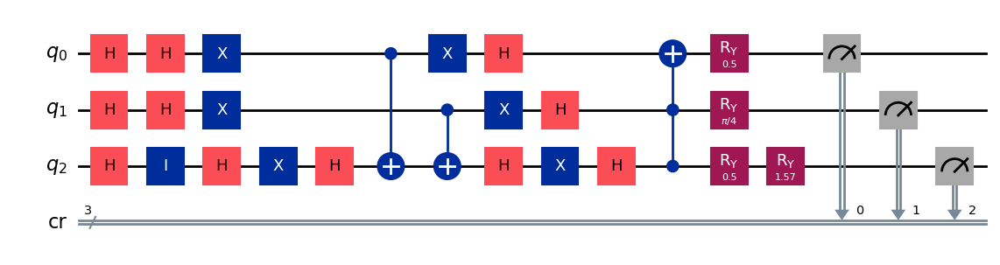

gen = 0 , Best fitness = (0.6875,)
gen = 1 , Best fitness = (0.6875,) , Number of invalids = 0

[Run 3 | Gen 88/99] Best Fitness: 0.6875 | Fidelity: 0.9103 | Gates: 30


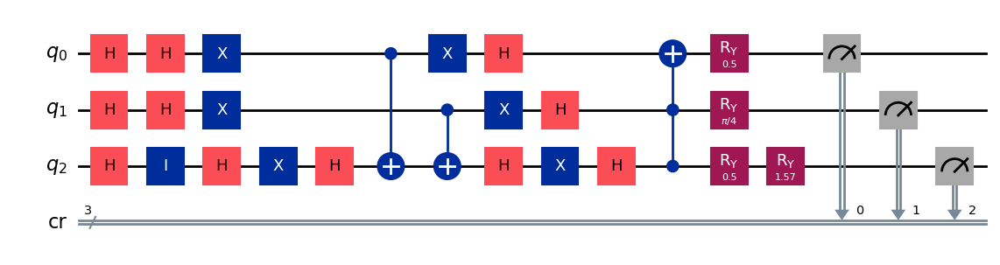

gen = 0 , Best fitness = (0.6875,)
gen = 1 , Best fitness = (0.6823,) , Number of invalids = 0

[Run 3 | Gen 89/99] Best Fitness: 0.6823 | Fidelity: 0.9137 | Gates: 30


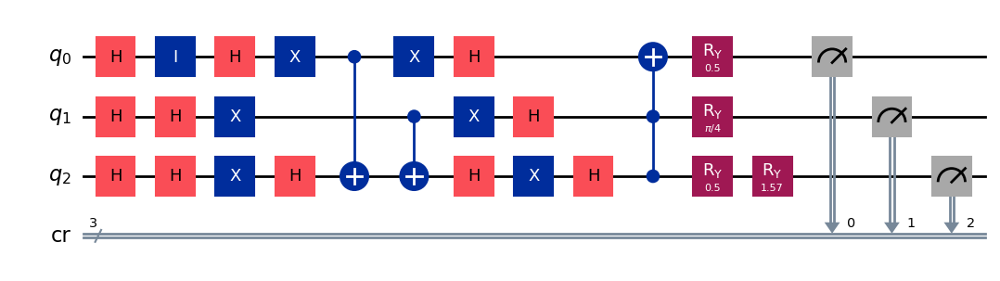

gen = 0 , Best fitness = (0.6823,)
gen = 1 , Best fitness = (0.6823,) , Number of invalids = 0

[Run 3 | Gen 90/99] Best Fitness: 0.6823 | Fidelity: 0.9113 | Gates: 30


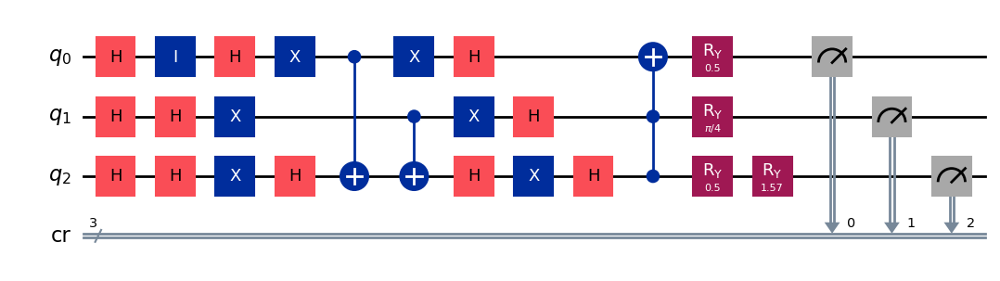

gen = 0 , Best fitness = (0.6823,)
gen = 1 , Best fitness = (0.6823,) , Number of invalids = 0

[Run 3 | Gen 91/99] Best Fitness: 0.6823 | Fidelity: 0.9120 | Gates: 30


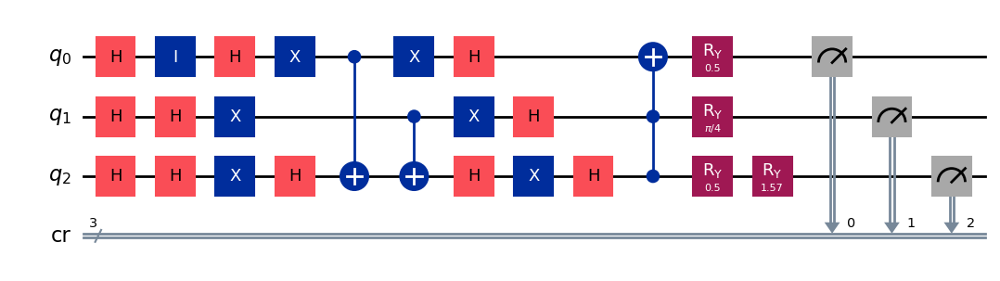

gen = 0 , Best fitness = (0.6823,)
gen = 1 , Best fitness = (0.6823,) , Number of invalids = 0

[Run 3 | Gen 92/99] Best Fitness: 0.6823 | Fidelity: 0.9191 | Gates: 30


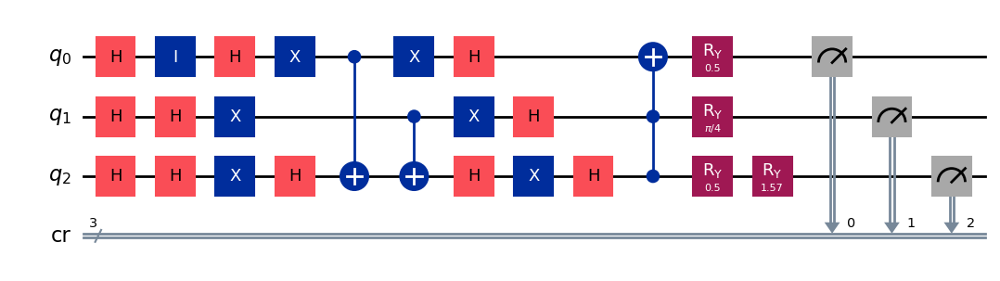

gen = 0 , Best fitness = (0.6823,)
gen = 1 , Best fitness = (0.6823,) , Number of invalids = 0

[Run 3 | Gen 93/99] Best Fitness: 0.6823 | Fidelity: 0.9169 | Gates: 30


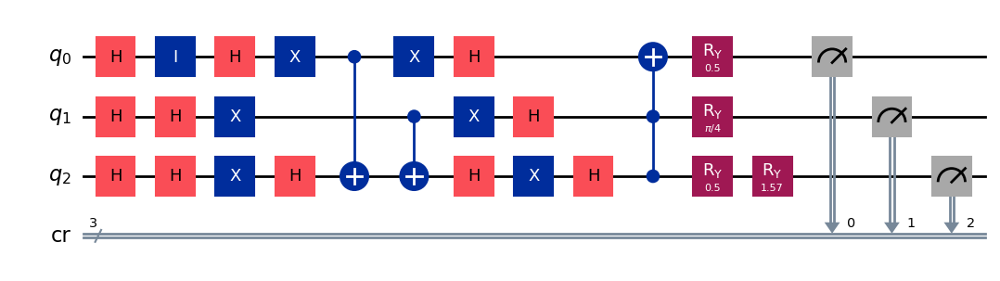

gen = 0 , Best fitness = (0.6823,)
gen = 1 , Best fitness = (0.6823,) , Number of invalids = 0

[Run 3 | Gen 94/99] Best Fitness: 0.6823 | Fidelity: 0.9169 | Gates: 30


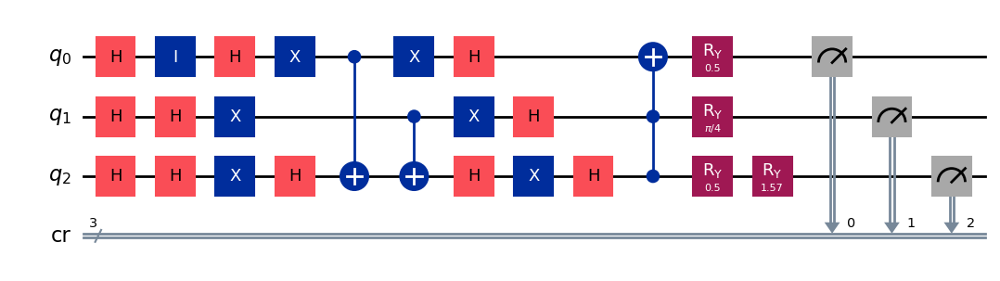

gen = 0 , Best fitness = (0.6823,)
gen = 1 , Best fitness = (0.6823,) , Number of invalids = 0

[Run 3 | Gen 95/99] Best Fitness: 0.6823 | Fidelity: 0.9124 | Gates: 30


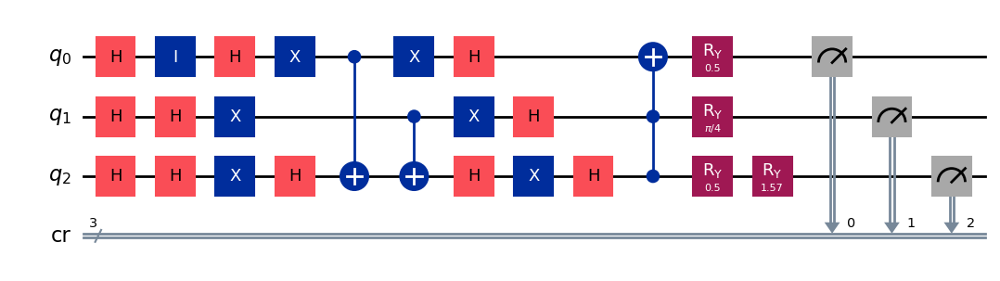

gen = 0 , Best fitness = (0.6823,)
gen = 1 , Best fitness = (0.6823,) , Number of invalids = 0

[Run 3 | Gen 96/99] Best Fitness: 0.6823 | Fidelity: 0.9118 | Gates: 30


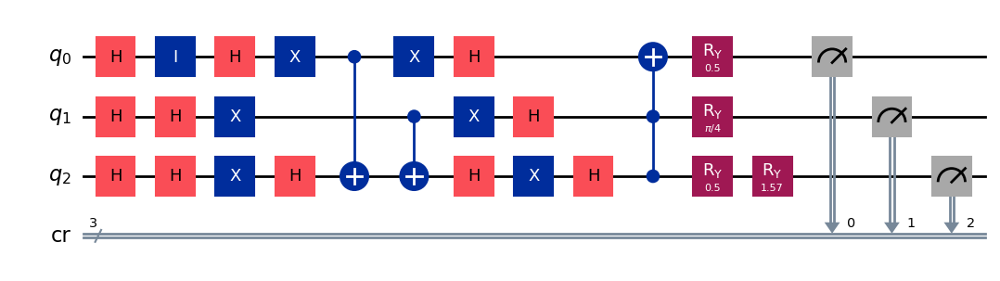

gen = 0 , Best fitness = (0.6823,)
gen = 1 , Best fitness = (0.6818,) , Number of invalids = 0

[Run 3 | Gen 97/99] Best Fitness: 0.6818 | Fidelity: 0.9073 | Gates: 30


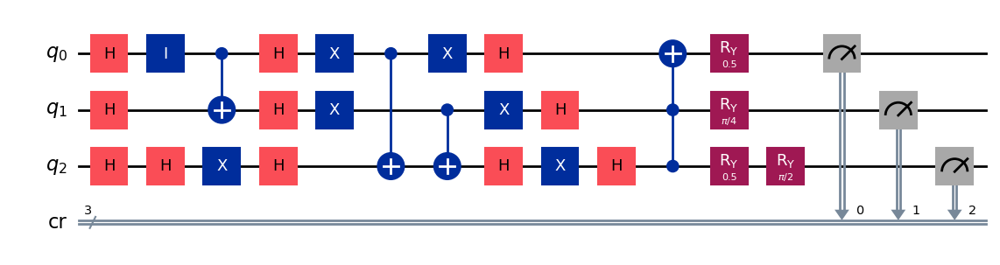

gen = 0 , Best fitness = (0.6818,)
gen = 1 , Best fitness = (0.6818,) , Number of invalids = 0

[Run 3 | Gen 98/99] Best Fitness: 0.6818 | Fidelity: 0.9118 | Gates: 30


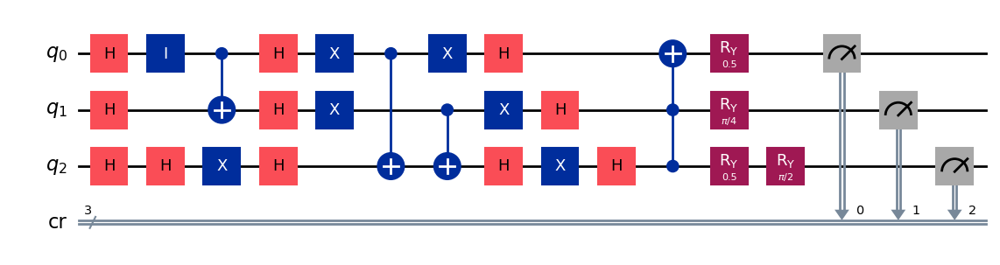

gen = 0 , Best fitness = (0.6818,)
gen = 1 , Best fitness = (0.6818,) , Number of invalids = 0

[Run 3 | Gen 99/99] Best Fitness: 0.6818 | Fidelity: 0.9151 | Gates: 30


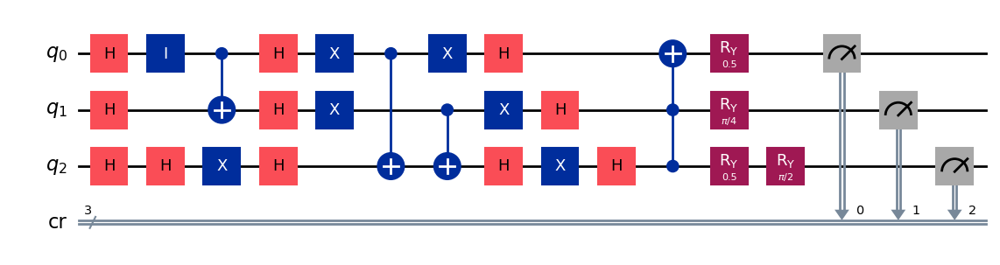


Generating evolution plots for Run 3...
✓ Plot saved to: experiments_state_111/run_3_seed_75264/evolution_metrics_run_3.png


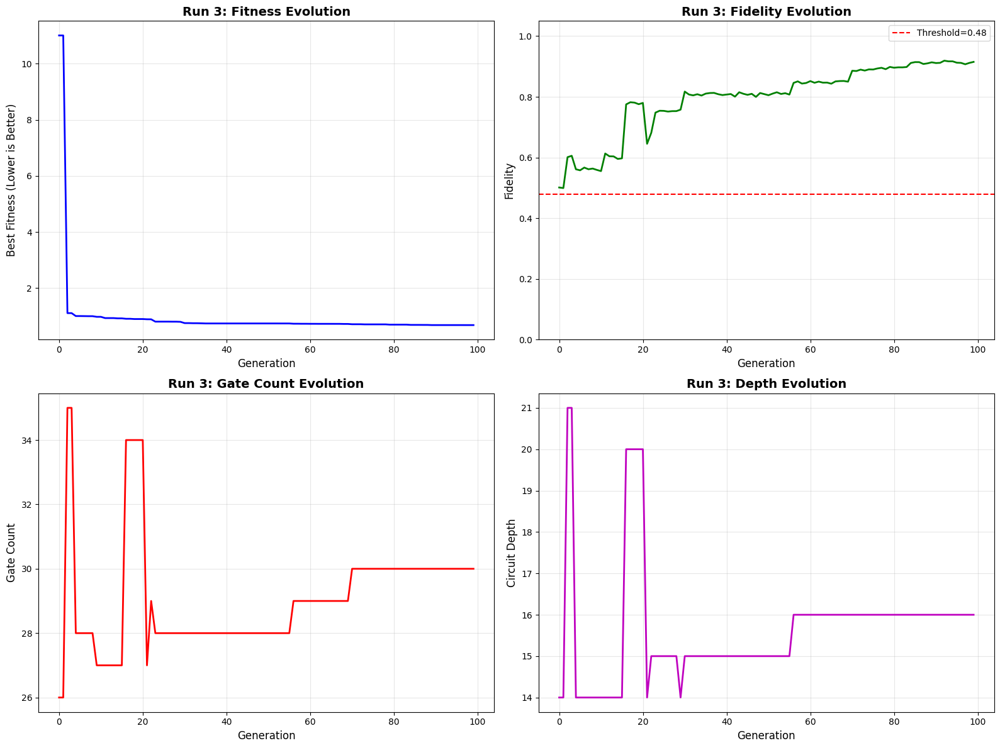


✓ Run 3 COMPLETE | Fidelity: 0.9126 | Gates: 30 | Depth: 16


RUN 4/5 | Target: 111 | Seed: 57697
✓ Logging to: experiments_state_111/run_4_seed_57697
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (1.6101999999999999,)
gen = 1 , Best fitness = (1.6065999999999998,) , Number of invalids = 155

[Run 4 | Gen 0/99] Best Fitness: 1.6066 | Fidelity: 0.5539 | Gates: 58


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


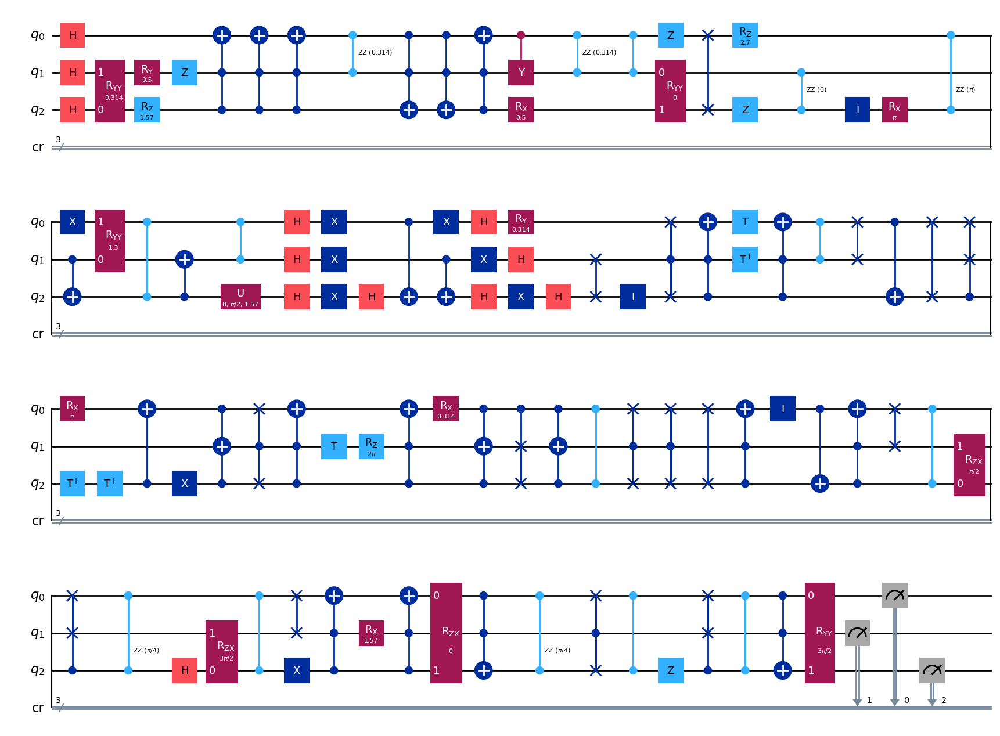

gen = 0 , Best fitness = (1.6065999999999998,)
gen = 1 , Best fitness = (1.6065999999999998,) , Number of invalids = 80

[Run 4 | Gen 1/99] Best Fitness: 1.6066 | Fidelity: 0.5524 | Gates: 58


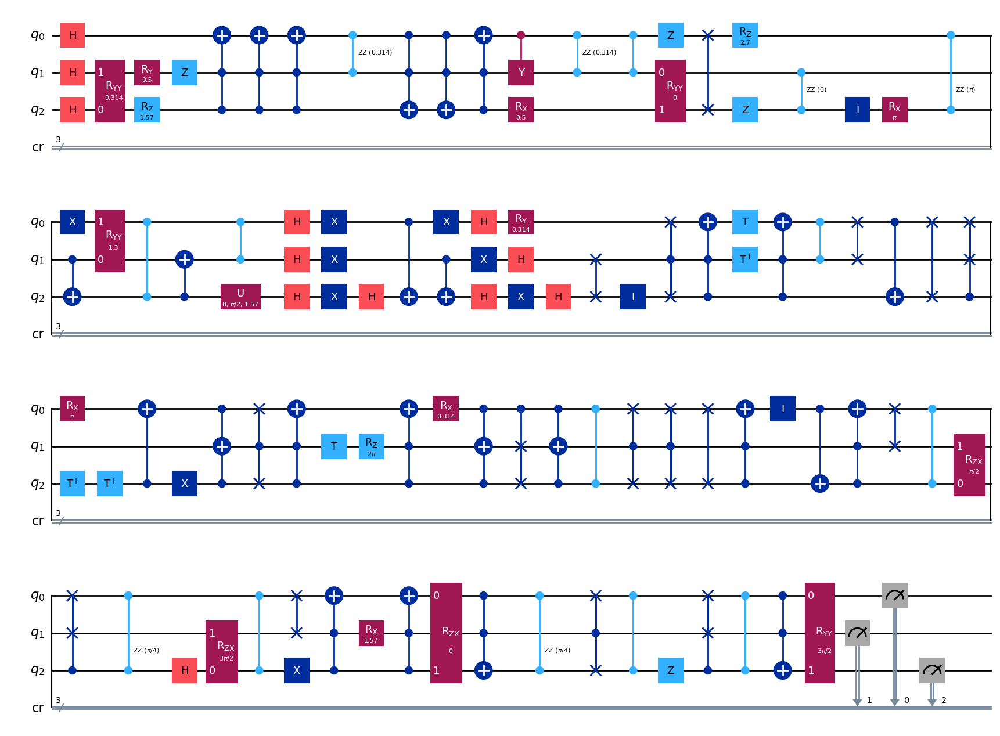

gen = 0 , Best fitness = (1.6065999999999998,)
gen = 1 , Best fitness = (1.5947999999999998,) , Number of invalids = 56

[Run 4 | Gen 2/99] Best Fitness: 1.5948 | Fidelity: 0.5552 | Gates: 58


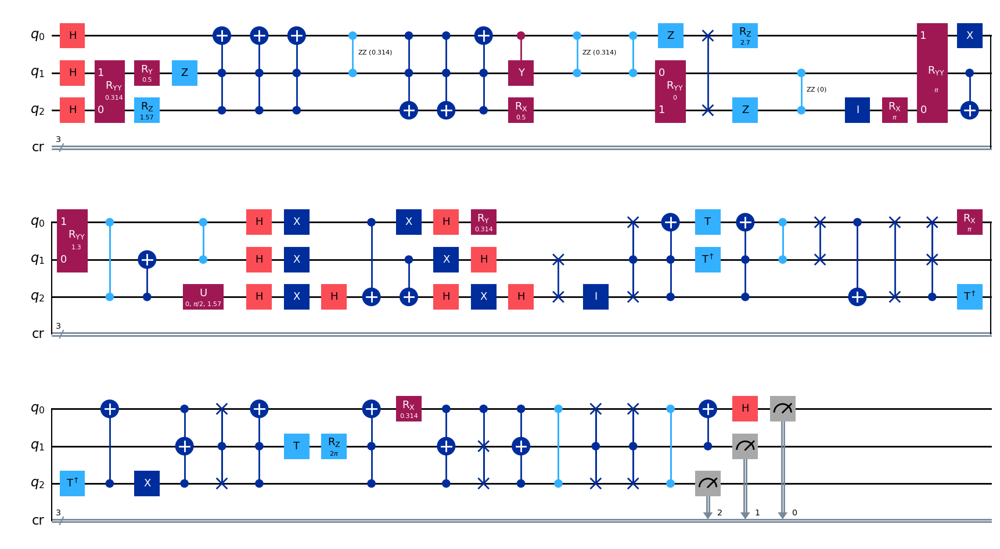

gen = 0 , Best fitness = (1.5947999999999998,)
gen = 1 , Best fitness = (1.2138,) , Number of invalids = 38

[Run 4 | Gen 3/99] Best Fitness: 1.2138 | Fidelity: 0.6237 | Gates: 42


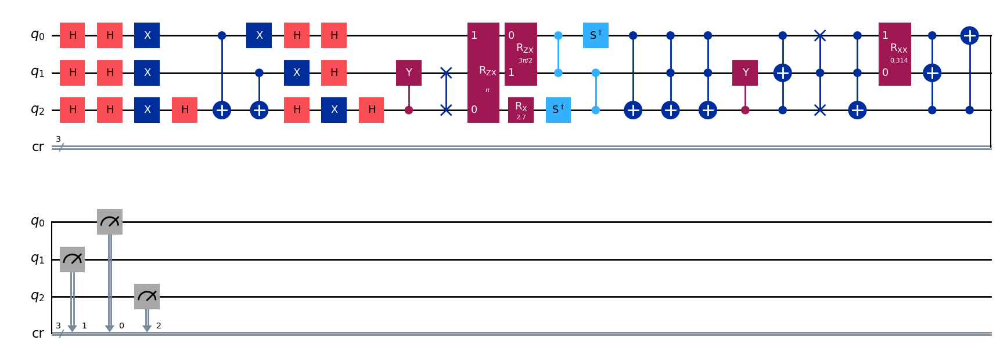

gen = 0 , Best fitness = (1.2138,)
gen = 1 , Best fitness = (1.2138,) , Number of invalids = 20

[Run 4 | Gen 4/99] Best Fitness: 1.2138 | Fidelity: 0.6285 | Gates: 42


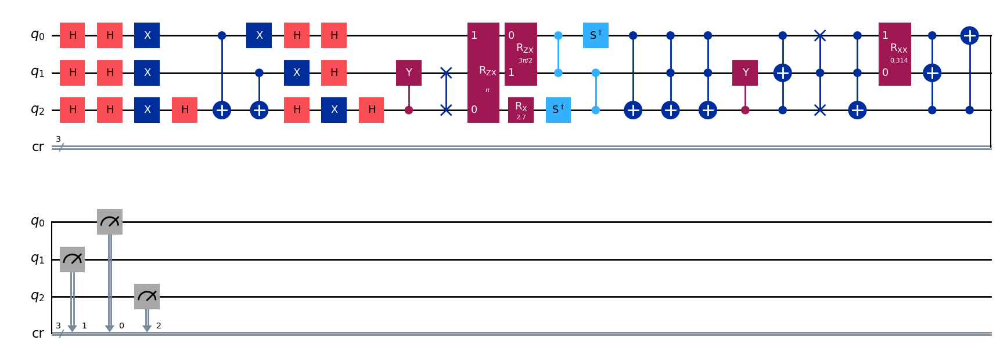

gen = 0 , Best fitness = (1.2138,)
gen = 1 , Best fitness = (1.2138,) , Number of invalids = 14

[Run 4 | Gen 5/99] Best Fitness: 1.2138 | Fidelity: 0.6237 | Gates: 42


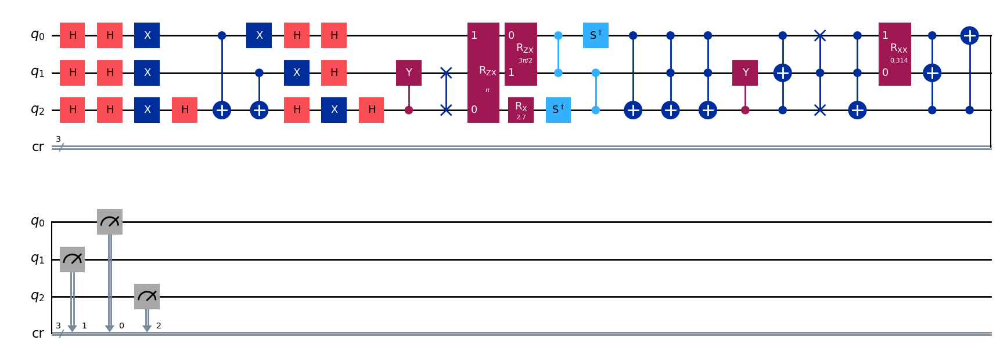

gen = 0 , Best fitness = (1.2138,)
gen = 1 , Best fitness = (1.2138,) , Number of invalids = 20

[Run 4 | Gen 6/99] Best Fitness: 1.2138 | Fidelity: 0.6245 | Gates: 42


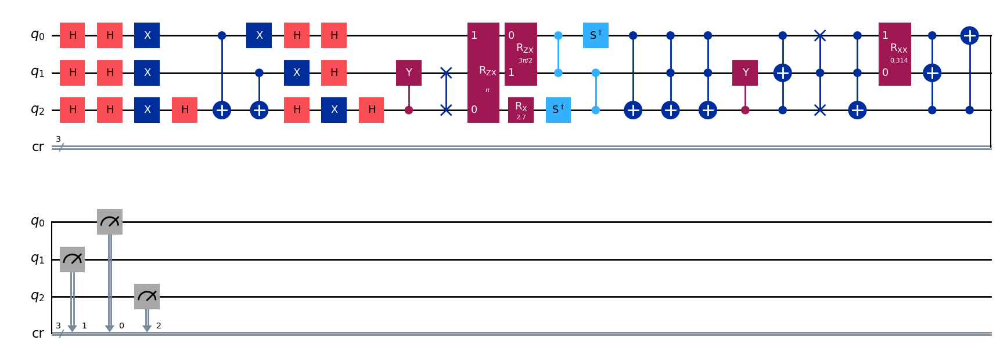

gen = 0 , Best fitness = (1.2138,)
gen = 1 , Best fitness = (1.2138,) , Number of invalids = 20

[Run 4 | Gen 7/99] Best Fitness: 1.2138 | Fidelity: 0.6214 | Gates: 42


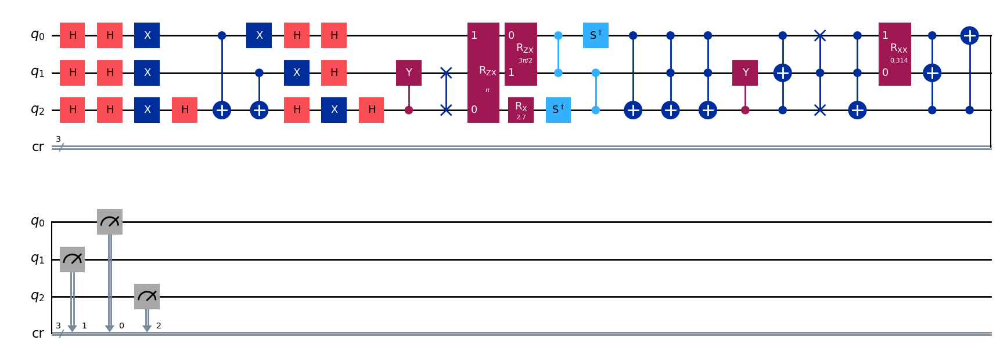

gen = 0 , Best fitness = (1.2138,)
gen = 1 , Best fitness = (1.2138,) , Number of invalids = 10

[Run 4 | Gen 8/99] Best Fitness: 1.2138 | Fidelity: 0.6191 | Gates: 42


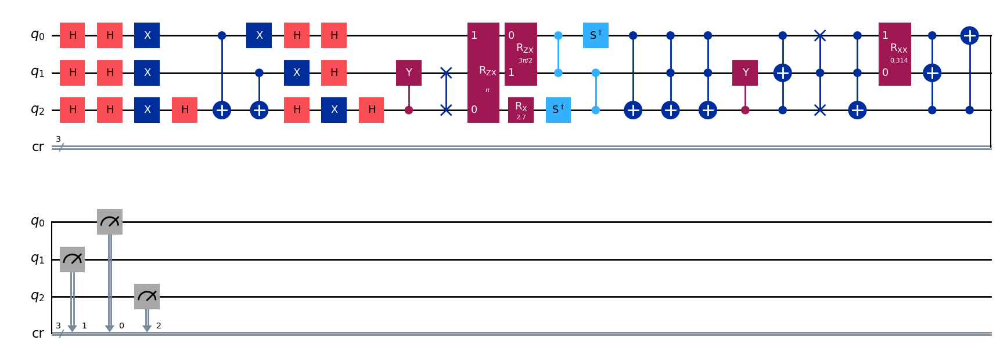

gen = 0 , Best fitness = (1.2138,)
gen = 1 , Best fitness = (1.2138,) , Number of invalids = 12

[Run 4 | Gen 9/99] Best Fitness: 1.2138 | Fidelity: 0.6250 | Gates: 42


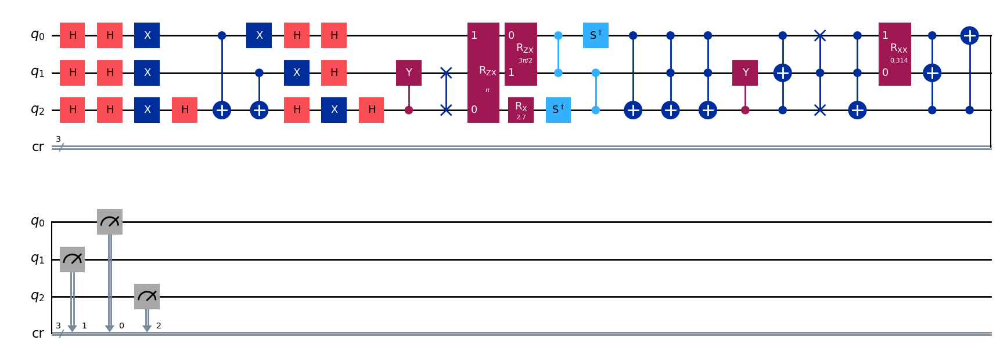

gen = 0 , Best fitness = (1.2138,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 10

[Run 4 | Gen 10/99] Best Fitness: 1.2094 | Fidelity: 0.6132 | Gates: 42


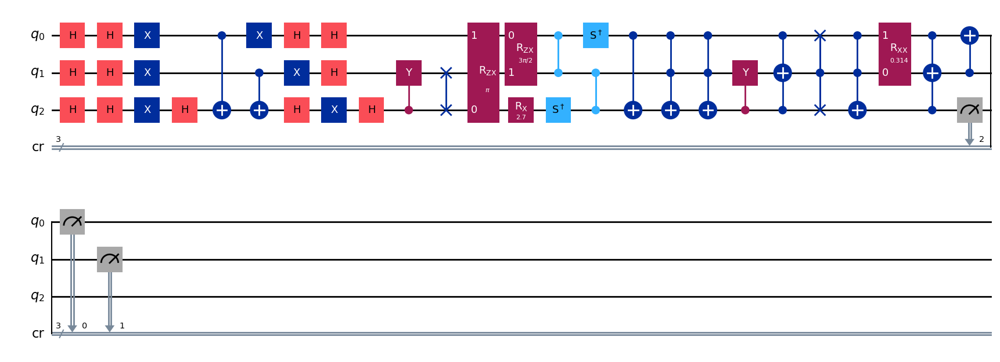

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 4

[Run 4 | Gen 11/99] Best Fitness: 1.2094 | Fidelity: 0.6259 | Gates: 42


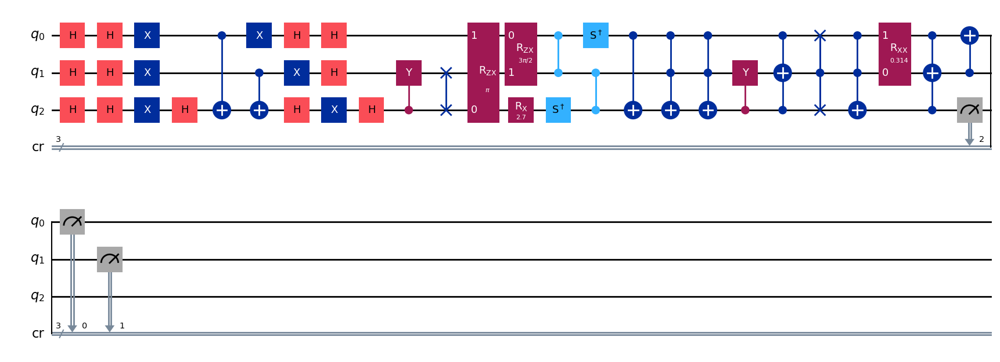

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 3

[Run 4 | Gen 12/99] Best Fitness: 1.2094 | Fidelity: 0.6208 | Gates: 42


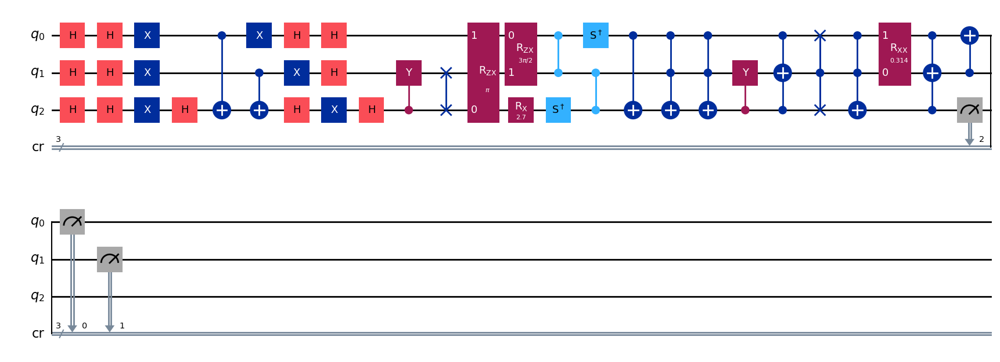

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 6

[Run 4 | Gen 13/99] Best Fitness: 1.2094 | Fidelity: 0.6330 | Gates: 42


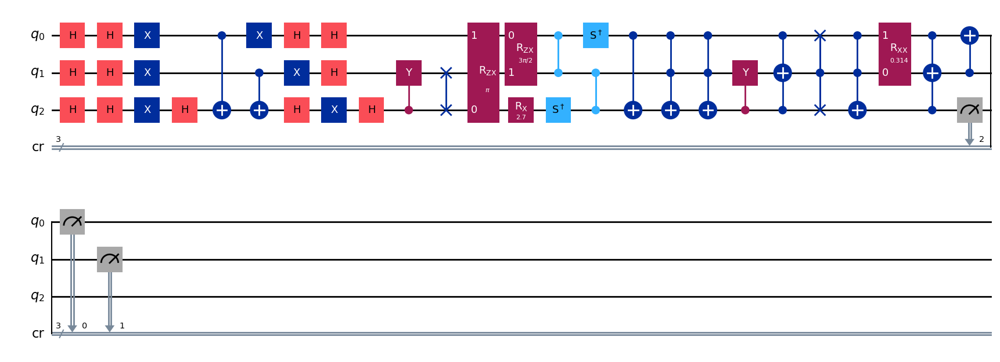

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 6

[Run 4 | Gen 14/99] Best Fitness: 1.2094 | Fidelity: 0.6166 | Gates: 42


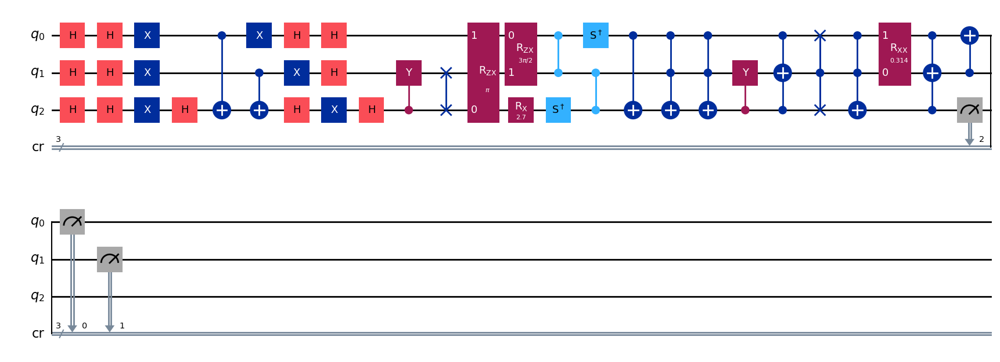

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 3

[Run 4 | Gen 15/99] Best Fitness: 1.2094 | Fidelity: 0.6252 | Gates: 42


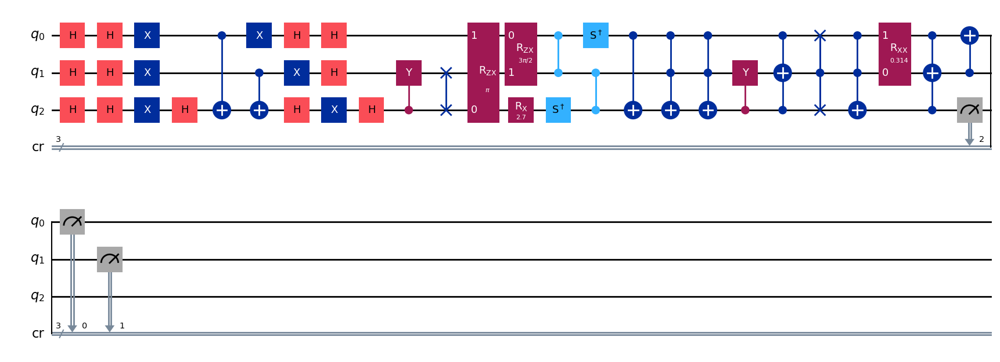

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 3

[Run 4 | Gen 16/99] Best Fitness: 1.2094 | Fidelity: 0.6162 | Gates: 42


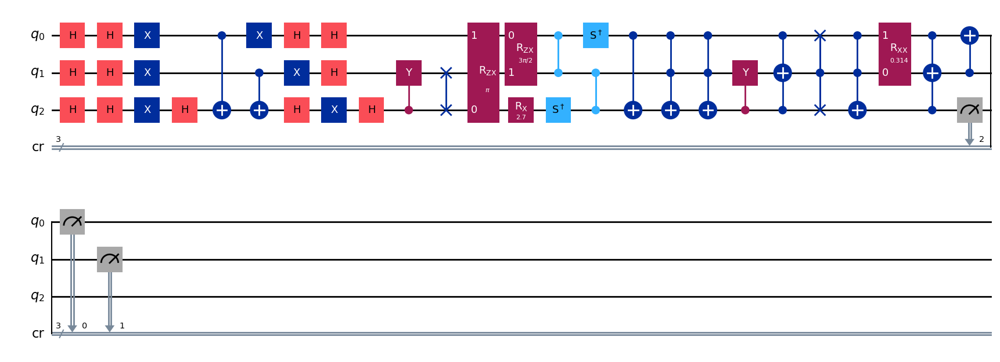

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 6

[Run 4 | Gen 17/99] Best Fitness: 1.2094 | Fidelity: 0.6174 | Gates: 42


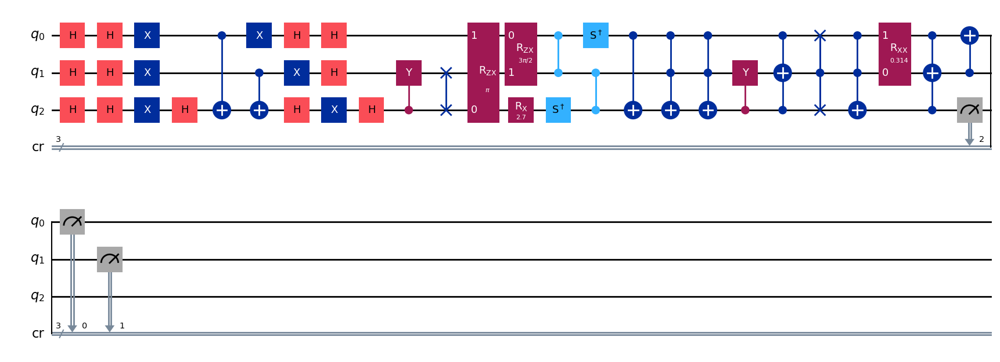

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 2

[Run 4 | Gen 18/99] Best Fitness: 1.2094 | Fidelity: 0.6199 | Gates: 42


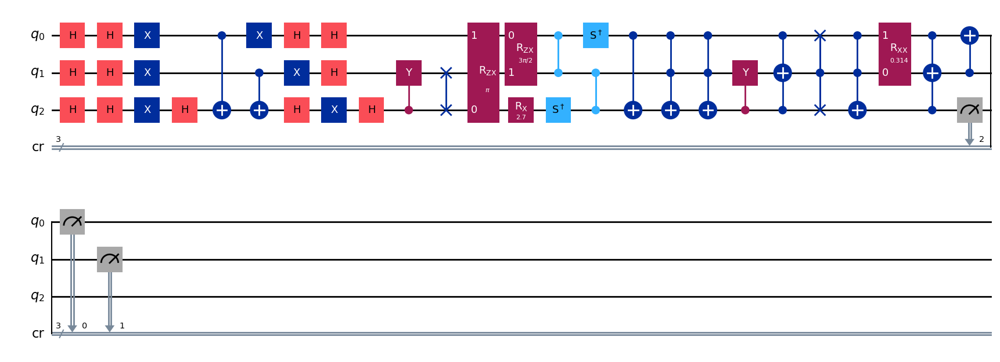

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 1

[Run 4 | Gen 19/99] Best Fitness: 1.2094 | Fidelity: 0.6284 | Gates: 42


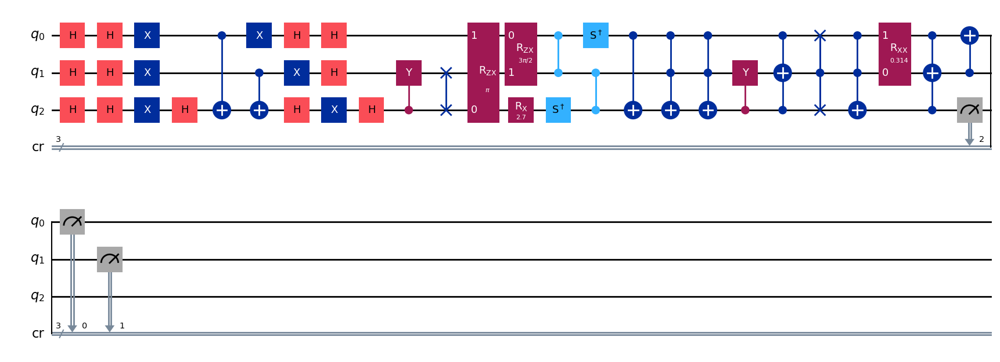

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 3

[Run 4 | Gen 20/99] Best Fitness: 1.2094 | Fidelity: 0.6184 | Gates: 42


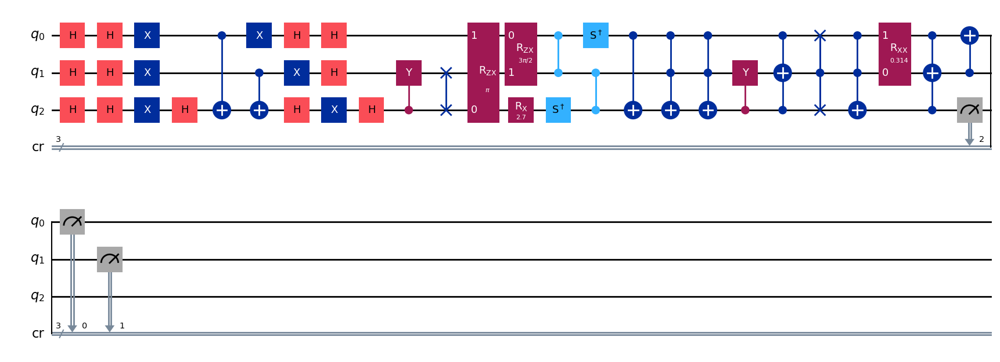

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 8

[Run 4 | Gen 21/99] Best Fitness: 1.2094 | Fidelity: 0.6259 | Gates: 42


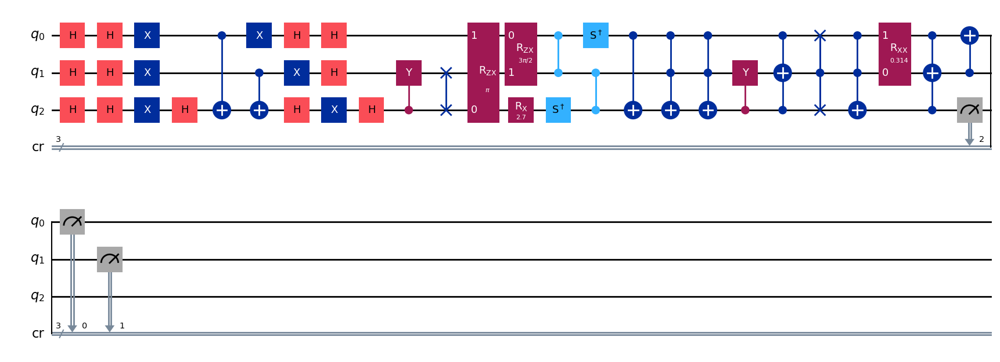

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 7

[Run 4 | Gen 22/99] Best Fitness: 1.2094 | Fidelity: 0.6246 | Gates: 42


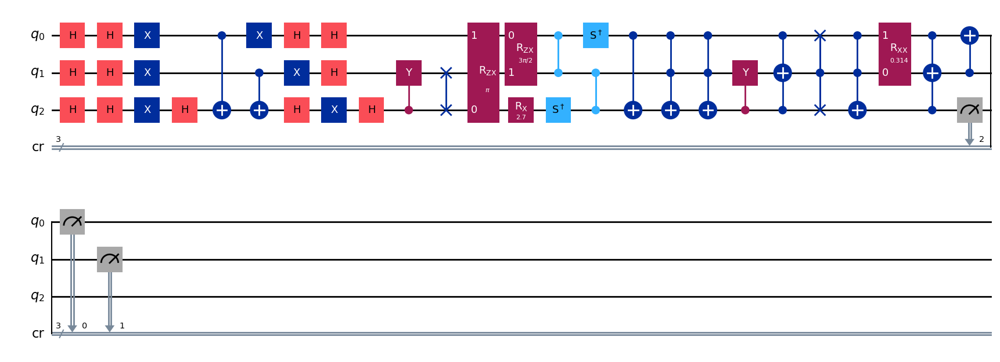

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 6

[Run 4 | Gen 23/99] Best Fitness: 1.2094 | Fidelity: 0.6262 | Gates: 42


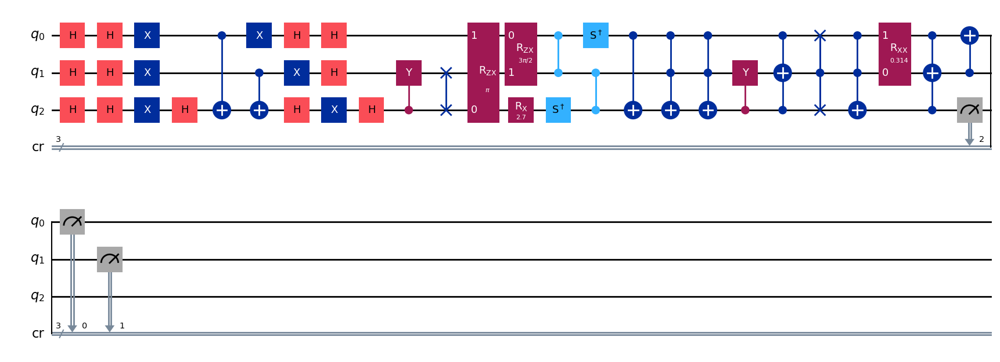

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 8

[Run 4 | Gen 24/99] Best Fitness: 1.2094 | Fidelity: 0.6182 | Gates: 42


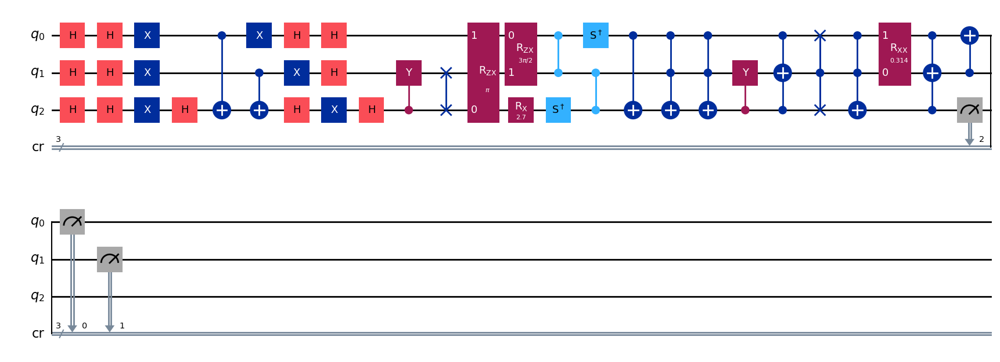

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 4

[Run 4 | Gen 25/99] Best Fitness: 1.2094 | Fidelity: 0.6215 | Gates: 42


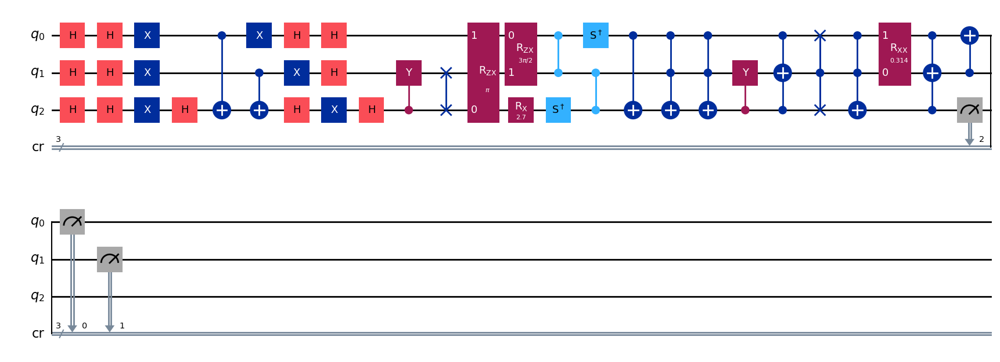

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 3

[Run 4 | Gen 26/99] Best Fitness: 1.2094 | Fidelity: 0.6267 | Gates: 42


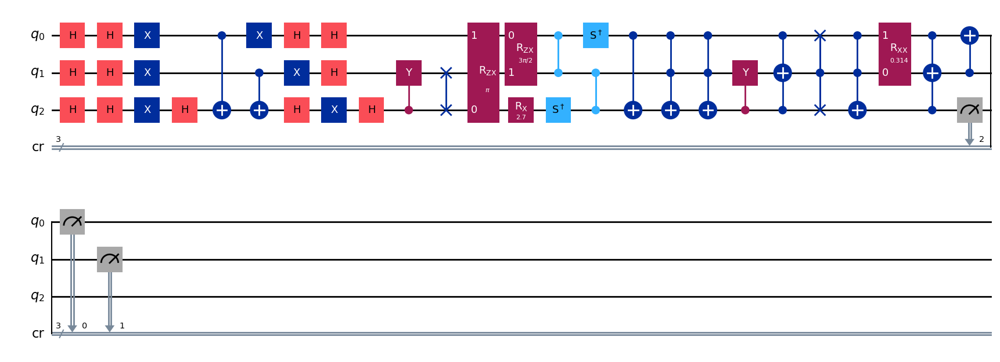

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 1

[Run 4 | Gen 27/99] Best Fitness: 1.2094 | Fidelity: 0.6223 | Gates: 42


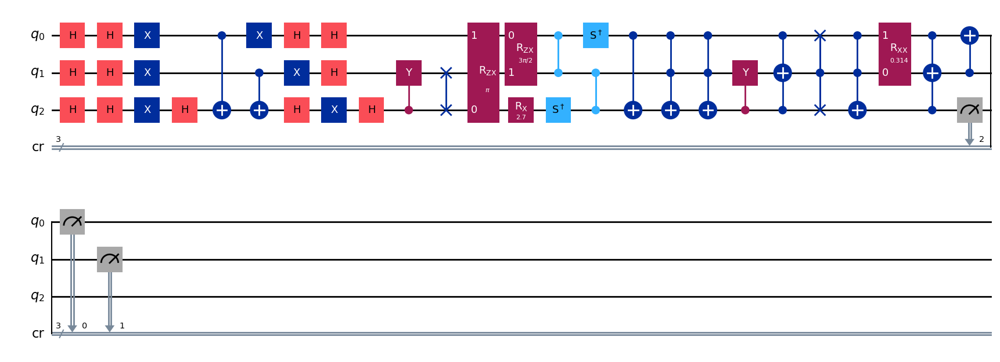

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 0

[Run 4 | Gen 28/99] Best Fitness: 1.2094 | Fidelity: 0.6301 | Gates: 42


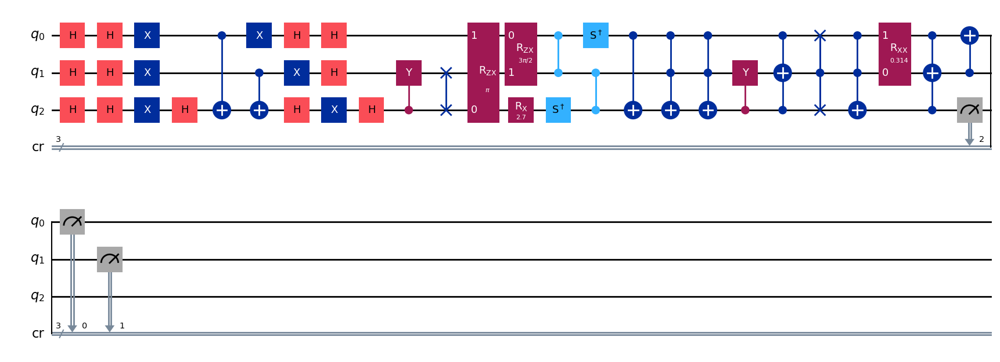

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 0

[Run 4 | Gen 29/99] Best Fitness: 1.2094 | Fidelity: 0.6284 | Gates: 42


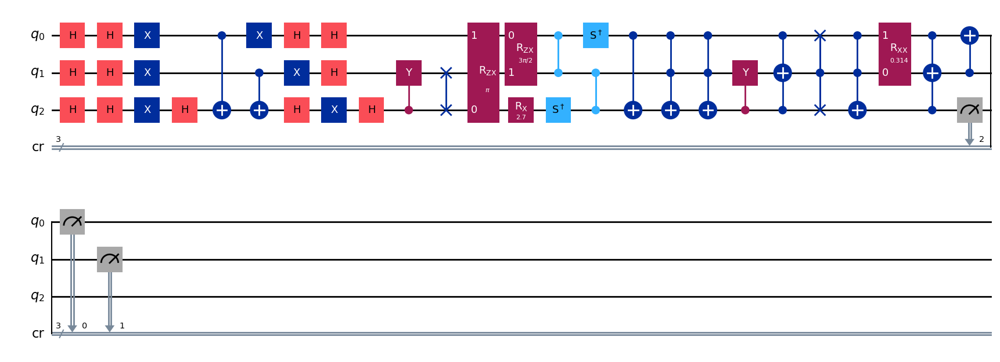

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 0

[Run 4 | Gen 30/99] Best Fitness: 1.2094 | Fidelity: 0.6158 | Gates: 42


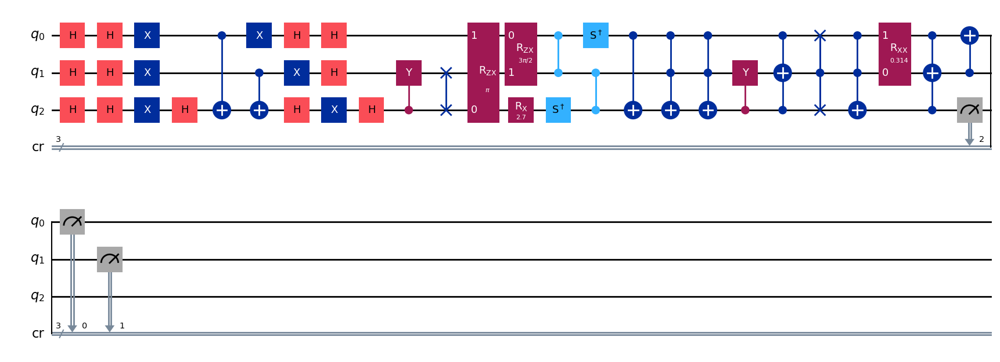

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 1

[Run 4 | Gen 31/99] Best Fitness: 1.2094 | Fidelity: 0.6245 | Gates: 42


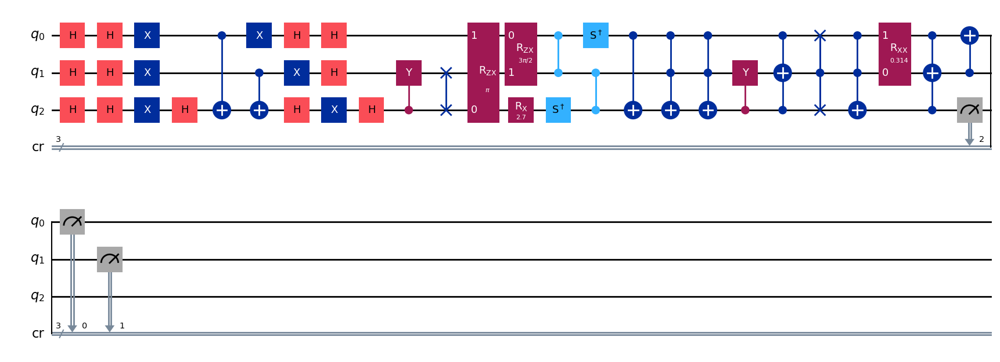

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (1.2094,) , Number of invalids = 2

[Run 4 | Gen 32/99] Best Fitness: 1.2094 | Fidelity: 0.6228 | Gates: 42


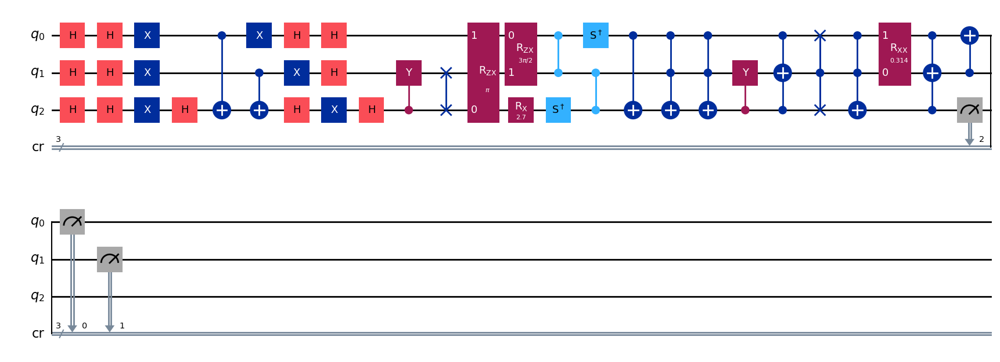

gen = 0 , Best fitness = (1.2094,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 2

[Run 4 | Gen 33/99] Best Fitness: 0.9474 | Fidelity: 0.6736 | Gates: 32


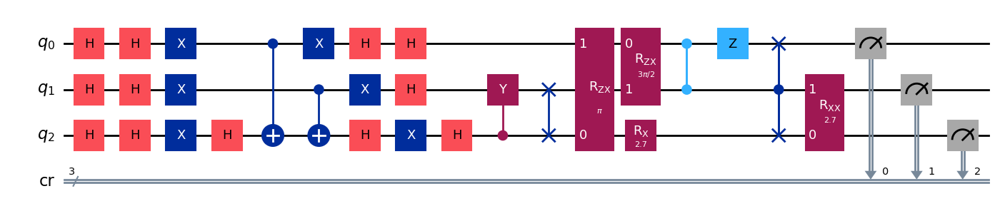

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 0

[Run 4 | Gen 34/99] Best Fitness: 0.9474 | Fidelity: 0.6740 | Gates: 32


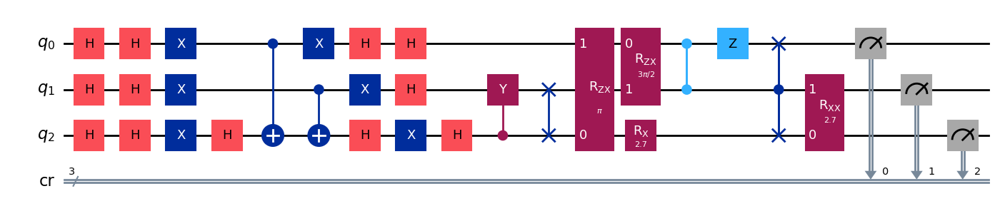

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 0

[Run 4 | Gen 35/99] Best Fitness: 0.9474 | Fidelity: 0.6826 | Gates: 32


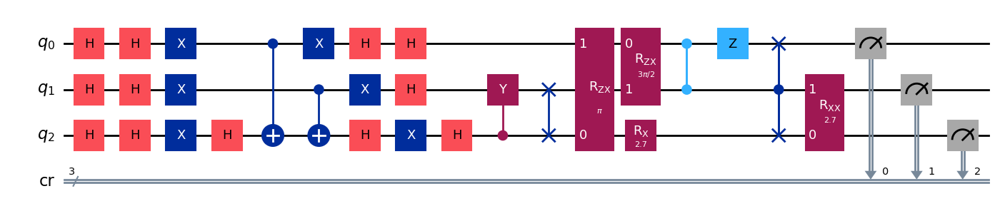

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 0

[Run 4 | Gen 36/99] Best Fitness: 0.9474 | Fidelity: 0.6784 | Gates: 32


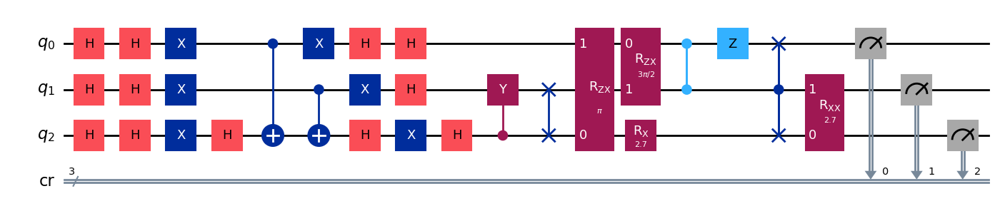

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 1

[Run 4 | Gen 37/99] Best Fitness: 0.9474 | Fidelity: 0.6826 | Gates: 32


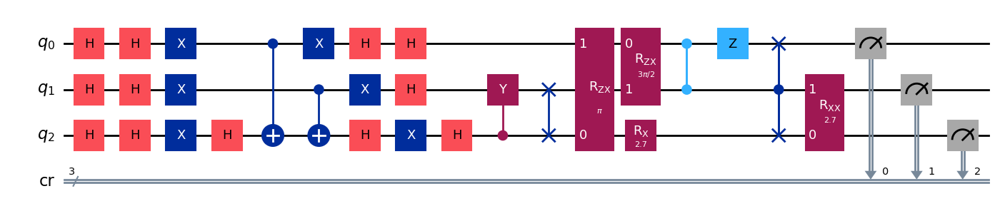

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 4

[Run 4 | Gen 38/99] Best Fitness: 0.9474 | Fidelity: 0.6845 | Gates: 32


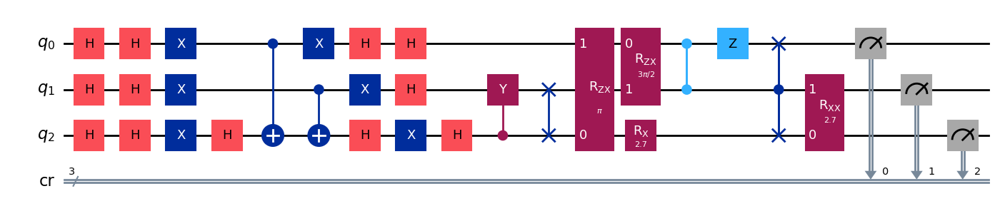

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 3

[Run 4 | Gen 39/99] Best Fitness: 0.9474 | Fidelity: 0.6859 | Gates: 32


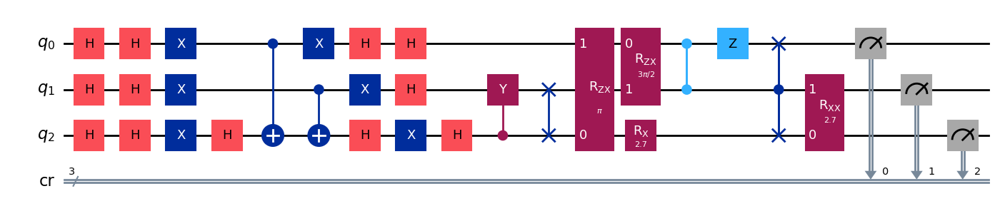

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 5

[Run 4 | Gen 40/99] Best Fitness: 0.9474 | Fidelity: 0.6846 | Gates: 32


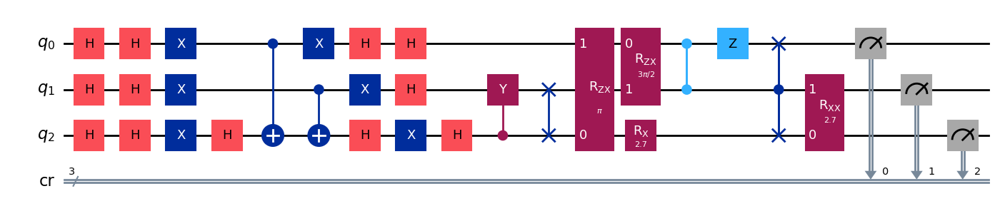

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 0

[Run 4 | Gen 41/99] Best Fitness: 0.9474 | Fidelity: 0.6786 | Gates: 32


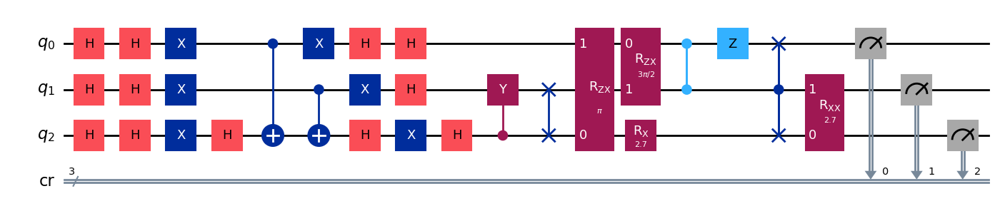

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 3

[Run 4 | Gen 42/99] Best Fitness: 0.9474 | Fidelity: 0.6748 | Gates: 32


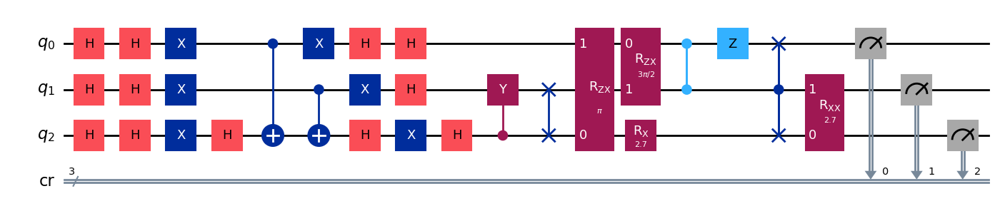

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 3

[Run 4 | Gen 43/99] Best Fitness: 0.9474 | Fidelity: 0.6848 | Gates: 32


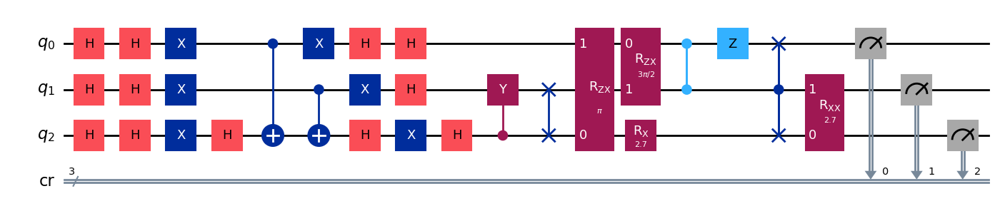

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.9474,) , Number of invalids = 7

[Run 4 | Gen 44/99] Best Fitness: 0.9474 | Fidelity: 0.6839 | Gates: 32


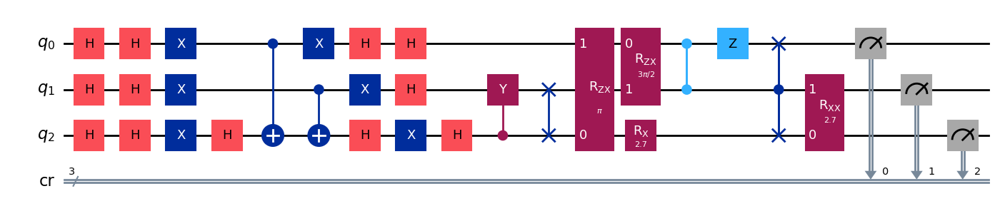

gen = 0 , Best fitness = (0.9474,)
gen = 1 , Best fitness = (0.8319,) , Number of invalids = 5

[Run 4 | Gen 45/99] Best Fitness: 0.8319 | Fidelity: 0.8074 | Gates: 32


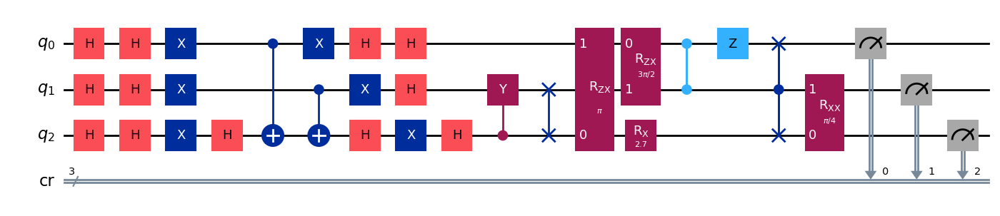

gen = 0 , Best fitness = (0.8319,)
gen = 1 , Best fitness = (0.8319,) , Number of invalids = 7

[Run 4 | Gen 46/99] Best Fitness: 0.8319 | Fidelity: 0.8098 | Gates: 32


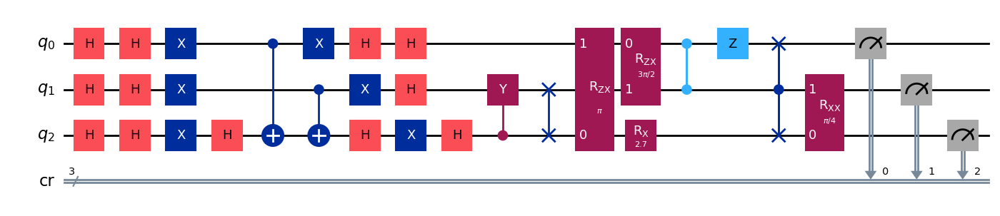

gen = 0 , Best fitness = (0.8319,)
gen = 1 , Best fitness = (0.7037,) , Number of invalids = 11

[Run 4 | Gen 47/99] Best Fitness: 0.7037 | Fidelity: 0.9346 | Gates: 32


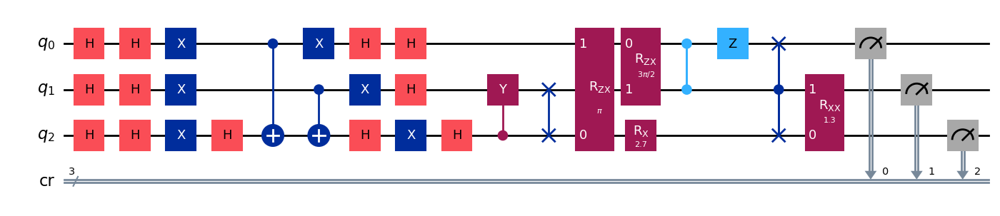

gen = 0 , Best fitness = (0.7037,)
gen = 1 , Best fitness = (0.7037,) , Number of invalids = 7

[Run 4 | Gen 48/99] Best Fitness: 0.7037 | Fidelity: 0.9345 | Gates: 32


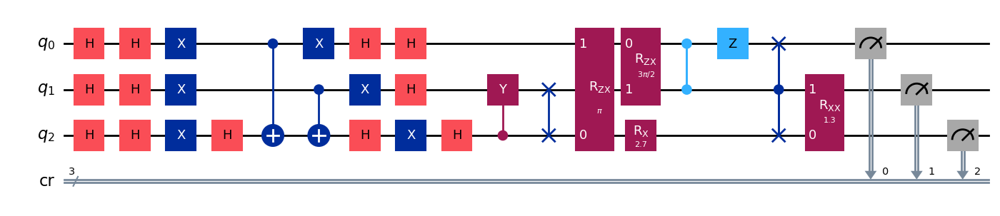

gen = 0 , Best fitness = (0.7037,)
gen = 1 , Best fitness = (0.7037,) , Number of invalids = 7

[Run 4 | Gen 49/99] Best Fitness: 0.7037 | Fidelity: 0.9343 | Gates: 32


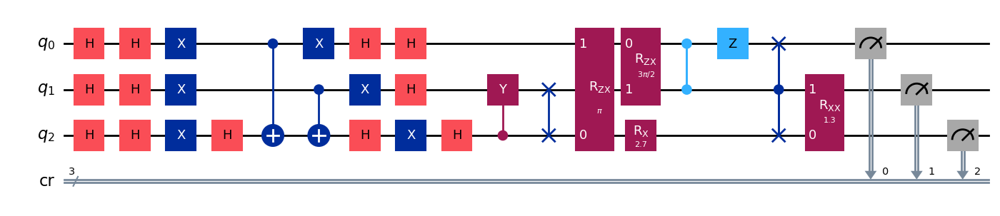

gen = 0 , Best fitness = (0.7037,)
gen = 1 , Best fitness = (0.7037,) , Number of invalids = 3

[Run 4 | Gen 50/99] Best Fitness: 0.7037 | Fidelity: 0.9363 | Gates: 32


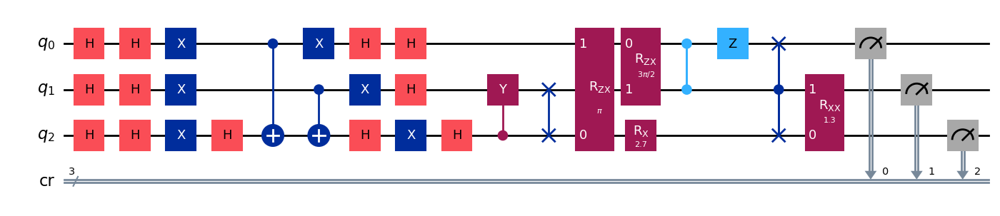

gen = 0 , Best fitness = (0.7037,)
gen = 1 , Best fitness = (0.7037,) , Number of invalids = 7

[Run 4 | Gen 51/99] Best Fitness: 0.7037 | Fidelity: 0.9339 | Gates: 32


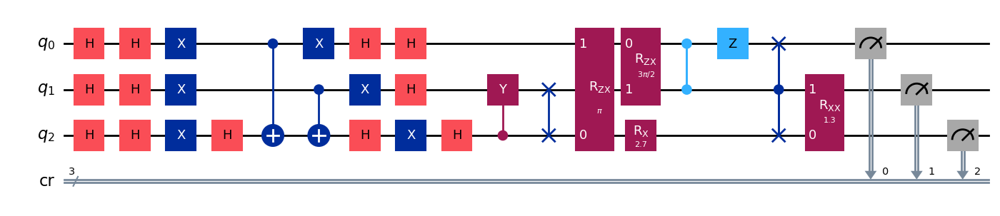

gen = 0 , Best fitness = (0.7037,)
gen = 1 , Best fitness = (0.7037,) , Number of invalids = 5

[Run 4 | Gen 52/99] Best Fitness: 0.7037 | Fidelity: 0.9300 | Gates: 32


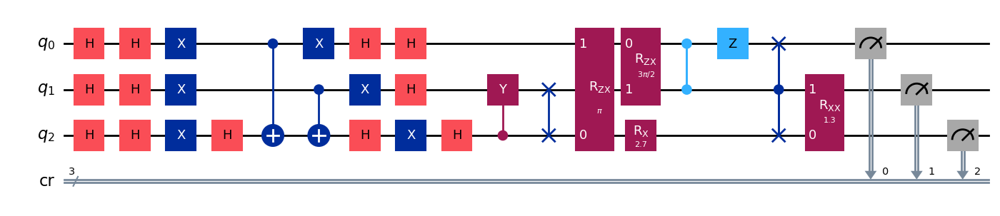

gen = 0 , Best fitness = (0.7037,)
gen = 1 , Best fitness = (0.7037,) , Number of invalids = 7

[Run 4 | Gen 53/99] Best Fitness: 0.7037 | Fidelity: 0.9374 | Gates: 32


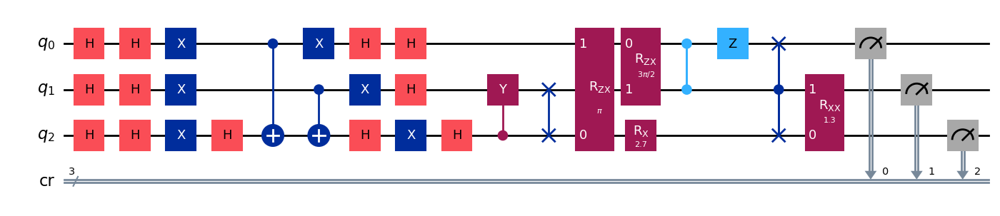

gen = 0 , Best fitness = (0.7037,)
gen = 1 , Best fitness = (0.7037,) , Number of invalids = 3

[Run 4 | Gen 54/99] Best Fitness: 0.7037 | Fidelity: 0.9330 | Gates: 32


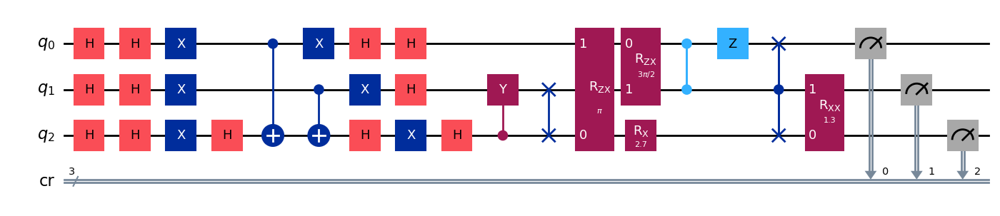

gen = 0 , Best fitness = (0.7037,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 2

[Run 4 | Gen 55/99] Best Fitness: 0.7016 | Fidelity: 0.9349 | Gates: 32


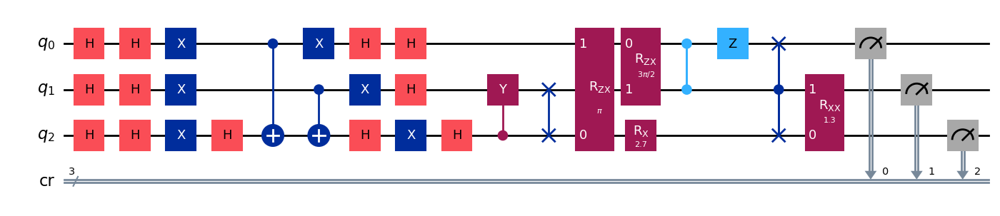

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 4

[Run 4 | Gen 56/99] Best Fitness: 0.7016 | Fidelity: 0.9366 | Gates: 32


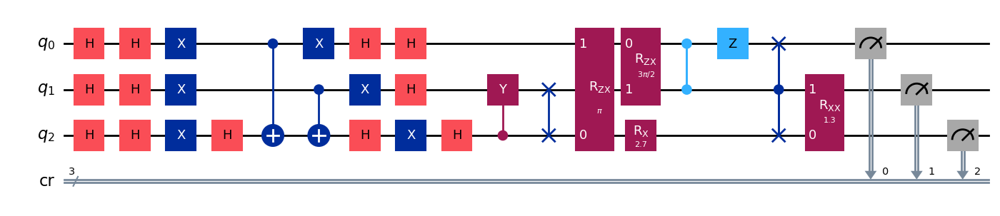

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 4

[Run 4 | Gen 57/99] Best Fitness: 0.7016 | Fidelity: 0.9342 | Gates: 32


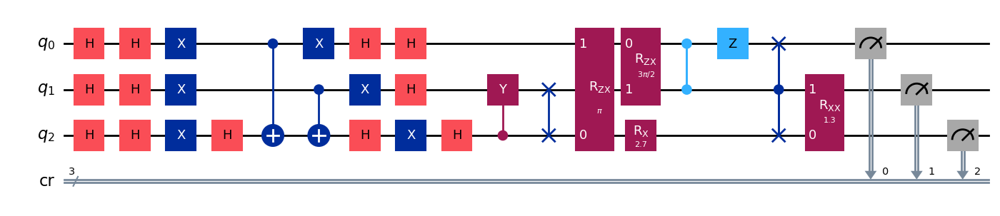

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 3

[Run 4 | Gen 58/99] Best Fitness: 0.7016 | Fidelity: 0.9335 | Gates: 32


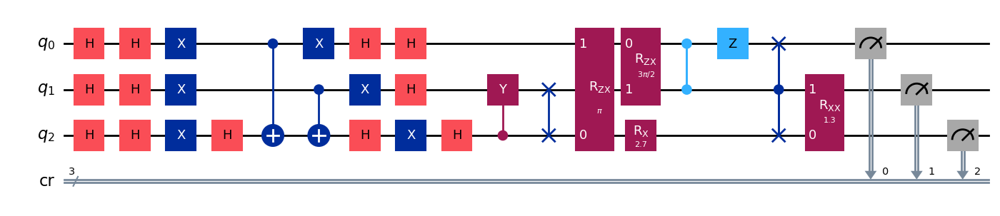

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 3

[Run 4 | Gen 59/99] Best Fitness: 0.7016 | Fidelity: 0.9379 | Gates: 32


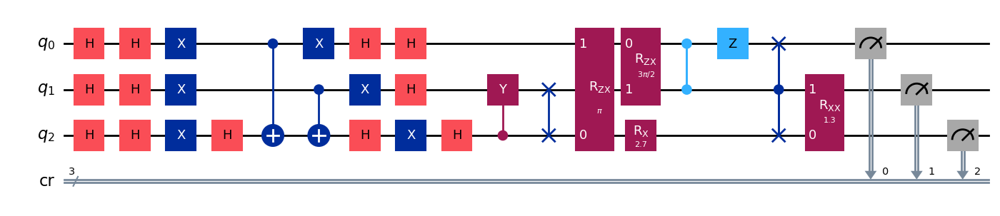

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 1

[Run 4 | Gen 60/99] Best Fitness: 0.7016 | Fidelity: 0.9362 | Gates: 32


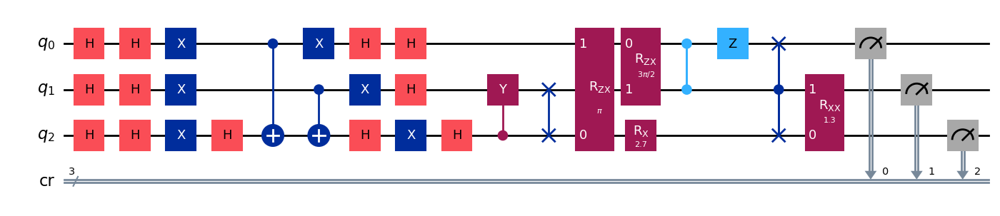

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 2

[Run 4 | Gen 61/99] Best Fitness: 0.7016 | Fidelity: 0.9328 | Gates: 32


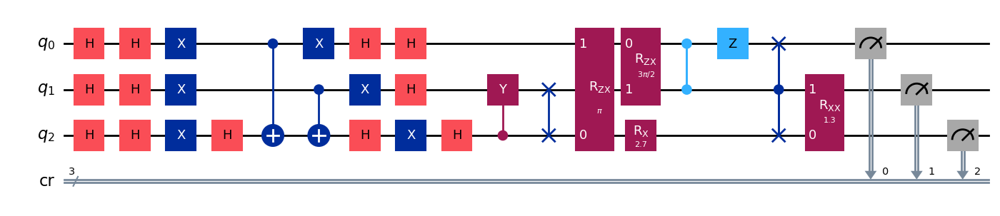

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 0

[Run 4 | Gen 62/99] Best Fitness: 0.7016 | Fidelity: 0.9320 | Gates: 32


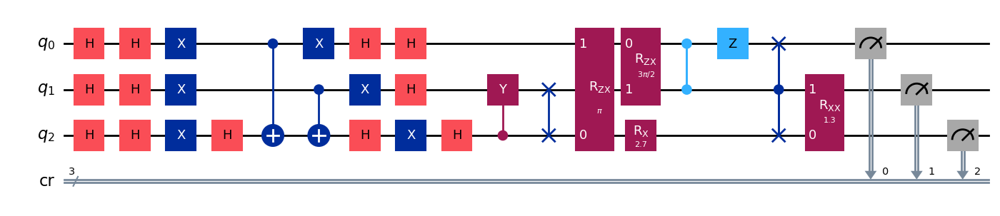

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 0

[Run 4 | Gen 63/99] Best Fitness: 0.7016 | Fidelity: 0.9368 | Gates: 32


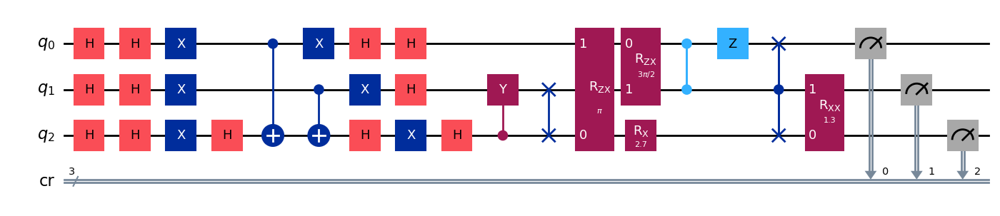

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 1

[Run 4 | Gen 64/99] Best Fitness: 0.7016 | Fidelity: 0.9318 | Gates: 32


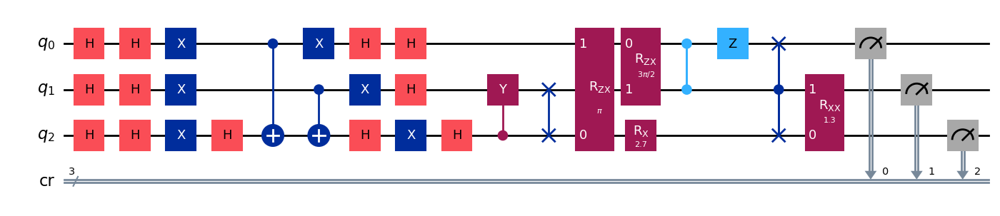

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 0

[Run 4 | Gen 65/99] Best Fitness: 0.7016 | Fidelity: 0.9375 | Gates: 32


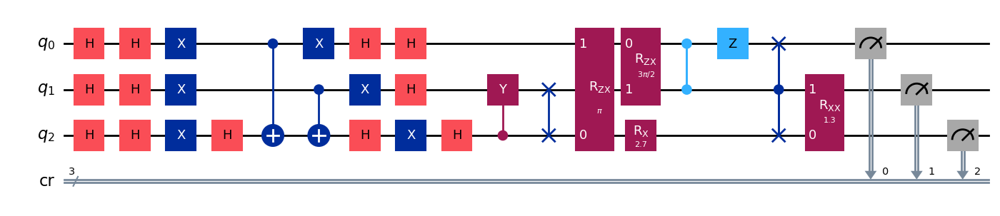

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 0

[Run 4 | Gen 66/99] Best Fitness: 0.7016 | Fidelity: 0.9329 | Gates: 32


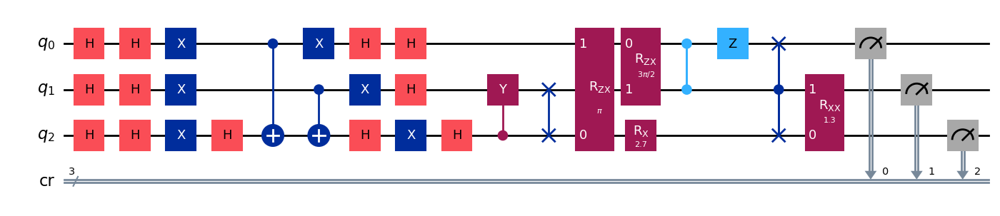

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 0

[Run 4 | Gen 67/99] Best Fitness: 0.7016 | Fidelity: 0.9356 | Gates: 32


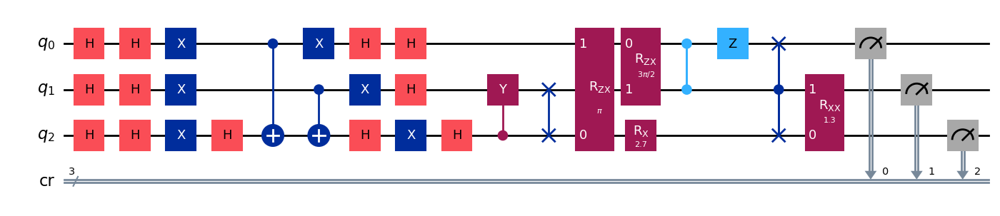

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.7016,) , Number of invalids = 1

[Run 4 | Gen 68/99] Best Fitness: 0.7016 | Fidelity: 0.9345 | Gates: 32


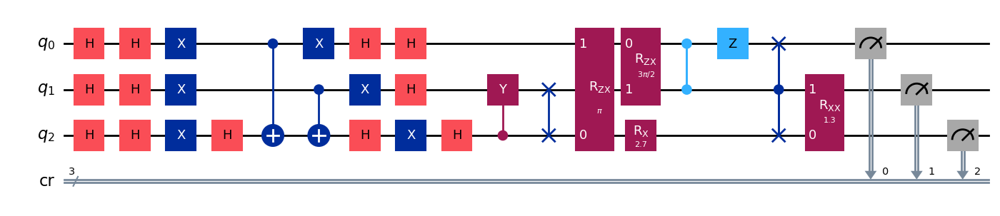

gen = 0 , Best fitness = (0.7016,)
gen = 1 , Best fitness = (0.6883,) , Number of invalids = 2

[Run 4 | Gen 69/99] Best Fitness: 0.6883 | Fidelity: 0.9512 | Gates: 32


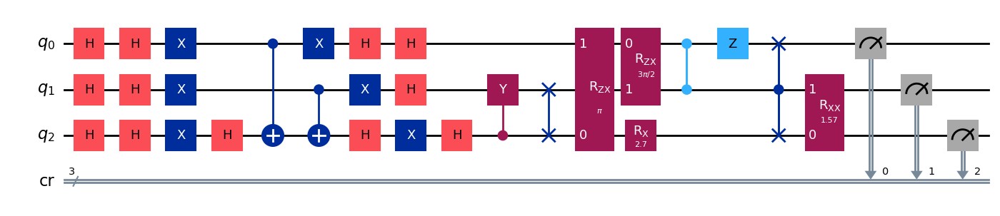

gen = 0 , Best fitness = (0.6883,)
gen = 1 , Best fitness = (0.6883,) , Number of invalids = 2

[Run 4 | Gen 70/99] Best Fitness: 0.6883 | Fidelity: 0.9518 | Gates: 32


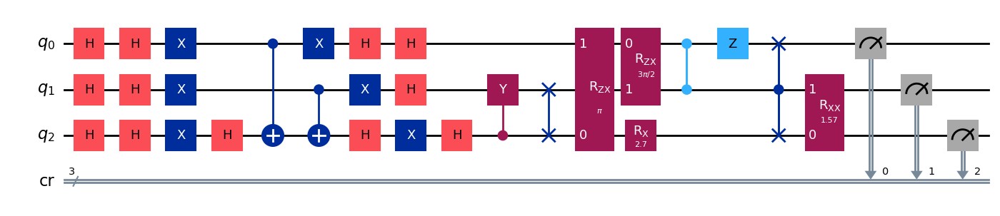

gen = 0 , Best fitness = (0.6883,)
gen = 1 , Best fitness = (0.6883,) , Number of invalids = 4

[Run 4 | Gen 71/99] Best Fitness: 0.6883 | Fidelity: 0.9532 | Gates: 32


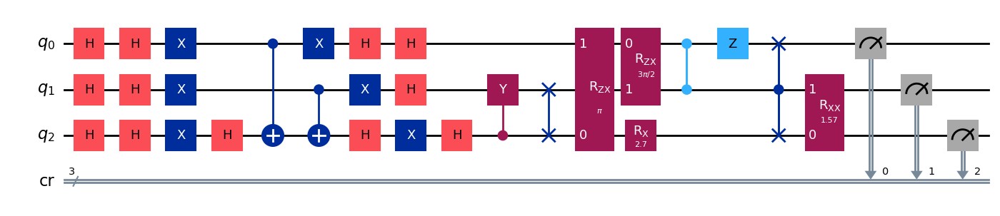

gen = 0 , Best fitness = (0.6883,)
gen = 1 , Best fitness = (0.6883,) , Number of invalids = 0

[Run 4 | Gen 72/99] Best Fitness: 0.6883 | Fidelity: 0.9549 | Gates: 32


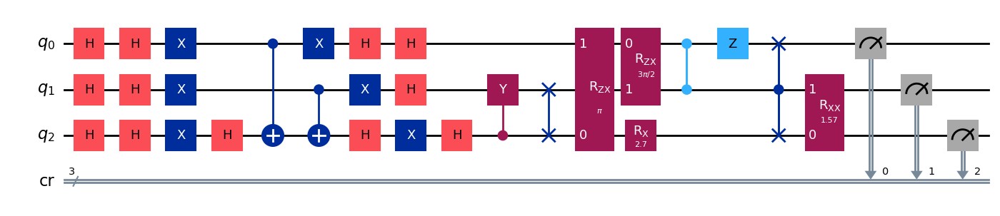

gen = 0 , Best fitness = (0.6883,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 2

[Run 4 | Gen 73/99] Best Fitness: 0.6872 | Fidelity: 0.9531 | Gates: 32


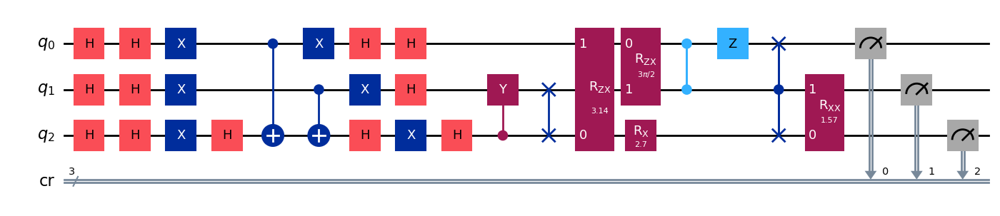

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 0

[Run 4 | Gen 74/99] Best Fitness: 0.6872 | Fidelity: 0.9516 | Gates: 32


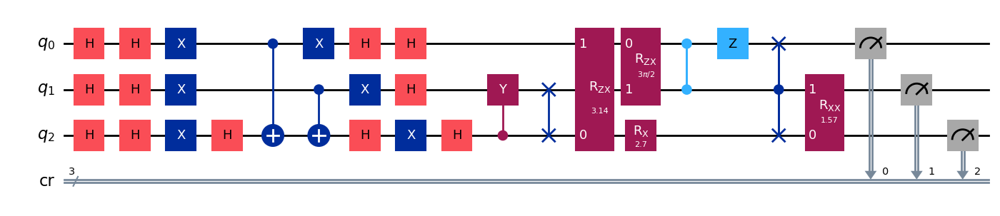

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 2

[Run 4 | Gen 75/99] Best Fitness: 0.6872 | Fidelity: 0.9545 | Gates: 32


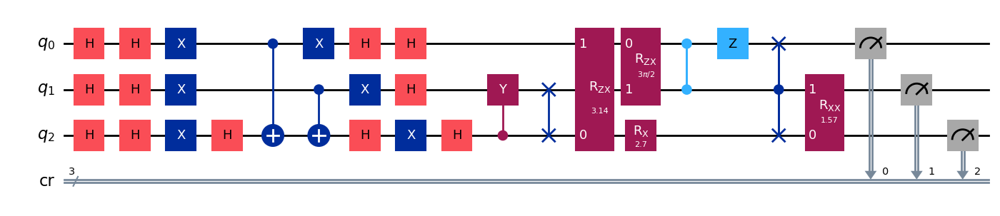

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 0

[Run 4 | Gen 76/99] Best Fitness: 0.6872 | Fidelity: 0.9500 | Gates: 32


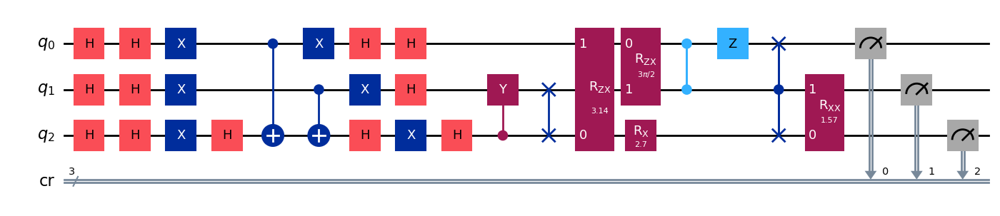

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 3

[Run 4 | Gen 77/99] Best Fitness: 0.6872 | Fidelity: 0.9551 | Gates: 32


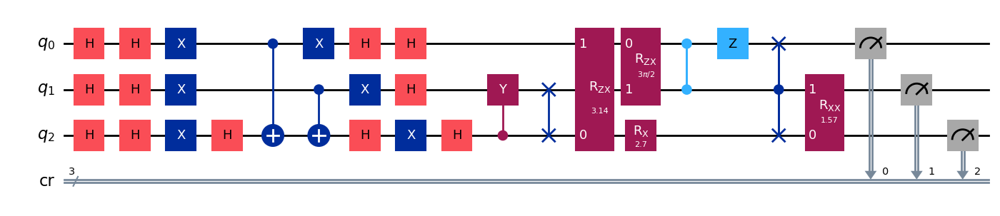

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 1

[Run 4 | Gen 78/99] Best Fitness: 0.6872 | Fidelity: 0.9506 | Gates: 32


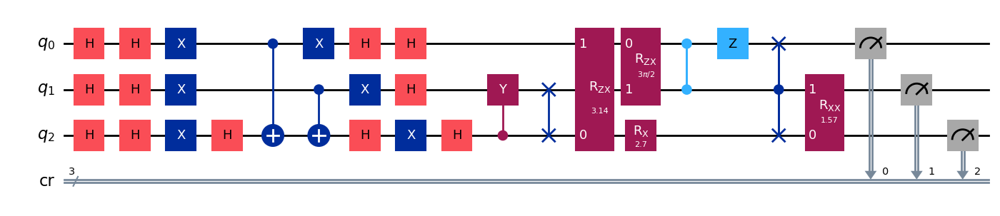

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 0

[Run 4 | Gen 79/99] Best Fitness: 0.6872 | Fidelity: 0.9529 | Gates: 32


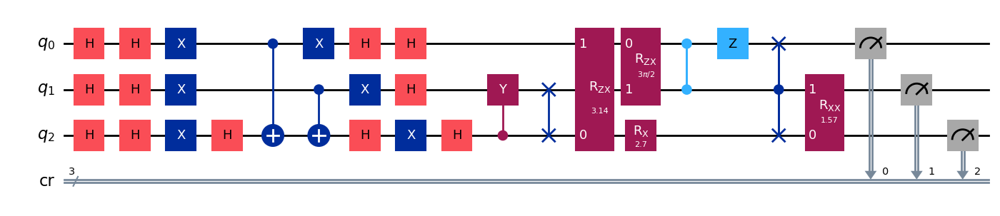

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 0

[Run 4 | Gen 80/99] Best Fitness: 0.6872 | Fidelity: 0.9501 | Gates: 32


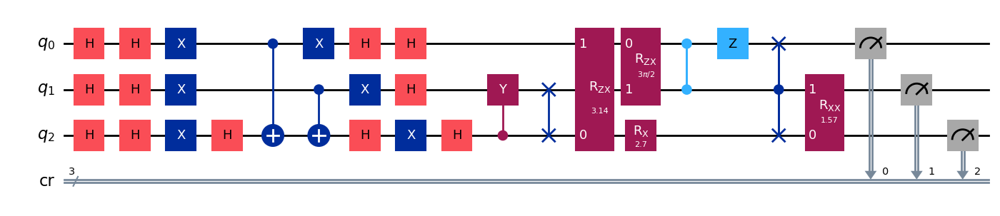

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 0

[Run 4 | Gen 81/99] Best Fitness: 0.6872 | Fidelity: 0.9550 | Gates: 32


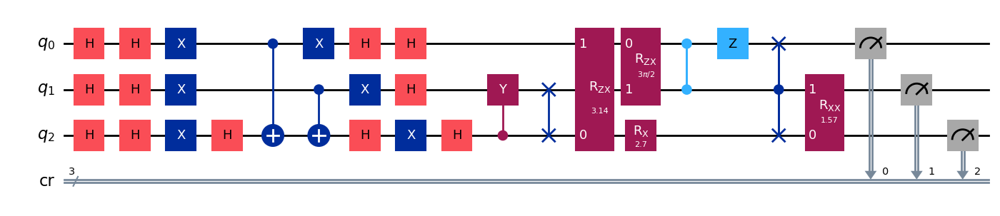

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 0

[Run 4 | Gen 82/99] Best Fitness: 0.6872 | Fidelity: 0.9551 | Gates: 32


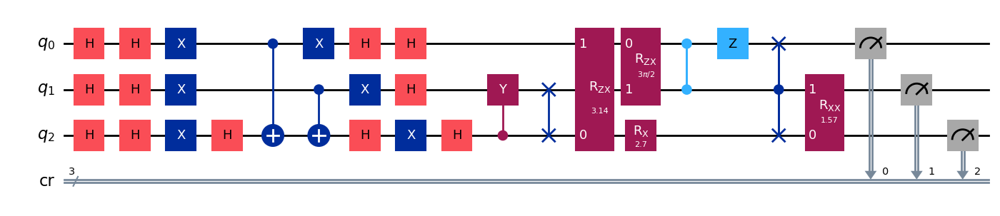

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 0

[Run 4 | Gen 83/99] Best Fitness: 0.6872 | Fidelity: 0.9505 | Gates: 32


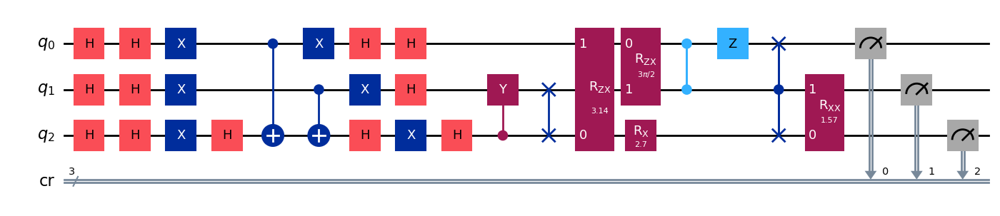

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6872,) , Number of invalids = 0

[Run 4 | Gen 84/99] Best Fitness: 0.6872 | Fidelity: 0.9550 | Gates: 32


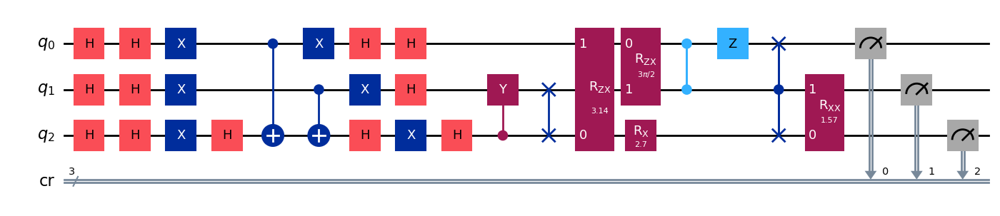

gen = 0 , Best fitness = (0.6872,)
gen = 1 , Best fitness = (0.6844,) , Number of invalids = 0

[Run 4 | Gen 85/99] Best Fitness: 0.6844 | Fidelity: 0.9510 | Gates: 32


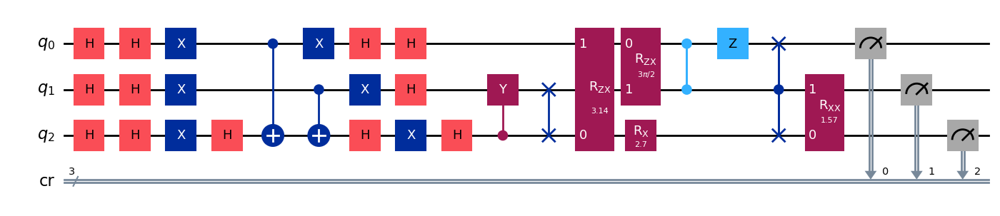

gen = 0 , Best fitness = (0.6844,)
gen = 1 , Best fitness = (0.6844,) , Number of invalids = 0

[Run 4 | Gen 86/99] Best Fitness: 0.6844 | Fidelity: 0.9530 | Gates: 32


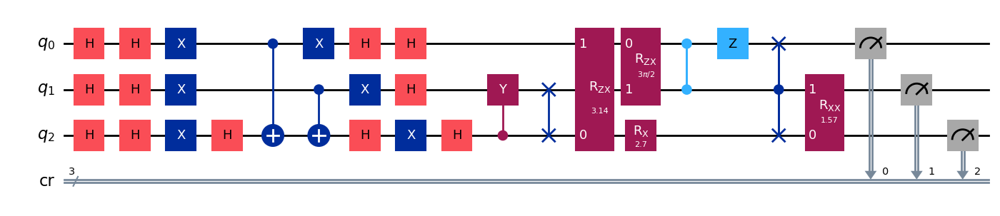

gen = 0 , Best fitness = (0.6844,)
gen = 1 , Best fitness = (0.6844,) , Number of invalids = 0

[Run 4 | Gen 87/99] Best Fitness: 0.6844 | Fidelity: 0.9524 | Gates: 32


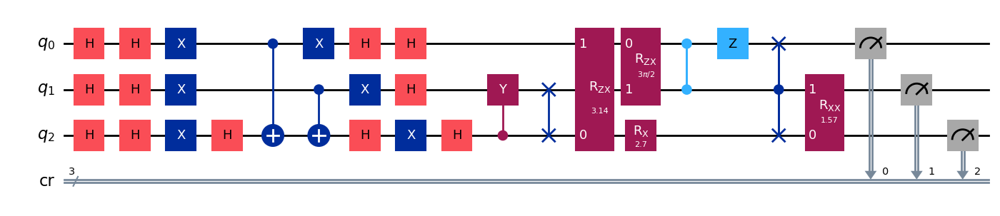

gen = 0 , Best fitness = (0.6844,)
gen = 1 , Best fitness = (0.6844,) , Number of invalids = 0

[Run 4 | Gen 88/99] Best Fitness: 0.6844 | Fidelity: 0.9502 | Gates: 32


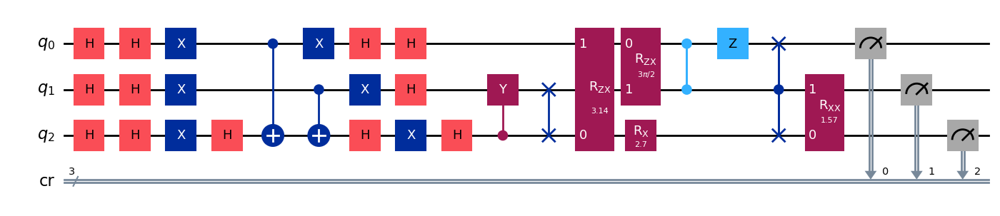

gen = 0 , Best fitness = (0.6844,)
gen = 1 , Best fitness = (0.6844,) , Number of invalids = 0

[Run 4 | Gen 89/99] Best Fitness: 0.6844 | Fidelity: 0.9500 | Gates: 32


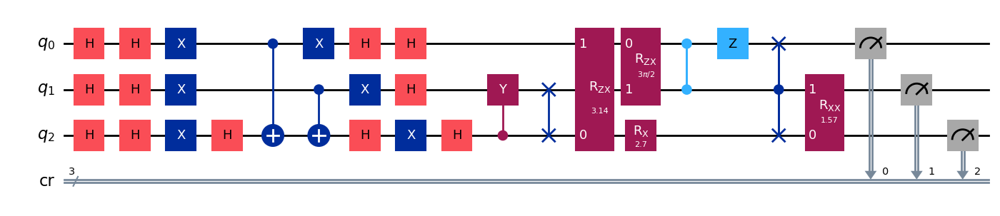

gen = 0 , Best fitness = (0.6844,)
gen = 1 , Best fitness = (0.6844,) , Number of invalids = 0

[Run 4 | Gen 90/99] Best Fitness: 0.6844 | Fidelity: 0.9489 | Gates: 32


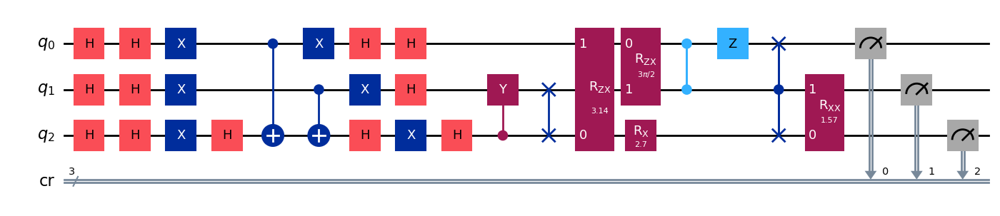

gen = 0 , Best fitness = (0.6844,)
gen = 1 , Best fitness = (0.6839000000000001,) , Number of invalids = 0

[Run 4 | Gen 91/99] Best Fitness: 0.6839 | Fidelity: 0.9477 | Gates: 32


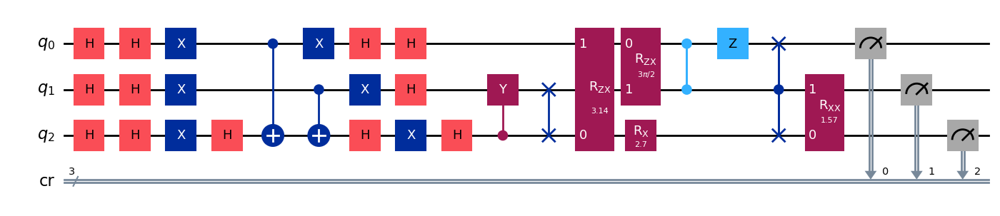

gen = 0 , Best fitness = (0.6839000000000001,)
gen = 1 , Best fitness = (0.6839000000000001,) , Number of invalids = 0

[Run 4 | Gen 92/99] Best Fitness: 0.6839 | Fidelity: 0.9531 | Gates: 32


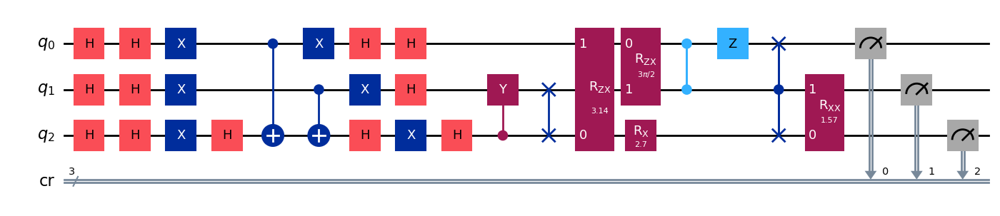

gen = 0 , Best fitness = (0.6839000000000001,)
gen = 1 , Best fitness = (0.6839000000000001,) , Number of invalids = 0

[Run 4 | Gen 93/99] Best Fitness: 0.6839 | Fidelity: 0.9523 | Gates: 32


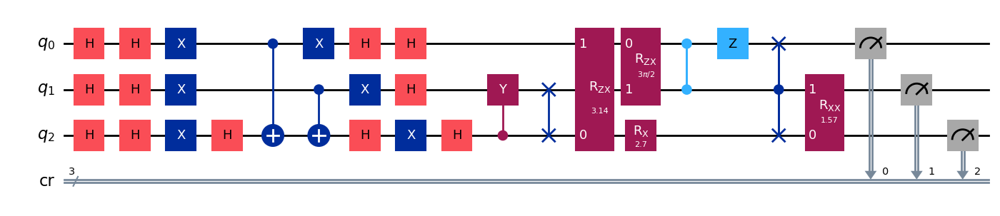

gen = 0 , Best fitness = (0.6839000000000001,)
gen = 1 , Best fitness = (0.6839000000000001,) , Number of invalids = 0

[Run 4 | Gen 94/99] Best Fitness: 0.6839 | Fidelity: 0.9495 | Gates: 32


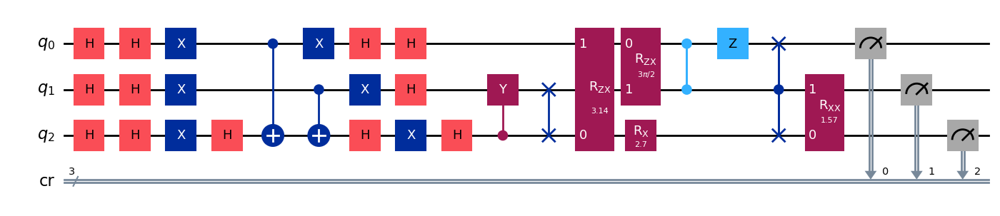

gen = 0 , Best fitness = (0.6839000000000001,)
gen = 1 , Best fitness = (0.6839000000000001,) , Number of invalids = 0

[Run 4 | Gen 95/99] Best Fitness: 0.6839 | Fidelity: 0.9564 | Gates: 32


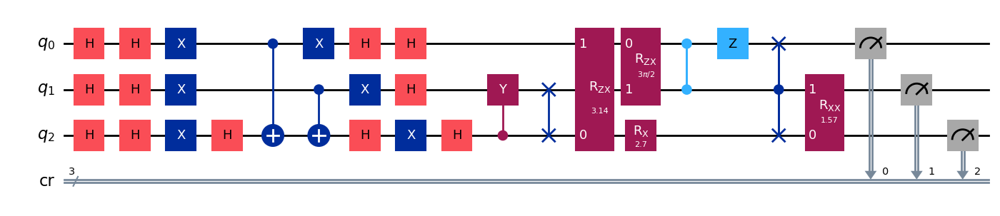

gen = 0 , Best fitness = (0.6839000000000001,)
gen = 1 , Best fitness = (0.6839000000000001,) , Number of invalids = 0

[Run 4 | Gen 96/99] Best Fitness: 0.6839 | Fidelity: 0.9531 | Gates: 32


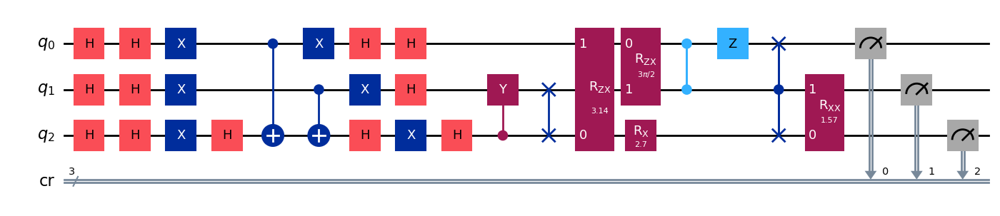

gen = 0 , Best fitness = (0.6839000000000001,)
gen = 1 , Best fitness = (0.6839000000000001,) , Number of invalids = 0

[Run 4 | Gen 97/99] Best Fitness: 0.6839 | Fidelity: 0.9567 | Gates: 32


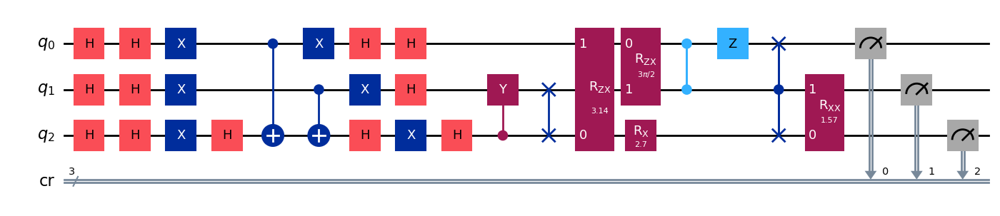

gen = 0 , Best fitness = (0.6839000000000001,)
gen = 1 , Best fitness = (0.6839000000000001,) , Number of invalids = 0

[Run 4 | Gen 98/99] Best Fitness: 0.6839 | Fidelity: 0.9496 | Gates: 32


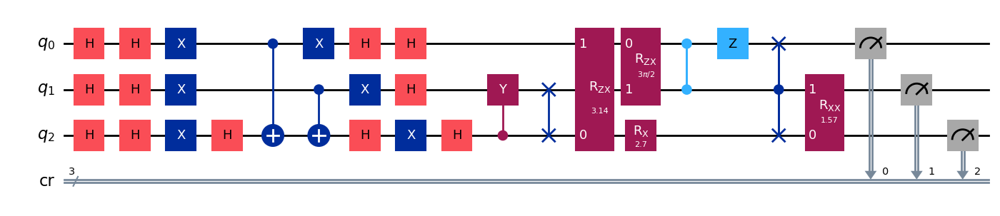

gen = 0 , Best fitness = (0.6839000000000001,)
gen = 1 , Best fitness = (0.6839000000000001,) , Number of invalids = 0

[Run 4 | Gen 99/99] Best Fitness: 0.6839 | Fidelity: 0.9523 | Gates: 32


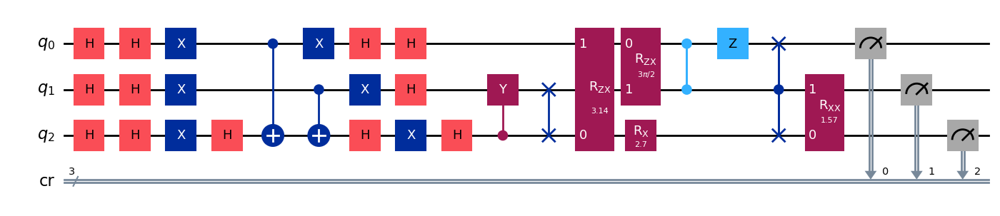


Generating evolution plots for Run 4...
✓ Plot saved to: experiments_state_111/run_4_seed_57697/evolution_metrics_run_4.png


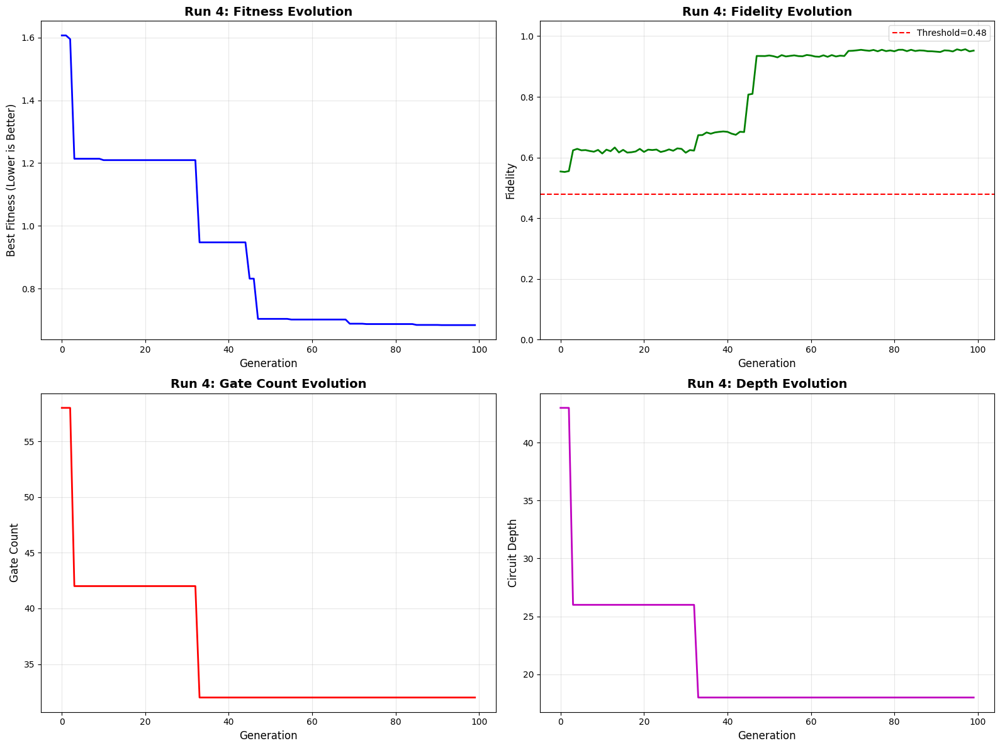


✓ Run 4 COMPLETE | Fidelity: 0.9547 | Gates: 32 | Depth: 18


RUN 5/5 | Target: 111 | Seed: 98144
✓ Logging to: experiments_state_111/run_5_seed_98144
✓ Starting evolution (Population: 1000, Generations: 100)
gen = 0 , Best fitness = (1.441,)
gen = 1 , Best fitness = (1.441,) , Number of invalids = 164

[Run 5 | Gen 0/99] Best Fitness: 1.4410 | Fidelity: 0.6124 | Gates: 53


/Users/admin/Downloads/GE_Grover/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:191: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


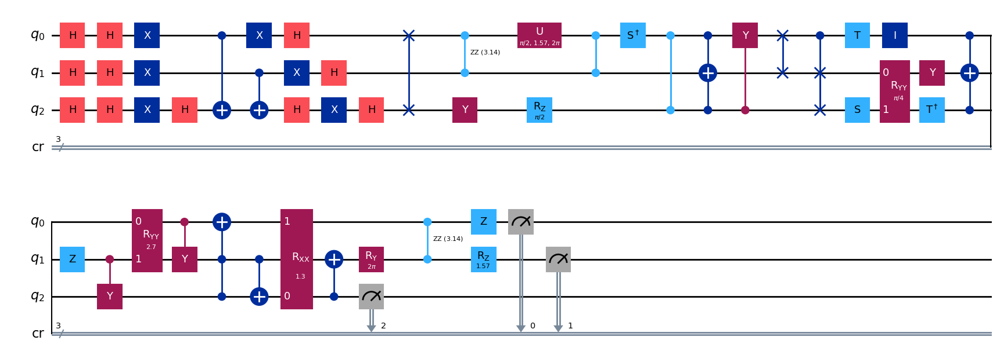

gen = 0 , Best fitness = (1.441,)
gen = 1 , Best fitness = (0.9702000000000001,) , Number of invalids = 82

[Run 5 | Gen 1/99] Best Fitness: 0.9702 | Fidelity: 0.5610 | Gates: 27


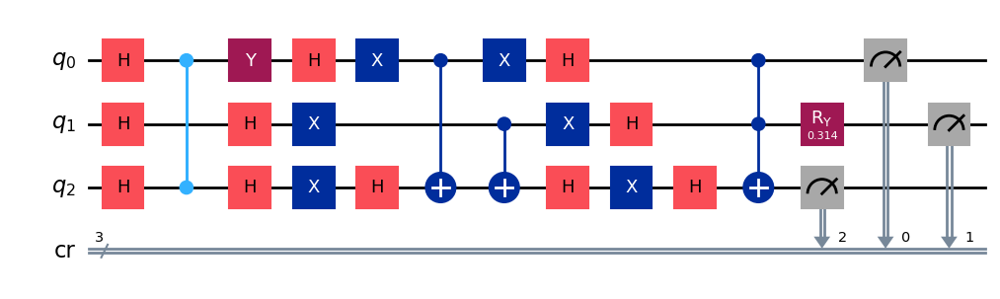

gen = 0 , Best fitness = (0.9702000000000001,)
gen = 1 , Best fitness = (0.9702000000000001,) , Number of invalids = 52

[Run 5 | Gen 2/99] Best Fitness: 0.9702 | Fidelity: 0.5739 | Gates: 27


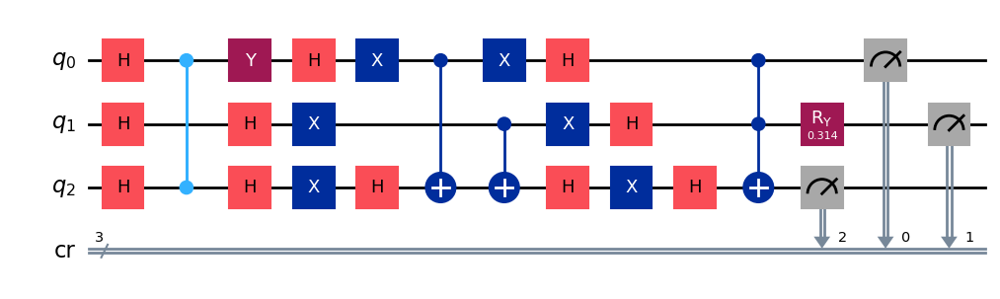

gen = 0 , Best fitness = (0.9702000000000001,)
gen = 1 , Best fitness = (0.9702000000000001,) , Number of invalids = 31

[Run 5 | Gen 3/99] Best Fitness: 0.9702 | Fidelity: 0.5675 | Gates: 27


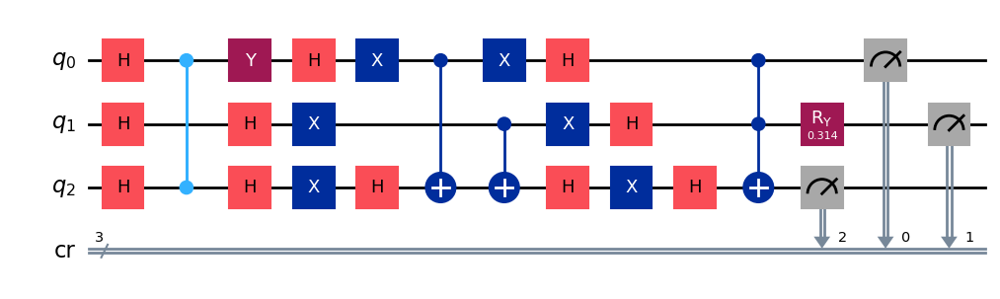

gen = 0 , Best fitness = (0.9702000000000001,)
gen = 1 , Best fitness = (0.9702000000000001,) , Number of invalids = 42

[Run 5 | Gen 4/99] Best Fitness: 0.9702 | Fidelity: 0.5677 | Gates: 27


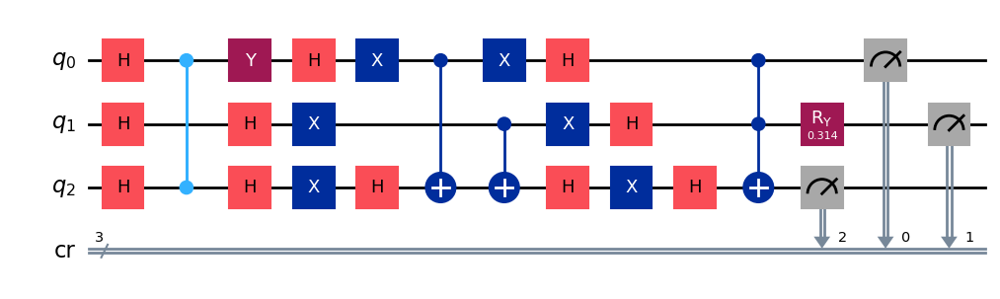

gen = 0 , Best fitness = (0.9702000000000001,)
gen = 1 , Best fitness = (0.9351,) , Number of invalids = 33

[Run 5 | Gen 5/99] Best Fitness: 0.9351 | Fidelity: 0.5970 | Gates: 27


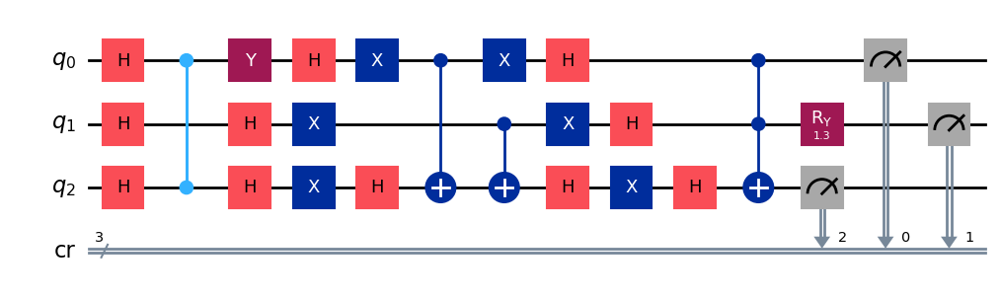

gen = 0 , Best fitness = (0.9351,)
gen = 1 , Best fitness = (0.934,) , Number of invalids = 34

[Run 5 | Gen 6/99] Best Fitness: 0.9340 | Fidelity: 0.5986 | Gates: 27


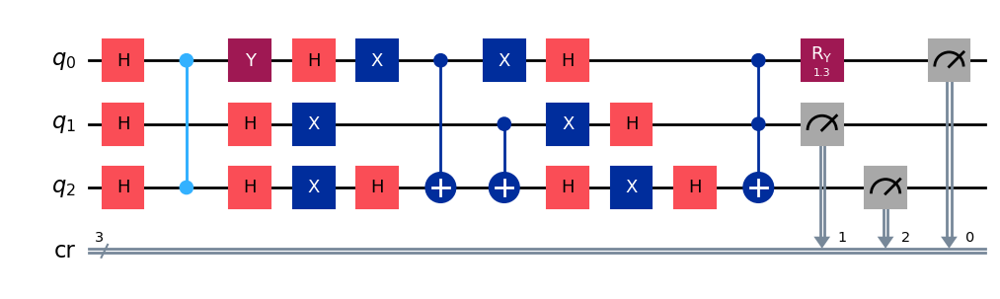

gen = 0 , Best fitness = (0.934,)
gen = 1 , Best fitness = (0.934,) , Number of invalids = 50

[Run 5 | Gen 7/99] Best Fitness: 0.9340 | Fidelity: 0.6022 | Gates: 27


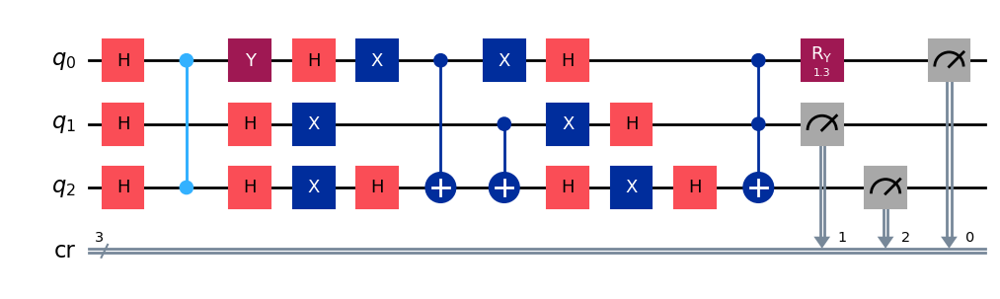

gen = 0 , Best fitness = (0.934,)
gen = 1 , Best fitness = (0.9225,) , Number of invalids = 44

[Run 5 | Gen 8/99] Best Fitness: 0.9225 | Fidelity: 0.6195 | Gates: 27


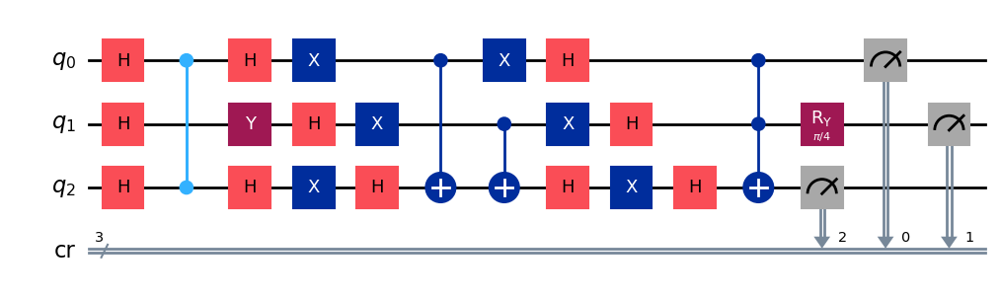

gen = 0 , Best fitness = (0.9225,)
gen = 1 , Best fitness = (0.9114,) , Number of invalids = 48

[Run 5 | Gen 9/99] Best Fitness: 0.9114 | Fidelity: 0.6325 | Gates: 27


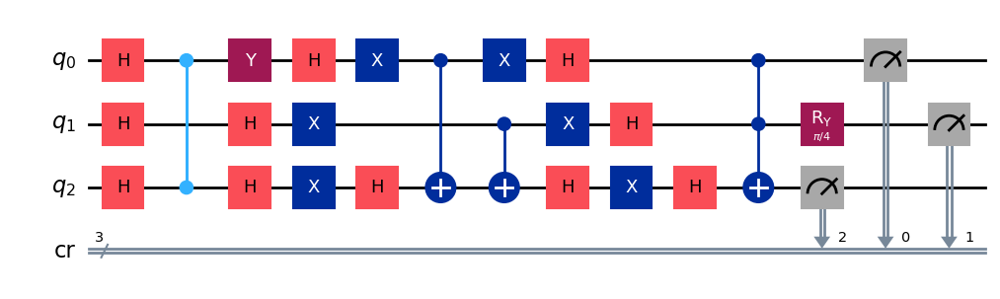

gen = 0 , Best fitness = (0.9114,)
gen = 1 , Best fitness = (0.9114,) , Number of invalids = 40

[Run 5 | Gen 10/99] Best Fitness: 0.9114 | Fidelity: 0.6160 | Gates: 27


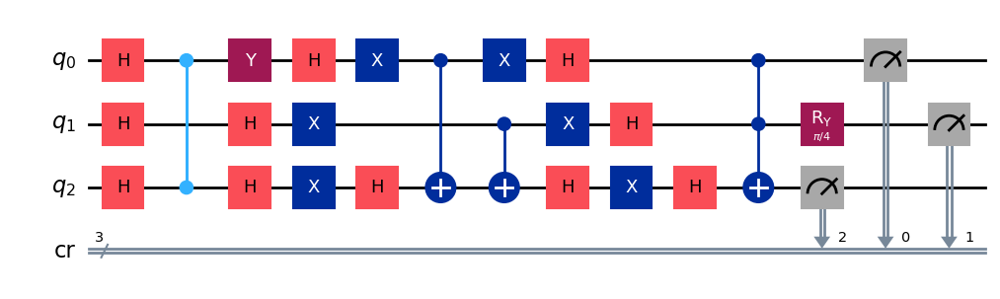

gen = 0 , Best fitness = (0.9114,)
gen = 1 , Best fitness = (0.9114,) , Number of invalids = 42

[Run 5 | Gen 11/99] Best Fitness: 0.9114 | Fidelity: 0.6225 | Gates: 27


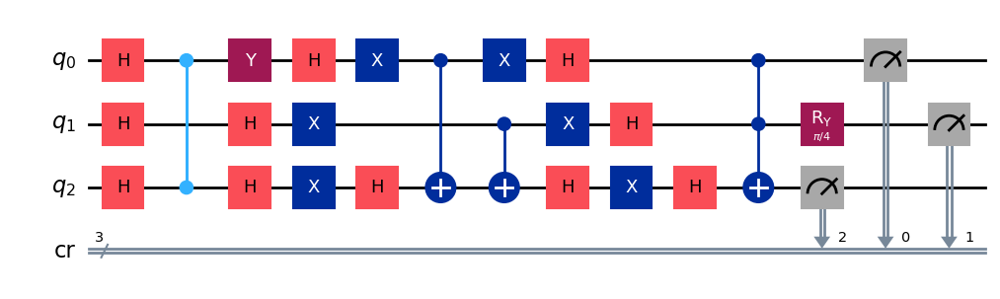

gen = 0 , Best fitness = (0.9114,)
gen = 1 , Best fitness = (0.9114,) , Number of invalids = 40

[Run 5 | Gen 12/99] Best Fitness: 0.9114 | Fidelity: 0.6283 | Gates: 27


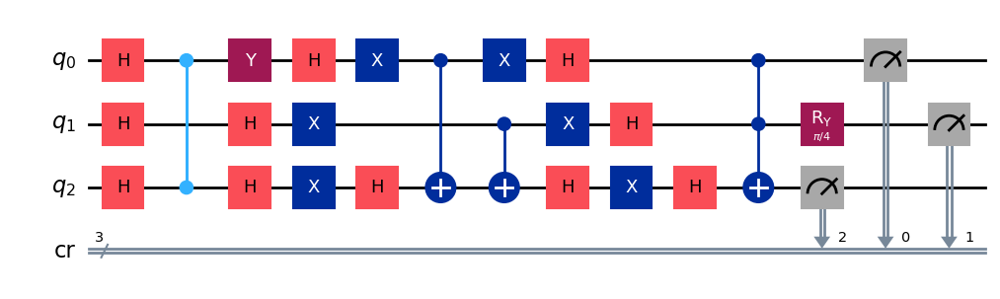

gen = 0 , Best fitness = (0.9114,)
gen = 1 , Best fitness = (0.9114,) , Number of invalids = 29

[Run 5 | Gen 13/99] Best Fitness: 0.9114 | Fidelity: 0.6152 | Gates: 27


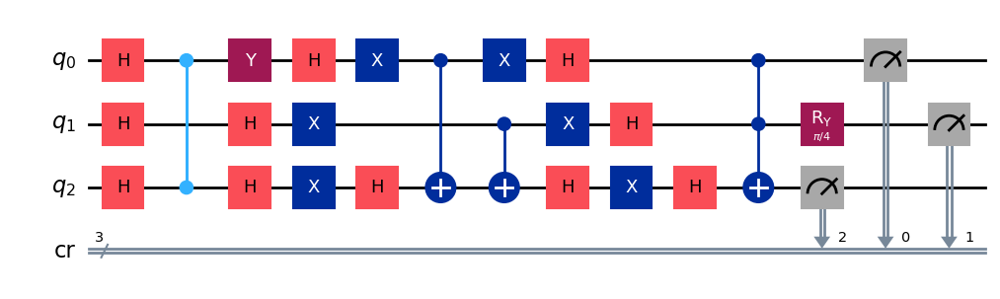

gen = 0 , Best fitness = (0.9114,)
gen = 1 , Best fitness = (0.9107000000000001,) , Number of invalids = 29

[Run 5 | Gen 14/99] Best Fitness: 0.9107 | Fidelity: 0.6156 | Gates: 27


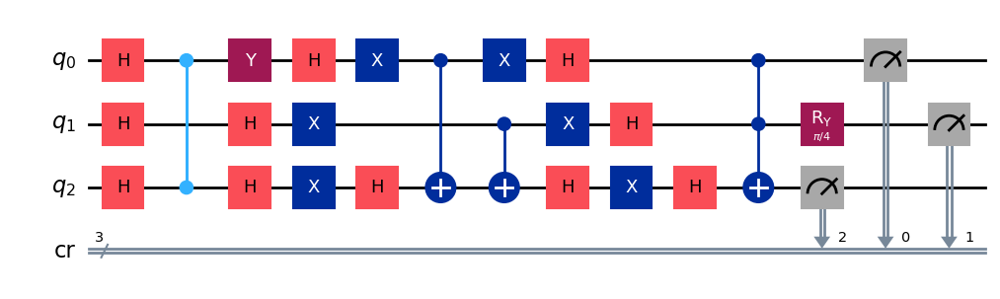

gen = 0 , Best fitness = (0.9107000000000001,)
gen = 1 , Best fitness = (0.9099,) , Number of invalids = 21

[Run 5 | Gen 15/99] Best Fitness: 0.9099 | Fidelity: 0.6223 | Gates: 27


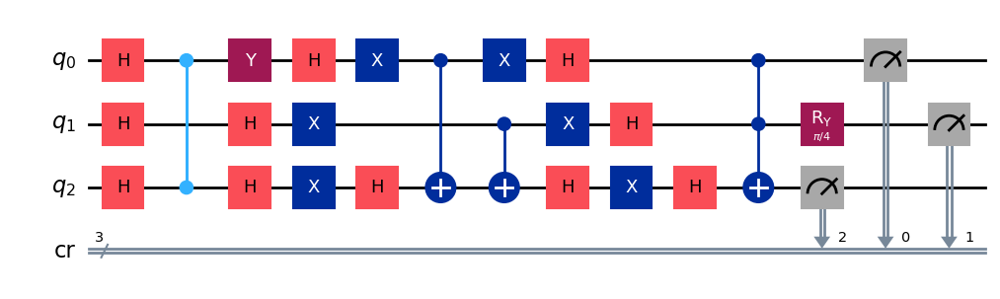

gen = 0 , Best fitness = (0.9099,)
gen = 1 , Best fitness = (0.9099,) , Number of invalids = 13

[Run 5 | Gen 16/99] Best Fitness: 0.9099 | Fidelity: 0.6201 | Gates: 27


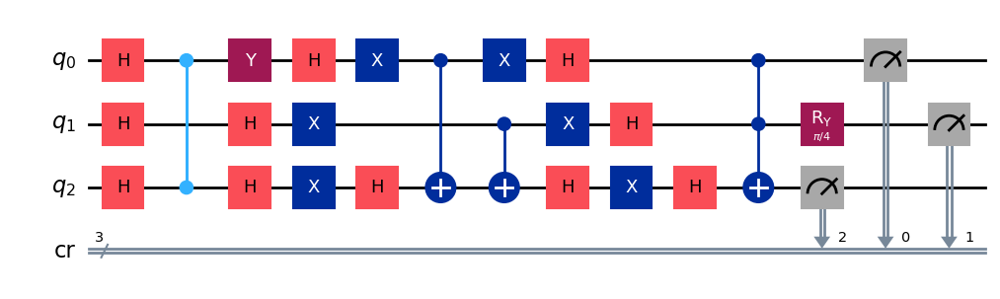

gen = 0 , Best fitness = (0.9099,)
gen = 1 , Best fitness = (0.907,) , Number of invalids = 19

[Run 5 | Gen 17/99] Best Fitness: 0.9070 | Fidelity: 0.6295 | Gates: 27


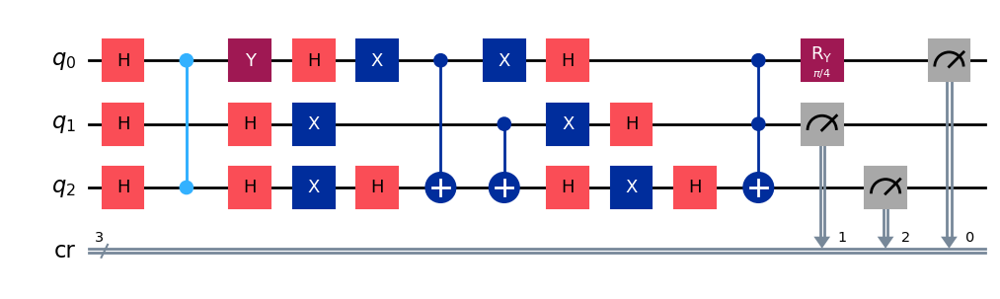

gen = 0 , Best fitness = (0.907,)
gen = 1 , Best fitness = (0.907,) , Number of invalids = 19

[Run 5 | Gen 18/99] Best Fitness: 0.9070 | Fidelity: 0.6222 | Gates: 27


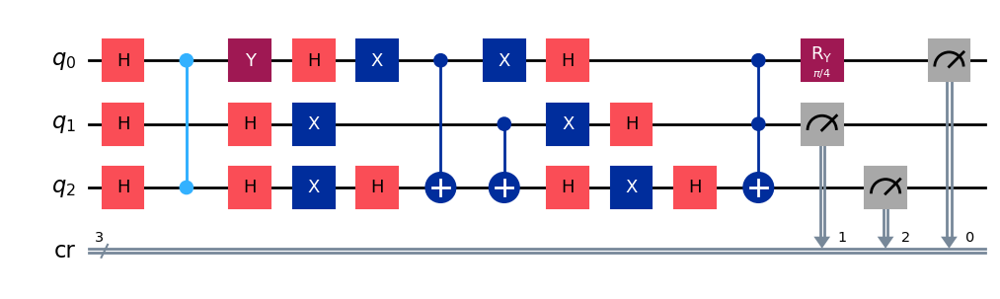

gen = 0 , Best fitness = (0.907,)
gen = 1 , Best fitness = (0.9004000000000001,) , Number of invalids = 11

[Run 5 | Gen 19/99] Best Fitness: 0.9004 | Fidelity: 0.6230 | Gates: 27


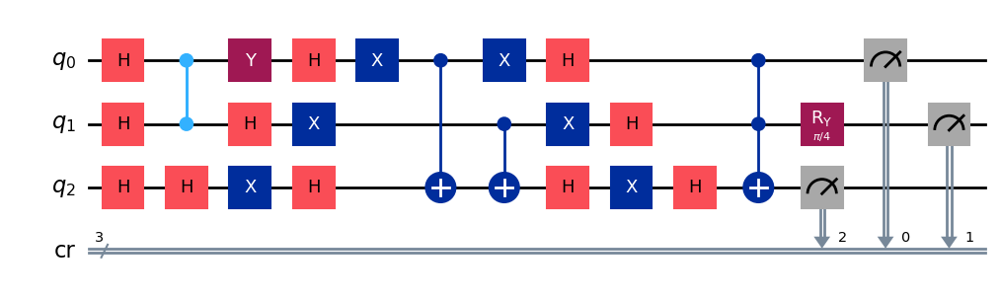

gen = 0 , Best fitness = (0.9004000000000001,)
gen = 1 , Best fitness = (0.9004000000000001,) , Number of invalids = 16

[Run 5 | Gen 20/99] Best Fitness: 0.9004 | Fidelity: 0.6201 | Gates: 27


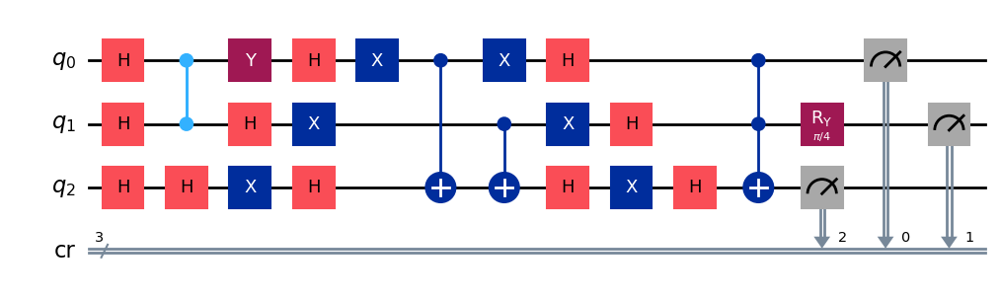

gen = 0 , Best fitness = (0.9004000000000001,)
gen = 1 , Best fitness = (0.9004000000000001,) , Number of invalids = 16

[Run 5 | Gen 21/99] Best Fitness: 0.9004 | Fidelity: 0.6139 | Gates: 27


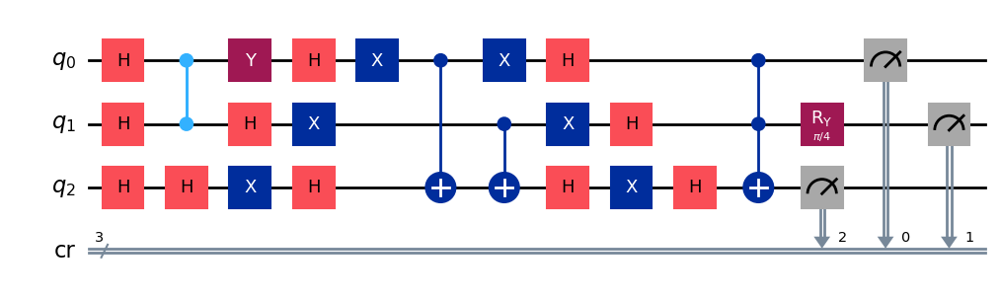

gen = 0 , Best fitness = (0.9004000000000001,)
gen = 1 , Best fitness = (0.9004000000000001,) , Number of invalids = 9

[Run 5 | Gen 22/99] Best Fitness: 0.9004 | Fidelity: 0.6221 | Gates: 27


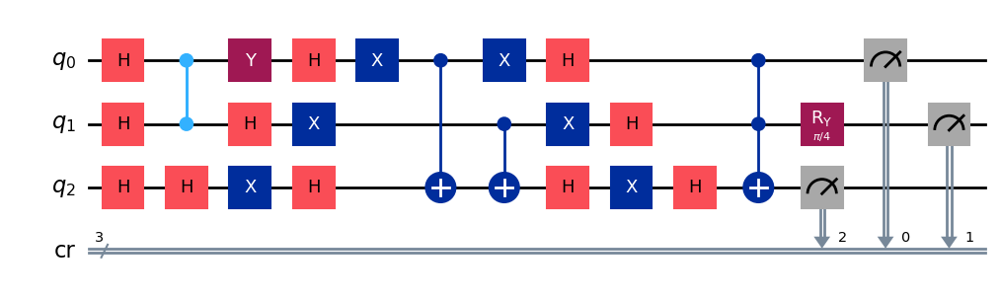

gen = 0 , Best fitness = (0.9004000000000001,)
gen = 1 , Best fitness = (0.9004000000000001,) , Number of invalids = 8

[Run 5 | Gen 23/99] Best Fitness: 0.9004 | Fidelity: 0.6183 | Gates: 27


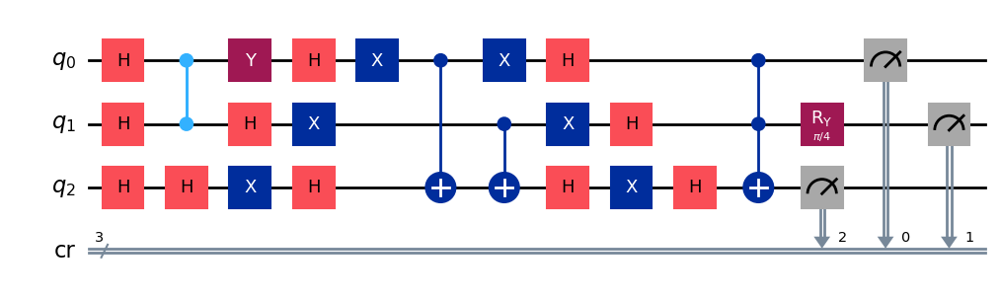

gen = 0 , Best fitness = (0.9004000000000001,)
gen = 1 , Best fitness = (0.8544999999999999,) , Number of invalids = 9

[Run 5 | Gen 24/99] Best Fitness: 0.8545 | Fidelity: 0.7279 | Gates: 29


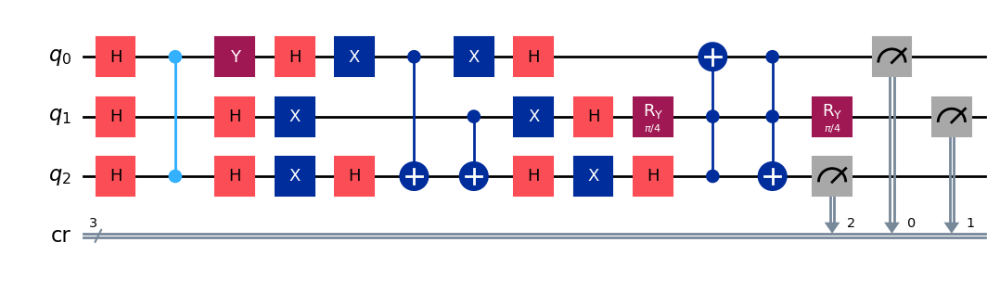

gen = 0 , Best fitness = (0.8544999999999999,)
gen = 1 , Best fitness = (0.8308000000000001,) , Number of invalids = 10

[Run 5 | Gen 25/99] Best Fitness: 0.8308 | Fidelity: 0.7341 | Gates: 28


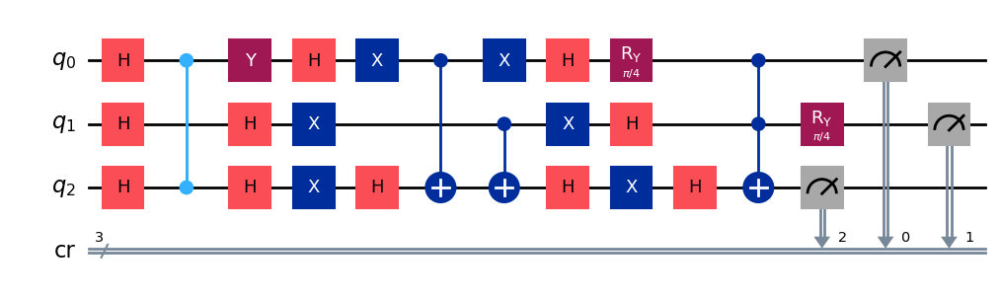

gen = 0 , Best fitness = (0.8308000000000001,)
gen = 1 , Best fitness = (0.8308000000000001,) , Number of invalids = 8

[Run 5 | Gen 26/99] Best Fitness: 0.8308 | Fidelity: 0.7315 | Gates: 28


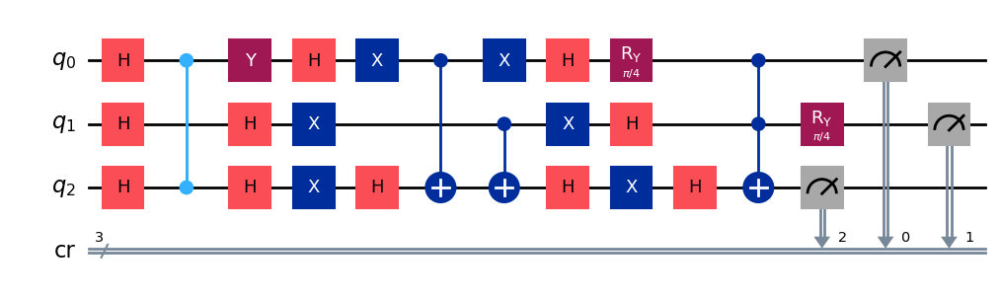

gen = 0 , Best fitness = (0.8308000000000001,)
gen = 1 , Best fitness = (0.8196000000000001,) , Number of invalids = 4

[Run 5 | Gen 27/99] Best Fitness: 0.8196 | Fidelity: 0.7246 | Gates: 28


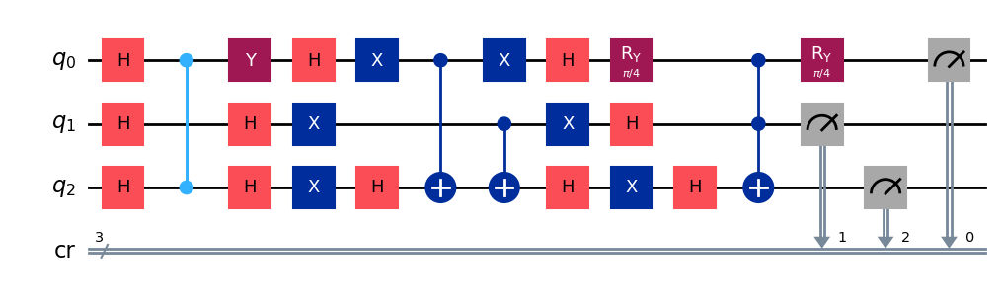

gen = 0 , Best fitness = (0.8196000000000001,)
gen = 1 , Best fitness = (0.7772,) , Number of invalids = 7

[Run 5 | Gen 28/99] Best Fitness: 0.7772 | Fidelity: 0.8276 | Gates: 30


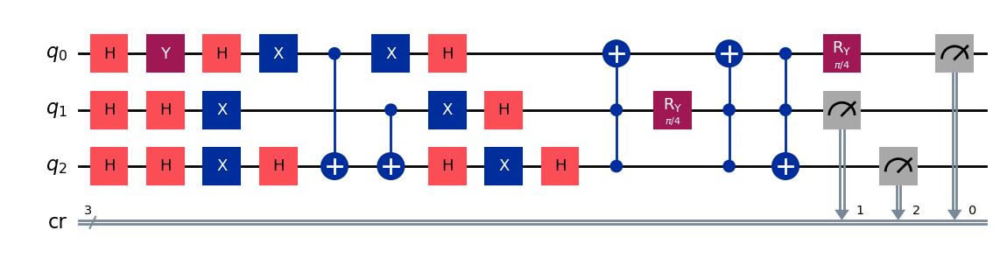

gen = 0 , Best fitness = (0.7772,)
gen = 1 , Best fitness = (0.7772,) , Number of invalids = 7

[Run 5 | Gen 29/99] Best Fitness: 0.7772 | Fidelity: 0.8164 | Gates: 30


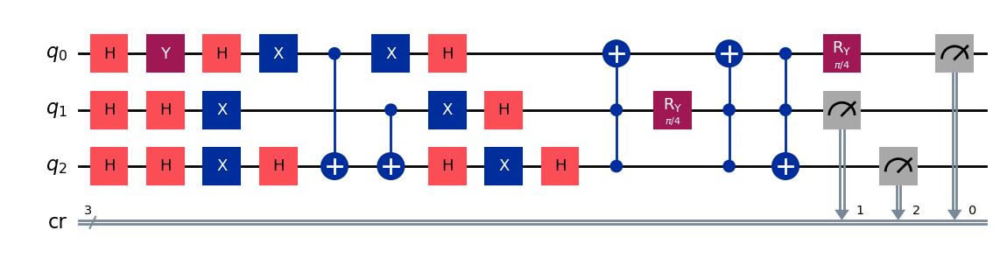

gen = 0 , Best fitness = (0.7772,)
gen = 1 , Best fitness = (0.7772,) , Number of invalids = 6

[Run 5 | Gen 30/99] Best Fitness: 0.7772 | Fidelity: 0.8155 | Gates: 30


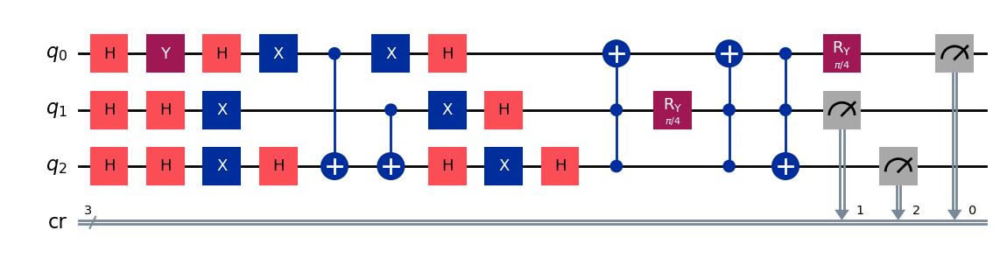

gen = 0 , Best fitness = (0.7772,)
gen = 1 , Best fitness = (0.7772,) , Number of invalids = 8

[Run 5 | Gen 31/99] Best Fitness: 0.7772 | Fidelity: 0.8209 | Gates: 30


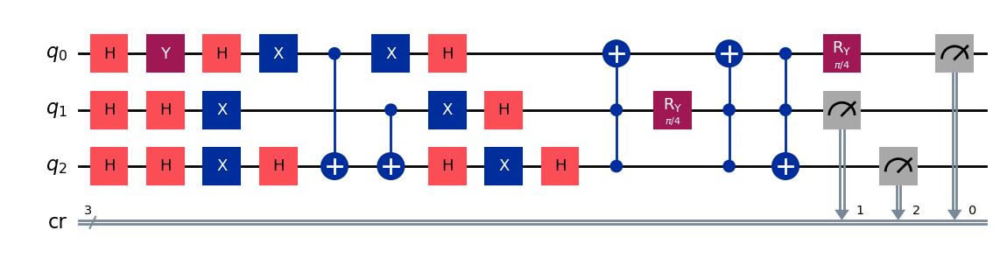

gen = 0 , Best fitness = (0.7772,)
gen = 1 , Best fitness = (0.7734,) , Number of invalids = 9

[Run 5 | Gen 32/99] Best Fitness: 0.7734 | Fidelity: 0.8218 | Gates: 30


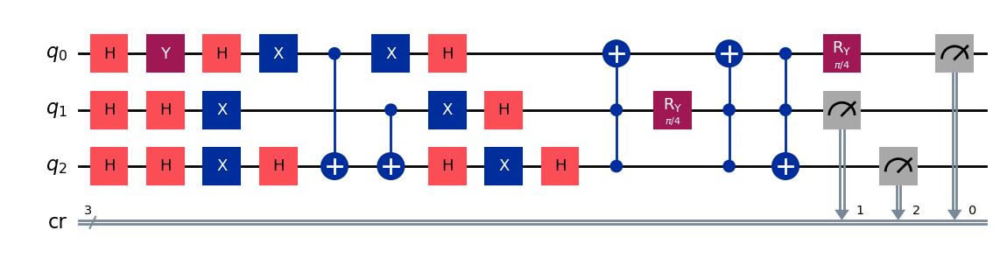

gen = 0 , Best fitness = (0.7734,)
gen = 1 , Best fitness = (0.7734,) , Number of invalids = 6

[Run 5 | Gen 33/99] Best Fitness: 0.7734 | Fidelity: 0.8182 | Gates: 30


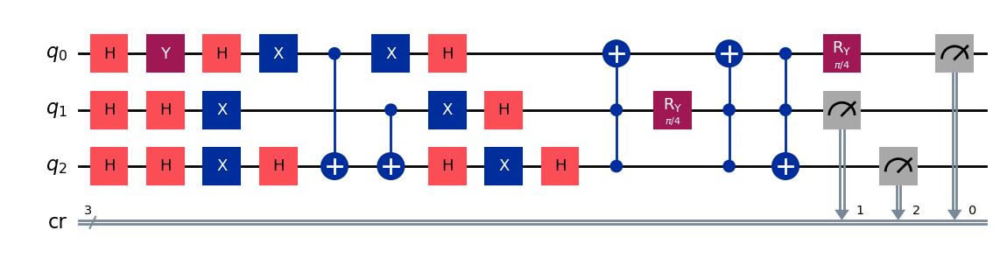

gen = 0 , Best fitness = (0.7734,)
gen = 1 , Best fitness = (0.7734,) , Number of invalids = 5

[Run 5 | Gen 34/99] Best Fitness: 0.7734 | Fidelity: 0.8193 | Gates: 30


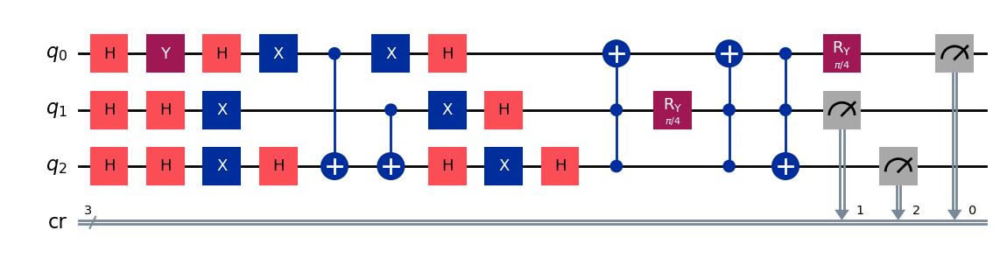

gen = 0 , Best fitness = (0.7734,)
gen = 1 , Best fitness = (0.7734,) , Number of invalids = 3

[Run 5 | Gen 35/99] Best Fitness: 0.7734 | Fidelity: 0.8183 | Gates: 30


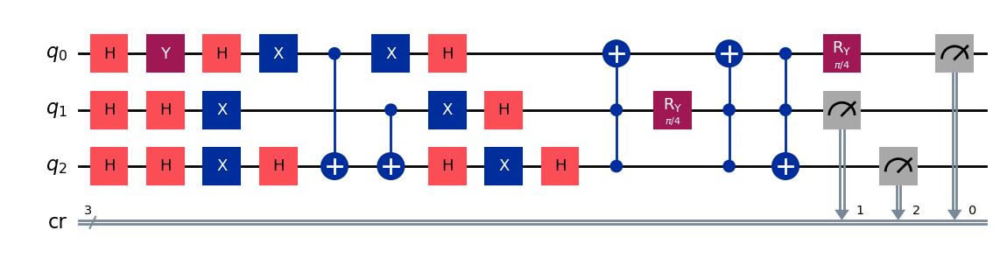

gen = 0 , Best fitness = (0.7734,)
gen = 1 , Best fitness = (0.7688,) , Number of invalids = 5

[Run 5 | Gen 36/99] Best Fitness: 0.7688 | Fidelity: 0.8694 | Gates: 32


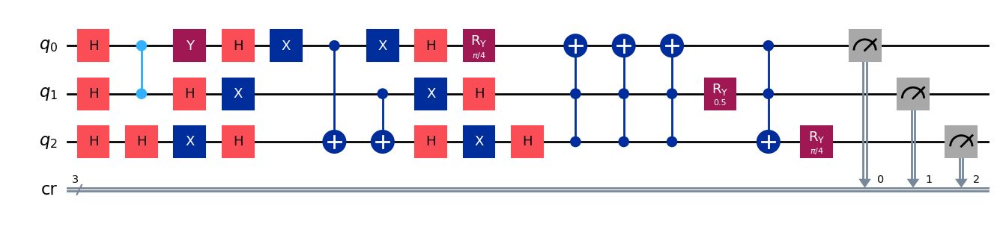

gen = 0 , Best fitness = (0.7688,)
gen = 1 , Best fitness = (0.7688,) , Number of invalids = 3

[Run 5 | Gen 37/99] Best Fitness: 0.7688 | Fidelity: 0.8677 | Gates: 32


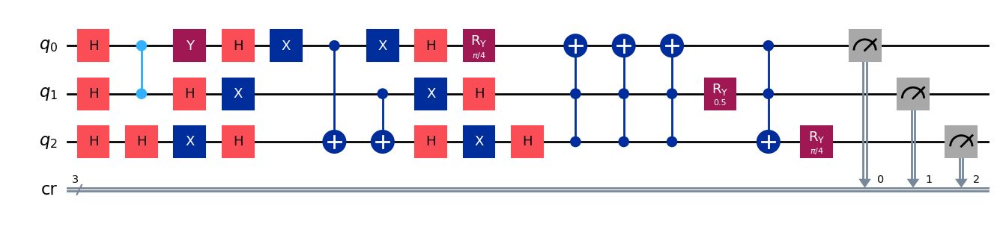

gen = 0 , Best fitness = (0.7688,)
gen = 1 , Best fitness = (0.7607,) , Number of invalids = 3

[Run 5 | Gen 38/99] Best Fitness: 0.7607 | Fidelity: 0.8684 | Gates: 32


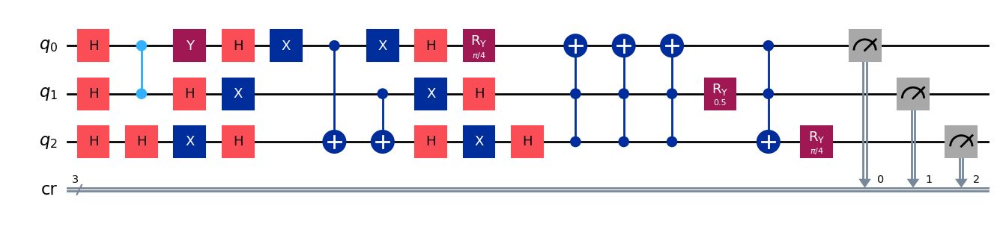

gen = 0 , Best fitness = (0.7607,)
gen = 1 , Best fitness = (0.7145,) , Number of invalids = 3

[Run 5 | Gen 39/99] Best Fitness: 0.7145 | Fidelity: 0.9017 | Gates: 31


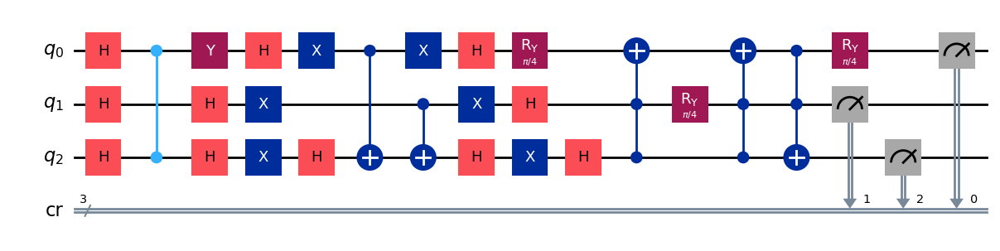

gen = 0 , Best fitness = (0.7145,)
gen = 1 , Best fitness = (0.7145,) , Number of invalids = 0

[Run 5 | Gen 40/99] Best Fitness: 0.7145 | Fidelity: 0.9111 | Gates: 31


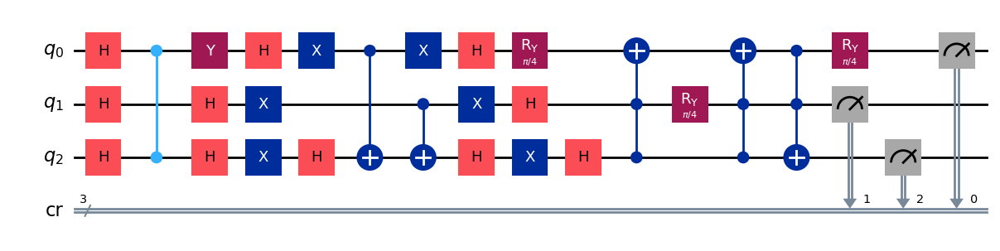

gen = 0 , Best fitness = (0.7145,)
gen = 1 , Best fitness = (0.7124,) , Number of invalids = 4

[Run 5 | Gen 41/99] Best Fitness: 0.7124 | Fidelity: 0.9013 | Gates: 31


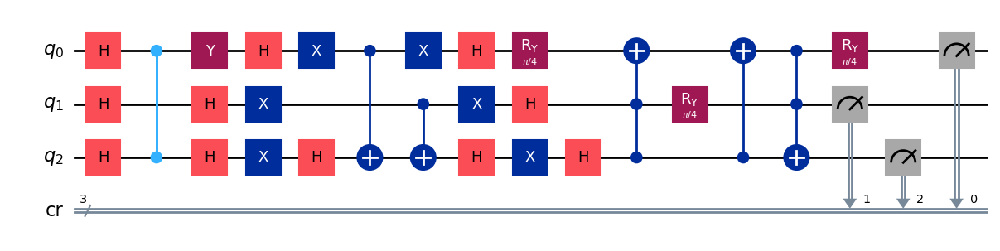

gen = 0 , Best fitness = (0.7124,)
gen = 1 , Best fitness = (0.7124,) , Number of invalids = 2

[Run 5 | Gen 42/99] Best Fitness: 0.7124 | Fidelity: 0.9047 | Gates: 31


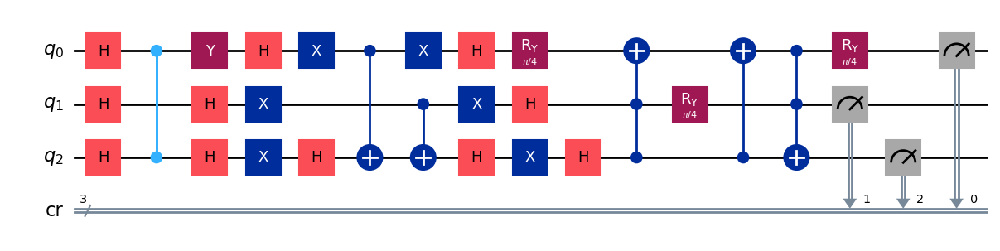

gen = 0 , Best fitness = (0.7124,)
gen = 1 , Best fitness = (0.7097,) , Number of invalids = 2

[Run 5 | Gen 43/99] Best Fitness: 0.7097 | Fidelity: 0.9058 | Gates: 31


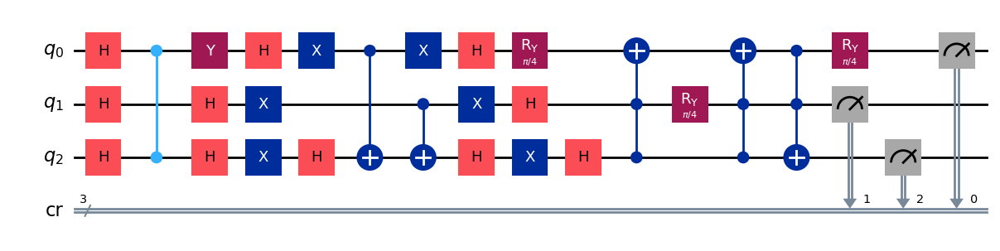

gen = 0 , Best fitness = (0.7097,)
gen = 1 , Best fitness = (0.7097,) , Number of invalids = 1

[Run 5 | Gen 44/99] Best Fitness: 0.7097 | Fidelity: 0.9085 | Gates: 31


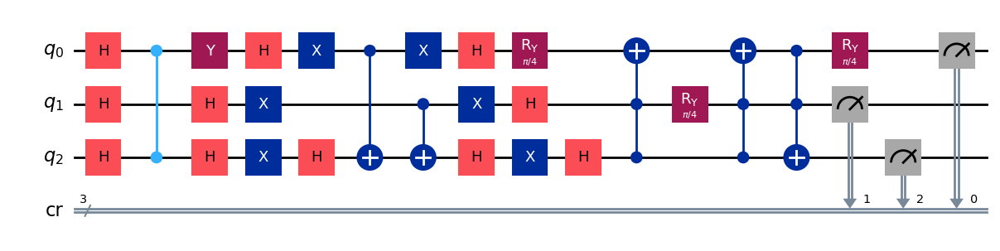

gen = 0 , Best fitness = (0.7097,)
gen = 1 , Best fitness = (0.7097,) , Number of invalids = 0

[Run 5 | Gen 45/99] Best Fitness: 0.7097 | Fidelity: 0.9054 | Gates: 31


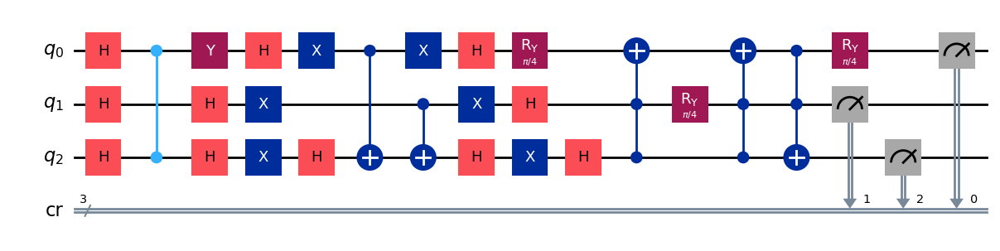

gen = 0 , Best fitness = (0.7097,)
gen = 1 , Best fitness = (0.7097,) , Number of invalids = 0

[Run 5 | Gen 46/99] Best Fitness: 0.7097 | Fidelity: 0.9068 | Gates: 31


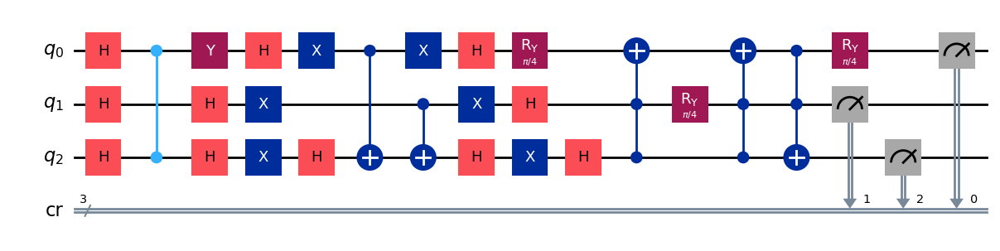

gen = 0 , Best fitness = (0.7097,)
gen = 1 , Best fitness = (0.7097,) , Number of invalids = 0

[Run 5 | Gen 47/99] Best Fitness: 0.7097 | Fidelity: 0.9056 | Gates: 31


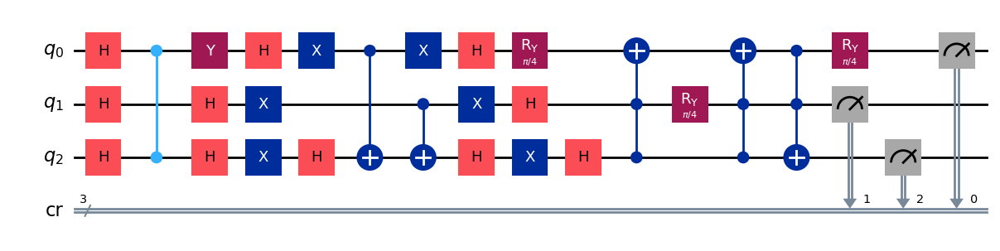

gen = 0 , Best fitness = (0.7097,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 48/99] Best Fitness: 0.7048 | Fidelity: 0.9082 | Gates: 31


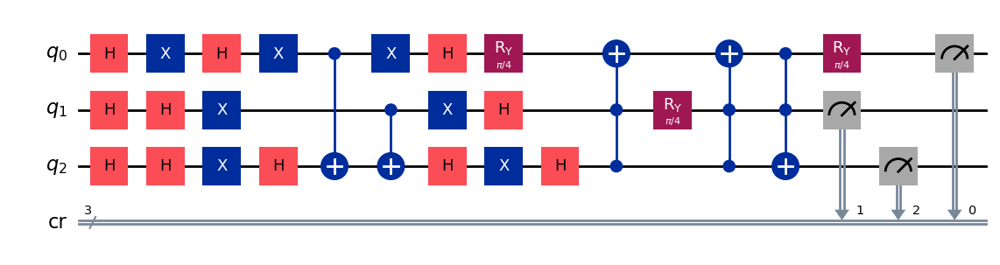

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 49/99] Best Fitness: 0.7048 | Fidelity: 0.9076 | Gates: 31


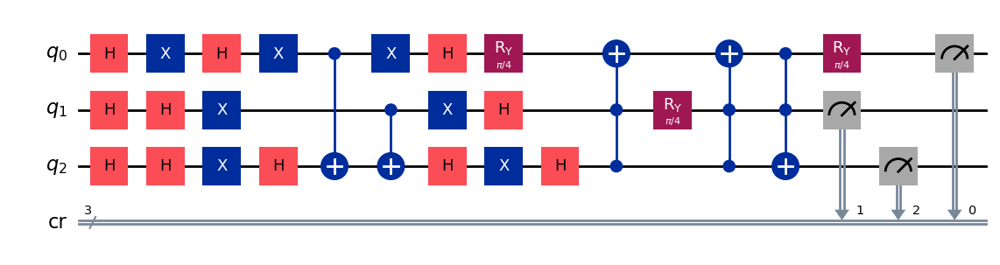

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 50/99] Best Fitness: 0.7048 | Fidelity: 0.9075 | Gates: 31


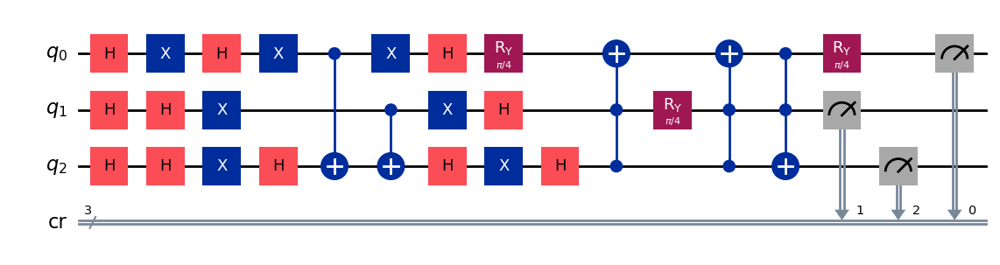

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 51/99] Best Fitness: 0.7048 | Fidelity: 0.9100 | Gates: 31


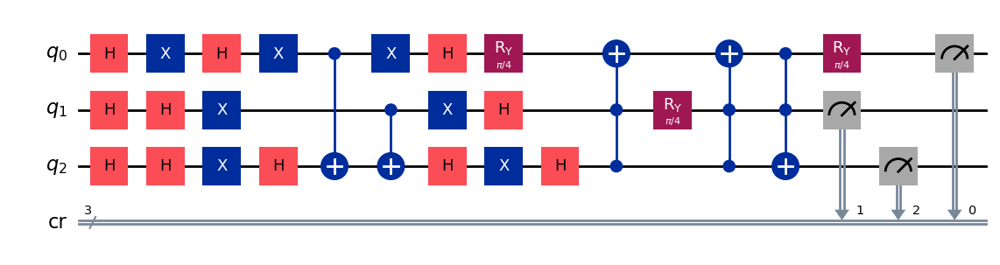

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 52/99] Best Fitness: 0.7048 | Fidelity: 0.9041 | Gates: 31


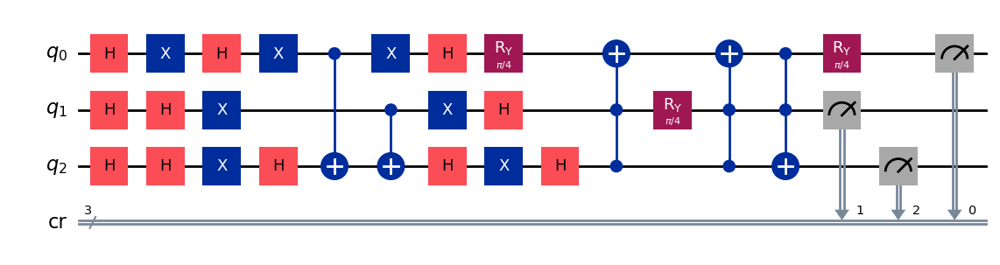

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 53/99] Best Fitness: 0.7048 | Fidelity: 0.9056 | Gates: 31


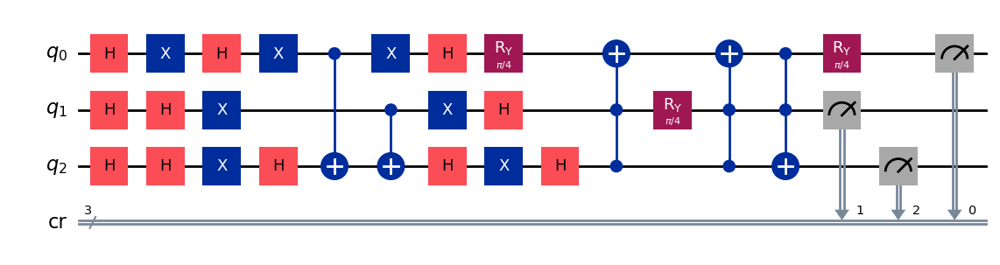

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 54/99] Best Fitness: 0.7048 | Fidelity: 0.9111 | Gates: 31


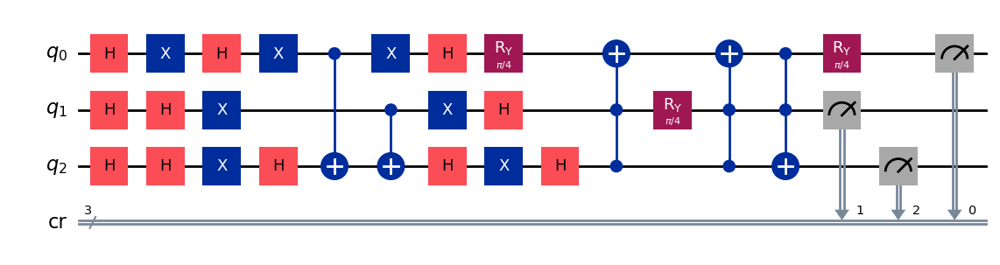

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 55/99] Best Fitness: 0.7048 | Fidelity: 0.9084 | Gates: 31


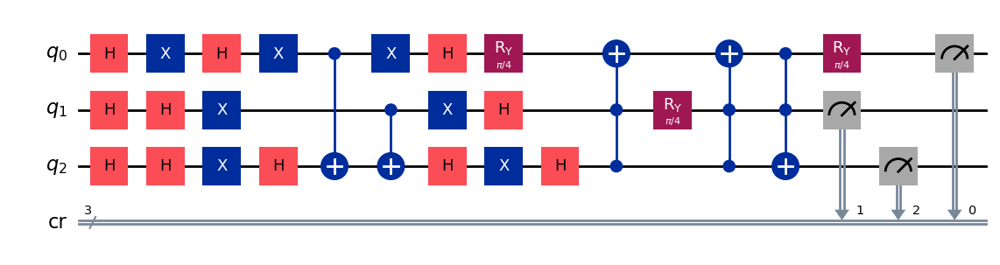

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 56/99] Best Fitness: 0.7048 | Fidelity: 0.9113 | Gates: 31


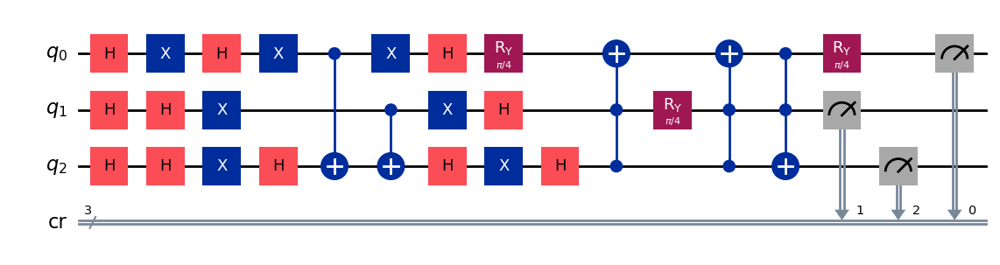

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.7048,) , Number of invalids = 0

[Run 5 | Gen 57/99] Best Fitness: 0.7048 | Fidelity: 0.9065 | Gates: 31


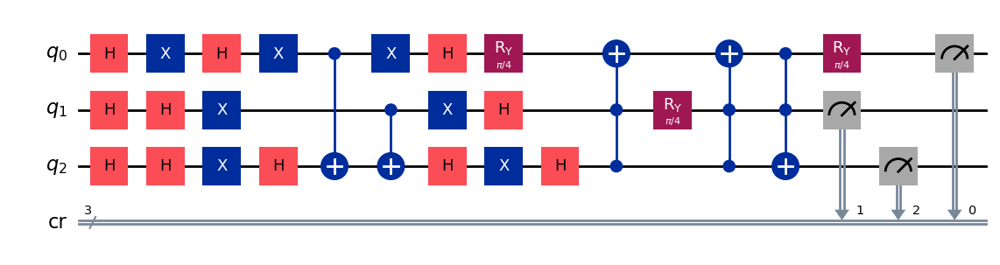

gen = 0 , Best fitness = (0.7048,)
gen = 1 , Best fitness = (0.6954,) , Number of invalids = 0

[Run 5 | Gen 58/99] Best Fitness: 0.6954 | Fidelity: 0.9046 | Gates: 30


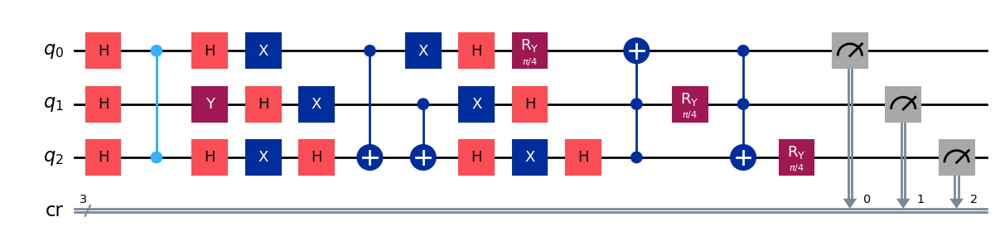

gen = 0 , Best fitness = (0.6954,)
gen = 1 , Best fitness = (0.6954,) , Number of invalids = 0

[Run 5 | Gen 59/99] Best Fitness: 0.6954 | Fidelity: 0.9029 | Gates: 30


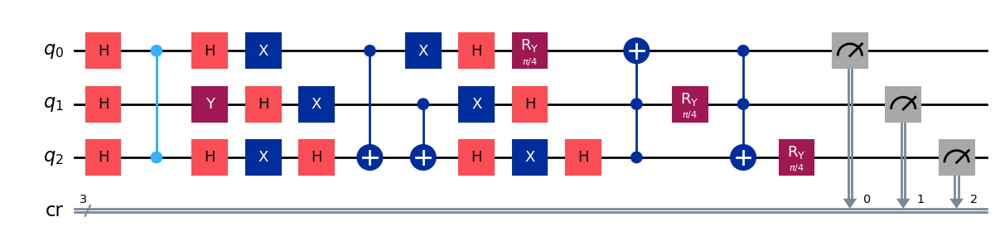

gen = 0 , Best fitness = (0.6954,)
gen = 1 , Best fitness = (0.6954,) , Number of invalids = 0

[Run 5 | Gen 60/99] Best Fitness: 0.6954 | Fidelity: 0.9027 | Gates: 30


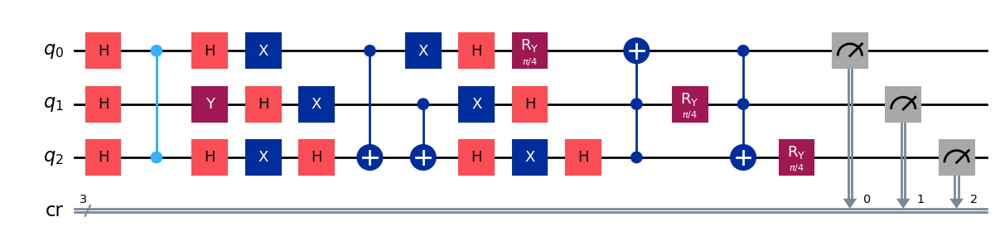

gen = 0 , Best fitness = (0.6954,)
gen = 1 , Best fitness = (0.6954,) , Number of invalids = 0

[Run 5 | Gen 61/99] Best Fitness: 0.6954 | Fidelity: 0.9060 | Gates: 30


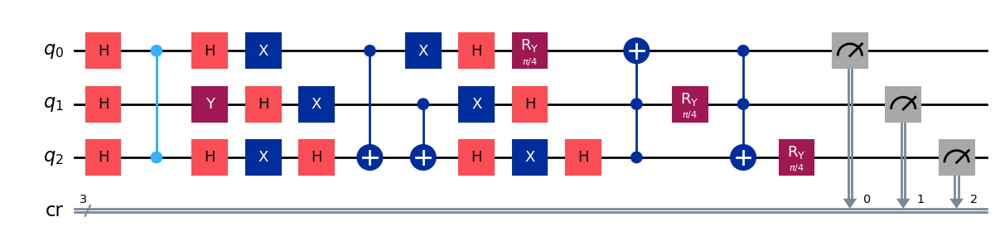

gen = 0 , Best fitness = (0.6954,)
gen = 1 , Best fitness = (0.6909,) , Number of invalids = 0

[Run 5 | Gen 62/99] Best Fitness: 0.6909 | Fidelity: 0.9044 | Gates: 30


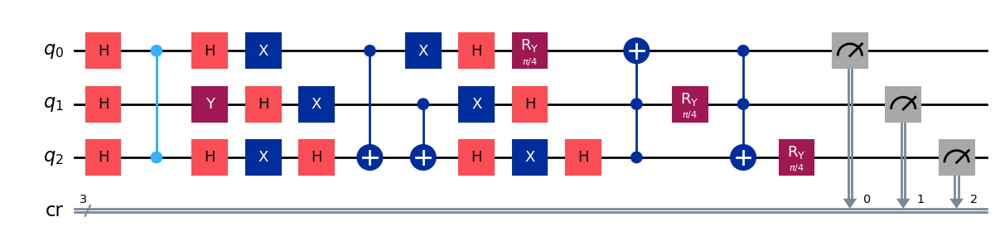

gen = 0 , Best fitness = (0.6909,)
gen = 1 , Best fitness = (0.6909,) , Number of invalids = 0

[Run 5 | Gen 63/99] Best Fitness: 0.6909 | Fidelity: 0.9082 | Gates: 30


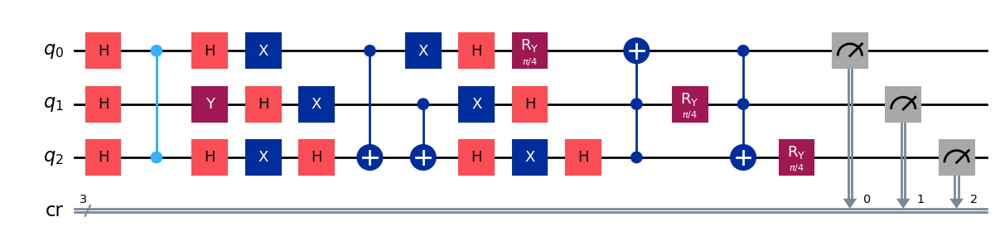

gen = 0 , Best fitness = (0.6909,)
gen = 1 , Best fitness = (0.6909,) , Number of invalids = 0

[Run 5 | Gen 64/99] Best Fitness: 0.6909 | Fidelity: 0.9015 | Gates: 30


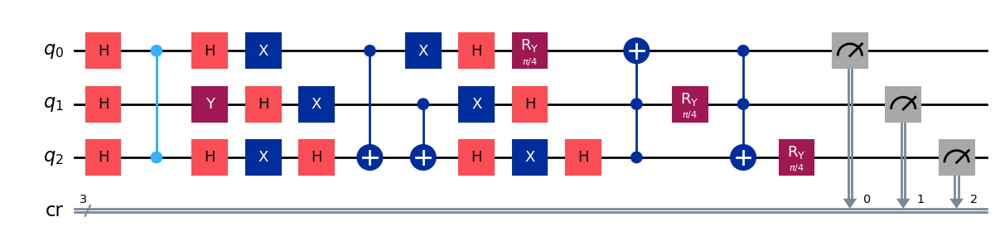

gen = 0 , Best fitness = (0.6909,)
gen = 1 , Best fitness = (0.6909,) , Number of invalids = 0

[Run 5 | Gen 65/99] Best Fitness: 0.6909 | Fidelity: 0.9089 | Gates: 30


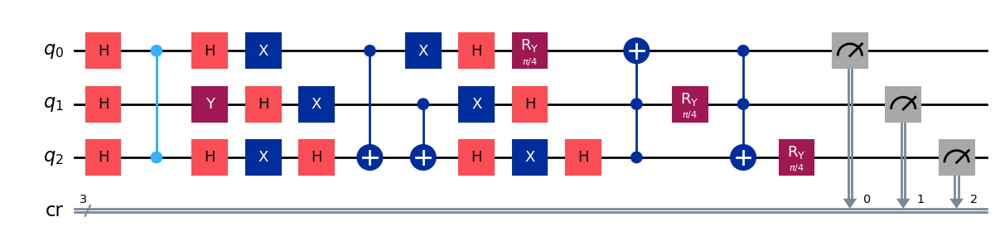

gen = 0 , Best fitness = (0.6909,)
gen = 1 , Best fitness = (0.6909,) , Number of invalids = 0

[Run 5 | Gen 66/99] Best Fitness: 0.6909 | Fidelity: 0.8985 | Gates: 30


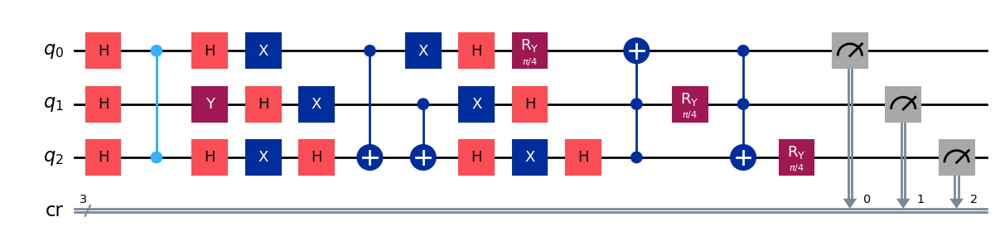

gen = 0 , Best fitness = (0.6909,)
gen = 1 , Best fitness = (0.6909,) , Number of invalids = 0

[Run 5 | Gen 67/99] Best Fitness: 0.6909 | Fidelity: 0.9044 | Gates: 30


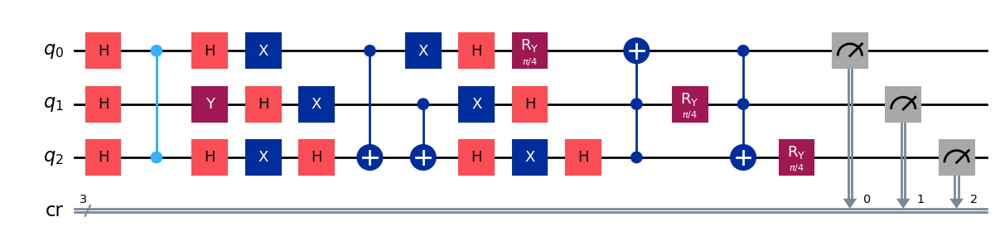

gen = 0 , Best fitness = (0.6909,)
gen = 1 , Best fitness = (0.6885,) , Number of invalids = 0

[Run 5 | Gen 68/99] Best Fitness: 0.6885 | Fidelity: 0.9046 | Gates: 30


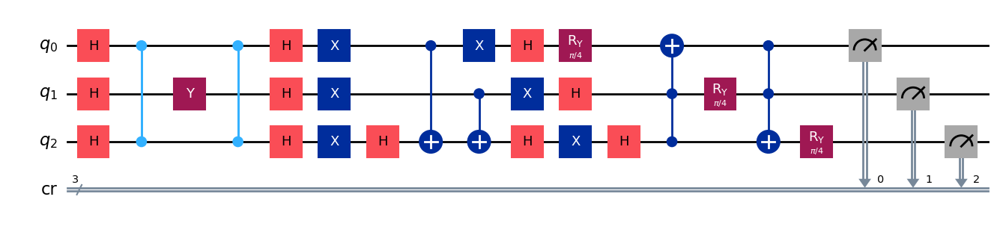

gen = 0 , Best fitness = (0.6885,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 69/99] Best Fitness: 0.6822 | Fidelity: 0.9108 | Gates: 30


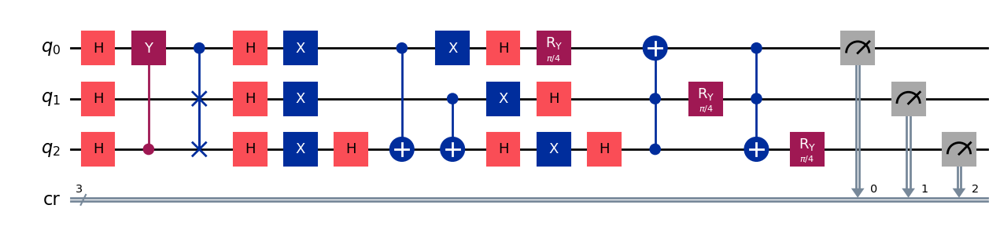

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 70/99] Best Fitness: 0.6822 | Fidelity: 0.9066 | Gates: 30


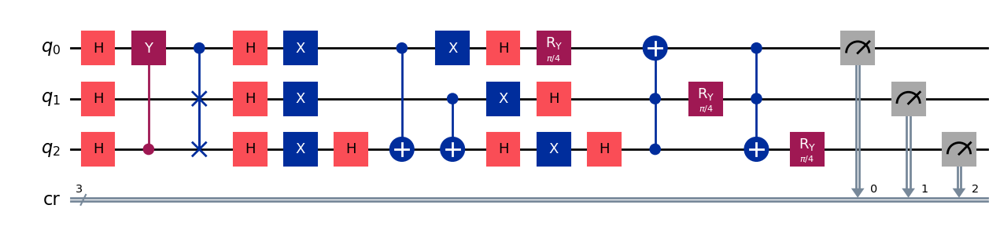

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 71/99] Best Fitness: 0.6822 | Fidelity: 0.9061 | Gates: 30


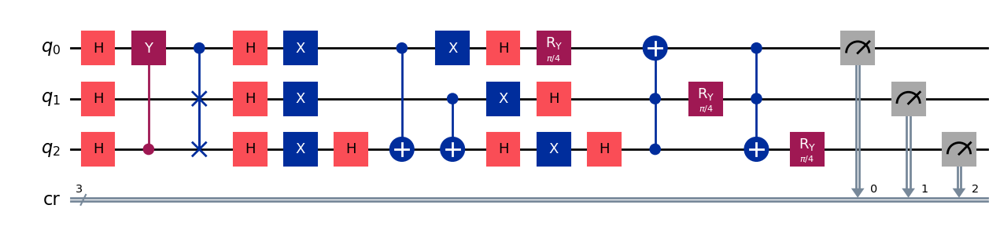

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 72/99] Best Fitness: 0.6822 | Fidelity: 0.9110 | Gates: 30


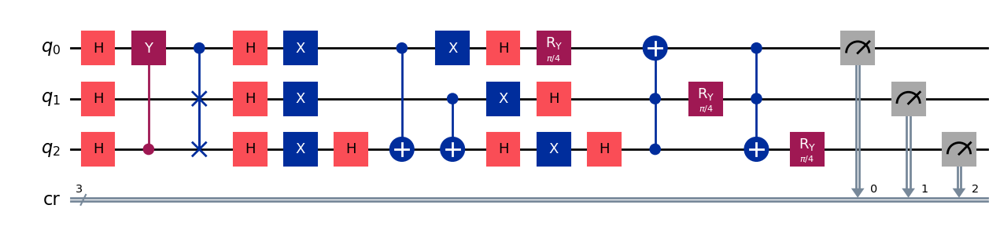

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 73/99] Best Fitness: 0.6822 | Fidelity: 0.9082 | Gates: 30


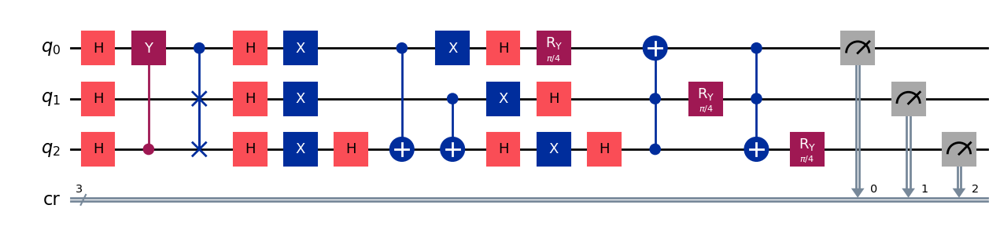

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 74/99] Best Fitness: 0.6822 | Fidelity: 0.9070 | Gates: 30


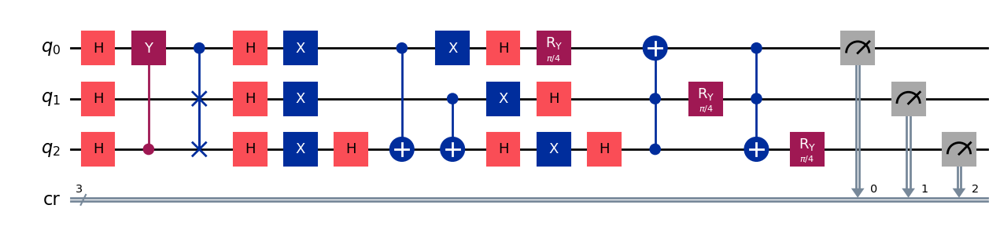

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 75/99] Best Fitness: 0.6822 | Fidelity: 0.9045 | Gates: 30


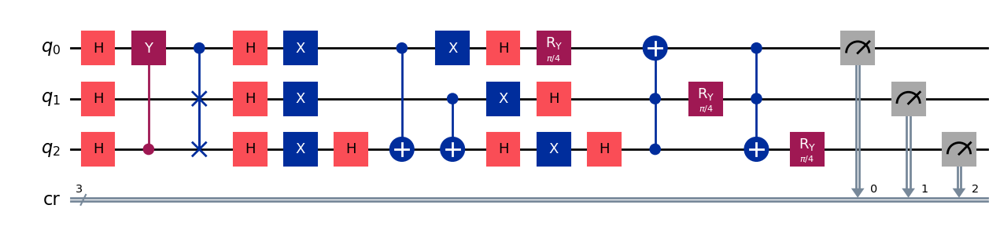

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 76/99] Best Fitness: 0.6822 | Fidelity: 0.8995 | Gates: 30


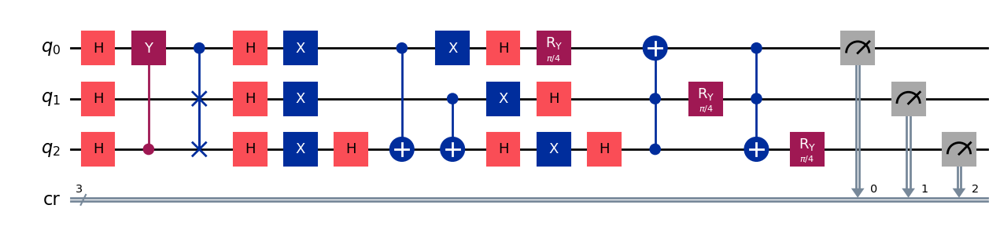

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 77/99] Best Fitness: 0.6822 | Fidelity: 0.9115 | Gates: 30


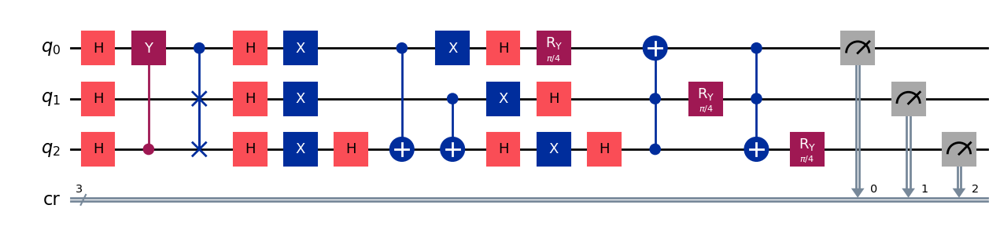

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 78/99] Best Fitness: 0.6822 | Fidelity: 0.9062 | Gates: 30


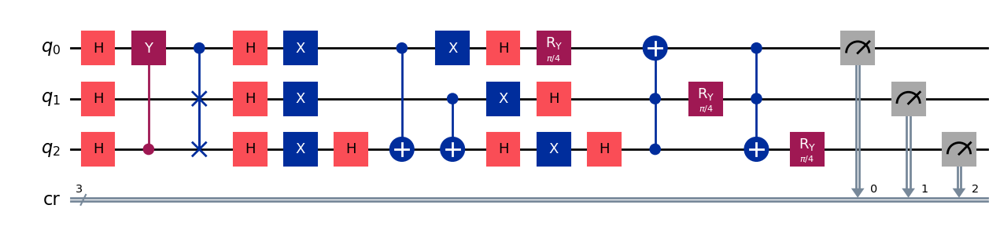

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 79/99] Best Fitness: 0.6822 | Fidelity: 0.9053 | Gates: 30


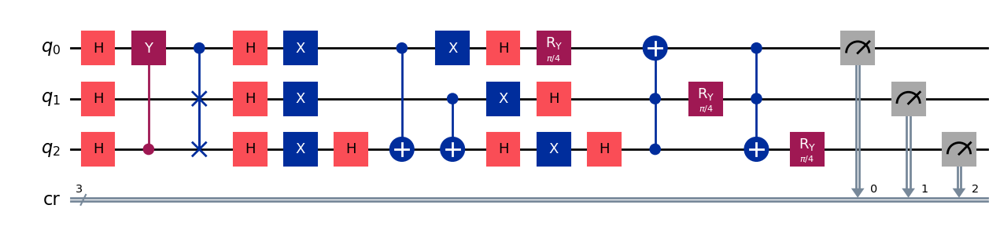

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 80/99] Best Fitness: 0.6822 | Fidelity: 0.9026 | Gates: 30


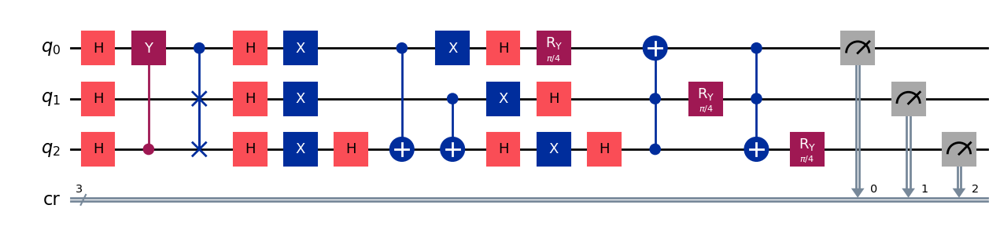

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 81/99] Best Fitness: 0.6822 | Fidelity: 0.9062 | Gates: 30


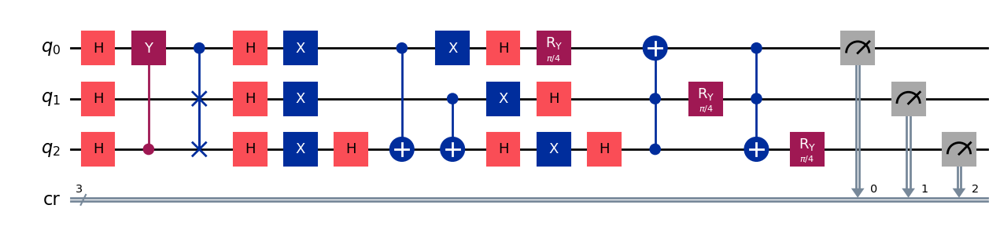

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 82/99] Best Fitness: 0.6822 | Fidelity: 0.9106 | Gates: 30


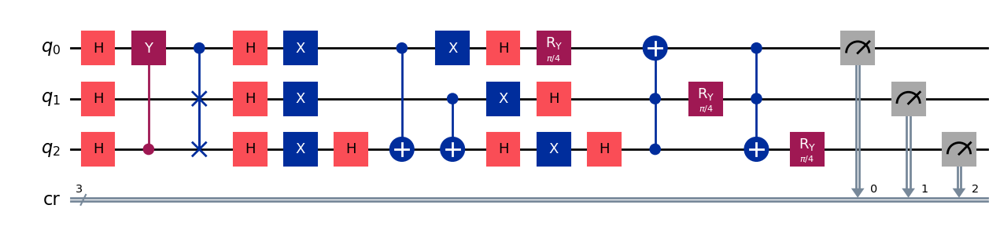

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 83/99] Best Fitness: 0.6822 | Fidelity: 0.9104 | Gates: 30


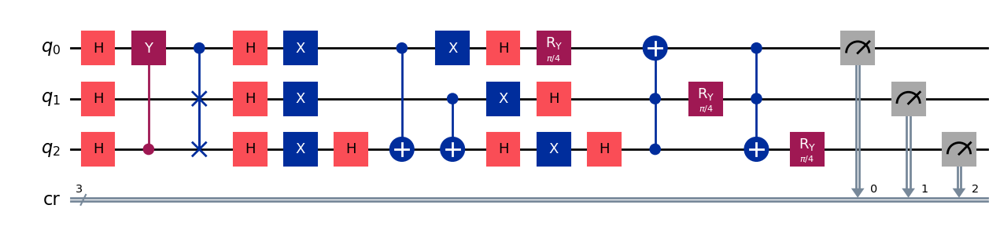

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 84/99] Best Fitness: 0.6822 | Fidelity: 0.9035 | Gates: 30


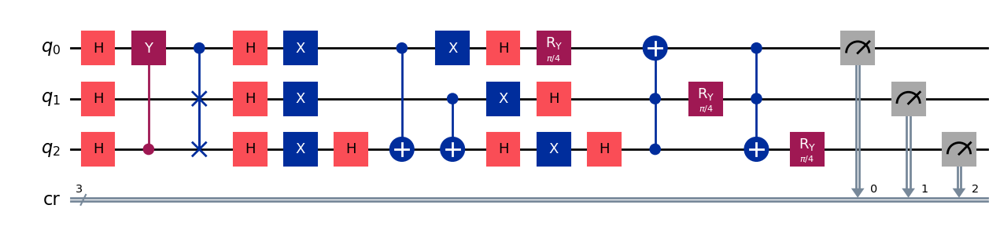

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 85/99] Best Fitness: 0.6822 | Fidelity: 0.9057 | Gates: 30


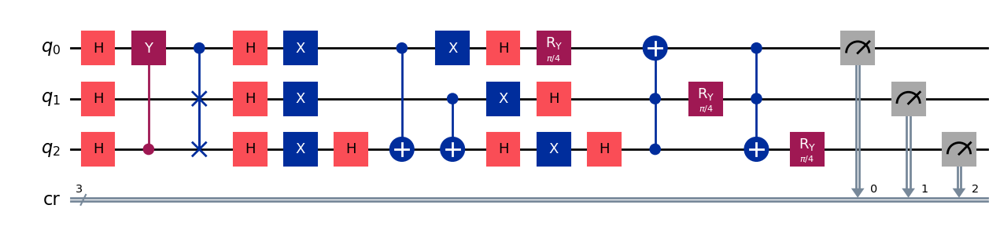

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 86/99] Best Fitness: 0.6822 | Fidelity: 0.9134 | Gates: 30


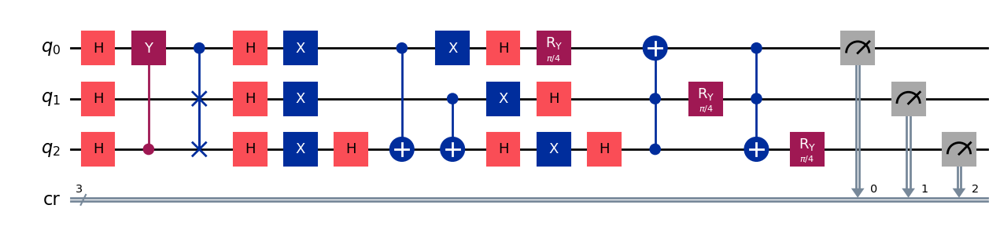

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 87/99] Best Fitness: 0.6822 | Fidelity: 0.9105 | Gates: 30


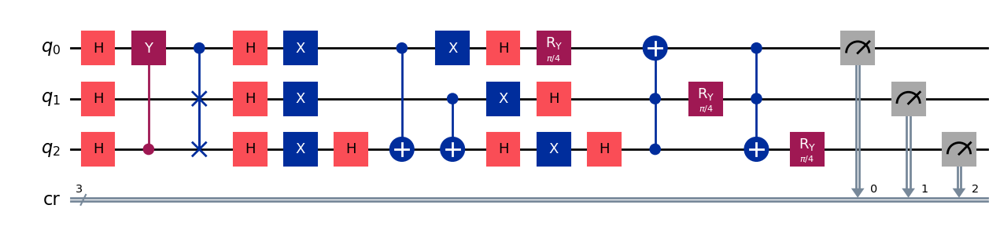

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 88/99] Best Fitness: 0.6822 | Fidelity: 0.9073 | Gates: 30


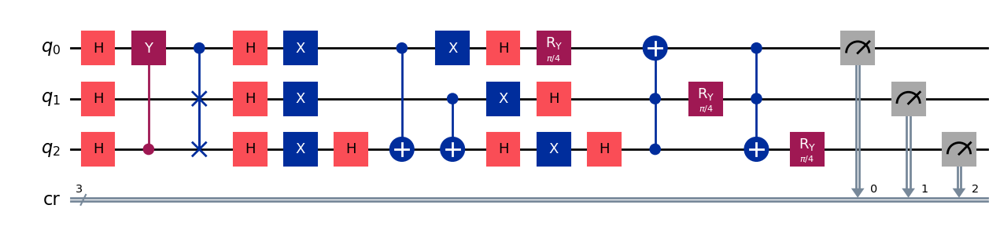

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 89/99] Best Fitness: 0.6822 | Fidelity: 0.9036 | Gates: 30


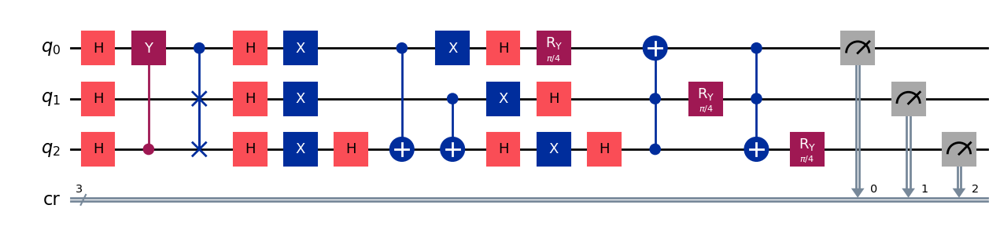

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 90/99] Best Fitness: 0.6822 | Fidelity: 0.9052 | Gates: 30


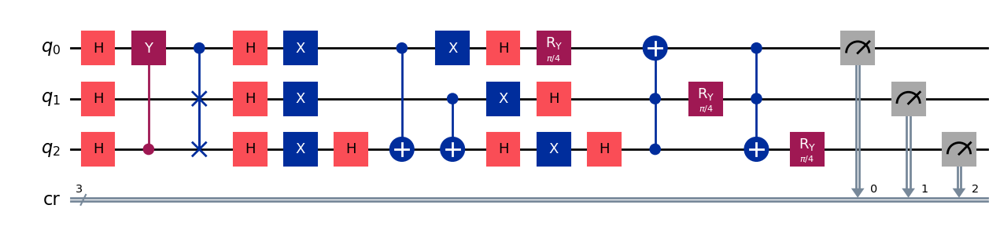

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 91/99] Best Fitness: 0.6822 | Fidelity: 0.9086 | Gates: 30


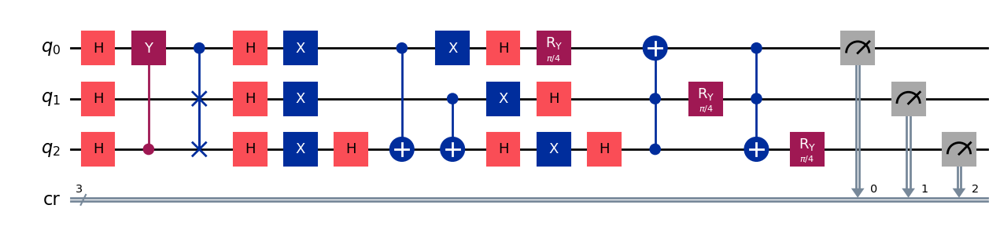

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 92/99] Best Fitness: 0.6822 | Fidelity: 0.9079 | Gates: 30


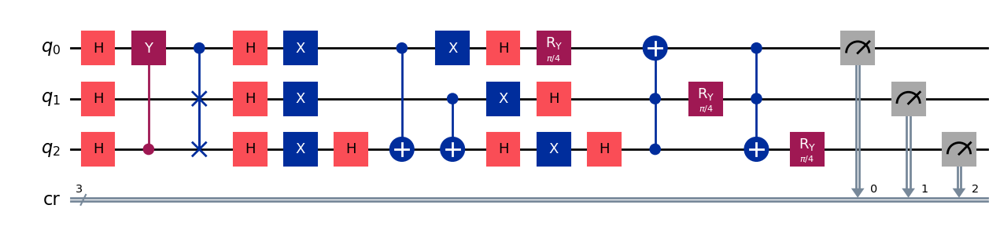

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 93/99] Best Fitness: 0.6822 | Fidelity: 0.9057 | Gates: 30


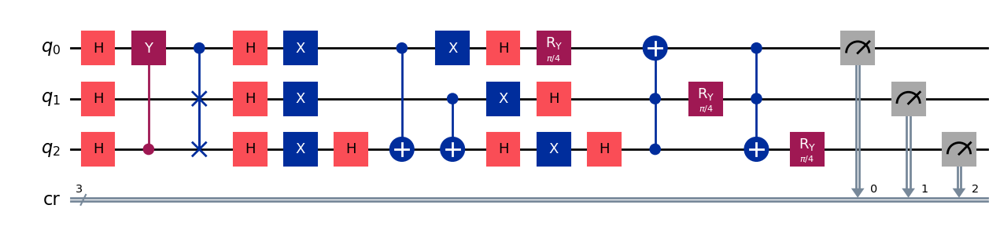

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 94/99] Best Fitness: 0.6822 | Fidelity: 0.9034 | Gates: 30


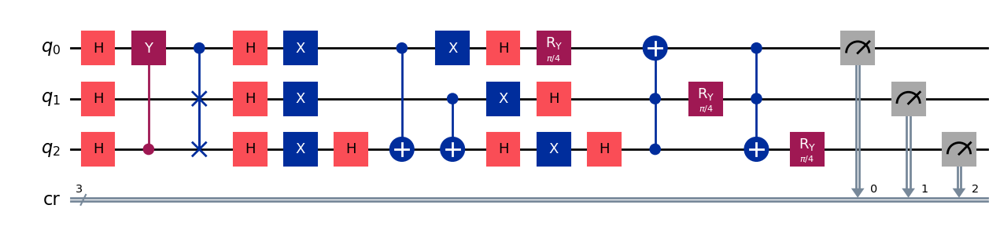

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 95/99] Best Fitness: 0.6822 | Fidelity: 0.9103 | Gates: 30


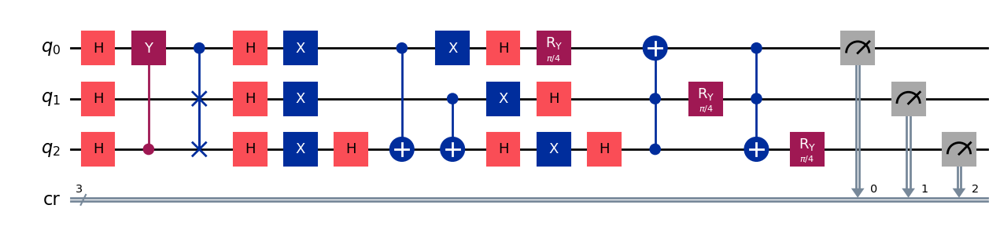

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 96/99] Best Fitness: 0.6822 | Fidelity: 0.9073 | Gates: 30


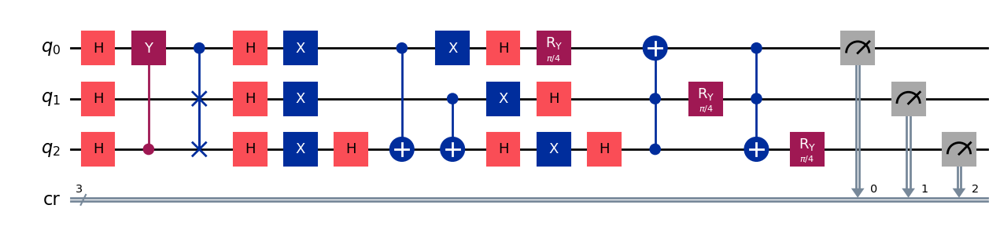

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 97/99] Best Fitness: 0.6822 | Fidelity: 0.9050 | Gates: 30


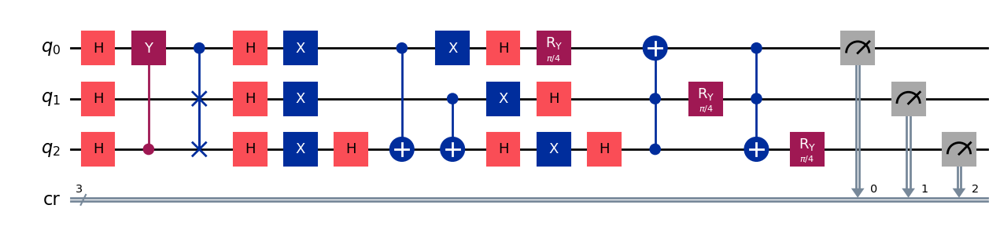

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 98/99] Best Fitness: 0.6822 | Fidelity: 0.9076 | Gates: 30


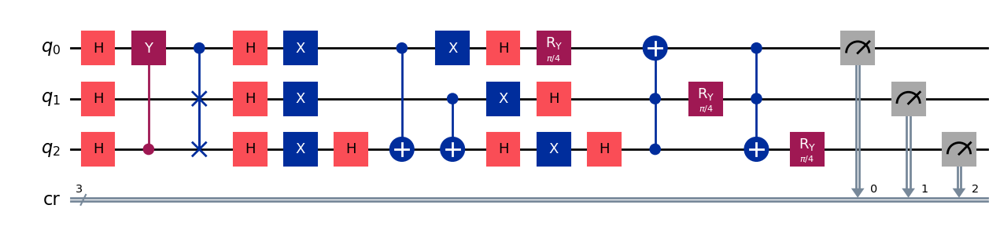

gen = 0 , Best fitness = (0.6822,)
gen = 1 , Best fitness = (0.6822,) , Number of invalids = 0

[Run 5 | Gen 99/99] Best Fitness: 0.6822 | Fidelity: 0.9102 | Gates: 30


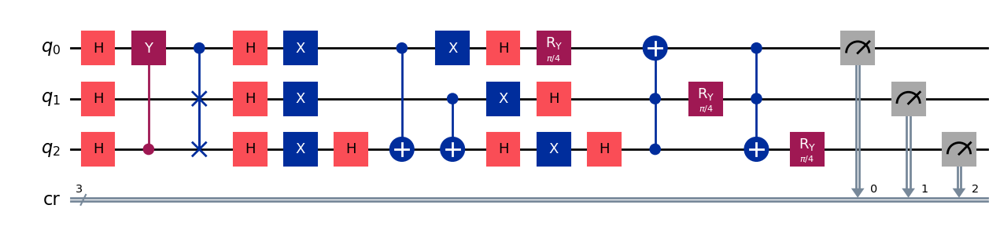


Generating evolution plots for Run 5...
✓ Plot saved to: experiments_state_111/run_5_seed_98144/evolution_metrics_run_5.png


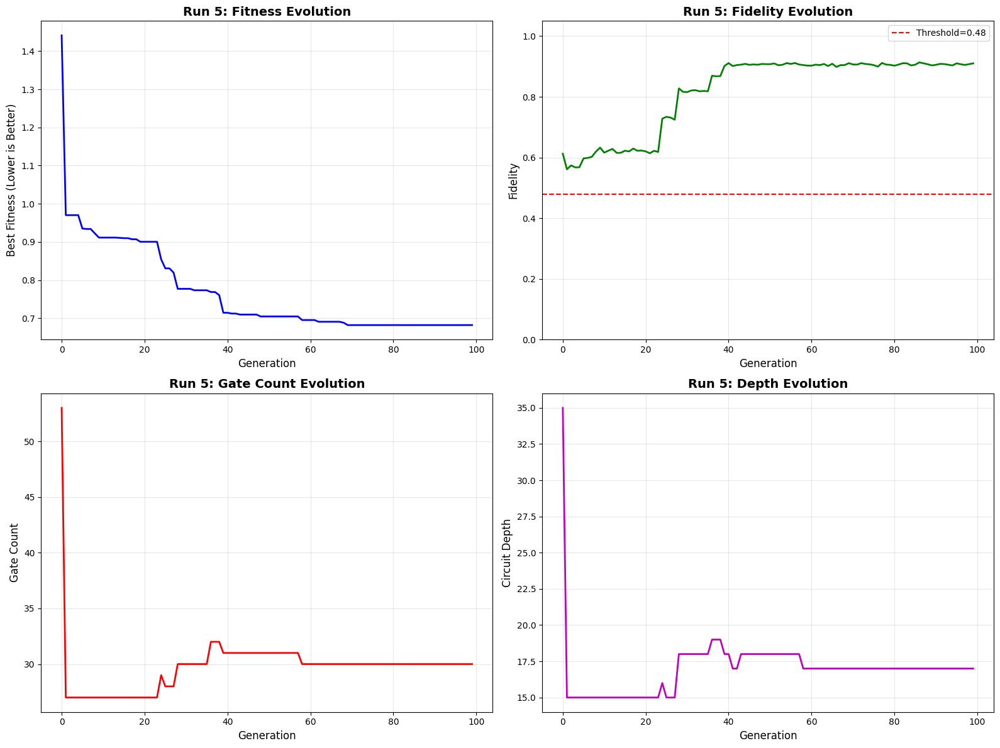


✓ Run 5 COMPLETE | Fidelity: 0.9058 | Gates: 30 | Depth: 17



In [14]:
NUMBER_OF_RUNS = 5
TARGET_STATE_FOR_EXPERIMENT = "111"

# Generate 5 random 5-digit seeds
seeds = [random.randint(10000, 99999) for _ in range(NUMBER_OF_RUNS)]
print(f"Generated seeds: {seeds}")

# Save seeds to file for reproducibility
seed_log = {
    "target_state": TARGET_STATE_FOR_EXPERIMENT,
    "seeds": seeds,
    "timestamp": pd.Timestamp.now().isoformat()
}
with open('experiment_seeds.json', 'w') as f:
    json.dump(seed_log, f, indent=2)
print(f"✓ Seeds saved to experiment_seeds.json")

all_run_results = []

print(f"\nStarting {NUMBER_OF_RUNS} independent runs for state |{TARGET_STATE_FOR_EXPERIMENT}>...")

for i, seed in enumerate(seeds):
    result = run_evolution_experiment(i+1, seed, TARGET_STATE_FOR_EXPERIMENT)
    all_run_results.append(result)

### Statistical Analysis (Mean ± SD)

In [15]:
fidelities = [r['fidelity'] for r in all_run_results]
depths = [r['depth'] for r in all_run_results]
gates = [r['gate_count'] for r in all_run_results]

mean_fid = statistics.mean(fidelities)
std_fid = statistics.stdev(fidelities)

mean_depth = statistics.mean(depths)
std_depth = statistics.stdev(depths)

mean_gates = statistics.mean(gates)
std_gates = statistics.stdev(gates)

print("\n" + "="*50)
print(f"AGGREGATE STATISTICS FOR STATE |{TARGET_STATE_FOR_EXPERIMENT}> ({NUMBER_OF_RUNS} Runs)")
print("="*50)
print(f"Fidelity:   {mean_fid*100:.2f}% ± {std_fid*100:.2f}%")
print(f"Depth:      {mean_depth:.2f} ± {std_depth:.2f}")
print(f"Gate Count: {mean_gates:.2f} ± {std_gates:.2f}")
print("="*50)

print("\nLaTeX Copy-Paste String:")
print(f"{mean_fid*100:.1f} \\pm {std_fid*100:.1f} & {mean_depth:.1f} \\pm {std_depth:.1f} & {mean_gates:.1f} \\pm {std_gates:.1f}")

# Print individual run details
print("\n" + "="*50)
print("INDIVIDUAL RUN DETAILS")
print("="*50)
for r in all_run_results:
    print(f"Run {r['run_id']} (Seed: {r['seed']}): Fidelity={r['fidelity']:.4f}, Gates={r['gate_count']}, Depth={r['depth']}, Log Dir={r['log_dir']}")



AGGREGATE STATISTICS FOR STATE |111> (5 Runs)
Fidelity:   93.56% ± 4.15%
Depth:      17.20 ± 1.30
Gate Count: 31.00 ± 1.41

LaTeX Copy-Paste String:
93.6 \pm 4.1 & 17.2 \pm 1.3 & 31.0 \pm 1.4

INDIVIDUAL RUN DETAILS
Run 1 (Seed: 90759): Fidelity=1.0000, Gates=33, Depth=19, Log Dir=experiments_state_111/run_1_seed_90759
Run 2 (Seed: 74678): Fidelity=0.9048, Gates=30, Depth=16, Log Dir=experiments_state_111/run_2_seed_74678
Run 3 (Seed: 75264): Fidelity=0.9126, Gates=30, Depth=16, Log Dir=experiments_state_111/run_3_seed_75264
Run 4 (Seed: 57697): Fidelity=0.9547, Gates=32, Depth=18, Log Dir=experiments_state_111/run_4_seed_57697
Run 5 (Seed: 98144): Fidelity=0.9058, Gates=30, Depth=17, Log Dir=experiments_state_111/run_5_seed_98144


#### Aggregate Evolution Plots Across All Runs



GENERATING AGGREGATE PLOTS
✓ Aggregate plot saved to: experiments_state_111/aggregate_evolution_all_runs.png


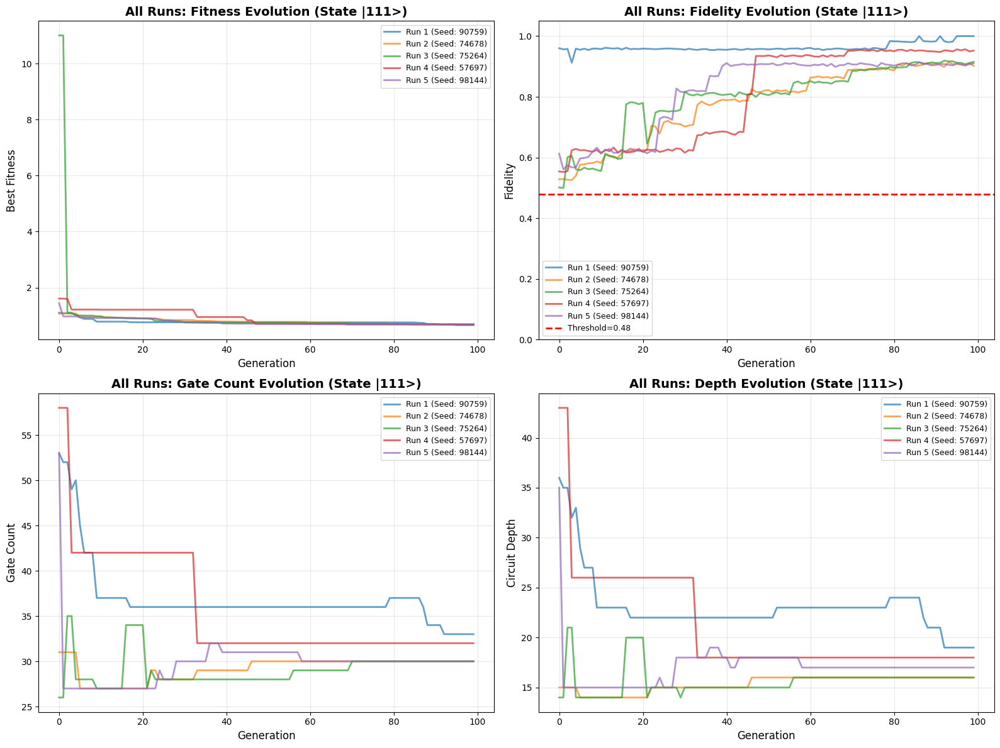

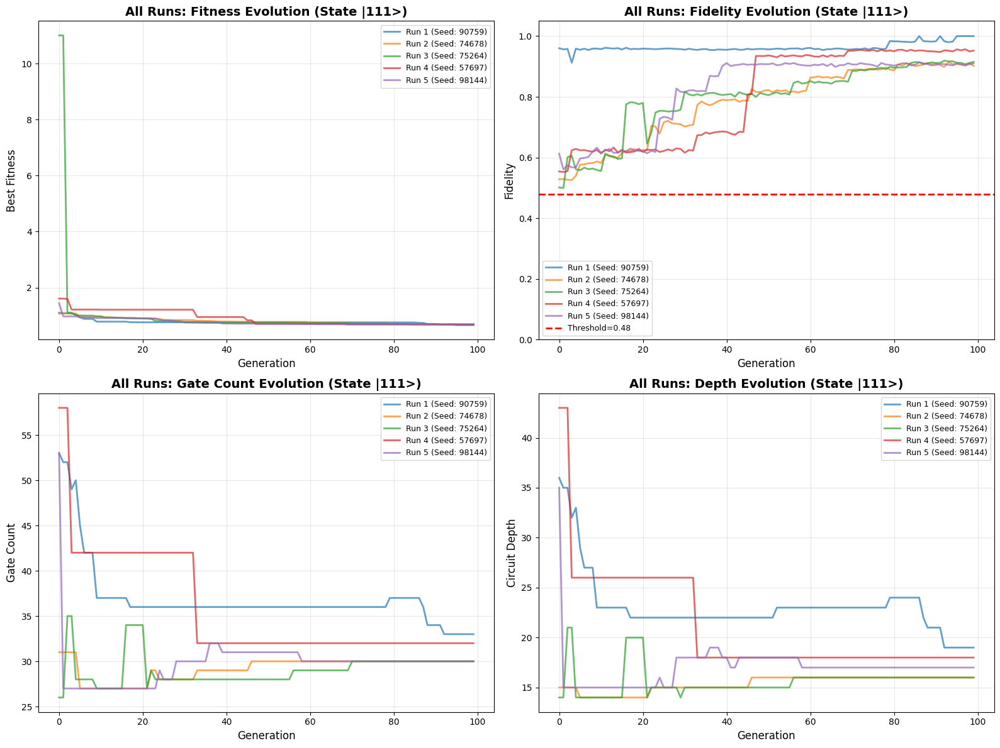

In [16]:
print("\n" + "="*50)
print("GENERATING AGGREGATE PLOTS")
print("="*50)

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd']

for idx, r in enumerate(all_run_results):
    color = colors[idx % len(colors)]
    label = f"Run {r['run_id']} (Seed: {r['seed']})"
    
    # Fitness
    axes[0, 0].plot(r['generations'], r['fitness_history'], 
                    linewidth=2, alpha=0.7, color=color, label=label)
    
    # Fidelity
    axes[0, 1].plot(r['generations'], r['fidelity_history'], 
                    linewidth=2, alpha=0.7, color=color, label=label)
    
    # Gate count
    axes[1, 0].plot(r['generations'], r['gate_count_history'], 
                    linewidth=2, alpha=0.7, color=color, label=label)
    
    # Depth
    axes[1, 1].plot(r['generations'], r['depth_history'], 
                    linewidth=2, alpha=0.7, color=color, label=label)

# Configure subplots
axes[0, 0].set_xlabel('Generation', fontsize=12)
axes[0, 0].set_ylabel('Best Fitness', fontsize=12)
axes[0, 0].set_title(f'All Runs: Fitness Evolution (State |{TARGET_STATE_FOR_EXPERIMENT}>)', 
                     fontsize=14, fontweight='bold')
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].legend(fontsize=9)

axes[0, 1].set_xlabel('Generation', fontsize=12)
axes[0, 1].set_ylabel('Fidelity', fontsize=12)
axes[0, 1].set_title(f'All Runs: Fidelity Evolution (State |{TARGET_STATE_FOR_EXPERIMENT}>)', 
                     fontsize=14, fontweight='bold')
axes[0, 1].grid(True, alpha=0.3)
axes[0, 1].set_ylim([0, 1.05])
axes[0, 1].axhline(y=SUCCESS_THRESHOLD, color='r', linestyle='--', 
                   linewidth=2, label=f'Threshold={SUCCESS_THRESHOLD}')
axes[0, 1].legend(fontsize=9)

axes[1, 0].set_xlabel('Generation', fontsize=12)
axes[1, 0].set_ylabel('Gate Count', fontsize=12)
axes[1, 0].set_title(f'All Runs: Gate Count Evolution (State |{TARGET_STATE_FOR_EXPERIMENT}>)', 
                     fontsize=14, fontweight='bold')
axes[1, 0].grid(True, alpha=0.3)
axes[1, 0].legend(fontsize=9)

axes[1, 1].set_xlabel('Generation', fontsize=12)
axes[1, 1].set_ylabel('Circuit Depth', fontsize=12)
axes[1, 1].set_title(f'All Runs: Depth Evolution (State |{TARGET_STATE_FOR_EXPERIMENT}>)', 
                     fontsize=14, fontweight='bold')
axes[1, 1].grid(True, alpha=0.3)
axes[1, 1].legend(fontsize=9)

plt.tight_layout()

state_dir = f"experiments_state_{TARGET_STATE_FOR_EXPERIMENT}"
aggregate_plot_path = os.path.join(state_dir, f'aggregate_evolution_all_runs.png')
plt.savefig(aggregate_plot_path, dpi=150, bbox_inches='tight')

print(f"✓ Aggregate plot saved to: {aggregate_plot_path}")
display(fig)

### Select Best Circuit for IBM Hardware


Selecting Best Circuit from Run #1 (Seed: 90759)
Simulated Fidelity: 1.0000
Log directory: experiments_state_111/run_1_seed_90759
[QPU] Running on: ibm_torino

[HOF Individual 1] Fitness: 0.66
Evolved transpiled count_ops: OrderedDict([('rz', 15), ('sx', 10), ('x', 7), ('cz', 7), ('measure', 3)])
Evolved transpiled depth:    24
Total ops:        42
Qubits / Clbits:  133 / 3


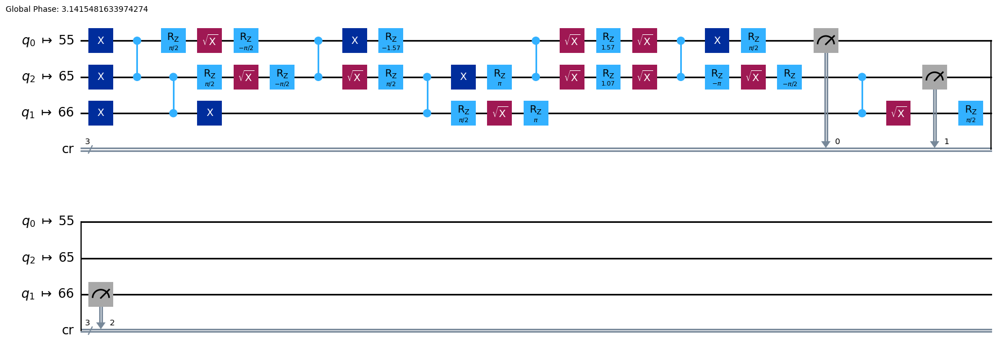

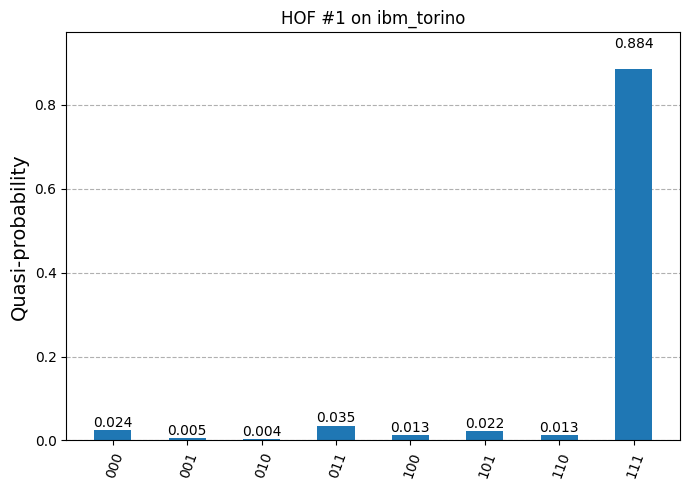

In [21]:
best_run = min(all_run_results, key=lambda x: x['raw_fitness'])

print(f"\nSelecting Best Circuit from Run #{best_run['run_id']} (Seed: {best_run['seed']})")
print(f"Simulated Fidelity: {best_run['fidelity']:.4f}")
print(f"Log directory: {best_run['log_dir']}")

evaluator = CircuitEvaluator(shots=NUM_SHOTS, log_dir=best_run['log_dir'])
dummy_hof = tools.HallOfFame(1)
dummy_hof.update([best_run['individual']])

run_hof_on_ibm(evaluator, dummy_hof, target_state=TARGET_STATE_FOR_EXPERIMENT)